In [65]:
#%matplotlib widget
import gc
gc.collect()
import ipywidgets as widgets
import os as os
from mpl_toolkits.mplot3d import Axes3D
import rasterio
import matplotlib.pyplot as plt
from rasterio.transform import xy
import numpy as np
from pyproj import Geod
from scipy.interpolate import griddata
import json
import pandas as pd
from glob import glob
import re
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
from pyproj import Geod
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import datetime
from datetime import timedelta
import gtsam

LatOrigin = 42.358456
LongOrigin = -71.087589

In [66]:
# Thruster model

import numpy as np

# Current Estimator Parameters
alpha = 0.1018  # Nonlinear current coefficient 
beta = 0.0      # Back-EMF coefficient
psi = 0.0650    # Damping coefficient

# RPM/Thrust Parameters
gamma_rpm = 0.0007  # Quadratic thrust coefficient
delta_rpm = 0.0124  # Velocity-dependent damping
Kv = 249.9         # Motor velocity constant (RPM/V)
Rm = 0.365         # Motor resistance (Ohms)
Ke = 60/(2*np.pi*Kv)  # Back-EMF constant (V/(rad/s))

def estimate_current(V_app, u):
    return (alpha * V_app**2) - psi * u * V_app

def estimate_omega(V_app, i_est):
    return (2*np.pi/60)*Kv*V_app - (Rm/Ke)*i_est

def estimate_thrust(omega, u):
    return gamma_rpm * omega**2 - delta_rpm * u * omega

def estimate_full_thrust(V_app, u):
    i_est = estimate_current(V_app, u)
    omega_est = estimate_omega(V_app, i_est)
    return estimate_thrust(omega_est, u)

In [67]:
# Configuration for different log directories and their missions
LOG_DIRECTORIES = {
    "cv7_logs": {
        "path": "~/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/",
        "missions": [
            "241107-1648G-MASS-STAR_nav",
            "241120-2104U-GRIM-RICE_nav",
            "241124-1016N-HUGE-LINE_nav",
            "241124-1716F-FOND-CATO_nav",
            "241126-0219R-PUNY-CAIN_cv7",
            "241126-0359L-OILY-SAUL_cv7",
            "241127-0342N-JIMS-ZEUS_cv7",
            "241127-0446C-SLIM-SHAG_cv7",
            "241127-0535I-SOUR-MYLO_cv7",
            "241127-0642L-PUNY-JUGS_cv7",
            "241127-0754F-GLIB-BALL_cv7"
        ],
        "exclude_missions": [
            "241107-1648G-MASS-STAR_nav",
            "241120-2104U-GRIM-RICE_nav",
            "241124-1016N-HUGE-LINE_nav",
            "241124-1716F-FOND-CATO_nav",
        ],
        "mission_anchor_maps": {
            "241126-0219R-PUNY-CAIN_cv7": {"2": "BEN", "6": "ABE", "9": "EVE"},
            "241126-0359L-OILY-SAUL_cv7": {"2": "BEN", "6": "ABE", "9": "EVE"},
            "241127-0342N-JIMS-ZEUS_cv7": {"2": "EVE", "6": "BEN", "9": "ABE"},
            "241127-0446C-SLIM-SHAG_cv7": {"2": "EVE", "6": "BEN", "9": "ABE"},
            "241127-0535I-SOUR-MYLO_cv7": {"2": "EVE", "6": "BEN", "9": "ABE"},
            "241127-0642L-PUNY-JUGS_cv7": {"2": "EVE", "6": "BEN", "9": "ABE"},
            "241127-0754F-GLIB-BALL_cv7": {"2": "EVE", "6": "BEN", "9": "ABE"}
        },
        "missing_pos_acks": {
            "241126-0219R-PUNY-CAIN_cv7": ["2"],
            "241126-0359L-OILY-SAUL_cv7": ["2"],
            "241127-0342N-JIMS-ZEUS_cv7": ["2"],
            "241127-0446C-SLIM-SHAG_cv7": ["2"],
            "241127-0535I-SOUR-MYLO_cv7": ["2"],
            "241127-0642L-PUNY-JUGS_cv7": ["2", "6"],
            "241127-0754F-GLIB-BALL_cv7": ["2"]
        },
        "time_filters": {}  # Add any time filters here
    },
    "other_logs": {  # Example of adding another log directory
        "path": "~/path/to/other/logs/",
        "missions": [
            # Add mission names here
        ],
        "exclude_missions": [],
        "mission_anchor_maps": {},
        "missing_pos_acks": {},
        "time_filters": {}
    }
}

# Process all missions from all log directories
operating_directories = {}
for log_type, config in LOG_DIRECTORIES.items():
    base_directory = os.path.expanduser(config["path"])
    
    for mission in config["missions"]:
        if mission not in config["exclude_missions"]:
            mission_dir = os.path.join(base_directory, mission)
            data_json = glob(os.path.join(mission_dir, "all_data", "*.json"))
            if data_json:
                # Store with log_type prefix to avoid name collisions
                mission_key = f"{log_type}_{mission}"
                operating_directories[mission_key] = {
                    "json_path": data_json[0],
                    "anchor_map": config["mission_anchor_maps"].get(mission, {}),
                    "missing_pos_acks": config["missing_pos_acks"].get(mission, []),
                    "time_filter": config["time_filters"].get(mission, ())
                }

# You can now access mission data like this:
# operating_directories["cv7_logs_241127-0535I-SOUR-MYLO_cv7"]["json_path"]
# operating_directories["cv7_logs_241127-0535I-SOUR-MYLO_cv7"]["anchor_map"]

In [68]:
import gc

skip_in_moos = {
    "LOGGER_DIRECTORY", "DB_EVENT", "APPCAST", "APPCAST_REQ", "PHI_HOST_IP", "REALMCAST_CHANNELS", "DB_TIME",
    "DB_UPTIME", "DB_CLIENTS", "DB_QOS", "PMARINEVIEWER_PID", "HELM_MAP_CLEAR", "PMV_CONNECT",
    "PROC_WATCH_TIME_WARP", "PROC_WATCH_EVENT", "PROC_WATCH_SUMMARY", "PROC_WATCH_ALL_OK", "UPROCESSWATCH_ITER_LEN",
    "PHI_HOST_IP_ALL", "PHI_HOST_IP_VERBOSE", "PHI_HOST_PORT_DB", "PHI_HOST_INFO", "PHOSTINFO_ITER_LEN",
    "UFSB_QBRIDGE_VARS", "UFSB_NODE_COUNT", "UFLDSHOREBROKER_ITER_LEN", "PREALM_ITER_LEN", "APPCAST_REQ_SHORESIDE",
    "UFLDDELVE_ITER_LEN", "PMARINEVIEWER_ITER_GAP", "PMARINEVIEWER_ITER_LEN", "REGION_INFO", "APPCAST_REQ_ALL",
    "COLLISION_DETECT_PARAMS", "ENCOUNTER_TOTAL", "NEAR_MISS_TOTAL", "COLLISION_TOTAL", "APP_LOG", "UFLDCOLLISIONDETECT_ITER_LEN",
    "UXMS_937_ITER_GAP", "UXMS_937_ITER_LEN", "UFLDNODECOMMS_ITER_LEN", "PSHARE_INPUT_SUMMARY", "NODE_BROKER_PING",
    "PROC_WATCH_FULL_SUMMARY", "PSHARE_OUTPUT_SUMMARY", "PHOSTINFO_ITER_GAP", "UFLDSHOREBROKER_ITER_GAP", "UFLDDELVE_ITER_GAP",
    "UFLDNODECOMMS_ITER_GAP", "PREALM_ITER_GAP", "UPROCESSWATCH_ITER_GAP", "UFLDCOLLISIONDETECT_ITER_GAP", "PSHARE_CMD",
    "UFSB_BRIDGE_VARS", "NODE_PSHARE_VARS", "NODE_BROKER_ACK_BEN", "NODE_BROKER_VACK",
    "COLLISION_DETECT_PARAMS_BEN", "APPCAST_REQ_BEN", "NODE_REPORT_UNC", "HEARTBEAT", "MOOS_MANUAL_OVERRIDE_ALL",
    "IVPHELM_REGISTER", "PLOGGER_STATUS", "PLOGGER_CMD", "DB_VARSUMMARY", "NA", "DB_RWSUMMARY", "PHELMIVP_PID",
    "UPROCESSWATCH_STATUS", "PSHARE_STATUS", "UQUERYDB_STATUS", "IVPHELM_DOMAIN", "IVPHELM_MODESET", "PHELMIVP_STATUS",
    "PHOSTINFO_STATUS", "PNODEREPORTER_PID", "PNODEREPORTER_STATUS", "UFLDNODEBROKER_PID", "UFLDNODEBROKER_STATUS",
    "UFLDMESSAGEHANDLER_STATUS", "UMH_SUMMARY_MSGS", "ULOADWATCH_STATUS", "ULOADWATCH_ITER_LEN", "PNODEREPORTER_ITER_GAP",
    "PNODEREPORTER_ITER_LEN", "UFLDMESSAGEHANDLER_ITER_GAP", "UFLDMESSAGEHANDLER_ITER_LEN", "UQUERYDB_ITER_GAP",
    "UQUERYDB_ITER_LEN", "UFLDNODEBROKER_ITER_GAP", "PROC_WATCH_EVENT", "PROC_WATCH_SUMMARY", "PROC_WATCH_ALL_OK",
    "PROC_WATCH_FULL_SUMMARY", "PHELMIVP_ITER_GAP", "IVPHELM_CPU", "IVPHELM_STATE", "UMEMWATCH_STATUS", "IVPHELM_LIFE_EVENT",
    "IVPHELM_SUMMARY", "MOOS_DEBUG", "IVPHELM_ALLSTOP", "PBAR30_STATUS",
    "PREALM_STATUS", "PSSPIDV2_STATUS","INEOM9N_V0_STATUS", "IHBK_CV7_STATUS",
    "PNAVIGATOR_AHRS_STATUS", "ITRACKER650_STATUS", "UMEMWATCH_ITER_LEN",
    "IVPHELM_BHV_CNT", "IVPHELM_BHV_CNT_EVER", "BHV_STATUS", "IVPHELM_STATEVARS", "IVPHELM_COMPLETED_PENDING",
    "IVPHELM_BHV_IDLE", "IVPHELM_UPDATEVARS", "SPEED_DIFF", "BHV_WARNING", "ULOADWATCH_ITER_GAP", "DEPTH_SLACK",
    "DEPTH_DIFF", "IVPHELM_ITER", "HDG_DIFF", "IVPHELM_IPF_CNT", "IVPHELM_TOTAL_PCS_FORMED", "IVPHELM_TOTAL_PCS_CACHED",
    "IVPHELM_CREATE_CPU", "IVPHELM_LOOP_CPU", "PHELMIVP_ITER_LEN", "ITRACKER650_ITER_GAP",
    "ITRACKER650_ITER_LEN", "INEOM9N_V0_ITER_GAP", "INEOM9N_V0_ITER_LEN", "PBAR30_ITER_GAP", "IHBK_CV7_ITER_GAP", "IHBK_CV7_ITER_LEN",
    "PSSPIDV2_ITER_GAP",
    "PSSPIDV2_ITER_LEN", "PBAR30_ITER_LEN",
    "PHOSTINFO_ITER_GAP", "PNAVIGATOR_AHRS_ITER_GAP", "PNAVIGATOR_AHRS_ITER_LEN", "PREALM_ITER_GAP", "PREALM_ITER_LEN",
    "PAFTCTRLV1_STATUS",
    "SS_MISSION_ABORT", "PAFTCTRLV1_ITER_LEN",
    "PAFTCTRLV1_ITER_GAP", "UMEMWATCH_ITER_GAP", "PHELMIVP_MEM", "NODE_BROKER_PING_0", "TRACKER_ROLL", "TRACKER_PITCH",
    "TRACKER_YAW","IVPHELM_BHV_ACTIVE", "BHV_IPF", "ANCHOR_6_POS_X",
    "ANCHOR_6_POS_Y", "ANCHOR_6_SEQ", "RANGE_6", "RANGE_6_SEQ", "LEG_1_ACTIVE", "LEG_2_ACTIVE", "IVPHELM_COMPLETED_COUNT",
    "LEG_3_ACTIVE", "LEG_4_ACTIVE", "LEG_5_ACTIVE", "PNR_EXTRAP_POS_GAP",
    "PNR_EXTRAP_HDG_GAP", "PNR_POST_GAP", "LEG_6_ACTIVE", "LEG_7_ACTIVE", "LEG_8_ACTIVE", "LEG_9_ACTIVE", "LEG_10_ACTIVE",
    "MOOS_MANUAL_OVERRIDE_ALL", "UPOKEDB_STATUS", "UMAC_996_STATUS", "PMARINEPIDV22_STATUS",
    "RETURN", "STATION_KEEP", "PDEADMANPOST_STATUS", "PCONTACTMGRV20_PID", "PCONTACTMGRV20_STATUS", "CONTACTS_RECAP", 
    "CONTACT_RANGES", "PCONTACTMGRV20_ITER_LEN", "UFLDNODEBROKER_ITER_LEN", "PDEADMANPOST_ITER_GAP", "PDEADMANPOST_ITER_LEN", 
    "IM300_STATUS", "M4_DEBUG", "IM300HEALTH_STATUS", "IM300HEALTH_ITER_LEN", "M3_DEBUG",
    "PMARINEPIDV22_ITER_GAP", "PMARINEPIDV22_ITER_LEN", "IM300_ITER_GAP", 
    "PYDIR_THRUST_L", "PYDIR_THRUST_R", "IM300_RAW_NMEA", "IM300_ITER_LEN", 
    "GPS_SATS", "PCONTACTMGRV20_ITER_GAP", "IM300HEALTH_ITER_GAP", "PID_STALE", "IM300_BAD_NMEA", "NODE_BROKER_ACK", 
    "PNR_MHASH", "MOOS_MANUAL_OVERRIDE", "MODE", "BHV_SETTINGS", "PID_HAS_CONTROL", "IVPHELM_BHV_RUNNING", "TURN_RATE", 
    "WPT_INDEX", "WPT_STAT", "WPT_ODO", "MISSION", "CYCLE_INDEX", "UFLDNODEBROKER_ITER_LEN"}

import gc
import json
import psutil
import time
from tqdm import tqdm

def get_memory_usage():
    """Get current memory usage in GB"""
    process = psutil.Process()
    memory_gb = process.memory_info().rss / 1024 / 1024 / 1024
    return f"{memory_gb:.2f} GB"

# Clear existing data if any
if 'loaded_data' in globals():
    del loaded_data
gc.collect()

print(f"Initial memory usage: {get_memory_usage()}")
start_time = time.time()

# Open and load all JSON data, filtering out unwanted MOOS variables
loaded_data = {}
for mission_key, mission_info in tqdm(operating_directories.items(), desc="Loading missions"):
    try:
        print(f"\nProcessing {mission_key}...")
        with open(mission_info['json_path'], 'r') as file:
            full_data = json.load(file)
        
        # Filter each vehicle's data
        filtered_data = {}
        for vehicle_log, vehicle_data in full_data.items():
            filtered_vehicle_data = {}
            
            # Only copy over essential non-data fields
            for key in vehicle_data:
                if key != 'data':
                    filtered_vehicle_data[key] = vehicle_data[key]
            
            # Filter the 'data' dictionary to exclude unwanted MOOS variables
            if 'data' in vehicle_data:
                filtered_vehicle_data['data'] = {
                    key: value for key, value in vehicle_data['data'].items()
                    if key not in skip_in_moos
                }
            
            filtered_data[vehicle_log] = filtered_vehicle_data
            del vehicle_data
        
        loaded_data[mission_key] = filtered_data
        del full_data
        gc.collect()
        
        print(f"Completed {mission_key} - Memory: {get_memory_usage()}")
        
    except Exception as e:
        print(f"Error processing {mission_key}: {str(e)}")
        continue

# Final cleanup
gc.collect()
end_time = time.time()
print(f"\nFinal memory usage: {get_memory_usage()}")
print(f"Total loading time: {(end_time - start_time):.2f} seconds")

# Print summary of loaded data
print("\nLoaded missions summary:")
for mission_key in loaded_data:
    num_vehicles = len(loaded_data[mission_key])
    sample_vehicle = next(iter(loaded_data[mission_key]))
    num_vars = len(loaded_data[mission_key][sample_vehicle]['data'])
    print(f"{mission_key}: {num_vehicles} vehicles, {num_vars} MOOS variables per vehicle")

Initial memory usage: 2.51 GB


Loading missions:   0%|                     | 0/7 [00:00<?, ?it/s]


Processing cv7_logs_241126-0219R-PUNY-CAIN_cv7...


Loading missions:  14%|█▊           | 1/7 [00:06<00:36,  6.09s/it]

Completed cv7_logs_241126-0219R-PUNY-CAIN_cv7 - Memory: 2.93 GB

Processing cv7_logs_241126-0359L-OILY-SAUL_cv7...


Loading missions:  29%|███▋         | 2/7 [00:15<00:40,  8.03s/it]

Completed cv7_logs_241126-0359L-OILY-SAUL_cv7 - Memory: 3.85 GB

Processing cv7_logs_241127-0342N-JIMS-ZEUS_cv7...


Loading missions:  43%|█████▌       | 3/7 [00:22<00:30,  7.61s/it]

Completed cv7_logs_241127-0342N-JIMS-ZEUS_cv7 - Memory: 4.48 GB

Processing cv7_logs_241127-0446C-SLIM-SHAG_cv7...


Loading missions:  57%|███████▍     | 4/7 [00:28<00:21,  7.01s/it]

Completed cv7_logs_241127-0446C-SLIM-SHAG_cv7 - Memory: 4.76 GB

Processing cv7_logs_241127-0535I-SOUR-MYLO_cv7...


Loading missions:  71%|█████████▎   | 5/7 [00:35<00:13,  6.99s/it]

Completed cv7_logs_241127-0535I-SOUR-MYLO_cv7 - Memory: 5.30 GB

Processing cv7_logs_241127-0642L-PUNY-JUGS_cv7...


Loading missions:  86%|███████████▏ | 6/7 [00:43<00:07,  7.33s/it]

Completed cv7_logs_241127-0642L-PUNY-JUGS_cv7 - Memory: 5.89 GB

Processing cv7_logs_241127-0754F-GLIB-BALL_cv7...


Loading missions: 100%|█████████████| 7/7 [00:53<00:00,  7.69s/it]

Completed cv7_logs_241127-0754F-GLIB-BALL_cv7 - Memory: 6.55 GB

Final memory usage: 6.55 GB
Total loading time: 58.81 seconds

Loaded missions summary:
cv7_logs_241126-0219R-PUNY-CAIN_cv7: 4 vehicles, 80 MOOS variables per vehicle
cv7_logs_241126-0359L-OILY-SAUL_cv7: 4 vehicles, 79 MOOS variables per vehicle
cv7_logs_241127-0342N-JIMS-ZEUS_cv7: 4 vehicles, 72 MOOS variables per vehicle
cv7_logs_241127-0446C-SLIM-SHAG_cv7: 4 vehicles, 96 MOOS variables per vehicle
cv7_logs_241127-0535I-SOUR-MYLO_cv7: 4 vehicles, 75 MOOS variables per vehicle
cv7_logs_241127-0642L-PUNY-JUGS_cv7: 4 vehicles, 79 MOOS variables per vehicle
cv7_logs_241127-0754F-GLIB-BALL_cv7: 4 vehicles, 79 MOOS variables per vehicle


In [69]:

#ss_log_dir = glob(f"{operating_directory}/*/LOG*")
not_include = ["RawGyro", "QuaternionAttitude", "RawMag", "GpsTimestamp"]

# Process each mission
for mission_key, mission_data in tqdm(loaded_data.items(), desc="Processing missions"):
    base_path = operating_directories[mission_key]['json_path'].rsplit('/all_data', 1)[0]
    
    # Find all LOG directories for this mission
    ss_log_dir = glob(f"{base_path}/*/LOG*")
    
    # Process each LOG directory
    for path in ss_log_dir:
        directory, match = path.split("/")[0:-1], path.split("/")[-1]
        directory = os.path.join("/", *directory)
        
        # Skip specific log directories if needed
        if "LOG_SEASCOUT-00_3_11_2024_____16_26_47" in directory:
            continue
            
        # Check if this LOG directory matches one in our loaded data
        if match in loaded_data[mission_key]:
            csv_files = glob(f"{directory}/*.csv")
            
            # Initialize data_csv dictionary if it doesn't exist
            if "data_csv" not in loaded_data[mission_key][match]:
                loaded_data[mission_key][match]["data_csv"] = {}
                
            # Process each CSV file
            for csv_file in csv_files:
                if csv_file is None:
                    continue
                    
                csv_fname = csv_file.split("/")[-1]
                
                # Handle AHOI ranges file
                if "ahoi" in csv_fname:
                    print(f"Adding AHOI ranges from: {csv_file}")
                    loaded_data[mission_key][match]["data_csv"]["ahoi_ranges"] = pd.read_csv(csv_file)
                    print(f"AHOI columns: {loaded_data[mission_key][match]['data_csv']['ahoi_ranges'].columns}")
                else:
                    # Process other CSV files
                    date_pattern = r"\d{4}-\d{2}-\d{2}_\d{2}-\d{2}-\d{2}_"
                    date = re.search(date_pattern, csv_fname)
                    
                    if date is None:
                        continue
                        
                    date = date.group().replace(".csv", "")
                    key = csv_fname.replace(date, "").replace(".csv", "")
                    
                    # Skip files with excluded terms
                    if any(elem in key for elem in not_include):
                        continue
                        
                    print(f"Adding {key} from: {csv_file}")
                    loaded_data[mission_key][match]["data_csv"][key] = pd.read_csv(csv_file)

# Print summary of loaded CSV data
print("\nCSV Data Summary:")
for mission_key in loaded_data:
    print(f"\n{mission_key}:")
    for log_dir in loaded_data[mission_key]:
        if "data_csv" in loaded_data[mission_key][log_dir]:
            csv_data = loaded_data[mission_key][log_dir]["data_csv"]
            print(f"  {log_dir}: {list(csv_data.keys())}")

Processing missions:   0%|                  | 0/7 [00:00<?, ?it/s]

Adding CV7_FilteredGyro from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241126-0219R-PUNY-CAIN_cv7/241126-0302M-WILD-TIME/2024-11-26_03-02-55_CV7_FilteredGyro.csv
Adding CV7_FilteredAccel from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241126-0219R-PUNY-CAIN_cv7/241126-0302M-WILD-TIME/2024-11-26_03-02-55_CV7_FilteredAccel.csv
Adding Tracker650_KFC from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241126-0219R-PUNY-CAIN_cv7/241126-0302M-WILD-TIME/2024-11-26_03-02-55_Tracker650_KFC.csv
Adding CV7_EulerAngles from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241126-0219R-PUNY-CAIN_cv7/241126-0302M-WILD-TIME/2024-11-26_03-02-55_CV7_EulerAngles.csv
Adding AHOI ranges from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241126-0219R-PUNY-CAIN_cv7/241126-0302M-WILD-TIME/ahoi_interface_log_20241126_030308.csv
AHOI columns: Index(['time

Processing missions:  14%|█▍        | 1/7 [00:00<00:04,  1.47it/s]

Adding AHOI ranges from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241126-0359L-OILY-SAUL_cv7/241126-0422N-BUSY-SHEP/ahoi_interface_log_20241126_042244.csv
AHOI columns: Index(['time', 'base_id', 'target_id', 'sequence_number', 'event', 'time.1',
       'anchor_id', 'distance', 'pos_x', 'pos_y'],
      dtype='object')
Adding Tracker650_PDX from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241126-0359L-OILY-SAUL_cv7/241126-0422N-BUSY-SHEP/2024-11-26_04-22-36_Tracker650_PDX.csv
Adding CV7_FilteredAccel from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241126-0359L-OILY-SAUL_cv7/241126-0422N-BUSY-SHEP/2024-11-26_04-22-36_CV7_FilteredAccel.csv
Adding CV7_FilteredGyro from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241126-0359L-OILY-SAUL_cv7/241126-0422N-BUSY-SHEP/2024-11-26_04-22-36_CV7_FilteredGyro.csv
Adding Tracker650_KFC from: /Users/raymondturrisi/moos/mo

Processing missions:  29%|██▊       | 2/7 [00:02<00:05,  1.11s/it]

Adding CV7_FilteredMag from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241126-0359L-OILY-SAUL_cv7/241126-0422N-BUSY-SHEP/2024-11-26_04-22-36_CV7_FilteredMag.csv
Adding CV7_RawAccel from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241126-0359L-OILY-SAUL_cv7/241126-0422N-BUSY-SHEP/2024-11-26_04-22-36_CV7_RawAccel.csv
Adding AHOI ranges from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0342N-JIMS-ZEUS_cv7/241127-0416L-DAMP-USER/ahoi_interface_log_20241127_041657.csv
AHOI columns: Index(['time', 'base_id', 'target_id', 'sequence_number', 'event', 'time.1',
       'anchor_id', 'distance', 'pos_x', 'pos_y'],
      dtype='object')
Adding CV7_FilteredGyro from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0342N-JIMS-ZEUS_cv7/241127-0416L-DAMP-USER/2024-11-27_04-16-48_CV7_FilteredGyro.csv
Adding Tracker650_KFC from: /Users/raymondturrisi/moos/moos-ivp-a

Processing missions:  43%|████▎     | 3/7 [00:02<00:03,  1.13it/s]

Adding CV7_EulerAngles from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0342N-JIMS-ZEUS_cv7/241127-0416L-DAMP-USER/2024-11-27_04-16-48_CV7_EulerAngles.csv
Adding CV7_RawAccel from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0342N-JIMS-ZEUS_cv7/241127-0416L-DAMP-USER/2024-11-27_04-16-48_CV7_RawAccel.csv
Adding CV7_FilteredGyro from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0446C-SLIM-SHAG_cv7/241127-0458Q-LAZY-GENE/2024-11-27_04-58-19_CV7_FilteredGyro.csv
Adding CV7_FilteredAccel from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0446C-SLIM-SHAG_cv7/241127-0458Q-LAZY-GENE/2024-11-27_04-58-19_CV7_FilteredAccel.csv
Adding Tracker650_PDX from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0446C-SLIM-SHAG_cv7/241127-0458Q-LAZY-GENE/2024-11-27_04-58-20_Tracker650_PDX.csv
Adding Navigator_AHRS from:

Processing missions:  57%|█████▋    | 4/7 [00:03<00:02,  1.43it/s]

Adding Tracker650_KFC from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0446C-SLIM-SHAG_cv7/241127-0458Q-LAZY-GENE/2024-11-27_04-58-20_Tracker650_KFC.csv
Adding CV7_RawAccel from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0446C-SLIM-SHAG_cv7/241127-0458Q-LAZY-GENE/2024-11-27_04-58-19_CV7_RawAccel.csv
Adding CV7_FilteredMag from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0446C-SLIM-SHAG_cv7/241127-0458Q-LAZY-GENE/2024-11-27_04-58-19_CV7_FilteredMag.csv
Adding AHOI ranges from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0446C-SLIM-SHAG_cv7/241127-0458Q-LAZY-GENE/ahoi_interface_log_20241127_045820.csv
AHOI columns: Index(['time', 'base_id', 'target_id', 'sequence_number', 'event', 'time.1',
       'anchor_id', 'distance', 'pos_x', 'pos_y'],
      dtype='object')
Adding CV7_EulerAngles from: /Users/raymondturrisi/moos/moos-ivp-ahoi

Processing missions:  71%|███████▏  | 5/7 [00:03<00:01,  1.42it/s]

Adding Tracker650_PDX from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0535I-SOUR-MYLO_cv7/241127-0552I-OKAY-NIKO/2024-11-27_05-53-00_Tracker650_PDX.csv
Adding Tracker650_KFC from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0535I-SOUR-MYLO_cv7/241127-0552I-OKAY-NIKO/2024-11-27_05-53-00_Tracker650_KFC.csv
Adding AHOI ranges from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0535I-SOUR-MYLO_cv7/241127-0552I-OKAY-NIKO/ahoi_interface_log_20241127_055303.csv
AHOI columns: Index(['time', 'base_id', 'target_id', 'sequence_number', 'event', 'time.1',
       'anchor_id', 'distance', 'pos_x', 'pos_y'],
      dtype='object')
Adding Tracker650_KFC from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0642L-PUNY-JUGS_cv7/241127-0654J-AVID-WICK/2024-11-27_06-54-21_Tracker650_KFC.csv
Adding AHOI ranges from: /Users/raymondturrisi/moos/moos-ivp-ahoi/m

Processing missions:  86%|████████▌ | 6/7 [00:04<00:00,  1.48it/s]

Adding CV7_FilteredGyro from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0642L-PUNY-JUGS_cv7/241127-0654J-AVID-WICK/2024-11-27_06-54-21_CV7_FilteredGyro.csv
Adding CV7_FilteredAccel from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0642L-PUNY-JUGS_cv7/241127-0654J-AVID-WICK/2024-11-27_06-54-21_CV7_FilteredAccel.csv
Adding CV7_EulerAngles from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0754F-GLIB-BALL_cv7/241127-0808U-LONE-ROCK/2024-11-27_08-08-35_CV7_EulerAngles.csv
Adding CV7_RawAccel from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0754F-GLIB-BALL_cv7/241127-0808U-LONE-ROCK/2024-11-27_08-08-35_CV7_RawAccel.csv
Adding Tracker650_PDX from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0754F-GLIB-BALL_cv7/241127-0808U-LONE-ROCK/2024-11-27_08-08-35_Tracker650_PDX.csv
Adding CV7_FilteredMag from

Processing missions: 100%|██████████| 7/7 [00:04<00:00,  1.45it/s]

Adding CV7_FilteredAccel from: /Users/raymondturrisi/moos/moos-ivp-ahoi/missions/multi-vehicle-domain/logs/241127-0754F-GLIB-BALL_cv7/241127-0808U-LONE-ROCK/2024-11-27_08-08-35_CV7_FilteredAccel.csv

CSV Data Summary:

cv7_logs_241126-0219R-PUNY-CAIN_cv7:
  LOG_SEASCOUT-00_26_11_2024_____03_02_52: ['CV7_FilteredGyro', 'CV7_FilteredAccel', 'Tracker650_KFC', 'CV7_EulerAngles', 'ahoi_ranges', 'Tracker650_PDX', 'CV7_RawAccel', 'CV7_FilteredMag', 'Navigator_AHRS']

cv7_logs_241126-0359L-OILY-SAUL_cv7:
  LOG_SEASCOUT-00_26_11_2024_____04_22_34: ['ahoi_ranges', 'Tracker650_PDX', 'CV7_FilteredAccel', 'CV7_FilteredGyro', 'Tracker650_KFC', 'CV7_EulerAngles', 'Navigator_AHRS', 'CV7_FilteredMag', 'CV7_RawAccel']

cv7_logs_241127-0342N-JIMS-ZEUS_cv7:
  LOG_SEASCOUT-00_27_11_2024_____04_16_46: ['ahoi_ranges', 'CV7_FilteredGyro', 'Tracker650_KFC', 'Tracker650_PDX', 'CV7_FilteredMag', 'CV7_FilteredAccel', 'Navigator_AHRS', 'CV7_EulerAngles', 'CV7_RawAccel']

cv7_logs_241127-0446C-SLIM-SHAG_cv7:
  LOG_

In [70]:
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

def process_node_reports(mission_data):
    """Process NODE_REPORT_LOCAL data for a single mission"""
    mission_anchor_dfs = {}
    
    # Get heron logs (exclude SEASCOUT and SHORESIDE)
    heron_logs = [log for log in mission_data.keys() 
                 if 'SEASCOUT' not in log and 'SHORESIDE' not in log]
    
    # Process each heron log
    for heron_log in heron_logs:
        vname = heron_log.split("_")[1].lower()
        node_report_data = []
        
        # Extract NODE_REPORT_LOCAL data
        if 'NODE_REPORT_LOCAL' in mission_data[heron_log]['data']:
            for entry in mission_data[heron_log]['data']['NODE_REPORT_LOCAL']:
                try:
                    nr_data = {k.lower(): (lambda x: float(x) if x.replace('.', '', 1).isdigit() else x)(v) 
                              for elem in entry[1].split("|") 
                              for k, v in [elem.split("=")]}
                    nr_data["time"] = float(entry[0])
                    node_report_data.append(nr_data)
                except Exception as e:
                    print(f"Error processing entry in {heron_log}: {str(e)}")
                    continue
            
            if node_report_data:  # Only process if we have data
                # Create DataFrame
                anchor_df = pd.DataFrame(node_report_data)
                anchor_df["time_since_epoch"] = anchor_df["time"]
                anchor_df["t_mission"] = anchor_df["time_since_epoch"] - anchor_df["time_since_epoch"].iloc[0]
                anchor_df.set_index("time_since_epoch", inplace=True)
                
                # Convert specified columns to numeric
                numeric_cols = ['x', 'y', 'spd', 'time']
                for col in numeric_cols:
                    if col in anchor_df.columns:
                        anchor_df[col] = pd.to_numeric(anchor_df[col], errors='coerce')
                
                mission_anchor_dfs[vname] = anchor_df
    
    return mission_anchor_dfs

def plot_mission_data(anchor_dataframes, mission_name=None):
    """Plot speed and time-colored trajectories for all vehicles in a mission."""
    num_anchors = len(anchor_dataframes)
    if num_anchors == 0:
        print(f"No data to plot{'for ' + mission_name if mission_name else ''}")
        return
        
    # Create figure with reduced size
    fig, axes = plt.subplots(num_anchors, 2, figsize=(8, 3 * num_anchors), constrained_layout=True)
    
    # Ensure axes are a 2D array even if there's only one anchor
    if num_anchors == 1:
        axes = [axes]
        
    # Iterate over each vname and corresponding DataFrame
    for i, (vname, anchor_df) in enumerate(anchor_dataframes.items()):
        # Scatter plot for speed
        scatter1 = axes[i][0].scatter(anchor_df['x'], anchor_df['y'], 
                                    c=anchor_df['spd'], cmap='viridis', s=25)
        cbar1 = fig.colorbar(scatter1, ax=axes[i][0])
        cbar1.set_label('Speed (spd)')
        axes[i][0].set_xlabel('X')
        axes[i][0].set_ylabel('Y')
        axes[i][0].set_title(f'{vname} - Speed')
        axes[i][0].set_aspect('equal')
        axes[i][0].grid(True)
        
        # Scatter plot for time
        scatter2 = axes[i][1].scatter(anchor_df['x'], anchor_df['y'], 
                                    c=anchor_df['t_mission'], cmap='plasma', s=25)
        cbar2 = fig.colorbar(scatter2, ax=axes[i][1])
        cbar2.set_label('Time (relative)')
        axes[i][1].set_xlabel('X')
        axes[i][1].set_ylabel('Y')
        axes[i][1].set_title(f'{vname} - Time')
        axes[i][1].set_aspect('equal')
        axes[i][1].grid(True)
    
    if mission_name:
        fig.suptitle(mission_name, fontsize=14, y=1.02)
    
    plt.show()

# Process all missions
all_mission_anchors = {}
for mission_key in tqdm(loaded_data.keys(), desc="Processing missions"):
    print(f"\nProcessing {mission_key}")
    mission_anchors = process_node_reports(loaded_data[mission_key])
    all_mission_anchors[mission_key] = mission_anchors
    print(f"Found vehicles: {list(mission_anchors.keys())}")

# Plot each mission
# for mission_key, mission_data in all_mission_anchors.items():
#     print(f"\nPlotting {mission_key}")
#     plot_mission_data(mission_data, mission_key)

Processing missions:  29%|██▊       | 2/7 [00:00<00:00, 17.73it/s]


Processing cv7_logs_241126-0219R-PUNY-CAIN_cv7
Found vehicles: ['eve', 'ben', 'abe']

Processing cv7_logs_241126-0359L-OILY-SAUL_cv7
Found vehicles: ['abe', 'ben', 'eve']

Processing cv7_logs_241127-0342N-JIMS-ZEUS_cv7
Found vehicles: ['ben', 'abe', 'eve']

Processing cv7_logs_241127-0446C-SLIM-SHAG_cv7
Found vehicles: ['ben', 'abe', 'eve']

Processing cv7_logs_241127-0535I-SOUR-MYLO_cv7


Processing missions:  71%|███████▏  | 5/7 [00:00<00:00, 22.25it/s]

Found vehicles: ['ben', 'abe', 'eve']

Processing cv7_logs_241127-0642L-PUNY-JUGS_cv7
Found vehicles: ['abe', 'ben', 'eve']

Processing cv7_logs_241127-0754F-GLIB-BALL_cv7
Found vehicles: ['eve', 'abe', 'ben']


Processing missions: 100%|██████████| 7/7 [00:00<00:00, 19.14it/s]


In [71]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

def plot_combined_mission(anchor_dataframes, mission_name=None):
    """Create a combined plot of all vehicles with time-colored trajectories."""
    # Define colormaps for unique vehicle representation
    colormaps = ['magma', 'summer', 'cool','spring',  'plasma', 'summer', 'autumn', 'winter']
    
    # Create figure
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Plot each vehicle's data
    for i, (vname, anchor_df) in enumerate(anchor_dataframes.items()):
        cmap = colormaps[i % len(colormaps)]
        
        # Normalize color map based on time range
        norm = mcolors.Normalize(vmin=anchor_df['t_mission'].min(), 
                               vmax=anchor_df['t_mission'].max())
        
        # Create scatter plot
        scatter = ax.scatter(
            anchor_df['x'], 
            anchor_df['y'], 
            c=anchor_df['t_mission'], 
            cmap=cmap, 
            norm=norm, 
            s=10,
            label=f'{vname}'
        )
        
        # Add colorbar
        cbar = fig.colorbar(scatter, ax=ax)
        cbar.set_label(f'Time (relative) for {vname}', fontsize=10)
        cbar.ax.tick_params(labelsize=8)
    
    # Set plot details
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    if mission_name:
        ax.set_title(f'Vehicle Trajectories - {mission_name}')
    else:
        ax.set_title('Combined Vehicle Trajectories with Time Coloring')
    ax.set_aspect('equal')
    ax.grid(True)
    ax.legend(loc='upper right', fontsize='small')
    
    plt.tight_layout()
    plt.show()

# Plot each mission
# print("\nGenerating combined plots for all missions...")
# for mission_key, mission_data in all_mission_anchors.items():
#     print(f"\nPlotting {mission_key}")
#     plot_combined_mission(mission_data, mission_key)

In [72]:
from pyproj import Geod
import numpy as np

def convert_to_latlon(anchor_dataframes, lat_origin=42.358456, lon_origin=-71.087589):
    """
    Convert X/Y coordinates to latitude/longitude using geodesic conversion.
    
    Args:
        anchor_dataframes: Dictionary of vehicle DataFrames
        lat_origin: Origin latitude (default: MIT sailing pavilion)
        lon_origin: Origin longitude (default: MIT sailing pavilion)
    """
    # Define the WGS84 ellipsoid model
    geod = Geod(ellps="WGS84")
    
    # Process each vehicle's DataFrame
    for vname, df in anchor_dataframes.items():
        converted_lats, converted_lons = [], []
        
        # Convert each point from Cartesian (X/Y) to Latitude/Longitude
        for x, y in zip(df['x'], df['y']):
            distance = np.sqrt(x**2 + y**2)  # Distance in meters
            bearing = np.degrees(np.arctan2(x, y))  # Bearing in degrees
            
            # Calculate new lat/lon from origin
            lon, lat, _ = geod.fwd(lon_origin, lat_origin, bearing, distance)
            converted_lats.append(lat)
            converted_lons.append(lon)
        
        # Add converted coordinates to DataFrame
        df['lon'] = converted_lons
        df['lat'] = converted_lats
        
        # Update DataFrame in dictionary
        anchor_dataframes[vname] = df
    
    return anchor_dataframes

# Process all missions
print("\nConverting coordinates for all missions...")
for mission_key in all_mission_anchors:
    print(f"Processing {mission_key}")
    all_mission_anchors[mission_key] = convert_to_latlon(all_mission_anchors[mission_key])




Converting coordinates for all missions...
Processing cv7_logs_241126-0219R-PUNY-CAIN_cv7
Processing cv7_logs_241126-0359L-OILY-SAUL_cv7
Processing cv7_logs_241127-0342N-JIMS-ZEUS_cv7
Processing cv7_logs_241127-0446C-SLIM-SHAG_cv7
Processing cv7_logs_241127-0535I-SOUR-MYLO_cv7
Processing cv7_logs_241127-0642L-PUNY-JUGS_cv7
Processing cv7_logs_241127-0754F-GLIB-BALL_cv7


In [73]:
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
import matplotlib.pyplot as plt
import os

def plot_mission_on_map(anchor_dataframes, mission_name=None, save_path=None):
    """Plot vehicle tracks on OpenStreetMap background."""
    # Define colormaps
    colormaps = ['summer', 'spring', 'cool', 'magma', 'plasma', 'summer', 'autumn', 'winter']
    
    # Create figure with map projection
    fig, ax = plt.subplots(1, 1, figsize=(20, 10), subplot_kw={'projection': ccrs.PlateCarree()})
    
    # Add OpenStreetMap background
    osm = cimgt.OSM()
    ax.add_image(osm, 19)  # Adjust zoom level as needed
    
    # Plot each vehicle's track
    for i, (vname, df) in enumerate(anchor_dataframes.items()):
        cmap = colormaps[i % len(colormaps)]
        
        scatter = ax.scatter(
            df['lon'],
            df['lat'],
            c=df['t_mission'],
            cmap=cmap,
            s=25,
            alpha=0.85,
            transform=ccrs.PlateCarree(),
            label=f"{vname}"
        )
        
        # Add colorbar for this vehicle
        cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
        cbar.set_label(f"Time (mission start) for {vname}")
        cbar.ax.tick_params(labelsize=8)
    
    # Set title and labels
    if mission_name:
        ax.set_title(f"GPS Track Overlay - {mission_name}")
    else:
        ax.set_title("GPS Track Overlay on Map (Time as Color)")
    ax.set_xlabel("Longitude", fontsize=12, labelpad=10)
    ax.set_ylabel("Latitude", fontsize=12, labelpad=10)
    
    # Add gridlines
    gl = ax.gridlines(draw_labels=True, linestyle='--', linewidth=0.5, color='gray', alpha=0.6)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10}
    gl.ylabel_style = {'size': 10}
    
    # Calculate plot extent
    all_lats = [lat for df in anchor_dataframes.values() for lat in df['lat']]
    all_lons = [lon for df in anchor_dataframes.values() for lon in df['lon']]
    lat_min, lat_max = min(all_lats), max(all_lats)
    lon_min, lon_max = min(all_lons), max(all_lons)
    
    # Add padding
    padding_fraction = 0.5
    lat_padding = (lat_max - lat_min) * padding_fraction
    lon_padding = (lon_max - lon_min) * padding_fraction
    
    # Set map extent
    ax.set_extent([lon_min - lon_padding, lon_max + lon_padding,
                   lat_min - lat_padding, lat_max + lat_padding])
    
    plt.tight_layout()
    
    # Save figure if path provided
    if save_path:
        fig.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Saved figure to: {save_path}")
    
    plt.show()

# Plot each mission
print("\nGenerating OSM plots for all missions...")
for mission_key, mission_data in all_mission_anchors.items():
    print(f"\nPlotting {mission_key}")
    save_path = os.path.join(
        operating_directories[mission_key]['json_path'].rsplit('/all_data', 1)[0],
        "summary_anchor_total_odometry.png"
    )
    # plot_mission_on_map(mission_data, mission_key, save_path)


Generating OSM plots for all missions...

Plotting cv7_logs_241126-0219R-PUNY-CAIN_cv7

Plotting cv7_logs_241126-0359L-OILY-SAUL_cv7

Plotting cv7_logs_241127-0342N-JIMS-ZEUS_cv7

Plotting cv7_logs_241127-0446C-SLIM-SHAG_cv7

Plotting cv7_logs_241127-0535I-SOUR-MYLO_cv7

Plotting cv7_logs_241127-0642L-PUNY-JUGS_cv7

Plotting cv7_logs_241127-0754F-GLIB-BALL_cv7


In [74]:
def synchronize_data(moos_data, filtered_data, ahoi_ranging, in_water_time, mission_complete_time, gps_data):
    
    realtime_data = pd.DataFrame()
    
    ahoi_ranges = ahoi_ranging.copy()
    # Get individual dataframes and set time indices
    dvl_pdx_data = filtered_data['Tracker650_PDX'].copy()
    dvl_pdx_data["time"] = dvl_pdx_data["timeSinceEpoch"]
    navigator_ahrs_data = filtered_data['Navigator_AHRS'].copy()
    dvl_pdx_data.set_index('timeSinceEpoch', inplace=True)
    navigator_ahrs_data.set_index('TimeStamp', inplace=True)

    # Filter DVL data to mission timeframe
    dvl_pdx_data.drop(columns=["angleDeltaRoll","angleDeltaPitch","angleDeltaYaw","utimeSinceBoot"],inplace=True)

    # Calculate time since mission start
    dvl_pdx_data['t_mission'] = dvl_pdx_data.index - dvl_pdx_data.index[0]
    
    # Add DVL data to realtime_data
    realtime_dvl = dvl_pdx_data.copy()
    #realtime_dvl['var_source'] = 'DVL'
    
    # synced = dvl_pdx_data.join(navigator_ahrs_data[columns_to_include], how='outer')
    #realtime_data = realtime_data.join(realtime_dvl, how='outer')
    realtime_data = realtime_data.join(realtime_dvl, how='outer')
    realtime_data.loc[realtime_dvl.index, 'var_source'] = 'DVL'

    # Add mask for DVL data
    dvl_pdx_data['mask'] = ~dvl_pdx_data['deltaX'].isna()

    # Rename columns to include 'nav_' prefix first
    navigator_ahrs_data = navigator_ahrs_data.rename(columns=lambda col: f'nav_{col}')

    # Compute angular accelerations and apply smoothing
    dt = navigator_ahrs_data.index.to_series().diff()  # Time differences
    for axis in ['Gyro_X', 'Gyro_Y', 'Gyro_Z']:
        accel_column = f'nav_{axis}_dot'
        navigator_ahrs_data[accel_column] = navigator_ahrs_data[f'nav_{axis}'].diff() / dt
        navigator_ahrs_data.loc[navigator_ahrs_data.index[0], accel_column] = 0
        navigator_ahrs_data[accel_column] = navigator_ahrs_data[accel_column].rolling(window=5, min_periods=1).mean()

    # Define columns to include
    columns_to_include = [
        'TimeStamp', 'Mag_1_X', 'Mag_1_Y', 'Mag_1_Z', 'Mag_1_X_Cal', 'Mag_1_Y_Cal', 'Mag_1_Z_Cal',
        'Mag_2_X', 'Mag_2_Y', 'Mag_2_Z', 'Mag_2_X_Cal', 'Mag_2_Y_Cal', 'Mag_2_Z_Cal',
        'Imu_X', 'Imu_Y', 'Imu_Z', 'Gyro_X', 'Gyro_Y', 'Gyro_Z', 'Gyro_X_dot', 'Gyro_Y_dot', 'Gyro_Z_dot',
        'q_w', 'q_x', 'q_y', 'q_z', 'Roll', 'Pitch', 'Yaw', 'Heading'
    ]
    columns_to_include = [f'nav_{col}' for col in columns_to_include if f'nav_{col}' in navigator_ahrs_data.columns]
    
    # Add AHRS data to realtime_data
    ahrs_realtime = navigator_ahrs_data[columns_to_include].copy()
    #ahrs_realtime['var_source'] = 'AHRS'
    
    #realtime_data = realtime_data.join(ahrs_realtime, how='outer')
    realtime_data = realtime_data.join(ahrs_realtime, how='outer')
    realtime_data.loc[ahrs_realtime.index, 'var_source'] = 'AHRS'

    # Synchronize with DVL data
    synced = dvl_pdx_data.join(navigator_ahrs_data[columns_to_include], how='outer')
    synced[columns_to_include] = synced[columns_to_include].ffill()
    
    synced = synced[synced['mask'] == True]
    
    gps_realtime = gps_data.copy()
    #gps_realtime['var_source'] = 'GPS'
    #realtime_data = realtime_data.join(gps_realtime, how='outer')
    realtime_data = realtime_data.join(gps_realtime, how='outer')
    realtime_data.loc[gps_realtime.index, 'var_source'] = 'GPS'

    # Join with GPS data
    synced = synced.join(gps_data, how='outer')
    # Forward fill GPS data
    synced[['nav_x_gps', 'nav_y_gps']] = synced[['nav_x_gps', 'nav_y_gps']].ffill()
    
    # Ensure alignment with original DVL mask
    synced = synced[synced['mask'] == True]

    # Add CV7 data to the synchronized dataset, aligning on 'Epoch'
    GRAVITY = 9.803  # m/s^2
    
    for key in [k for k in filtered_data.keys() if k.startswith('CV7_')]:
        cv7_data = filtered_data[key].copy()
        if 'Epoch' in cv7_data.columns and len(cv7_data) > 0:
            # Handle angle conversions before setting index
            if key == 'CV7_EulerAngles':
                cv7_data['Roll'] = -cv7_data['Roll']  # Flip sign
                cv7_data['Pitch'] = -cv7_data['Pitch']  # Flip sign
                # Yaw remains unchanged
            if key == 'CV7_FilteredGyro':
                cv7_data['FilteredGyroX'] = -cv7_data['FilteredGyroX']  # Flip sign
                cv7_data['FilteredGyroY'] = -cv7_data['FilteredGyroY']  # Flip sign
                # Yaw remains unchanged

            # Handle acceleration scaling
            if key == 'CV7_FilteredAccel':
                cv7_data['FilteredAccelX'] *= GRAVITY
                cv7_data['FilteredAccelY'] *= GRAVITY
                cv7_data['FilteredAccelZ'] *= -GRAVITY
                
            if key == 'CV7_FilteredGyro':
                dt = cv7_data['Epoch'].diff()
                for axis in ['FilteredGyroX', 'FilteredGyroY', 'FilteredGyroZ']:
                    cv7_data[f'{axis}_dot'] = cv7_data[axis].diff() / dt
                    #navigator_ahrs_data.loc[navigator_ahrs_data.index[0], accel_column] = 0
                    cv7_data.loc[cv7_data.index[0], f'{axis}_dot'] = 0
                    cv7_data[f'{axis}_dot'] = cv7_data[f'{axis}_dot'].rolling(window=5, min_periods=1).mean()

            # Set CV7 data index to Epoch and drop the column to avoid conflicts
            cv7_data = cv7_data.set_index('Epoch')

            # Rename columns to include the 'cv7_' prefix and the key for uniqueness
            #cv7_data = cv7_data.rename(columns=lambda col: f'cv7_{col}_{key}' if col != 'Epoch' else col)
            def rename_columns(columns, key):
                renamed_columns = {}
                for col in columns:
                    if col == 'Epoch':
                        renamed_columns[col] = col  # Don't rename 'Epoch'
                    elif 'DeltaTime' in col or 'Timestamp' in col:
                        renamed_columns[col] = f'cv7_{col}_{key}'  # Add '_{key}' for redundant names
                    else:
                        renamed_columns[col] = f"cv7_{col}"  # Keep the name unchanged for other columns
                return renamed_columns

            # Apply the function
            cv7_data = cv7_data.rename(columns=rename_columns(cv7_data.columns, key))
            
            # Add to realtime_data
            cv7_realtime = cv7_data.copy()
            #cv7_realtime['var_source'] = f'CV7_{key}'
            #realtime_data = realtime_data.join(cv7_realtime, how='outer')
            realtime_data = realtime_data.join(cv7_realtime, how='outer')
            realtime_data.loc[cv7_realtime.index, 'var_source'] = f'{key}'
            

            # Join with outer to get all timestamps
            synced = synced.join(cv7_data, how='outer')

            # Forward fill only the CV7 columns
            cv7_columns = [col for col in synced.columns if col.startswith('cv7_')]
            synced[cv7_columns] = synced[cv7_columns].ffill()

            # Keep only rows where mask is True
            synced = synced[synced['mask'] == True]
    #declination_deg = -14.0833
    declination_deg = 0
    realtime_data['cv7_Heading'] = (realtime_data['cv7_Yaw'] + np.radians(declination_deg) + 2*np.pi) % (2*np.pi)

    # Process MOOS variables
    moos_vars = ['DESIRED_SPEED', 'DESIRED_RUDDER', 'DESIRED_STBD_ELEVATOR', 'DESIRED_PORT_ELEVATOR', 'NVGR_ROLLING_VOLTAGE', 'NVGR_ROLLING_CURRENT']
    for moos_var in moos_vars:
        moos_df = pd.DataFrame(
            moos_data['data'][moos_var], 
            columns=['time', moos_var.lower(), 'source']
        ).drop_duplicates(subset='time')

        moos_df.set_index('time', inplace=True)

        # Add to synced
        synced = synced.join(moos_df[[moos_var.lower()]], how='outer')
        synced[moos_var.lower()] = pd.to_numeric(synced[moos_var.lower()], errors='coerce')
        synced[moos_var.lower()] = synced[moos_var.lower()].ffill()
        synced = synced[synced['mask'] == True]

    # Rename voltage and current columns in synced
    synced.rename(columns={'nvgr_rolling_voltage':'vbat', 'nvgr_rolling_current':'current'}, inplace=True)

    # Get processed MOOS columns from synced and add to realtime_data
    moos_columns = [var.lower() for var in moos_vars]
    moos_columns = ['vbat' if col == 'nvgr_rolling_voltage' else 'current' if col == 'nvgr_rolling_current' else col for col in moos_columns]
    moos_realtime = synced[moos_columns].copy()
    #moos_realtime['var_source'] = 'MOOS_STATE'
    #realtime_data = realtime_data.join(moos_realtime, how='outer')
    realtime_data = realtime_data.join(moos_realtime, how='outer')
    realtime_data.loc[moos_realtime.index, 'var_source'] = 'MOOS_STATE'

    # Extract NODE_REPORT_LOCAL data into DataFrame
    node_report_data = pd.DataFrame(
        moos_data['data']['NODE_REPORT_LOCAL'], 
        columns=['time', 'report', 'source']
    ).drop_duplicates(subset='time')

    # Parse 'NAV_X' and 'NAV_Y' from the report string
    node_report_data['NAV_X'] = node_report_data['report'].str.extract(r'X=([-+]?[0-9]*\.?[0-9]+)').astype(float)
    node_report_data['NAV_Y'] = node_report_data['report'].str.extract(r'Y=([-+]?[0-9]*\.?[0-9]+)').astype(float)

    # Set 'time' as the index
    node_report_data.set_index('time', inplace=True)
    
    # Add to realtime_data
    node_report_realtime = node_report_data[['NAV_X', 'NAV_Y']].copy()
    #node_report_realtime['var_source'] = 'NODE_REPORT'
    #realtime_data = realtime_data.join(node_report_realtime, how='outer')
    realtime_data = realtime_data.join(node_report_realtime, how='outer')
    realtime_data.loc[node_report_realtime.index, 'var_source'] = 'NODE_REPORT'

    # Align NODE_REPORT_LOCAL data with the DVL DataFrame
    nav_data = node_report_data[['NAV_X', 'NAV_Y']]
    synced = synced.join(nav_data, how='outer')  # Include all relevant timestamps
    synced[['NAV_X', 'NAV_Y']] = synced[['NAV_X', 'NAV_Y']].ffill()  # Forward-fill NAV_X and NAV_Y

    # Apply mask to ensure alignment with the DVL data
    synced = synced[synced['mask'] == True].copy()
    synced[['nav_x', 'nav_y']] = synced[['NAV_X', 'NAV_Y']]
    synced.drop(columns=['NAV_X', 'NAV_Y'], inplace=True)
    
    synced = synced[synced["mask"] == True].drop(columns="mask")
    
    # Extract NAV_DEPTH data into DataFrame
    
    nav_depth_data = pd.DataFrame(
        moos_data['data']['NAV_DEPTH'], 
        columns=['time', 'nav_depth', 'source']
    ).drop_duplicates(subset='time')

    # Ensure the mask column is initialized correctly
    synced["mask"] = ~synced['deltaX'].isna()  # Maintain DVL validity

    # Set NAV_DEPTH data index and join
    nav_depth_data.set_index('time', inplace=True)
    
    # Add to realtime_data
    nav_depth_realtime = nav_depth_data[['nav_depth']].copy()
    #nav_depth_realtime['var_source'] = 'NAV_DEPTH'
    #realtime_data = realtime_data.join(nav_depth_realtime, how='outer')
    realtime_data = realtime_data.join(nav_depth_realtime, how='outer')
    realtime_data.loc[nav_depth_realtime.index, 'var_source'] = 'NAV_DEPTH'

    # Join NAV_DEPTH and forward-fill
    synced = synced.join(nav_depth_data[['nav_depth']], how='outer')  # Include all relevant timestamps
    synced['nav_depth'] = pd.to_numeric(synced['nav_depth'], errors='coerce')
    synced['nav_depth'] = synced['nav_depth'].ffill()  # Forward-fill NAV_DEPTH

    # Reapply mask to retain valid rows
    synced = synced.drop(columns="mask")

    # Now deal with the ahoi ranging data
    
    merged_ahoi_ranges = process_ahoi_ranges(ahoi_range_data)
    
    synced['mask'] = True
    synced = synced.set_index('time', drop=False)  # Ensure `synced` is indexed by `time`
    synced = synced.join(merged_ahoi_ranges, how='outer').sort_index()

    # Forward-fill only on rows where `ahoi_cols` were already present
    ahoi_cols = merged_ahoi_ranges.columns
    for col in ahoi_cols:
        synced[col] = synced[col].mask(synced[col].isna(), synced[col].ffill(limit=1))

    # Keep only rows where the original `mask` is True
    synced = synced[synced['mask'] == True]
    synced = synced.drop(columns=['mask'])
    
    ahoi_realtime = merged_ahoi_ranges.copy()
    #ahoi_realtime['var_source'] = 'AHOI_RANGE'
    #realtime_data = realtime_data.join(ahoi_realtime, how='outer')
    realtime_data = realtime_data.join(ahoi_realtime, how='outer')
    realtime_data.loc[ahoi_realtime.index, 'var_source'] = 'AHOI_RANGE'
    
    # Filter all dataframes to mission window
    merged_ahoi_ranges = merged_ahoi_ranges[
        (merged_ahoi_ranges.index >= in_water_time) &
        (merged_ahoi_ranges.index <= mission_complete_time)
    ]
    
    
    
    synced = synced[
        (synced.index >= in_water_time) &
        (synced.index <= mission_complete_time)
    ]
    
    realtime_data['t_mission'] = realtime_data.index - realtime_data.index[0]
    
    realtime_data = realtime_data[
        (realtime_data.index >= in_water_time) &
        (realtime_data.index <= mission_complete_time)
    ]
    
    realtime_data = realtime_data.sort_index()

    return synced, merged_ahoi_ranges, realtime_data

def process_ahoi_ranges(ahoi_range_data):
    """Process AHOI ranging data with improved error handling for empty datasets"""
    if ahoi_range_data is None or len(ahoi_range_data) == 0:
        # Return empty DataFrame with correct columns
        return pd.DataFrame(columns=[
            'poll_sent_time', 'sequence_num', 'base_station_id', 'target_id', 'anchor_id',
            'ack_received_time', 'ack_transmission_duration', 'distance',
            'position_received_time', 'position_transmission_duration', 'pos_x', 'pos_y',
            'ack_relative_time', 'position_relative_time', 'is_complete', 'range_only'
        ]).set_index('poll_sent_time')

    # Make a copy and convert times
    ahoi_ranges_copy = ahoi_range_data.copy()
    ahoi_ranges_copy['time'] = pd.to_datetime(ahoi_ranges_copy['time'], utc=False)
    ahoi_ranges_copy['time_since_epoch'] = ahoi_ranges_copy['time'].astype(np.int64) / 1e9
    seq_diff = np.diff(ahoi_ranges_copy['sequence_number'], prepend=ahoi_ranges_copy['sequence_number'].iloc[0])
    rollover_mask = seq_diff < 0
    ahoi_ranges_copy['sequence_number'] += np.cumsum(rollover_mask) * 256

    # Separate events into DataFrames
    tof_pos_poll_df = ahoi_ranges_copy[ahoi_ranges_copy['event'] == 'TOF-POS-poll'].reset_index(drop=True)
    if len(tof_pos_poll_df) == 0:
        # No polls found, return empty DataFrame
        return pd.DataFrame(columns=[
            'poll_sent_time', 'sequence_num', 'base_station_id', 'target_id', 'anchor_id',
            'ack_received_time', 'ack_transmission_duration', 'distance',
            'position_received_time', 'position_transmission_duration', 'pos_x', 'pos_y',
            'ack_relative_time', 'position_relative_time', 'is_complete', 'range_only'
        ]).set_index('poll_sent_time')

    tof_pos_poll_df['time'] = tof_pos_poll_df['time_since_epoch']
    tof_pos_poll_df.set_index(['time_since_epoch'], inplace=True)

    tof_ack_df = ahoi_ranges_copy[ahoi_ranges_copy['event'] == 'TOF-ACK'].reset_index(drop=True)
    tof_ack_df['time'] = tof_ack_df['time_since_epoch']
    tof_ack_df.set_index(['time_since_epoch'], inplace=True)

    pos_ack_df = ahoi_ranges_copy[ahoi_ranges_copy['event'] == 'POS-ACK'].reset_index(drop=True)
    pos_ack_df['time'] = pos_ack_df['time_since_epoch']
    pos_ack_df.set_index(['time_since_epoch'], inplace=True)
    pos_ack_df['time_sent'] = pos_ack_df['time'] - (pos_ack_df['time.1'] / 1000.0)

    # Rename and clean up columns
    tof_pos_poll_df = (
        tof_pos_poll_df
        .reset_index()
        .rename(columns={
            'time_since_epoch': 'poll_sent_time',
            'sequence_number': 'sequence_num',
            'base_id': 'base_station_id', 
            'target_id': 'target_id',
        })
        .drop(columns=['pos_x', 'pos_y', 'distance', 'time.1'], errors='ignore')
    )

    tof_ack_df = (
        tof_ack_df
        .reset_index()
        .rename(columns={
            'time_since_epoch': 'ack_received_time',
            'sequence_number': 'sequence_num',
            'time.1': 'ack_transmission_duration',
            'distance': 'distance',
        })
        .drop(columns=['pos_x', 'pos_y'], errors='ignore')
    )

    pos_ack_df = (
        pos_ack_df
        .reset_index()
        .rename(columns={
            'time_since_epoch': 'position_received_time',
            'sequence_number': 'sequence_num',
            'time.1': 'position_transmission_duration',
        })
        .drop(columns=['distance'], errors='ignore')
    )

    # Modified merging logic to prevent incorrect matches
    merged_ranges = []
    
    # Group TOF-POS-poll events by sequence_num and anchor_id
    for (seq, anchor), poll_group in tof_pos_poll_df.groupby(['sequence_num', 'anchor_id']):
        try:
            # Get the last poll for this sequence/anchor (most recent before ACKs)
            poll = poll_group.iloc[-1]
            
            # Find matching ACKs
            matching_tof_acks = tof_ack_df[
                (tof_ack_df['sequence_num'] == seq) & 
                (tof_ack_df['anchor_id'] == anchor) &
                (tof_ack_df['ack_received_time'] > poll['poll_sent_time'])
            ]
            
            matching_pos_acks = pos_ack_df[
                (pos_ack_df['sequence_num'] == seq) & 
                (pos_ack_df['anchor_id'] == anchor) &
                (pos_ack_df['position_received_time'] > poll['poll_sent_time'])
            ]

            tof_ack = matching_tof_acks.iloc[0] if len(matching_tof_acks) > 0 else None
            pos_ack = matching_pos_acks.iloc[0] if len(matching_pos_acks) > 0 else None

            range_entry = poll.to_dict()
            
            if tof_ack is not None:
                range_entry.update({
                    'ack_received_time': tof_ack['ack_received_time'],
                    'ack_transmission_duration': tof_ack['ack_transmission_duration'],
                    'distance': tof_ack['distance']
                })

            if pos_ack is not None:
                range_entry.update({
                    'position_received_time': pos_ack['position_received_time'],
                    'position_transmission_duration': pos_ack['position_transmission_duration'],
                    'pos_x': pos_ack['pos_x'],
                    'pos_y': pos_ack['pos_y']
                })

            merged_ranges.append(range_entry)
        except Exception as e:
            print(f"Warning: Error processing sequence {seq}, anchor {anchor}: {str(e)}")
            continue

    # If no valid ranges were found, return empty DataFrame with correct structure
    if not merged_ranges:
        return pd.DataFrame(columns=[
            'poll_sent_time', 'sequence_num', 'base_station_id', 'target_id', 'anchor_id',
            'ack_received_time', 'ack_transmission_duration', 'distance',
            'position_received_time', 'position_transmission_duration', 'pos_x', 'pos_y',
            'ack_relative_time', 'position_relative_time', 'is_complete', 'range_only'
        ]).set_index('poll_sent_time')

    # Convert to DataFrame
    merged_ahoi_ranges = pd.DataFrame(merged_ranges)

    # Set the index to poll_sent_time for proper time alignment
    if 'poll_sent_time' in merged_ahoi_ranges.columns:
        merged_ahoi_ranges.set_index('poll_sent_time', inplace=True)
        # Drop the time column if it exists to prevent conflicts during join
        merged_ahoi_ranges = merged_ahoi_ranges.drop(columns=['time'], errors='ignore')
    else:
        print("Warning: No valid poll_sent_time found in processed data")
        return pd.DataFrame(columns=[
            'poll_sent_time', 'sequence_num', 'base_station_id', 'target_id', 'anchor_id',
            'ack_received_time', 'ack_transmission_duration', 'distance',
            'position_received_time', 'position_transmission_duration', 'pos_x', 'pos_y',
            'ack_relative_time', 'position_relative_time', 'is_complete', 'range_only'
        ]).set_index('poll_sent_time')

    # Compute relative times only for valid matches
    merged_ahoi_ranges['ack_relative_time'] = (
        merged_ahoi_ranges['ack_received_time'] - merged_ahoi_ranges.index
    )
    merged_ahoi_ranges['position_relative_time'] = (
        merged_ahoi_ranges['position_received_time'] - merged_ahoi_ranges.index
    )

    # Set flags
    merged_ahoi_ranges['is_complete'] = (
        merged_ahoi_ranges[['ack_received_time', 'position_received_time']].notna().all(axis=1)
    )
    merged_ahoi_ranges['range_only'] = (
        merged_ahoi_ranges['ack_received_time'].notna() & 
        merged_ahoi_ranges['position_received_time'].isna()
    )

    return merged_ahoi_ranges
    

def add_artificial_pos_acks(ahoi_range_data, missing_anchors, anchor_map, anchor_dataframes):
    """
    Add artificial POS-ACK messages for missions with known missing acknowledgments.
    
    Args:
        ahoi_range_data (pd.DataFrame): Raw AHOI ranging data
        missing_anchors (list): List of anchor IDs missing acknowledgments
        anchor_map (dict): Dictionary mapping anchor IDs to vehicle names
        anchor_dataframes (dict): Dictionary of vehicle dataframes with positions and timestamps
        
    Returns:
        pd.DataFrame: Updated AHOI ranging data with artificial POS-ACKs added
    """
    # Create a copy of the dataframe to modify
    updated_ranging = ahoi_range_data.copy()
    
    for anchor_id in missing_anchors:
        # Get corresponding vehicle name
        vehicle_name = anchor_map[anchor_id]
        vehicle_df = anchor_dataframes[vehicle_name.lower()]
        
        # Find TOF-ACK messages without corresponding POS-ACK for this anchor
        tof_acks = updated_ranging[
            (updated_ranging['event'] == 'TOF-ACK') & 
            (updated_ranging['anchor_id'] == int(anchor_id))
        ]
        
        artificial_pos_acks = []
        
        for _, tof_row in tof_acks.iterrows():
            # Find closest vehicle position to this TOF-ACK timestamp
            timestamp = tof_row['time_since_epoch']
            
            # Find closest timestamp in vehicle data
            closest_idx = (vehicle_df['time'] - timestamp).abs().argmin()
            vehicle_pos = vehicle_df.iloc[closest_idx]
            
            # Create artificial POS-ACK entry
            artificial_ack = {
                'time': tof_row['time'],
                'base_id': tof_row['base_id'],
                'target_id': tof_row['target_id'],
                'sequence_number': tof_row['sequence_number'],
                'event': 'POS-ACK',
                'time.1': tof_row['time.1'] if 'time.1' in tof_row else None,
                'anchor_id': int(anchor_id),
                'distance': tof_row['distance'],
                'pos_x': vehicle_pos['x'],
                'pos_y': vehicle_pos['y'],
                'time_since_epoch': timestamp
            }
            artificial_pos_acks.append(artificial_ack)
        
        # Add artificial POS-ACKs to the dataframe
        if artificial_pos_acks:
            artificial_df = pd.DataFrame(artificial_pos_acks)
            updated_ranging = pd.concat([updated_ranging, artificial_df], ignore_index=True)
    
    # Sort by time to maintain chronological order
    updated_ranging = updated_ranging.sort_values('time').reset_index(drop=True)
    return updated_ranging


def propagate_dvl_positions(sync_data):
    """
    Compute world-frame positions from DVL data and propagate over time using AHRS data.
    Assumes input data is already synchronized per the synchronization function.
    """
    # The input sync_data already has:
    # - DVL measurements (deltaX, deltaY, deltaZ, duT)
    # - Navigation data (Roll, Pitch, Heading)
    # - GPS positions (nav_x_gps, nav_y_gps)
    # - Navigation solution (nav_x, nav_y)
    
    # Calculate time and velocities
    sync_data['dT'] = sync_data['duT']/1000000
    sync_data['surge'] = sync_data['deltaX']/sync_data['dT']
    sync_data['sway'] = sync_data['deltaY']/sync_data['dT']
    sync_data['heave'] = sync_data['deltaZ']/sync_data['dT']
    
    # Convert angles to radians
    sync_data['roll_rad'] = np.radians(sync_data['nav_Roll'])
    sync_data['pitch_rad'] = np.radians(sync_data['nav_Pitch'])
    sync_data['heading_cart_rad'] = np.radians(450 - sync_data['nav_Heading']) % (2 * np.pi)
    
    # Transform velocities to world frame
    world_velocities = sync_data.apply(transform_to_world, axis=1)
    sync_data[['x_dot', 'y_dot', 'z_dot']] = pd.DataFrame(world_velocities.tolist(), index=sync_data.index)
    
    # Get initial GPS position - using the same method as the reference code
    start_nav_x_gps = sync_data['nav_x_gps'].dropna().iloc[0]
    start_nav_y_gps = sync_data['nav_y_gps'].dropna().iloc[0]
    
    # Compute deltas and propagate positions
    sync_data['dt'] = sync_data.index.to_series().diff()
    sync_data['delta_x'] = sync_data['x_dot'] * sync_data['dt']
    sync_data['delta_y'] = sync_data['y_dot'] * sync_data['dt']
    
    # Propagate from GPS start
    sync_data['x_prop'] = sync_data['delta_x'].cumsum() + start_nav_x_gps
    sync_data['y_prop'] = sync_data['delta_y'].cumsum() + start_nav_y_gps
    
    return sync_data

def range_correction_nav(sync_data):
    """
    Propagate positions using DVL data and reset positions at acoustic ranging events.
    A new range-based estimate (`x_r_est`, `y_r_est`) is updated in place.
    """
    # Calculate time and velocities
    sync_data['dT'] = sync_data['duT'] / 1000000  # Convert microseconds to seconds
    sync_data['surge'] = sync_data['deltaX'] / sync_data['dT']
    sync_data['sway'] = sync_data['deltaY'] / sync_data['dT']
    sync_data['heave'] = sync_data['deltaZ'] / sync_data['dT']

    # Convert angles to radians
    sync_data['roll_rad'] = np.radians(sync_data['nav_Roll'])
    sync_data['pitch_rad'] = np.radians(sync_data['nav_Pitch'])
    sync_data['heading_cart_rad'] = np.radians(450 - sync_data['nav_Heading']) % (2 * np.pi)

    # Transform velocities to world frame
    world_velocities = sync_data.apply(transform_to_world, axis=1)
    sync_data[['x_dot', 'y_dot', 'z_dot']] = pd.DataFrame(world_velocities.tolist(), index=sync_data.index)

    # Initialize the range-based estimate
    sync_data['x_r_est'] = np.nan
    sync_data['y_r_est'] = np.nan
    sync_data['range_error'] = np.nan

    # Get initial GPS position
    current_x = sync_data['nav_x_gps'].dropna().iloc[0]
    current_y = sync_data['nav_y_gps'].dropna().iloc[0]

    # Loop through rows and update range-based estimate
    for i, row in sync_data.iterrows():
        # print(f"Processing time {row['time']}, distance={row['distance']}")
        
        # Propagate positions using deltas
        delta_x = row['x_dot'] * row['dT']
        delta_y = row['y_dot'] * row['dT']
        if np.isnan(delta_x) or np.isnan(delta_y):
            continue
        current_x += delta_x
        current_y += delta_y
        
        if row['is_complete'] == True:  # Acoustic ranging event
            # Update range-based estimate using acoustic ranging
            # print(f"Acoustic ping at time {row['time']}: updating range estimate")
            current_x, current_y, range_error = update_estimate_with_ranging(current_x, current_y, row)
            sync_data.at[i,'range_error'] = range_error
        # Store updated range-based estimate
        sync_data.at[i, 'x_r_est'] = current_x
        sync_data.at[i, 'y_r_est'] = current_y

        # print(f"Updated x_r_est={current_x}, y_r_est={current_y}")

    return sync_data

def update_estimate_with_ranging(current_x, current_y, row):
    """
    Update x_r_est and y_r_est using acoustic ranging. Adjusts the estimate
    towards the anchor using the range error and angle.
    """
    distance = row['distance']
    anchor_x = row['pos_x']
    anchor_y = row['pos_y']

    # Calculate the vector from the current estimate to the anchor
    dx = anchor_x - current_x
    dy = anchor_y - current_y
    
    # print(f"Anchor: ({anchor_x}, {anchor_y})")
    # print(f"Current: ({current_x}, {current_y})")

    # Calculate the current estimated range to the anchor
    estimated_range = (dx**2 + dy**2)**0.5

    if estimated_range == 0 or np.isnan(estimated_range) or np.isnan(distance):
        # print(f"Skipping range update: invalid range or distance (estimated_range={estimated_range}, distance={distance})")
        return current_x, current_y

    # Calculate the range error
    range_error = estimated_range - distance
    row['range_error'] = range_error  # Store the range error

    # Calculate the angle in cartesian space towards the anchor
    angle_to_anchor = np.arctan2(dy, dx)  # Angle from current position to anchor

    # Use trigonometry to calculate corrections based on range error
    correction_dx = range_error * np.cos(angle_to_anchor)
    correction_dy = range_error * np.sin(angle_to_anchor)

    # Update the position
    updated_x = current_x + correction_dx
    updated_y = current_y + correction_dy

    # print(f"Range correction: distance={distance}, estimated_range={estimated_range}, range_error={range_error}")
    # print(f"Updated position: x={updated_x}, y={updated_y}, angle_to_anchor={angle_to_anchor}")
    return updated_x, updated_y, range_error



def transform_to_world(row):
    """
    Apply rotation based on heading, pitch, and roll to transform velocities to the world frame.
    """
    R = rotation_matrix(row['roll_rad'], row['pitch_rad'], row['heading_cart_rad'])
    local_velocity = np.array([row['surge'], row['sway'], row['heave']])
    return R @ local_velocity

def rotation_matrix(roll, pitch, heading):
    """
    Generate rotation matrix based on roll, pitch, and heading angles.
    Adds small heading correction of 4.5 degrees as in reference code
    """
    R_x = np.array([[1, 0, 0], [0, np.cos(roll), -np.sin(roll)], [0, np.sin(roll), np.cos(roll)]])
    R_y = np.array([[np.cos(pitch), 0, np.sin(pitch)], [0, 1, 0], [-np.sin(pitch), 0, np.cos(pitch)]])
    
    #heading = heading + 10*np.pi/180.0  # Add 4.5 degree correction as in reference
    R_z = np.array([[np.cos(heading), -np.sin(heading), 0], [np.sin(heading), np.cos(heading), 0], [0, 0, 1]])
    
    return R_z @ R_y @ R_x

def add_geodetic_positions(data):
    """
    Convert Cartesian positions (both DVL propagated and GPS) to lat/lon based on the geodetic origin.
    """
    geod = Geod(ellps="WGS84")
    # Convert DVL propagated positions
    dvl_lats, dvl_lons = [], []
    for x, y in zip(data['x_prop'], data['y_prop']):
        dist = np.sqrt(x**2 + y**2)
        bearing = np.degrees(np.arctan2(x, y))
        lon, lat, _ = geod.fwd(LongOrigin, LatOrigin, bearing, dist)
        dvl_lats.append(lat)
        dvl_lons.append(lon)
    data['latitude_prop'] = dvl_lats
    data['longitude_prop'] = dvl_lons
    
    # Convert Live Nav Solution
    dvl_lats, dvl_lons = [], []
    for x, y in zip(data['nav_x'], data['nav_y']):
        dist = np.sqrt(x**2 + y**2)
        bearing = np.degrees(np.arctan2(x, y))
        lon, lat, _ = geod.fwd(LongOrigin, LatOrigin, bearing, dist)
        dvl_lats.append(lat)
        dvl_lons.append(lon)
    data['latitude_navy'] = dvl_lats
    data['longitude_navx'] = dvl_lons

    # Convert GPS x/y positions
    gps_lats, gps_lons = [], []
    for x, y in zip(data['nav_x_gps'], data['nav_y_gps']):
        dist = np.sqrt(x**2 + y**2)
        bearing = np.degrees(np.arctan2(x, y))
        lon, lat, _ = geod.fwd(LongOrigin, LatOrigin, bearing, dist)
        gps_lats.append(lat)
        gps_lons.append(lon)
    data['latitude'] = gps_lats
    data['longitude'] = gps_lons
    
    # Convert range-corrected positions
    range_lats, range_lons = [], []
    for x, y in zip(data['x_r_est'], data['y_r_est']):
        dist = np.sqrt(x**2 + y**2)
        bearing = np.degrees(np.arctan2(x, y))
        lon, lat, _ = geod.fwd(LongOrigin, LatOrigin, bearing, dist)
        range_lats.append(lat)
        range_lons.append(lon)
    data['latitude_range'] = range_lats
    data['longitude_range'] = range_lons
    
    return data

In [75]:
from matplotlib.colors import LinearSegmentedColormap

def mission_summary_plot_2(moos_data, sync_data, anchor_dataframes, ahoi_ranging, show_plot=True, mission_info=None):
    # Set font properties for publication quality
    plt.rcParams.update({
        'font.family': 'serif',
        'font.size': 12,
        'axes.labelsize': 14,
        'axes.titlesize': 16,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12,
        'legend.title_fontsize': 14
    })
    
    if mission_info and 'json_path' in mission_info:
        base_dir = mission_info['json_path'].rsplit('/all_data', 1)[0]
        output_path = os.path.join(base_dir, "mission_summary_complete.png")
    else:
        output_path = "mission_summary_complete.png"

    # Create figure with 4 rows
    fig = plt.figure(figsize=(12, 16))
    gs = plt.GridSpec(4, 1, height_ratios=[1, 1, 1, 1], hspace=0.3)
    
    # Main map plot (spanning first 3 rows)
    ax_map = fig.add_subplot(gs[0:3], projection=ccrs.PlateCarree())
    
    # Use OpenStreetMap as the map background
    osm = cimgt.OSM()
    ax_map.add_image(osm, 19)
    
    # Create custom colormap for GPS that starts from dark red
    gps_colors = plt.cm.Reds(np.linspace(0.5, 1, 256))  # Start from middle of Reds colormap
    gps_cmap = LinearSegmentedColormap.from_list('custom_reds', gps_colors)
    
    # Create custom colormap for nav estimate that's clearly different from GPS
    nav_colors = plt.cm.viridis(np.linspace(0.2, 1, 256))  # Using viridis with truncated range
    nav_cmap = LinearSegmentedColormap.from_list('custom_nav', nav_colors)
    
    # Plot Live Navigation Estimate
    scatter_nav_est = ax_map.scatter(
        sync_data["longitude_navx"], 
        sync_data["latitude_navy"], 
        c=sync_data['t_mission'], 
        cmap=nav_cmap,
        s=30,
        transform=ccrs.PlateCarree(), 
        label="Live Nav Estimate",
        zorder=2
    )
    
    # Plot Anchor Data for each vehicle with distinct colors
    colors = ['#1f77b4', '#2ca02c', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
    for i, (vname, anchor_df) in enumerate(anchor_dataframes.items()):
        scatter_anchor = ax_map.scatter(
            anchor_df['lon'], 
            anchor_df['lat'], 
            color=colors[i % len(colors)],
            s=20,
            transform=ccrs.PlateCarree(), 
            label=f"Anchor ({vname})",
            alpha=0.7
        )

    # Plot GPS track with custom red colormap
    if all(col in sync_data.columns for col in ['longitude', 'latitude', 't_mission']):
        scatter_gps = ax_map.scatter(
            sync_data["longitude"], 
            sync_data["latitude"],
            c=sync_data['t_mission'],
            cmap=gps_cmap,
            s=40,
            transform=ccrs.PlateCarree(), 
            label="GPS Fixes",
            zorder=3
        )
    
    # Add professionally styled legend
    legend = ax_map.legend(frameon=True, fancybox=True, framealpha=0.9, 
                          loc='upper right', bbox_to_anchor=(0.98, 0.98))
    legend.get_frame().set_facecolor('white')
    legend.get_frame().set_edgecolor('gray')

    # Calculate bounds
    all_lats = [lat for df in anchor_dataframes.values() for lat in df.get('lat', [])] + \
               sync_data.get('latitude', []).tolist() + \
               sync_data.get('latitude_navy', []).tolist()
    all_lons = [lon for df in anchor_dataframes.values() for lon in df.get('lon', [])] + \
               sync_data.get('longitude', []).tolist() + \
               sync_data.get('longitude_navx', []).tolist()
    
    if all_lats and all_lons:
        lat_min = min(all_lats)
        lat_max = max(all_lats)
        lon_min = min(all_lons)
        lon_max = max(all_lons)

        lat_center = (lat_max + lat_min) / 2
        lon_center = (lon_max + lon_min) / 2
        range_max = max(lat_max - lat_min, lon_max - lon_min)
        
        padding = range_max * 0.2
        ax_map.set_extent([
            lon_center - range_max/2 - padding, 
            lon_center + range_max/2 + padding,
            lat_center - range_max/2 - padding, 
            lat_center + range_max/2 + padding
        ])
    
    # Add gridlines
    gl = ax_map.gridlines(draw_labels=True, linestyle='--', color='gray', alpha=0.5, linewidth=0.5)
    gl.top_labels = False
    gl.right_labels = False
    
    ax_map.set_title("Mission Description Summary", pad=20, weight='bold')
    ax_map.set_aspect('equal', adjustable='box')
    
    # AHOI Range Data Plot (bottom row)
    ax_ahoi = fig.add_subplot(gs[3])

    # Check required columns
    required_cols = ['distance']
    if all(col in ahoi_ranging.columns for col in required_cols):
        t_series = ahoi_ranging.index - np.min(ahoi_ranging.index)
        ax_ahoi.scatter(
            t_series,
            ahoi_ranging['distance'],
            alpha=0.7,
            c=ahoi_ranging['anchor_id'],  # Color based on 'id'
            cmap='tab10',  # Categorical colormap
            s=50,
            label="AHOI Ranges"
        )

        ax_ahoi.set_xlabel("Time (t_mission)", labelpad=10)
        ax_ahoi.set_ylabel("AHOI Range (meters)", labelpad=10)
        ax_ahoi.set_title("AHOI Ranges", pad=20, weight='bold')

        # Configure legend
        legend2 = ax_ahoi.legend(frameon=True, fancybox=True, framealpha=0.9,
                                 loc='upper right', bbox_to_anchor=(0.98, 0.98))
        legend2.get_frame().set_facecolor('white')
        legend2.get_frame().set_edgecolor('gray')

        ax_ahoi.grid(True, linestyle='--', alpha=0.7, linewidth=0.5)
        ax_ahoi.set_axisbelow(True)

        for spine in ax_ahoi.spines.values():
            spine.set_linewidth(0.5)
    else:
        missing_cols = [col for col in required_cols if col not in ahoi_ranging.columns]
        print(f"Missing required columns for AHOI plot: {missing_cols}")

    if show_plot:
        plt.show()
    fig.savefig(output_path, dpi=300, bbox_inches='tight')

In [76]:
# Original processing loop
from datetime import timedelta

# First update all AHOI data with artificial pos acks
for mission_key, mission_info in operating_directories.items():
    seascout_logs = {k: v for k, v in loaded_data[mission_key].items() 
                    if "SEASCOUT" in k and 
                    k not in ["LOG_SEASCOUT-00_7_11_2024_____17_00_03", 
                             "LOG_SEASCOUT-00_20_11_2024_____21_41_49"]}
    
    if not seascout_logs:
        continue
        
    for seascout_key, seascout_data in seascout_logs.items():
        ahoi_range_data = seascout_data["data_csv"]["ahoi_ranges"].copy()
        ahoi_range_data['time'] = pd.to_datetime(ahoi_range_data['time'], utc=False) + timedelta(hours=5)
        ahoi_range_data['time_since_epoch'] = ahoi_range_data['time'].apply(lambda x: x.timestamp())
        
        ahoi_range_data = add_artificial_pos_acks(
            ahoi_range_data,
            mission_info['missing_pos_acks'],
            mission_info['anchor_map'],
            all_mission_anchors[mission_key]
        )
        
        seascout_data["data_csv"]["ahoi_ranges"] = ahoi_range_data


Processing SEASCOUT data for mission cv7_logs_241126-0219R-PUNY-CAIN_cv7

Processing LOG_SEASCOUT-00_26_11_2024_____03_02_52
       base_station_id   target_id  sequence_num   anchor_id  \
count            762.0  762.000000    762.000000  762.000000   
mean               1.0    5.666667    430.074803    5.666667   
std                0.0    2.869325   1394.623979    2.869325   
min                1.0    2.000000     16.000000    2.000000   
25%                1.0    2.000000     80.000000    2.000000   
50%                1.0    6.000000    143.000000    6.000000   
75%                1.0    9.000000    206.750000    9.000000   
max                1.0    9.000000  10510.000000    9.000000   

       ack_received_time  ack_transmission_duration    distance  \
count       4.820000e+02                 482.000000  482.000000   
mean        1.732609e+09                 815.790765  117.826696   
std         3.077615e+02                 139.238876   61.704337   
min         1.732608e+09     

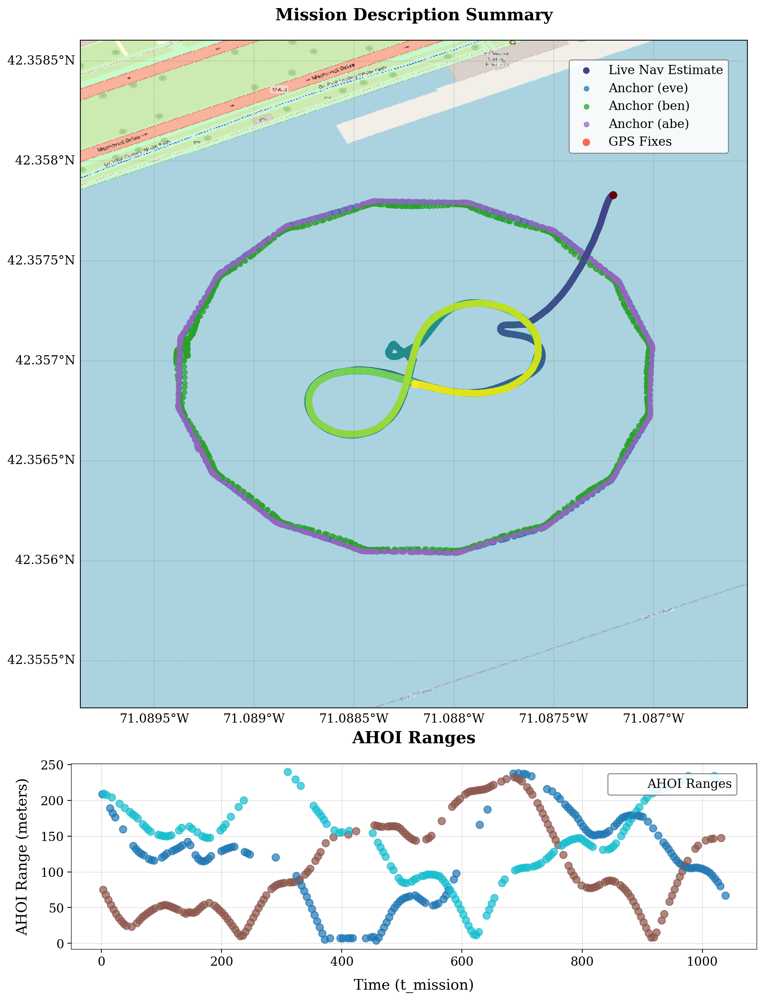


Processing SEASCOUT data for mission cv7_logs_241126-0359L-OILY-SAUL_cv7

Processing LOG_SEASCOUT-00_26_11_2024_____04_22_34
       base_station_id    target_id  sequence_num    anchor_id  \
count           1338.0  1338.000000   1338.000000  1338.000000   
mean               1.0     5.666667  13536.933483     5.666667   
std                0.0     2.868514  17246.728314     2.868514   
min                1.0     2.000000     12.000000     2.000000   
25%                1.0     2.000000    123.000000     2.000000   
50%                1.0     6.000000    234.500000     6.000000   
75%                1.0     9.000000  28442.000000     9.000000   
max                1.0     9.000000  42697.000000     9.000000   

       position_received_time  position_transmission_duration       pos_x  \
count            2.660000e+02                      266.000000  266.000000   
mean             1.732614e+09                     1098.234225  -45.136541   
std              2.824359e+02                   

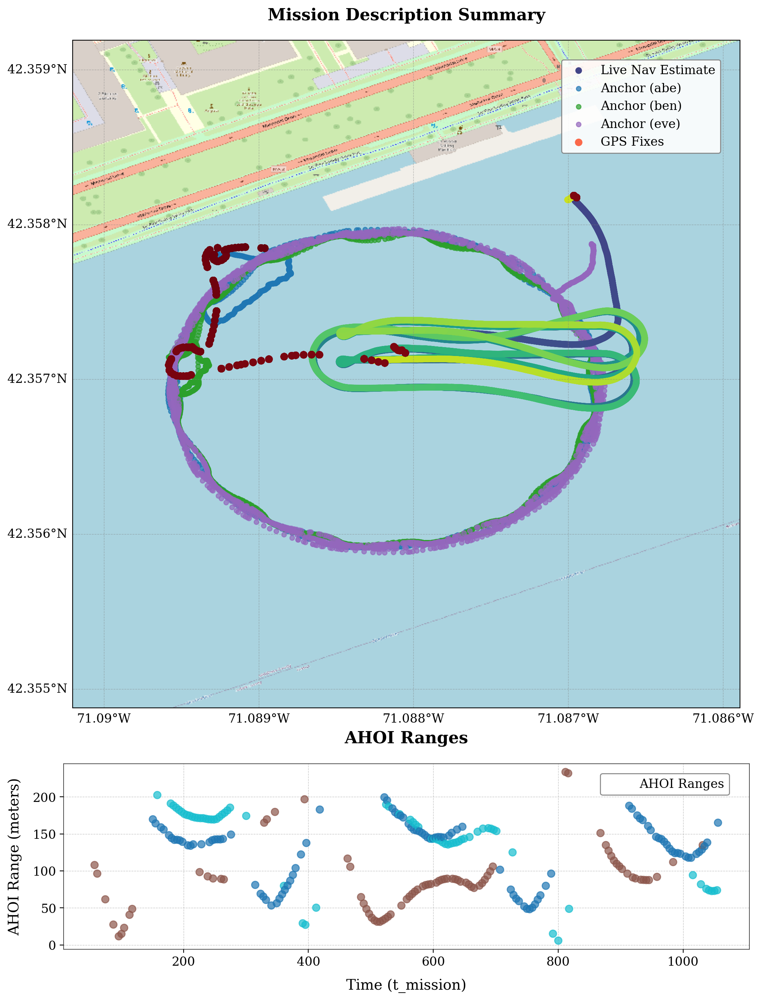


Processing SEASCOUT data for mission cv7_logs_241127-0342N-JIMS-ZEUS_cv7

Processing LOG_SEASCOUT-00_27_11_2024_____04_16_46
       base_station_id   target_id  sequence_num   anchor_id  \
count            772.0  772.000000    772.000000  772.000000   
mean               1.0    5.667098    398.826425    5.667098   
std                0.0    2.867467   1253.111677    2.867467   
min                1.0    2.000000     13.000000    2.000000   
25%                1.0    2.000000     77.000000    2.000000   
50%                1.0    6.000000    141.500000    6.000000   
75%                1.0    9.000000    206.000000    9.000000   
max                1.0    9.000000   9230.000000    9.000000   

       ack_received_time  ack_transmission_duration    distance  \
count       5.110000e+02                 511.000000  511.000000   
mean        1.732700e+09                 779.042152   99.831954   
std         2.895225e+02                  52.246542   39.687195   
min         1.732699e+09     

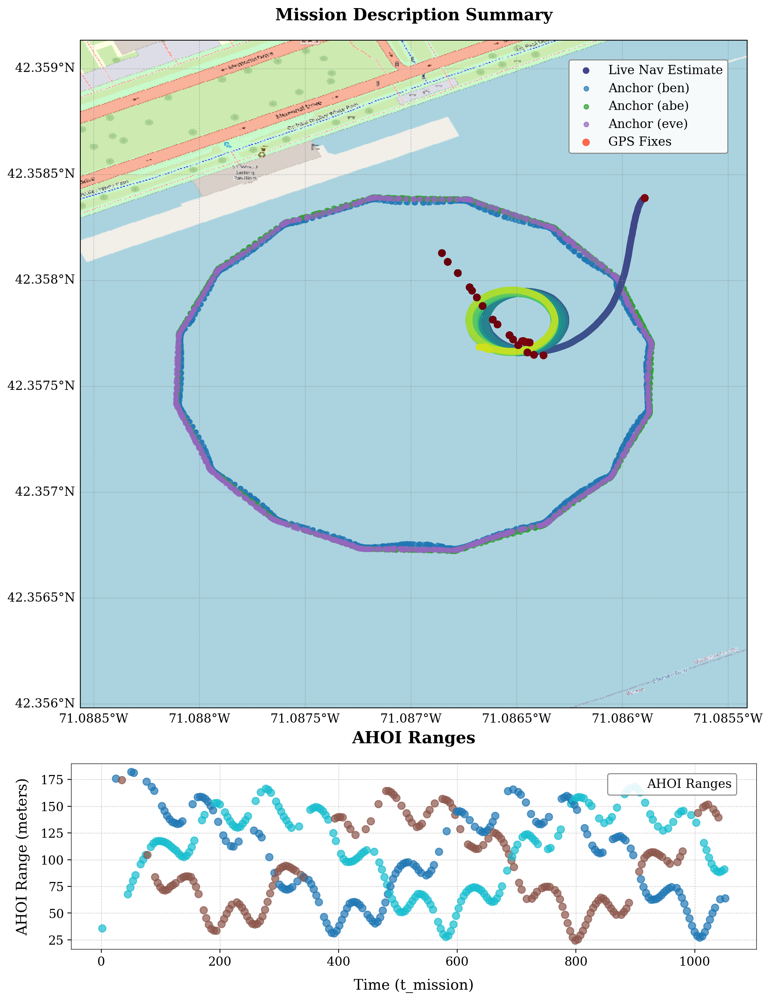


Processing SEASCOUT data for mission cv7_logs_241127-0446C-SLIM-SHAG_cv7

Processing LOG_SEASCOUT-00_27_11_2024_____04_58_17
       base_station_id   target_id  sequence_num   anchor_id  \
count            649.0  649.000000    649.000000  649.000000   
mean               1.0    5.661017    118.667180    5.661017   
std                0.0    2.871052     62.498446    2.871052   
min                1.0    2.000000     11.000000    2.000000   
25%                1.0    2.000000     65.000000    2.000000   
50%                1.0    6.000000    119.000000    6.000000   
75%                1.0    9.000000    173.000000    9.000000   
max                1.0    9.000000    227.000000    9.000000   

       ack_received_time  ack_transmission_duration    distance  \
count       2.210000e+02                 221.000000  221.000000   
mean        1.732702e+09                 763.176845   88.076097   
std         1.809671e+02                  54.891933   41.559749   
min         1.732702e+09     

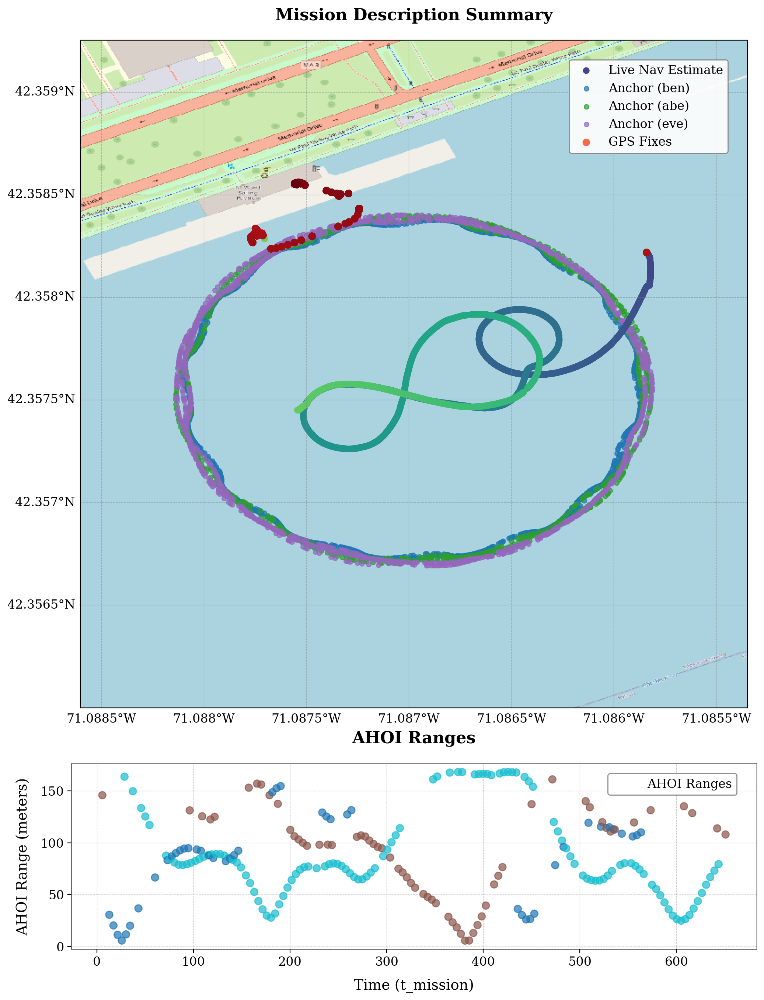


Processing SEASCOUT data for mission cv7_logs_241127-0535I-SOUR-MYLO_cv7

Processing LOG_SEASCOUT-00_27_11_2024_____05_52_58
       base_station_id   target_id  sequence_num   anchor_id  \
count            626.0  626.000000    626.000000  626.000000   
mean               1.0    5.666134    122.500000    5.666134   
std                0.0    2.871995     60.286204    2.871995   
min                1.0    2.000000     18.000000    2.000000   
25%                1.0    2.000000     70.250000    2.000000   
50%                1.0    6.000000    122.500000    6.000000   
75%                1.0    9.000000    174.750000    9.000000   
max                1.0    9.000000    227.000000    9.000000   

       ack_received_time  ack_transmission_duration    distance  \
count       1.550000e+02                 155.000000  155.000000   
mean        1.732705e+09                 806.527781  120.024000   
std         2.502299e+02                  43.633795   33.035785   
min         1.732705e+09     

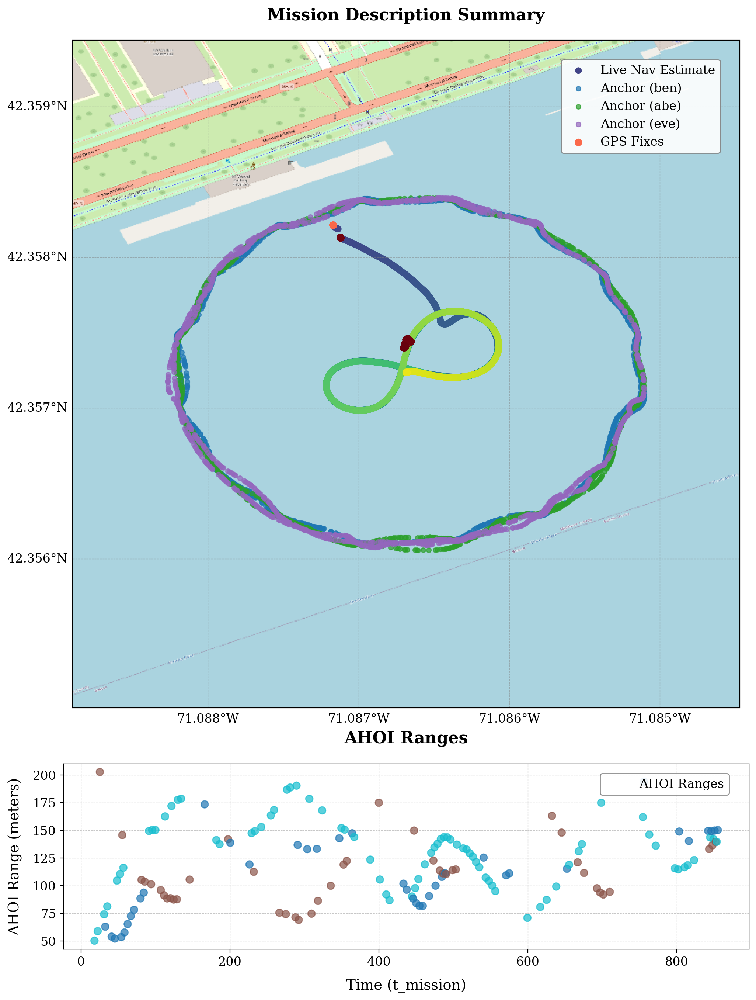


Processing SEASCOUT data for mission cv7_logs_241127-0642L-PUNY-JUGS_cv7

Processing LOG_SEASCOUT-00_27_11_2024_____06_54_18
       base_station_id   target_id  sequence_num   anchor_id  \
count            918.0  918.000000     918.00000  918.000000   
mean               1.0    5.666667    4333.72658    5.666667   
std                0.0    2.869005    9786.43337    2.869005   
min                1.0    2.000000      13.00000    2.000000   
25%                1.0    2.000000      89.00000    2.000000   
50%                1.0    6.000000     165.50000    6.000000   
75%                1.0    9.000000     242.00000    9.000000   
max                1.0    9.000000   39998.00000    9.000000   

       ack_received_time  ack_transmission_duration    distance  \
count       4.000000e+02                 400.000000  400.000000   
mean        1.732709e+09                 788.257647  107.409694   
std         2.919966e+02                  41.529344   31.164596   
min         1.732709e+09     

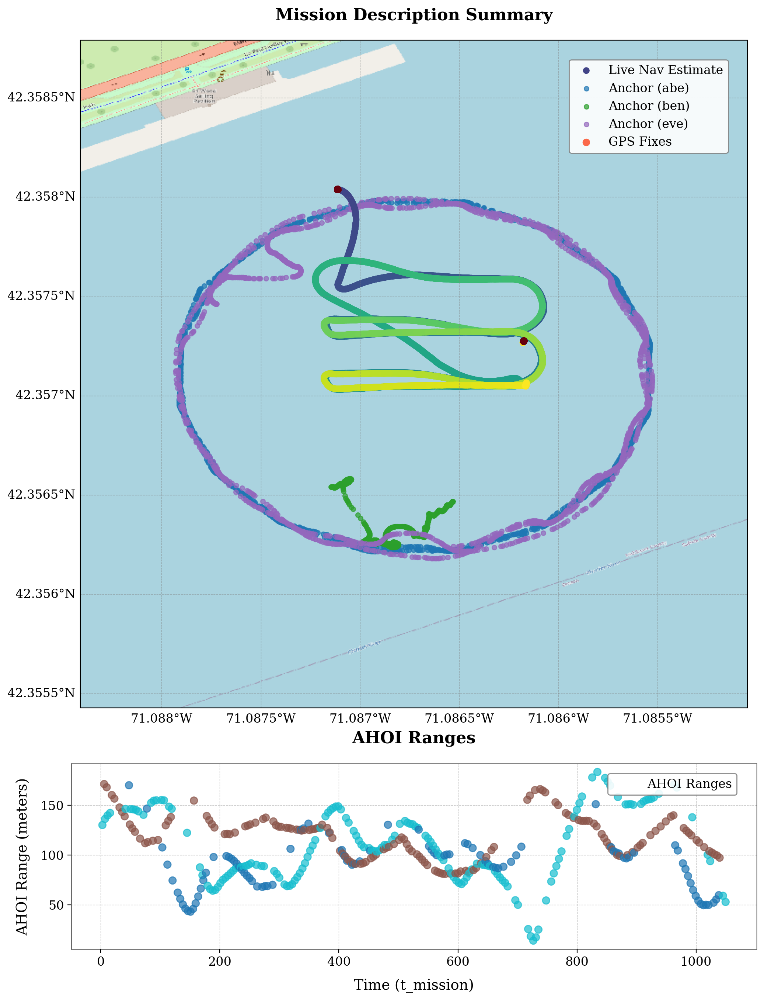


Processing SEASCOUT data for mission cv7_logs_241127-0754F-GLIB-BALL_cv7

Processing LOG_SEASCOUT-00_27_11_2024_____08_08_33
       base_station_id   target_id  sequence_num   anchor_id  \
count            544.0  544.000000    544.000000  544.000000   
mean               1.0    5.667279     97.500000    5.667279   
std                0.0    2.867477     52.395929    2.867477   
min                1.0    2.000000      7.000000    2.000000   
25%                1.0    2.000000     52.000000    2.000000   
50%                1.0    6.000000     97.500000    6.000000   
75%                1.0    9.000000    143.000000    9.000000   
max                1.0    9.000000    188.000000    9.000000   

       ack_received_time  ack_transmission_duration    distance  \
count       2.650000e+02                 265.000000  265.000000   
mean        1.732713e+09                 795.419378  112.549704   
std         2.189311e+02                  44.425373   33.341229   
min         1.732713e+09     

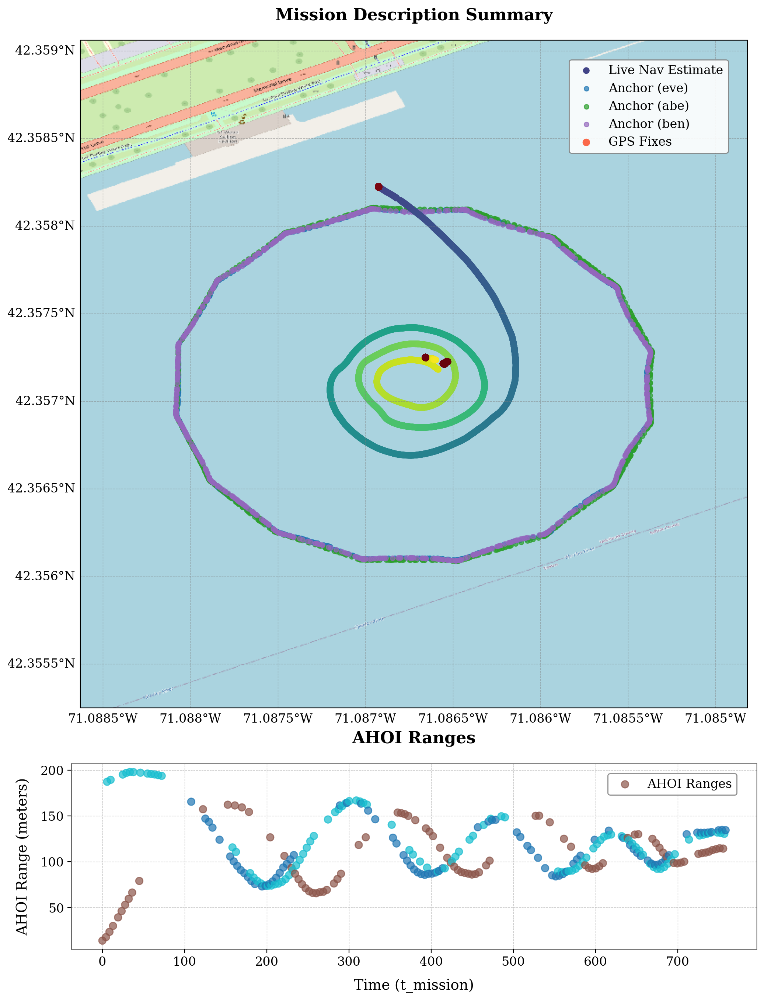

In [77]:

# Process each mission's SEASCOUT data
for mission_key, mission_info in operating_directories.items():
    # Find SEASCOUT logs in this mission
    seascout_logs = {k: v for k, v in loaded_data[mission_key].items() 
                    if "SEASCOUT" in k and 
                    k not in ["LOG_SEASCOUT-00_7_11_2024_____17_00_03", 
                             "LOG_SEASCOUT-00_20_11_2024_____21_41_49"]}
    
    if not seascout_logs:
        print(f"No valid SEASCOUT data in mission {mission_key}")
        continue
        
    print(f"\nProcessing SEASCOUT data for mission {mission_key}")
    
    for seascout_key, seascout_data in seascout_logs.items():
        print(f"\nProcessing {seascout_key}")
        
        try:
            # Load IN_WATER and GPS data
            in_water_df = pd.DataFrame(seascout_data['data']['IN_WATER'], 
                                     columns=['timestamp', 'status', 'sensor']).copy()
            in_water_time = in_water_df[in_water_df['status'] == 'true'].iloc[0]["timestamp"]
            
            # Process GPS data
            nav_x_gps = pd.DataFrame(seascout_data["data"]["NAV_X_GPS"], 
                                   columns=['timestamps', 'nav_x_gps', 'src'])
            nav_y_gps = pd.DataFrame(seascout_data["data"]["NAV_Y_GPS"], 
                                   columns=['timestamps', 'nav_y_gps', 'src'])
            nav_depth = pd.DataFrame(seascout_data["data"]["NAV_DEPTH"], 
                                   columns=['timestamps', 'nav_depth', 'src'])
            
            # Convert timestamps and GPS values
            nav_x_gps[['timestamps', 'nav_x_gps']] = nav_x_gps[['timestamps', 'nav_x_gps']].astype(float)
            nav_y_gps[['timestamps', 'nav_y_gps']] = nav_y_gps[['timestamps', 'nav_y_gps']].astype(float)
            
            # Prepare GPS data
            nav_x_gps.rename(columns={"timestamps": "time_since_epoch"}, inplace=True)
            nav_y_gps.rename(columns={"timestamps": "time_since_epoch"}, inplace=True)
            nav_x_gps.set_index("time_since_epoch", inplace=True)
            nav_y_gps.set_index("time_since_epoch", inplace=True)
            nav_x_gps.drop(columns=["src"], inplace=True)
            nav_y_gps.drop(columns=["src"], inplace=True)
            
            # Combine GPS data
            gps_data = nav_x_gps.join(nav_y_gps, how="outer").ffill().dropna()
            seascout_data["data"]["NAV_GPS"] = gps_data.copy()
            
            # Get mission complete time
            mission_complete_time = (seascout_data['data']["MISSION_COMPLETE"][0][0] 
                                   if "MISSION_COMPLETE" in seascout_data['data'] 
                                   else gps_data.index[-1])
            
            # Get the already processed AHOI ranging data
            ahoi_range_data = seascout_data["data_csv"]["ahoi_ranges"]
            
            # Synchronize and process data
            csv_files = seascout_data["data_csv"]
            sync_data, ahoi_ranging, realtime_data = synchronize_data(
                seascout_data, csv_files, ahoi_range_data, 
                in_water_time, mission_complete_time, gps_data
            )
            
            seascout_data["data"]["ahoi_ranges_corrected"] = ahoi_ranging.copy()
            
            # Process positions and add geodetic data
            sync_data = propagate_dvl_positions(sync_data)
            sync_data = range_correction_nav(sync_data)
            sync_data = add_geodetic_positions(sync_data)
            
            # Trim anchor data to sync time range
            sync_start_time = sync_data['time'].min()
            sync_end_time = sync_data['time'].max()
            
            anchor_dataframes_trimmed = {}
            for vname, anchor_df in all_mission_anchors[mission_key].items():
                mask = (anchor_df['time'] >= sync_start_time) & (anchor_df['time'] <= sync_end_time)
                anchor_dataframes_trimmed[vname] = anchor_df[mask]
            
            seascout_data["data"]["SYNC_DATA"] = sync_data
            
            seascout_data["data"]["realtime_data"] = realtime_data
            # Generate mission summary plot
            print(ahoi_ranging.describe())
            mission_summary_plot_2(seascout_data, sync_data, anchor_dataframes_trimmed, 
                               ahoi_ranging, show_plot=True, 
                               mission_info=operating_directories[mission_key])
            
        except Exception as e:
            print(f"Error processing {seascout_key}: {str(e)}")
            import traceback
            traceback.print_exc()
            continue


In [78]:
# for mission_key, mission_info in operating_directories.items():
#     seascout_logs = {k: v for k, v in loaded_data[mission_key].items()
#                     if "SEASCOUT" in k and
#                     k not in ["LOG_SEASCOUT-00_7_11_2024_____17_00_03",
#                               "LOG_SEASCOUT-00_20_11_2024_____21_41_49"]}
#     if not seascout_logs:
#         continue

#     for seascout_key, seascout_data in seascout_logs.items():
#         print(f"\nProcessing {seascout_key} ({mission_key})")

#         # Ahoi Ranges
#         print("Ahoi Ranges")
#         print("=" * 40)
#         print(f"{seascout_data['data']['ahoi_ranges_corrected'].columns}")
#         ahoi_t_series = seascout_data['data']['ahoi_ranges_corrected'].index
#         ahoi_t_start = np.min(ahoi_t_series)
#         ahoi_t_end = np.max(ahoi_t_series)
#         print(f"Start: {ahoi_t_start} | End: {ahoi_t_end}")
#         print(f"Range: {ahoi_t_end - ahoi_t_start}")
#         print("=" * 40)

#         # Realtime Data
#         print("RT Data")
#         print("=" * 40)
#         rt_t_series = seascout_data['data']['realtime_data'].index
#         rt_t_start = np.min(rt_t_series)
#         rt_t_end = np.max(rt_t_series)
#         print(f"Start: {rt_t_start} | End: {rt_t_end}")
#         print(f"Range: {rt_t_end - rt_t_start}")
#         print("=" * 40)

#         # Compare Start and End Times
#         print("Comparison")
#         print("=" * 40)
#         time_difference_start = rt_t_start - ahoi_t_start
#         time_difference_end = rt_t_end - ahoi_t_end
#         print(f"Ahoi Start: {ahoi_t_start} | RT Start: {rt_t_start} | ΔStart: {time_difference_start}: negative means MOOSDB started before Python script")
#         print(f"Ahoi End:   {ahoi_t_end}   | RT End:   {rt_t_end}   | ΔEnd:   {time_difference_end}: positive time difference means python script shut down after MOOSDB")
#         print("=" * 40)

In [79]:
# Dictionary for mission time boundaries
mission_prune = {
   'LOG_SEASCOUT-00_26_11_2024_____03_02_52': {'t_begin': 40, 't_end': 1200},
   'LOG_SEASCOUT-00_26_11_2024_____04_22_34': {'t_begin': 40, 't_end': 3050},
   'LOG_SEASCOUT-00_27_11_2024_____04_16_46': {'t_begin': 30, 't_end': 1230},
   'LOG_SEASCOUT-00_27_11_2024_____04_58_17': {'t_begin': 20, 't_end': 610},
   'LOG_SEASCOUT-00_27_11_2024_____05_52_58': {'t_begin': 15, 't_end': 840},
   'LOG_SEASCOUT-00_27_11_2024_____06_54_18': {'t_begin': 20, 't_end': 1270},
   'LOG_SEASCOUT-00_27_11_2024_____08_08_33': {'t_begin': 20, 't_end': 700},
}

# Create dictionaries to store the processed data
nav_dataset = {}
cv7_dataset = {}

# Constants for normalization
THRUSTER_NORM = 100.0  # Normalize thruster input - set high/low on boot
FIN_TO_RAD = np.radians((-29/90)) # -90 signal measured to be positive 29 degrees on a fin

    
for mission_key, mission_info in operating_directories.items():
    seascout_logs = {k: v for k, v in loaded_data[mission_key].items()
                    if "SEASCOUT" in k and
                    k not in ["LOG_SEASCOUT-00_7_11_2024_____17_00_03",
                              "LOG_SEASCOUT-00_20_11_2024_____21_41_49"]}
    if not seascout_logs:
        continue

    for seascout_key, seascout_data in seascout_logs.items():
        print(f"\nProcessing {seascout_key}")

        # try:
        if True:
            sync_data = seascout_data["data"]["SYNC_DATA"]
            
            # Get time boundaries for this mission
            if seascout_key in mission_prune:
                t_begin = mission_prune[seascout_key]['t_begin']
                t_end = mission_prune[seascout_key]['t_end']

                # Only filter if time boundaries are specified
                if t_begin is not None and t_end is not None:
                    time_mask = (sync_data["t_mission"] >= t_begin) & (sync_data["t_mission"] <= t_end)
                    sync_data = sync_data[time_mask]

                # Create navigator data structure
                nav_data = pd.DataFrame()

                # Linear velocities (from DVL)
                nav_data['t'] = sync_data['t_mission']
                nav_data['u'] = sync_data['surge']
                nav_data['v'] = sync_data['sway']
                nav_data['w'] = sync_data['heave']
                nav_data['conf'] = sync_data['latestConfidence']

                # Angular rates (from gyros)
                nav_data['p'] = sync_data['nav_Gyro_X']
                nav_data['q'] = sync_data['nav_Gyro_Y']
                nav_data['r'] = sync_data['nav_Gyro_Z']
                
                # Add p_dot, q_dot, r_dot
                nav_data['p_dot'] = sync_data['nav_Gyro_X_dot']
                nav_data['q_dot'] = sync_data['nav_Gyro_Y_dot']
                nav_data['r_dot'] = sync_data['nav_Gyro_Z_dot']

                # Euler angles (in radians)
                nav_data['phi'] = np.radians(sync_data['nav_Roll'])
                nav_data['theta'] = np.radians(sync_data['nav_Pitch'])
                nav_data['psi'] = np.radians(sync_data['nav_Heading'])

                # Accelerations (these will be used for u_dot, v_dot, w_dot)
                nav_data['u_dot'] = sync_data['nav_Imu_X']
                nav_data['v_dot'] = sync_data['nav_Imu_Y']
                nav_data['w_dot'] = sync_data['nav_Imu_Z']
                #Control inputs
                nav_data['dc'] = sync_data['desired_speed']/THRUSTER_NORM
                nav_data['qp'] = sync_data['desired_port_elevator']*FIN_TO_RAD
                nav_data['qr'] = sync_data['desired_rudder']*FIN_TO_RAD
                nav_data['qs'] = sync_data['desired_stbd_elevator']*FIN_TO_RAD
                
                nav_data['vbat'] = sync_data['vbat']
                nav_data['current'] = sync_data['current']

                # Create CV7 data structure
                cv7_data = pd.DataFrame()

                # Linear velocities (same DVL data)
                cv7_data['t'] = sync_data['t_mission']
                cv7_data['u'] = sync_data['surge']
                cv7_data['v'] = sync_data['sway']
                cv7_data['w'] = sync_data['heave']
                cv7_data['conf'] = sync_data['latestConfidence']

                # Angular rates (from CV7 gyros)
                cv7_data['p'] = sync_data['cv7_FilteredGyroX']
                cv7_data['q'] = sync_data['cv7_FilteredGyroY']
                cv7_data['r'] = sync_data['cv7_FilteredGyroZ']
                
                cv7_data['p_dot'] = sync_data['cv7_FilteredGyroX_dot']
                cv7_data['q_dot'] = sync_data['cv7_FilteredGyroY_dot']
                cv7_data['r_dot'] = sync_data['cv7_FilteredGyroZ_dot']

                # Euler angles (CV7 already in radians)
                cv7_data['phi'] = sync_data['cv7_Roll']
                cv7_data['theta'] = sync_data['cv7_Pitch']
                #declination_deg = -14.0833
                declination_deg = 0
                cv7_data['psi'] = np.radians((np.degrees(sync_data['cv7_Yaw']) + declination_deg + 360.0) % 360.0)

                # Accelerations
                cv7_data['u_dot'] = sync_data['cv7_FilteredAccelX']
                cv7_data['v_dot'] = sync_data['cv7_FilteredAccelY']
                cv7_data['w_dot'] = sync_data['cv7_FilteredAccelZ']
                # Control inputs (same for both datasets)
                cv7_data['dc'] = sync_data['desired_speed']/THRUSTER_NORM
                cv7_data['qp'] = sync_data['desired_port_elevator']*FIN_TO_RAD
                cv7_data['qr'] = sync_data['desired_rudder']*FIN_TO_RAD
                cv7_data['qs'] = sync_data['desired_stbd_elevator']*FIN_TO_RAD
                
                cv7_data['vbat'] = sync_data['vbat']
                cv7_data['current'] = sync_data['current']
                
#                 for rate in ['p', 'q', 'r']:
#                     dt = nav_data['t'].diff().fillna(0)  # Handle time discontinuities 
#                     nav_data[f'{rate}_dot'] = (nav_data[rate].diff() / (dt.replace(0, np.nan))).fillna(0)

#                     dt = cv7_data['t'].diff().fillna(0)
#                     cv7_data[f'{rate}_dot'] = (cv7_data[rate].diff() / (dt.replace(0, np.nan))).fillna(0)
                
                # Store data in the respective datasets
                nav_data = nav_data.dropna()
                cv7_data = cv7_data.dropna()
                nav_dataset[seascout_key] = nav_data
                cv7_dataset[seascout_key] = cv7_data

                if t_begin is not None and t_end is not None:
                    print(f"Processed data for time range {t_begin} to {t_end}")
                else:
                    print("Processed full dataset (no time pruning)")

        # except Exception as e:
        #     print(f"Error processing {seascout_key}: {str(e)}")

    # Print summary of processed datasets
    print("\nProcessed Dataset Summary:")
for mission_key in nav_dataset.keys():
    print(f"\n{mission_key}:")
    print(f"  Navigator data shape: {nav_dataset[mission_key].shape}")
    print(f"  CV7 data shape: {cv7_dataset[mission_key].shape}")


Processing LOG_SEASCOUT-00_26_11_2024_____03_02_52
Processed data for time range 40 to 1200

Processed Dataset Summary:

Processing LOG_SEASCOUT-00_26_11_2024_____04_22_34
Processed data for time range 40 to 3050

Processed Dataset Summary:

Processing LOG_SEASCOUT-00_27_11_2024_____04_16_46
Processed data for time range 30 to 1230

Processed Dataset Summary:

Processing LOG_SEASCOUT-00_27_11_2024_____04_58_17
Processed data for time range 20 to 610

Processed Dataset Summary:

Processing LOG_SEASCOUT-00_27_11_2024_____05_52_58
Processed data for time range 15 to 840

Processed Dataset Summary:

Processing LOG_SEASCOUT-00_27_11_2024_____06_54_18
Processed data for time range 20 to 1270

Processed Dataset Summary:

Processing LOG_SEASCOUT-00_27_11_2024_____08_08_33
Processed data for time range 20 to 700

Processed Dataset Summary:

LOG_SEASCOUT-00_26_11_2024_____03_02_52:
  Navigator data shape: (9233, 23)
  CV7 data shape: (9233, 23)

LOG_SEASCOUT-00_26_11_2024_____04_22_34:
  Naviga

In [80]:
# mission_errors = {}
# from matplotlib import gridspec

# for mission_key, mission_info in operating_directories.items():
#     # Find SEASCOUT logs
#     seascout_logs = {k: v for k, v in loaded_data[mission_key].items() 
#                      if "SEASCOUT" in k and 
#                      k not in ["LOG_SEASCOUT-00_7_11_2024_____17_00_03", 
#                               "LOG_SEASCOUT-00_20_11_2024_____21_41_49"]}
    
#     if not seascout_logs:
#         print(f"No valid SEASCOUT data in mission {mission_key}")
#         continue
        
#     print(f"\nProcessing SEASCOUT data for mission {mission_key}")
    
#     for seascout_key, seascout_data in seascout_logs.items():
#         print(f"\nProcessing {seascout_key}")
#         bounds = time_bounds.get(mission_key, {}).get(seascout_key, {})
#         t_start = bounds.get("t_start", None)
#         t_end = bounds.get("t_end", None)
#         # Get realtime data
#         realtime_data = seascout_data["data"]["realtime_data"]
#         realtime_data['nav_depth'] = pd.to_numeric(realtime_data['nav_depth'], errors='coerce')

#         # Process through EKF
#         results = process_ro_ekf_data(realtime_data, t_start, t_end)
        
        
#         # Extract data for plotting
#         filtered_data = results['filtered_data']
#         anchor_ids = results['anchor_ids']
#         ekf_states = results['states']
#         ekf_times = results['times']
#         innovations = results['innovations']
#         update_times = results['update_times']
#         jacobians = results['jacobians']
        
#         # Get navigation data
        
#         nav_mask = filtered_data['var_source'] == 'NODE_REPORT'
#         nav_x = filtered_data.loc[nav_mask, 'NAV_X'].to_numpy()
#         nav_y = filtered_data.loc[nav_mask, 'NAV_Y'].to_numpy()
        
#         # Get GPS data
#         gps_mask = filtered_data['var_source'] == 'GPS'
#         gps_data = filtered_data[filtered_data['var_source'] == 'GPS']
#         has_gps = len(gps_data) > 0  # Simple explicit check for GPS data presence
        
#         # Calculate plot bounds
#         x_min = min(nav_x.min(), ekf_states[:, 0].min())
#         x_max = max(nav_x.max(), ekf_states[:, 0].max())
#         y_min = min(nav_y.min(), ekf_states[:, 1].min())
#         y_max = max(nav_y.max(), ekf_states[:, 1].max())
        
#         # Add buffer
#         x_buffer = (x_max - x_min) * 0.1
#         y_buffer = (y_max - y_min) * 0.1
#         x_min, x_max = x_min - x_buffer, x_max + x_buffer
#         y_min, y_max = y_min - y_buffer, y_max + y_buffer

#         # Create figure
#         fig = plt.figure(figsize=(15, 18))
#         gs = gridspec.GridSpec(4, 2, height_ratios=[1, 1, 1, 1])

#         # 1. Top Left: Navigation Engine Trajectory
#         ax1 = fig.add_subplot(gs[0, 0])
#         sc_nav = ax1.scatter(nav_x, nav_y, c=filtered_data.loc[nav_mask].index, 
#                             cmap=plt.colormaps['viridis'], s=10, alpha=0.6, label='NAV')

#         if has_gps:
#             gps_x = filtered_data.loc[gps_mask, 'nav_x_gps'].to_numpy()
#             gps_y = filtered_data.loc[gps_mask, 'nav_y_gps'].to_numpy()
#             ax1.scatter(gps_x, gps_y, color='red', s=50, marker='*', label='GPS')

#         colors = ['red', 'blue', 'green']
#         for anchor_id, color in zip(anchor_ids, colors):
#             anchor_data = filtered_data[
#                 (filtered_data['var_source'] == 'AHOI_RANGE') & 
#                 (filtered_data['anchor_id'] == anchor_id)
#             ]
#             ax1.scatter(anchor_data['pos_x'], anchor_data['pos_y'], 
#                        c=anchor_data.index, cmap=plt.colormaps['viridis'], 
#                        alpha=0.8, s=20, label=f'Anchor {anchor_id}')

#         ax1.set_xlim(x_min, x_max)
#         ax1.set_ylim(y_min, y_max)
#         ax1.set_aspect('equal')
#         ax1.grid(True)
#         ax1.set_title('Navigation Engine Trajectory')
#         ax1.set_xlabel('X Position (m)')
#         ax1.set_ylabel('Y Position (m)')
#         ax1.legend()

#         # 2. Top Right: EKF Trajectory
#         ax2 = fig.add_subplot(gs[0, 1])
#         sc_ekf = ax2.scatter(ekf_states[:, 0], ekf_states[:, 1], 
#                             c=ekf_times, cmap=plt.colormaps['viridis'], 
#                             s=10, alpha=0.6, label='EKF')

#         if has_gps:
#             ax2.scatter(gps_x, gps_y, color='red', s=50, marker='*', label='GPS')

#         for anchor_id, color in zip(anchor_ids, colors):
#             anchor_data = filtered_data[
#                 (filtered_data['var_source'] == 'AHOI_RANGE') & 
#                 (filtered_data['anchor_id'] == anchor_id)
#             ]
#             ax2.scatter(anchor_data['pos_x'], anchor_data['pos_y'], 
#                        c=anchor_data.index, cmap=plt.colormaps['viridis'], 
#                        alpha=0.8, s=20, label=f'Anchor {anchor_id}')

#         ax2.set_xlim(x_min, x_max)
#         ax2.set_ylim(y_min, y_max)
#         ax2.set_aspect('equal')
#         ax2.grid(True)
#         ax2.set_title('EKF Trajectory')
#         ax2.set_xlabel('X Position (m)')
#         ax2.set_ylabel('Y Position (m)')
#         ax2.legend()

#         # 3. Middle Left: Range measurements
#         ax3 = fig.add_subplot(gs[1, 0])
#         for anchor_id, color in zip(anchor_ids, colors):
#             anchor_data = filtered_data[
#                 (filtered_data['var_source'] == 'AHOI_RANGE') & 
#                 (filtered_data['anchor_id'] == anchor_id)
#             ]
#             ax3.scatter(anchor_data["t_mission"], anchor_data['distance'], 
#                        color=color, alpha=0.6, s=10, label=f'Anchor {anchor_id}')
#         ax3.set_title('Range Measurements by Anchor')
#         ax3.set_xlabel('Time')
#         ax3.set_ylabel('Range (m)')
#         ax3.grid(True)
#         ax3.legend()

#         # 4. Middle Right: Innovations
#         ax4 = fig.add_subplot(gs[1, 1])
#         ax4.plot(update_times, innovations, 'k.', alpha=0.5, markersize=2)
#         ax4.axhline(y=0, color='g', linestyle='-', alpha=0.5)
#         ax4.set_title('Range Measurement Innovations')
#         ax4.set_xlabel('Time')
#         ax4.set_ylabel('Innovation (m)')
#         ax4.grid(True)

#         # 5. Bottom Left: Innovation histogram
#         ax5 = fig.add_subplot(gs[2, 0])
#         n, bins, patches = ax5.hist(innovations, bins=30, density=True, alpha=0.7)
#         mu, std = np.mean(innovations), np.std(innovations)
#         x = np.linspace(mu - 4*std, mu + 4*std, 100)
#         p = 1/(std * np.sqrt(2 * np.pi)) * np.exp(- (x - mu)**2 / (2 * std**2))
#         ax5.plot(x, p, 'r-', lw=2, label=f'N({mu:.2f}, {std:.2f}²)')
#         ax5.set_title('Innovation Distribution')
#         ax5.set_xlabel('Innovation (m)')
#         ax5.set_ylabel('Density')
#         ax5.grid(True)
#         ax5.legend()
        
#         gps_data = filtered_data[filtered_data['var_source'] == 'GPS']

#         # Bottom Right: GPS Comparison plot
#         ax6 = fig.add_subplot(gs[2, 1])
#         if has_gps:
#             print("Entering GPS plotting block")
#             # Get last GPS point (actual surface location)
#             surface_gps = gps_data.iloc[-1]
#             surface_time = surface_gps.name
#             surface_pos = np.array([surface_gps['nav_x_gps'], surface_gps['nav_y_gps']])
#             print(f"Surface GPS position (actual): {surface_pos}")

#             # Get NAV position at surface
#             nav_mask = filtered_data['var_source'] == 'NODE_REPORT'
#             nav_data = filtered_data[nav_mask]

#             # Calculate NAV differences to detect jumps
#             nav_diff = np.sqrt(np.diff(nav_data['NAV_X'].to_numpy())**2 + 
#                                np.diff(nav_data['NAV_Y'].to_numpy())**2)
#             epsilon = 0.75
#             jump_indices = np.where(nav_diff > epsilon)[0]

#             # Determine valid NAV range
#             if len(jump_indices) > 0:
#                 last_valid_index = jump_indices[0]
#                 valid_nav_range = slice(max(0, last_valid_index - len(nav_data) // 4), last_valid_index)
#                 valid_nav_data = nav_data.iloc[valid_nav_range]
#             else:
#                 valid_nav_data = nav_data.iloc[-len(nav_data) // 4:]

#             # Use the last valid NAV point
#             nav_before_surface = valid_nav_data.iloc[-1]
#             nav_pos = np.array([nav_before_surface['NAV_X'], nav_before_surface['NAV_Y']])
#             print(f"NAV position at surface: {nav_pos}")

#             # Get closest EKF state
#             closest_ekf_idx = np.abs(ekf_times - surface_time).argmin()
#             ekf_pos = ekf_states[closest_ekf_idx, :2]
#             print(f"EKF position at surface: {ekf_pos}")

#             # Get specified surface position from time_bounds
#             specified_nav_pos = np.array([bounds['surface_x'], bounds['surface_y']])

#             # Plot positions
#             ax6.scatter(surface_pos[0], surface_pos[1], color='red', s=100, marker='*', label='Final GPS')
#             ax6.scatter(specified_nav_pos[0], specified_nav_pos[1], color='blue', s=75, marker='o', label='Nav Surface')
#             ax6.scatter(ekf_pos[0], ekf_pos[1], color='green', s=50, label='EKF')

#             ax6.set_aspect('equal')
#             ax6.grid(True)
#             ax6.legend()
#             ax6.set_title('Positions at Surface')

#             # Print errors
#             print("\nSurface Position Errors:")
#             print(f"Nav Surface Error: {np.linalg.norm(specified_nav_pos - surface_pos):.3f} m")
#             print(f"EKF Error: {np.linalg.norm(ekf_pos - surface_pos):.3f} m")
#             nav_surface_error = np.linalg.norm(specified_nav_pos - surface_pos) if has_gps else None
#             ekf_error = np.linalg.norm(ekf_pos - surface_pos) if has_gps else None
#             mission_errors[mission_key] = {"nav_error": nav_surface_error, "ekf_error": ekf_error}
#             # Range differentials for smoothness
#             nav_diffs = np.sqrt(np.diff(nav_x)**2 + np.diff(nav_y)**2)
#             ekf_diffs = np.sqrt(np.diff(ekf_states[:, 0])**2 + np.diff(ekf_states[:, 1])**2)

#             # Metrics
#             nav_mean = np.mean(nav_diffs)
#             nav_std = np.std(nav_diffs)
#             ekf_mean = np.mean(ekf_diffs)
#             ekf_std = np.std(ekf_diffs)

#             # Store metrics
#             mission_errors[mission_key].update({
#                 "nav_mean_diff": nav_mean,
#                 "nav_std_diff": nav_std,
#                 "ekf_mean_diff": ekf_mean,
#                 "ekf_std_diff": ekf_std
#             })
#         else:
#             ax6.text(0.5, 0.5, 'No GPS Data Available', 
#                      horizontalalignment='center', verticalalignment='center')

#         ax6.set_xlabel('X Position (m)')
#         ax6.set_ylabel('Y Position (m)')
        
#         # Add Observability Gramian Trace Plot
#         ax7 = fig.add_subplot(gs[3, 0])  # Create a new subplot for Gramian trace
        
#         range_data = filtered_data[filtered_data['var_source'] == 'AHOI_RANGE']
#         t_min = range_data['t_mission'].min()
#         t_max = range_data['t_mission'].max()

#         gramian_traces = []
#         gramian_times = []
#         window_size = 10  # seconds

#         # First get times when we have Jacobians (i.e., measurement update times)
#         measurement_times = update_times  # These are the times when we have measurements/Jacobians

#         # For each EKF state time
#         for t in ekf_times:
#             # Define the window
#             window_start = t - window_size
#             window_end = t

#             # Find all measurements in our window
#             window_mask = (measurement_times >= window_start) & (measurement_times <= window_end)
#             meas_indices = np.where(window_mask)[0]

#             # Compute Gramian using Jacobians from this window
#             gramian = np.zeros((3, 3))  # 3x3 for position state
#             for idx in meas_indices:
#                 if idx < len(jacobians):  # Safety check
#                     H = jacobians[idx]
#                     gramian += H.T @ H

#             # Store results
#             gramian_traces.append(np.trace(gramian))
#             gramian_times.append(t)

#         # Plot results
#         ax7.clear()
#         ax7.plot(gramian_times, gramian_traces, label="Gramian Trace", color='purple')
#         ax7.set_title("Observability Gramian Trace (10s Window)")
#         ax7.set_xlabel("Mission Time (s)")
#         ax7.set_ylabel("Trace")
#         ax7.grid(True)
#         ax7.legend()
#         ax7.set_xlim(t_min, t_max)
        
#         # Add Directional Observability Plot
#         ax8 = fig.add_subplot(gs[3, 1])  # Use the bottom right spot of the grid

#         # Compute and store directional observability
#         x_observability = []
#         y_observability = []
#         z_observability = []
#         gramian_times = []

#         window_size = 10  # seconds
#         measurement_times = update_times

#         for t in ekf_times:
#             window_start = t - window_size
#             window_end = t

#             window_mask = (measurement_times >= window_start) & (measurement_times <= window_end)
#             meas_indices = np.where(window_mask)[0]

#             gramian = np.zeros((3, 3))
#             for idx in meas_indices:
#                 if idx < len(jacobians):
#                     H = jacobians[idx]
#                     gramian += H.T @ H

#             x_observability.append(gramian[0,0])
#             y_observability.append(gramian[1,1])
#             z_observability.append(gramian[2,2])
#             gramian_times.append(t)

#         # Plot directional observability components
#         ax8.plot(gramian_times, x_observability, label="X", color='red')
#         ax8.plot(gramian_times, y_observability, label="Y", color='blue')
#         ax8.plot(gramian_times, z_observability, label="Z", color='green')
#         ax8.set_title("Directional Observability (10s Window)")
#         ax8.set_xlabel("Mission Time (s)")
#         ax8.set_ylabel("Observability")
#         ax8.grid(True)
#         ax8.legend()
#         ax8.set_xlim(t_min, t_max)

#         plt.tight_layout()
#         plt.show()
        
# print("\nMission Errors Summary:")
# for mission, errors in mission_errors.items():
#     print(f"{mission}: Nav Error = {errors['nav_error']:.3f} m, EKF Error = {errors['ekf_error']:.3f} m")
# print("\nSmoothness Metrics (Range Differentials):")
# for mission, errors in mission_errors.items():
#     print(f"{mission}: Nav Mean = {errors['nav_mean_diff']:.3f}, Nav Std = {errors['nav_std_diff']:.3f}, "
#           f"EKF Mean = {errors['ekf_mean_diff']:.3f}, EKF Std = {errors['ekf_std_diff']:.3f}")
    
# # Bar plot for errors
# mission_names = list(mission_errors.keys())
# nav_errors = [errors['nav_error'] for errors in mission_errors.values()]
# ekf_errors = [errors['ekf_error'] for errors in mission_errors.values()]

# x = np.arange(len(mission_names))
# width = 0.35

# fig, ax = plt.subplots(figsize=(10, 6))
# ax.bar(x - width/2, nav_errors, width, label='Nav Error')
# ax.bar(x + width/2, ekf_errors, width, label='EKF Error')

# ax.set_xticks(x)
# ax.set_xticklabels(mission_names, rotation=45, ha="right")
# ax.set_ylabel('Error (m)')
# ax.set_title('Nav and EKF Errors Across Missions')
# ax.legend()
# plt.tight_layout()
# plt.show()

# # Prepare data
# nav_means = [errors['nav_mean_diff'] for errors in mission_errors.values()]
# nav_stds = [errors['nav_std_diff'] for errors in mission_errors.values()]
# ekf_means = [errors['ekf_mean_diff'] for errors in mission_errors.values()]
# ekf_stds = [errors['ekf_std_diff'] for errors in mission_errors.values()]
# x = np.arange(len(mission_names))  # Mission indices
# width = 0.35  # Width of the bars

# # Create the plot
# fig, ax = plt.subplots(figsize=(12, 6))

# # Plot Nav Engine with error bars
# nav_bars = ax.bar(x - width/2, nav_means, width, yerr=nav_stds, capsize=5, label='Nav Engine', alpha=0.8)

# # Plot EKF with error bars
# ekf_bars = ax.bar(x + width/2, ekf_means, width, yerr=ekf_stds, capsize=5, label='EKF', alpha=0.8)

# # Customize plot
# ax.set_xticks(x)
# ax.set_xticklabels(mission_names, rotation=45, ha="right")
# ax.set_ylabel('Differential (m)')
# ax.set_title('Navigation Update Smoothness: Mean and Std')
# ax.legend()

# # Add grid and layout adjustments
# ax.grid(axis='y', linestyle='--', alpha=0.7)
# plt.tight_layout()

# # Show plot
# plt.show()


In [81]:

time_bounds = {
    "cv7_logs_241126-0219R-PUNY-CAIN_cv7": {
        "LOG_SEASCOUT-00_26_11_2024_____03_02_52": {
            "t_start": 0,
            "t_end": 1500,
            "surface_x": -50.91,
            "surface_y": -176.22,
            "initial_bias_estimate": np.radians(0)
        }
    },
    "cv7_logs_241126-0359L-OILY-SAUL_cv7": {
        "LOG_SEASCOUT-00_26_11_2024_____04_22_34": {
            "t_start": 0,
            "t_end": 3200,
            "surface_x": -83.6,
            "surface_y": -144.2,
            "initial_bias_estimate": np.radians(0)
        }
    },
    "cv7_logs_241127-0342N-JIMS-ZEUS_cv7": {
        "LOG_SEASCOUT-00_27_11_2024_____04_16_46": {
            "t_start": 0,
            "t_end": 1450,
            "surface_x": 93.92,
            "surface_y": -83.19,
            "initial_bias_estimate": np.radians(0)
        }
    },
    "cv7_logs_241127-0446C-SLIM-SHAG_cv7": {
        "LOG_SEASCOUT-00_27_11_2024_____04_58_17": {
            "t_start": 0,
            "t_end": 670,
            "surface_x": -12.5,
            "surface_y": -16.0,
            "initial_bias_estimate": np.radians(-50)
        }
    },
    "cv7_logs_241127-0535I-SOUR-MYLO_cv7": {
        "LOG_SEASCOUT-00_27_11_2024_____05_52_58": {
            "t_start": 0,
            "t_end": 870,
            "surface_x": 73.7,
            "surface_y": -115.9,
            "initial_bias_estimate": np.radians(-2)
        }
    },
    "cv7_logs_241127-0642L-PUNY-JUGS_cv7": {
        "LOG_SEASCOUT-00_27_11_2024_____06_54_18": {
            "t_start": 0,
            "t_end": 1400,
            "surface_x": 116.67,
            "surface_y": -131.23,
            "initial_bias_estimate": np.radians(0)
        }
    },
    "cv7_logs_241127-0754F-GLIB-BALL_cv7": {
        "LOG_SEASCOUT-00_27_11_2024_____08_08_33": {
            "t_start": 0,
            "t_end": 730,
            "surface_x": 86.9,
            "surface_y": -137.1,
            "initial_bias_estimate": np.radians(0)
        }
    }
}


In [99]:
# Factor graph class to replicate EKF structure
import gtsam
import numpy as np
import os
from matplotlib.patches import Ellipse
from dataclasses import dataclass
from dataclasses import dataclass
from typing import Literal, Optional, List, Tuple, Dict
@dataclass
class FGConfig:
    """Configuration parameters for the Factor Graph"""
    anchor_depth: float    # Depth of the anchor (m)
    static_pitch: float    # Pitch of the vehicle (rad)
    static_roll: float     # Roll of the vehicle (rad)
    # Measurement noise standard deviations
    sigma_gps_pos_x: float # GPS position noise in x (m)
    sigma_gps_pos_y: float # GPS position noise in y (m)
    sigma_gps_pos_z: float # GPS position noise in z (m)
    sigma_psi: float       # Heading noise (rad)
    sigma_theta: float     # Pitch noise (rad)
    sigma_phi: float       # Roll noise (rad)
    sigma_range: float     # Range measurement noise (m)
    sigma_depth: float     # Depth measurement noise (m)
    # Measurement model params
    range_noise_method: str # Method to use for range noise (e.g. 'constant', 'linear')
    range_noise_dist: str  # Distribution to use for range noise (e.g. 'gaussian', 'huber')
    # Factor inclusion params
    graph_dimension: str   # Either '2D' or '3D'
    use_range: bool        # Whether to use range measurements
    use_depth: bool        # Whether to use depth measurements
    # Initialization params
    pose_init_method: str # Method to use for point initialization (filter, nav, random)
    anchor_init_method: str # Method to use for anchor initialization (gps, nav, random)
    # Process control params
    first_batch_size: int # Number of points to use for first solve
    batch_interval: int        # Number of points to add before solving
    sliding_window_size: int   # Number of points to keep in memory
    # Optimization params (gtsam.LM)
    max_iterations: int    # Maximum number of iterations
    tolerance: float       # Tolerance for convergence
    verbosity: int         # Verbosity level

# This will be the main class for the factor graph
# It will be initialized outside a for loop, but then a for loop will iterate over the measurement data
# A set of factors (a between factor on the robot, a prior on the landmark, and a range factor) will be added to the graph
class RASLAM:
    """ Factor Graph for range-aided SLAM
        - Uses a Interial + DVL EKF for odometry
    """
    def __init__(self, config: FGConfig):
        self.config = config
        self.graph = gtsam.NonlinearFactorGraph()
        self.initial_estimate = gtsam.Values()
        self.solved_estimate = gtsam.Values()
        self.pose_index = 0
        self.anchor_indices = {}
        self.range_association = {}
        self.symbol_xi = gtsam.Symbol()
        self.state_xi = None # [x, y, z, u, v, w, psi, bias_psi]
        self.cov_Pi = None #[8x8]
        self.last_pose_marginal = None

    def convert_8D_to_6D(self, state, covariance):
        # Converts a 8D [x,y,z,u,v,w,yaw,yaw bias] state and covariance to a 6D state [x,y,z,r,p,y] and covariance
        # Convert the state
        state_6d = gtsam.Pose3(
            gtsam.Rot3.Ypr(state[6], self.config.static_pitch, self.config.static_roll),
            gtsam.Point3(state[0], state[1], state[2])
        )
        # Convert the covariance
        cov_6d = np.eye(6)
        cov_6d[:3, :3] = covariance[:3, :3]
        cov_6d[3, 3] = self.config.sigma_phi**2
        cov_6d[4, 4] = self.config.sigma_theta**2
        cov_6d[5, 5] = covariance[6, 6]
        return state_6d, cov_6d
    
    def convert_8D_to_2D(self, state, covariance):
        # Converts a 8D [x,y,z,u,v,w,yaw,yaw bias] state and covariance to a 2D state [x,y,yaw] and covariance
        # Convert the state
        state_2d = gtsam.Pose2(state[0], state[1], state[6])
        # Convert the covariance
        cov_2d = np.eye(3)
        cov_2d[:2, :2] = covariance[:2, :2]
        cov_2d[2, 2] = covariance[6, 6]
        return state_2d, cov_2d
    
    def initialize_state(self, state_x, cov_P):
        if self.config.graph_dimension == '3D':
            # Define the initial state and covariance
            self.state_xi, self.cov_Pi = self.convert_8D_to_6D(state_x, cov_P)
            initial_value = self.state_xi.translation()
            # Define the initial estimate and insert to values
            self.symbol_xi = self.insert_pose_initial_estimate_3D(state_x, cov_P, initial_value, add_prior=True)
        elif self.config.graph_dimension == '2D':
            # Define the initial state and covariance
            self.state_xi, self.cov_Pi = self.convert_8D_to_2D(state_x, cov_P)
            initial_value = self.state_xi.translation()
            # Define the initial estimate and insert to values
            self.symbol_xi = self.insert_pose_initial_estimate_2D(state_x, cov_P, initial_value, add_prior=True)
        else:
            raise ValueError("Invalid graph dimension")
        return
    
    def insert_pose_initial_estimate_2D(self, state_x, cov_P, initial_value, add_prior: bool = False):
        # Define the pose based ont the selected method
        if self.config.pose_init_method == 'filter':
            pose = gtsam.Pose2(state_x[0], state_x[1], state_x[6])
        elif self.config.pose_init_method == 'nav':
            # Uses the MOOSDB NAV state for independent initialization
            pose = gtsam.Pose2(initial_value[0], initial_value[1], state_x[6])
        elif self.config.pose_init_method == 'random':
            raise ValueError("Random initialization not yet implemented")
        else:
            raise ValueError("Invalid pose initialization method")
        # Create a key for the pose and insert
        pose_symbol = gtsam.Symbol("X", self.pose_index)
        self.initial_estimate.insert(pose_symbol.key(), pose)
        if add_prior:
            # Define the prior noise
            position_noise = cov_P[:2, :2]
            yaw_sigma = self.config.sigma_psi
            #position_sigmas = np.sqrt(np.diag(position_noise))
            position_sigmas = np.array([1e-4, 1e-4])
            pose_sigmas = np.append(position_sigmas, yaw_sigma)
            pose_noise = gtsam.noiseModel.Diagonal.Sigmas(pose_sigmas, 3)
            print('Pose prior noise: ', pose_noise)
            # Add the prior
            prior_factor = gtsam.PriorFactorPose2(pose_symbol.key(), pose, pose_noise)
            self.graph.push_back(prior_factor)
        self.pose_index += 1
        return pose_symbol

    def insert_pose_initial_estimate_3D(self, state_x, cov_P, initial_value, add_prior: bool = False):
        # Define the pose based ont the selected method
        if self.config.pose_init_method == 'filter':
            pose = gtsam.Pose3(
                gtsam.Rot3.Ypr(state_x[6], self.config.static_pitch, self.config.static_roll),
                gtsam.Point3(state_x[0], state_x[1], state_x[2])
            )
        elif self.config.pose_init_method == 'nav':
            # Uses the MOOSDB NAV state for independent initialization
            pose = gtsam.Pose3(
                gtsam.Rot3.Ypr(state_x[6], self.config.static_pitch, self.config.static_roll),
                gtsam.Point3(initial_value[0], initial_value[1], initial_value[2])
            )
        elif self.config.pose_init_method == 'random':
            raise ValueError("Random initialization not yet implemented")
        else:
            raise ValueError("Invalid pose initialization method")
        # Create a key for the pose and insert
        pose_symbol = gtsam.Symbol("X", self.pose_index)
        self.initial_estimate.insert(pose_symbol.key(), pose)
        if add_prior:
            # Define the prior noise
            position_noise = cov_P[:3, :3]
            position_sigmas = np.sqrt(np.diag(position_noise))
            pose_sigmas = np.concatenate((position_sigmas, np.array([ np.pi, np.pi, np.pi])))
            pose_noise = gtsam.noiseModel.Diagonal.Sigmas(pose_sigmas, 6)
            # Add the prior
            prior_factor = gtsam.PriorFactorPose3(pose_symbol.key(), pose, pose_noise)
            self.graph.push_back(prior_factor)
        if self.config.use_depth:
            depth_noise = gtsam.noiseModel.Isotropic.Sigma(1,self.config.sigma_depth)
            depth_prior = gtsam.DepthPriorFactor(pose_symbol.key(), state_x[2], depth_noise)
            self.graph.push_back(depth_prior)
        self.pose_index += 1
        return pose_symbol
        
    def insert_anchor_initial_estimate(self, anchor_id, position):
        # Define the anchor based on the selected method
        if self.config.anchor_init_method == 'gps':
            pass
        elif self.config.anchor_init_method == 'nav':
            raise ValueError("Nav initialization not yet implemented")
        elif self.config.anchor_init_method == 'random':
            raise ValueError("Random initialization not yet implemented")
        else:
            raise ValueError("Invalid anchor initialization method")
        # Extract the anchor character and index
        anchor_char = chr(int(anchor_id) + 65)
        if anchor_char in self.anchor_indices:
            anchor_index = self.anchor_indices[anchor_char]
        else:
            anchor_index = 0
            self.anchor_indices[anchor_char] = anchor_index
        # Create a key for the anchor and insert
        anchor_symbol = gtsam.Symbol(anchor_char, anchor_index)
        self.initial_estimate.insert(anchor_symbol.key(), position)
        self.anchor_indices[anchor_char] = anchor_index + 1
        return anchor_symbol

    def compute_relative_pose_2D(self, pose_xi, state_xj):
        # Define state_xi as a gtsam.Pose2
        pose_xj = gtsam.Pose2(state_xj[0], state_xj[1], state_xj[6])
        # Calculate the pose delta
        relative_pose = pose_xi.between(pose_xj)
        relative_pose_delta = np.linalg.norm(relative_pose.translation())
        return relative_pose
        
    def compute_relative_pose_3D(self, pose_xi, state_xj):
        # # Define state_xi as a gtsam.Pose3
        pose_xj = gtsam.Pose3(
            gtsam.Rot3.Ypr(state_xj[6], self.config.static_pitch, self.config.static_roll),
            gtsam.Point3(state_xj[0], state_xj[1], state_xj[2])
        )
        # Calculate the pose delta
        relative_pose = pose_xi.between(pose_xj)
        return relative_pose

    def compute_relative_covariance_2D(self, Pi, Pj):
        # Check the dimensions of the covariance matrices, whether they are symmetric, and whether they are positive definite
        if Pi.shape != (3, 3) or Pj.shape != (8, 8):
            raise ValueError("Invalid covariance matrix shape")
        if np.isnan(Pi).any() or np.isnan(Pj).any():
            raise ValueError("Invalid covariance matrix cells")
        # Convert Pj from 8x8 to 3x3
        Pj_2d = np.eye(3)
        Pj_2d[:2, :2] = Pj[:2, :2]
        Pj_2d[2, 2] = Pj[6, 6]
        # Compute the relative covariance and force it to be PSD
        relative_cov = Pj_2d - Pi  # Compute difference
        relative_cov = 0.5 * (relative_cov + relative_cov.T)
        # Ensure that the relative covariance is positive definite and symmetric
        eigvals, eigvecs = np.linalg.eigh(relative_cov)
        eigvals[eigvals < 1e-6] = 1e-6  # Ensure positive definiteness
        relative_cov = eigvecs @ np.diag(eigvals) @ eigvecs.T
        # Check if any of the values are nan or negative
        if np.isnan(relative_cov).any():
            # Print which values are nan
            print("Warning: Relative covariance has NaN values")
            return
        return relative_cov

    def compute_relative_covariance_3D(self, Pi, Pj):
        # Check the dimensions of the covariance matrices, whether they are symmetric, and whether they are positive definite
        if Pi.shape != (6, 6) or Pj.shape != (8, 8):
            raise ValueError("Invalid covariance matrix shape")
        if np.isnan(Pi).any() or np.isnan(Pj).any():
            raise ValueError("Invalid covariance matrix cells")
        Pj_6d = np.eye(6)
        Pj_6d[:3, :3] = Pj[:3,:3]*np.eye(3)
        Pj_6d[3, 3] = self.config.sigma_theta**2
        Pj_6d[4, 4] = self.config.sigma_phi**2
        Pj_6d[5, 5] = Pj[6, 6]
        # Compute the relative covariance and force it to be PSD
        relative_cov = Pj_6d - Pi
        relative_cov = 0.5 * (relative_cov + relative_cov.T)
        # Ensure that the relative covariance is positive definite and symmetric
        eigvals, eigvecs = np.linalg.eigh(relative_cov)
        eigvals[eigvals < 1e-6] = 1e-6
        relative_cov = eigvecs @ np.diag(eigvals) @ eigvecs.T
        # Check if any of the values are nan or negative
        if np.isnan(relative_cov).any():
            # Print which values are nan
            print("Warning: Relative covariance has NaN values")
            return
        return relative_cov
    
    def add_between_factor_2D(self, state_xj, cov_Pj, initial_value):
        # Check that state_xj is a 8D state vector and cov_Pj is a 8x8 covariance matrix
        if len(state_xj) != 8:
            raise ValueError("Invalid state vector size")
        if cov_Pj.shape != (8, 8):
            raise ValueError("Invalid covariance matrix size")
        first_pose_symbol = gtsam.Symbol('X', self.pose_index - 1)
        second_pose_symbol = self.insert_pose_initial_estimate_2D(state_xj, cov_Pj, initial_value, False)
        # Compute the relative pose and covariance
        relative_pose = self.compute_relative_pose_2D(self.state_xi, state_xj)
        relative_cov = self.compute_relative_covariance_2D(self.cov_Pi, cov_Pj)
        relative_cov_sigmas = np.sqrt(np.diag(relative_cov))
        #static_sigmas = np.array([30,30,0.4])
        # Build the GTSAM noise model
        relative_noise = gtsam.noiseModel.Diagonal.Sigmas(relative_cov_sigmas)
        # Create a between factor
        between_factor = gtsam.BetweenFactorPose2(first_pose_symbol.key(), second_pose_symbol.key(), relative_pose, relative_noise)
        # Add the factor to the graph
        self.graph.push_back(between_factor)
        return second_pose_symbol
    
    def add_between_factor_3D(self, state_xj, cov_Pj, initial_value):
        # Check that state_xj is a 8D state vector and cov_Pj is a 8x8 covariance matrix
        if len(state_xj) != 8:
            raise ValueError("Invalid state vector size")
        if cov_Pj.shape != (8, 8):
            raise ValueError("Invalid covariance matrix size")
        #first_pose_symbol = self.insert_pose_initial_estimate(self.state_xi, self.cov_Pi)
        first_pose_symbol = gtsam.Symbol('X', self.pose_index - 1)
        second_pose_symbol = self.insert_pose_initial_estimate_3D(state_xj, cov_Pj, initial_value, False)
        # Compute the relative pose and covariance
        relative_pose = self.compute_relative_pose_3D(self.state_xi, state_xj)
        relative_cov = self.compute_relative_covariance_3D(self.cov_Pi, cov_Pj)
        relative_cov_sigmas = np.sqrt(np.diag(relative_cov))
        static_sigmas = np.array([10, 10, 0.1, 0.1, 0.1, 0.1])
        print(f'Extracted Sigma: {relative_cov_sigmas}, Static Sigma: {static_sigmas}')
        #relative_noise = gtsam.noiseModel.Diagonal.Sigmas(relative_cov_sigmas)
        relative_noise = gtsam.noiseModel.Diagonal.Sigmas(static_sigmas)
        between_factor = gtsam.BetweenFactorPose3(first_pose_symbol.key(), second_pose_symbol.key(), relative_pose, relative_noise)
        # Build a GTSAM noise model from the relative covariance
        self.graph.push_back(between_factor)
        return second_pose_symbol
    
    def generate_landmark_prior(self, anchor_id, anchor_pos):
        if self.config.graph_dimension == '2D':
            position = gtsam.Point2(anchor_pos[0], anchor_pos[1])
            position_noise = gtsam.noiseModel.Isotropic.Sigmas(np.array([self.config.sigma_gps_pos_x, self.config.sigma_gps_pos_y]))
            #position_noise = gtsam.noiseModel.Isotropic.Sigmas([1e-3, 1e-3])
            anchor_symbol = self.insert_anchor_initial_estimate(anchor_id, position)
            prior_factor = gtsam.PriorFactorPoint2(anchor_symbol.key(), position, position_noise)
        elif self.config.graph_dimension == '3D':
            # Define the pior values
            position = gtsam.Point3(anchor_pos[0], anchor_pos[1], self.config.anchor_depth)
            position_noise = gtsam.noiseModel.Isotropic.Sigmas(np.array([self.config.sigma_gps_pos_x, self.config.sigma_gps_pos_y, self.config.sigma_gps_pos_z]))
            #position_noise = gtsam.noiseModel.Isotropic.Sigmas([1e-3, 1e-3, 1e-2]) # used for pinning the landmarks
            # Insert the anchor position intial value
            anchor_symbol = self.insert_anchor_initial_estimate(anchor_id, position)
            # Create a prior factor
            prior_factor = gtsam.PriorFactorPoint3(anchor_symbol.key(), position, position_noise)
        else:
            raise ValueError("Invalid graph dimension")
        # Add the factor to the graph
        self.graph.push_back(prior_factor)
        return anchor_symbol
    
    def generate_range_factor(self, pose_symbol, anchor_symbol, range_measurement):
        # Define the range sigma
        if self.config.range_noise_method == 'constant':
            sigma_range = self.config.sigma_range
        elif self.config.range_noise_method == 'linear':
            sigma_range = self.config.sigma_range * 0.01 * range_measurement
        else:
            raise ValueError("Invalid range noise method")
        # Define the range noise
        if self.config.range_noise_dist == 'gaussian':
            range_noise = gtsam.noiseModel.Isotropic.Sigma(1, sigma_range)
        elif self.config.range_noise_dist == 'huber':
            range_noise = gtsam.noiseModel.Robust(
                gtsam.noiseModel.mEstimator.Huber(1.345),
                gtsam.noiseModel.Isotropic.Sigma(1, sigma_range)
            )
        else:
            raise ValueError("Invalid range noise distribution")
        if self.config.graph_dimension == '2D':
            # Range measurement is already projected to 2D
            # Create the range factor
            range_factor = gtsam.RangeFactor2D(
                pose_symbol.key(),
                anchor_symbol.key(),
                range_measurement,
                range_noise
            )
        elif self.config.graph_dimension == '3D':
            # Create the range factor
            range_factor = gtsam.RangeFactor3D(
                pose_symbol.key(),
                anchor_symbol.key(),
                range_measurement,
                range_noise
            )
        else:
            raise ValueError("Invalid graph dimension")
        # Add the factor to the graph
        self.graph.push_back(range_factor)
        # Add a reference to the range association
        if chr(anchor_symbol.chr()) not in self.range_association:
            self.range_association[chr(anchor_symbol.chr())] = [[pose_symbol.key(), anchor_symbol.key(), range_measurement]]
        self.range_association[chr(anchor_symbol.chr())].append([pose_symbol.key(), anchor_symbol.key(), range_measurement])
        return range_factor

    def check_graph(self):
        # Print the number of factors and values in the graph
        print("Number of factors: ", self.graph.size())
        print("Number of values: ", self.initial_estimate.size())
        graph = self.graph
        initials = self.initial_estimate
        return graph, initials

    def extract_results_2D(self, results: gtsam.Values, marginals: gtsam.Marginals):
        initials = self.initial_estimate
        agent_keys = [key for key in initials.keys() if chr(gtsam.Symbol(key).chr()) == 'X']
        agent_poses = []
        for agent_key in agent_keys:
            agent_poses.append([
                initials.atPose2(agent_key),
                results.atPose2(agent_key),
                marginals.marginalCovariance(agent_key)])
            initial_translation = initials.atPose2(agent_key).translation()
            solved_translation = results.atPose2(agent_key).translation()
        anchor_keys = [key for key in initials.keys() if chr(gtsam.Symbol(key).chr()) != 'X']
        anchor_groups = {}
        for anchor_key in anchor_keys:
            anchor_char = chr(gtsam.Symbol(anchor_key).chr())
            if anchor_char in anchor_groups:
                anchor_groups[anchor_char].append(anchor_key)
            else:
                anchor_groups[anchor_char] = [anchor_key]
        # Get the initial and solved values for each anchor, storing the initial, solved, and marginal values in a different list for each anchor character
        anchor_points = {}
        for anchor_char, anchor_keys in anchor_groups.items():
            anchor_points[anchor_char] = []
            for anchor_key in anchor_keys:
                anchor_points[anchor_char].append([
                    initials.atPoint2(anchor_key),
                    results.atPoint2(anchor_key),
                    marginals.marginalCovariance(anchor_key)
                ])
        return agent_poses, anchor_points
    
    def extract_results_3D(self, results: gtsam.Values, marginals: gtsam.Marginals):
        # For each agent pose key, extract the initial values, solved values, and marginal
        # Return as a list of lists
        # Get the set of agent keys (X0, X1, X2, ...)
        initials = self.initial_estimate
        agent_keys = [key for key in initials.keys() if chr(gtsam.Symbol(key).chr()) == 'X']
        agent_poses = []
        for agent_key in agent_keys:
            agent_poses.append([
                initials.atPose3(agent_key),
                results.atPose3(agent_key),
                marginals.marginalCovariance(agent_key)])
            initial_translation = initials.atPose3(agent_key).translation()
            solved_translation = results.atPose3(agent_key).translation()
        # Extract the landmark points
        anchor_keys = [key for key in initials.keys() if chr(gtsam.Symbol(key).chr()) != 'X']
        # Split the anchor keys into groups by character in the gtsam.Symbol
        anchor_groups = {}
        for anchor_key in anchor_keys:
            anchor_char = chr(gtsam.Symbol(anchor_key).chr())
            if anchor_char in anchor_groups:
                anchor_groups[anchor_char].append(anchor_key)
            else:
                anchor_groups[anchor_char] = [anchor_key]
        # Get the initial and solved values for each anchor, storing the initial, solved, and marginal values in a different list for each anchor character
        anchor_points = {}
        for anchor_char, anchor_keys in anchor_groups.items():
            anchor_points[anchor_char] = []
            for anchor_key in anchor_keys:
                anchor_points[anchor_char].append([
                    initials.atPoint3(anchor_key),
                    results.atPoint3(anchor_key),
                    marginals.marginalCovariance(anchor_key)
                ])

        return agent_poses, anchor_points
    
    def convert_2D_results_to_ekf(self, marginals: gtsam.Marginals):
        last_key = max(self.solved_estimate.keys())
        # Extract the pose
        curr_pose = self.solved_estimate.atPose2(last_key)
        # Convert [x,y,theta] to [x,y,theta,u,v,w,psi,bias_psi]
        curr_state = np.zeros(8)
        curr_state[:2] = curr_pose.translation()
        curr_state[6] = curr_pose.rotation().theta()
        # Extract the covariance
        curr_cov = marginals.marginalCovariance(last_key)
        # Convert the [3x3][x,y,theta] to [8x8][x,y,z,u,v,w,psi,bias_psi]
        curr_var = [curr_cov[0, 0], curr_cov[1, 1], 1, 1, 1, 1, curr_cov[2, 2], 1]
        curr_P = np.eye(8)*curr_var
        # check that curr_p is 8x8 symmertic
        if not np.allclose(curr_P, curr_P.T):
            print("Warning: P is not symmetric")
        return curr_state, curr_P
    
    def convert_3D_results_to_ekf(self, marginals: gtsam.Marginals):
        # Return the optimized estimate as states and P_predict
        # Get the highest key (X0, X1, X2, ...) in the solved estimate which will be the last pose
        last_key = max(self.solved_estimate.keys())
        # Extract the pose
        curr_pose = self.solved_estimate.atPose3(last_key)
        # Convert [x,y,z,y,p,r] to [x,y,z,u,v,w,psi,bias_psi]
        curr_state = np.zeros(8)
        curr_state[:3] = curr_pose.translation()
        curr_state[6] = curr_pose.rotation().yaw()
        # Extract the covariance
        curr_cov = marginals.marginalCovariance(last_key)
        # Convert the [6x6][x,y,z,r,p,y] to [8x8][x,y,z,u,v,w,psi,bias_psi]
        curr_var = [curr_cov[0, 0], curr_cov[1, 1], curr_cov[2, 2], 1, 1, 1, curr_cov[5, 5], 1]
        curr_P = np.eye(8)*curr_var
        # check that curr_p is 8x8 symmertic
        if not np.allclose(curr_P, curr_P.T):
            print("Warning: P is not symmetric")
        return curr_state, curr_P
    
    def solve_graph(self):
        """ This function will solve the factor graph """
        # Define the optimizer
        #optimizer = gtsam.LevenbergMarquardtOptimizer(self.graph, self.initial_estimate)
        # Set the parameters
        params = gtsam.LevenbergMarquardtParams()
        params.setVerbosityLM(self.config.verbosity)
        params.setMaxIterations(self.config.max_iterations)
        params.setRelativeErrorTol(self.config.tolerance)
        # Optimize the graph
        solver = gtsam.LevenbergMarquardtOptimizer(self.graph, self.initial_estimate, params)
        solver.optimize()
        # Retrieve the marginal covariances
        self.solved_estimate = solver.values()
        # Extract the marginals
        marginals = gtsam.Marginals(self.graph, self.solved_estimate)
        # Reformat the results
        if self.config.graph_dimension == '2D':
            curr_state, curr_P = self.convert_2D_results_to_ekf(marginals)
        elif self.config.graph_dimension == '3D':
            curr_state, curr_P = self.convert_3D_results_to_ekf(marginals)
        else:
            raise ValueError("Invalid graph dimension")
        return curr_state, curr_P

    def save_factor_graph(self, graph: gtsam.NonlinearFactorGraph, values: gtsam.Values, filename: str):
        # Ensure the directory exists
        os.makedirs(directory, exist_ok=True)

        # Generate a unique filename using timestamp
        filename = f"factor_graph_{int(time.time())}.txt"
        filepath = os.path.join(directory, filename)

        # Write the factor graph and values to file
        with open(filepath, "w") as f:
            f.write("Factor Graph:\n")
            f.write(graph.__str__())  # Convert to string and write
            f.write("\n\nInitial Values:\n")
            f.write(values.__str__())  # Convert to string and write

        print(f"Factor graph and values saved to {filepath}")

In [100]:
### PROCESS MODEL
class UnderwaterProcessModel:
    """Process model for underwater vehicle state prediction"""
    def __init__(self, Q: np.ndarray):
        """Initialize process model
        
        Args:
            Q: Process noise covariance matrix (8x8)
        """
        self.Q = Q  # Process noise covariance
        self._dim_state = 8  # [x, y, z, u, v, w, psi, bias_psi]
        
    def predict_state(self, x: np.ndarray, dt: float, omega_z: float, roll: float, pitch: float) -> np.ndarray:
        """Propagate state forward in time."""
        x_next = np.copy(x)

        # Decompose state variables
        pos_x, pos_y, pos_z, u, v, w, psi, bias_psi = x # not using pos x y or z

        # Corrected heading with bias
        heading_with_bias = psi + bias_psi

        # Rotation matrix components
        ch, sh = np.cos(heading_with_bias), np.sin(heading_with_bias)
        cp, sp = np.cos(pitch), np.sin(pitch)
        cr, sr = np.cos(roll), np.sin(roll)

        # Rotation matrix for heading → pitch → roll sequence
        R_body_to_world = np.array([
            [ch * cp, ch * sp * sr - sh * cr, ch * sp * cr + sh * sr],
            [sh * cp, sh * sp * sr + ch * cr, sh * sp * cr - ch * sr],
            [-sp, cp * sr, cp * cr]
        ])

        # Body-fixed velocity vector
        v_body = np.array([u, v, w])

        # Transform velocities to world frame
        v_world = R_body_to_world @ v_body

        # Update positions
        x_next[0] += v_world[0] * dt  # x
        x_next[1] += v_world[1] * dt  # y
        x_next[2] += v_world[2] * dt  # z

        # Update heading with angular velocity (considering pitch and roll)
        x_next[6] += omega_z * dt

        # Normalize heading
        x_next[6] = self.normalize_angle(x_next[6])
        x_next[7] = self.normalize_angle(x_next[7])

        return x_next
    
    def get_jacobian(self, x: np.ndarray, dt: float, roll: float, pitch: float) -> np.ndarray:
        """Compute Jacobian of process model."""
        F = np.eye(self._dim_state)

        # Decompose state variables
        _, _, _, u, v, w, psi, bias_psi = x

        # Corrected heading with bias
        heading_with_bias = psi + bias_psi

        # Precompute trigonometric terms
        ch, sh = np.cos(heading_with_bias), np.sin(heading_with_bias)
        cp, sp = np.cos(pitch), np.sin(pitch)
        cr, sr = np.cos(roll), np.sin(roll)

        # Derivatives for positions with respect to body-fixed velocities
        F[0, 3] = dt * ch * cp  # dx/du
        F[0, 4] = dt * (ch * sp * sr - sh * cr)  # dx/dv
        F[0, 5] = dt * (ch * sp * cr + sh * sr)  # dx/dw

        F[1, 3] = dt * sh * cp  # dy/du
        F[1, 4] = dt * (sh * sp * sr + ch * cr)  # dy/dv
        F[1, 5] = dt * (sh * sp * cr - ch * sr)  # dy/dw

        F[2, 3] = -dt * sp  # dz/du
        F[2, 4] = dt * cp * sr  # dz/dv
        F[2, 5] = dt * cp * cr  # dz/dw

        # Derivatives for positions with respect to heading
        F[0, 6] = dt * (-sh * cp * u + (-sh * sp * sr - ch * cr) * v + (-sh * sp * cr + ch * sr) * w)  # dx/dpsi
        F[1, 6] = dt * (ch * cp * u + (ch * sp * sr - sh * cr) * v + (ch * sp * cr + sh * sr) * w)  # dy/dpsi
        F[2, 6] = dt * ((-sp * u) + (cp * sr * v) + (cp * cr * w))  # dz/dpsi

        # Derivatives for positions with respect to bias (same as psi derivatives)
        F[0, 7] = F[0, 6]  # dx/dbias
        F[1, 7] = F[1, 6]  # dy/dbias
        F[2, 7] = F[2, 6]  # dz/dbias

        return F
    
    def generate_sigma_points(self, x: np.ndarray, P: np.ndarray, alpha: float = 0.001, 
                         beta: float = 2, kappa: float = 0) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """Generate sigma points using scaled unscented transform.
        Note: P should include scaled process noise before calling this function.
        """
        n = len(x)
        lambda_ = alpha**2 * (n + kappa) - n

        # Calculate scaling factor
        gamma = np.sqrt(n + lambda_)

        P = (P + P.T) / 2
        try:
            # Add small regularization term to prevent collapse
            U = np.linalg.cholesky((n + lambda_) * P + np.eye(n) * 1e-8)
        except np.linalg.LinAlgError:
            # Use more stable SVD-based approach
            eigvals, eigvecs = np.linalg.eigh(P)
            min_eig = np.min(eigvals)
            if min_eig < 0:
                P += (-min_eig + 1e-8) * np.eye(n)
            U = eigvecs @ np.diag(np.sqrt(np.maximum(eigvals, 1e-8))) * np.sqrt(n + lambda_)


        # Generate sigma points
        sigma_points = np.zeros((2*n + 1, n))
        sigma_points[0] = x

        for i in range(n):
            sigma_points[i+1] = x + U[:, i]
            sigma_points[n+i+1] = x - U[:, i]

        # Calculate weights
        W_m = np.zeros(2*n + 1)  # Weights for mean
        W_c = np.zeros(2*n + 1)  # Weights for covariance

        W_m[0] = lambda_ / (n + lambda_)
        W_c[0] = W_m[0] + (1 - alpha**2 + beta)

        for i in range(1, 2*n + 1):
            W_m[i] = W_c[i] = 1 / (2 * (n + lambda_))

        return sigma_points, W_m, W_c

    def propagate_sigma_points(self, sigma_points: np.ndarray, dt: float, 
                             omega_z: float, roll: float, pitch: float) -> np.ndarray:
        """Propagate sigma points through process model.

        Args:
            sigma_points: Array of sigma points (2n+1 x n_dim)
            dt: Time step
            omega_z: Angular velocity about z-axis
            roll: Roll angle
            pitch: Pitch angle

        Returns:
            Array of propagated sigma points
        """
        n_sigma = sigma_points.shape[0]
        propagated_points = np.zeros_like(sigma_points)

        for i in range(n_sigma):
            propagated_points[i] = self.predict_state(sigma_points[i], dt, omega_z, roll, pitch)
            propagated_points[i, 7] = self.normalize_angle(propagated_points[i, 7])

        return propagated_points

    def predict_ukf_state_covariance(self, sigma_points: np.ndarray, W_m: np.ndarray, 
                               W_c: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
        """Calculate predicted state and covariance from propagated sigma points.

        Note: Process noise Q should be scaled and added BEFORE sigma point generation,
        not here.
        """
        # Predict mean
        x_pred = np.sum(W_m.reshape(-1, 1) * sigma_points, axis=0)

        # Predict covariance
        P_pred = np.zeros((self._dim_state, self._dim_state))

        for i in range(len(W_c)):
            diff = (sigma_points[i] - x_pred).reshape(-1, 1)
            P_pred += W_c[i] * diff @ diff.T

        return x_pred, P_pred

    
    @staticmethod
    def normalize_angle(angle: float) -> float:
        """Normalize angle to [-pi, pi]"""
        return (angle + np.pi) % (2 * np.pi) - np.pi



### MEASUREMENT MODEL
class UnderwaterMeasurementModel:
    """Measurement model for range and DVL measurements"""
    
    def __init__(self, R_range: np.ndarray, R_dvl: np.ndarray):
        """Initialize measurement model
        
        Args:
            R_range: Range measurement noise covariance (1x1)
            R_dvl: DVL measurement noise covariance (2x2)
        """
        self.R_range = R_range
        self.R_dvl = R_dvl
        self._dim_state = 8  # [x, y, z, u, v, w, psi, bias_psi]
        self.min_cov_value = 1e-8
        
    ### RANGE MEASUREMENTS
    def get_range_measurement(self, x: np.ndarray, beacon_pos: np.ndarray) -> float:
        dx = x[0] - beacon_pos[0]
        dy = x[1] - beacon_pos[1]
        dz = x[2] - beacon_pos[2]
        return np.sqrt(dx**2 + dy**2 + dz**2)
        
    def get_range_jacobian(self, x: np.ndarray, beacon_pos: np.ndarray) -> np.ndarray:
        """Compute Jacobian for range measurement"""
        H = np.zeros((1, self._dim_state))

        dx = x[0] - beacon_pos[0]
        dy = x[1] - beacon_pos[1]
        dz = x[2] - beacon_pos[2]
        dist = np.sqrt(dx**2 + dy**2 + dz**2)

        if dist < 1e-6:
            return H

        H[0, 0] = dx / dist  # dh/dx
        H[0, 1] = dy / dist  # dh/dy
        H[0, 2] = dz / dist  # dh/dz

        return H
    
    def get_two_range_measurements(self, x: np.ndarray, beacon_pos1: np.ndarray, beacon_pos2: np.ndarray, dt: float) -> np.ndarray:
        """
        Compute two range measurements:
        - Current range measurement to beacon_pos1
        - Current range measurement to beacon_pos2
        """
        # Current range measurement to beacon_pos1
        dx1 = x[0] - beacon_pos1[0]
        dy1 = x[1] - beacon_pos1[1]
        dz1 = x[2] - beacon_pos1[2]
        range1 = np.sqrt(dx1**2 + dy1**2 + dz1**2)

        # Current range measurement to beacon_pos2
        dx2 = x[0] - beacon_pos2[0]
        dy2 = x[1] - beacon_pos2[1]
        dz2 = x[2] - beacon_pos2[2]
        range2 = np.sqrt(dx2**2 + dy2**2 + dz2**2)

        return np.array([range1, range2])
    
    def get_two_range_jacobian(self, x: np.ndarray, beacon_pos1: np.ndarray, beacon_pos2: np.ndarray, dt: float) -> np.ndarray:
        """
        Compute the Jacobian matrix for two range measurements:
        - Current range measurement to beacon_pos1
        - Current range measurement to beacon_pos2
        """
        H = np.zeros((2, self._dim_state))  # Two rows for two measurements

        # Jacobian for the range to beacon_pos1
        dx1 = x[0] - beacon_pos1[0]
        dy1 = x[1] - beacon_pos1[1]
        dz1 = x[2] - beacon_pos1[2]
        dist1 = np.sqrt(dx1**2 + dy1**2 + dz1**2)

        if dist1 >= 1e-6:
            H[0, 0] = dx1 / dist1  # dh1/dx
            H[0, 1] = dy1 / dist1  # dh1/dy
            H[0, 2] = dz1 / dist1  # dh1/dz

        # Jacobian for the range to beacon_pos2
        dx2 = x[0] - beacon_pos2[0]
        dy2 = x[1] - beacon_pos2[1]
        dz2 = x[2] - beacon_pos2[2]
        dist2 = np.sqrt(dx2**2 + dy2**2 + dz2**2)

        if dist2 >= 1e-6:
            H[1, 0] = dx2 / dist2  # dh2/dx
            H[1, 1] = dy2 / dist2  # dh2/dy
            H[1, 2] = dz2 / dist2  # dh2/dz

        return H
        
    ### DVL MEASUREMENTS
    def process_dvl_data(self, dvl_data: Dict) -> Tuple[np.ndarray, float]:
        dt = dvl_data['duT'] / 1e6

        if dt < 1e-6:
            raise ValueError("Invalid DVL time delta")

        u = dvl_data['deltaX'] / dt
        v = dvl_data['deltaY'] / dt
        w = dvl_data['deltaZ'] / dt  # Heave velocity

        return np.array([u, v, w]), dt
        
    def get_dvl_measurement(self, x: np.ndarray, roll: float, pitch: float) -> np.ndarray:
        """Compute expected DVL measurement in body frame
        
        Args:
            x: State vector [x, y, u, v, psi, bias_psi]
            roll: Roll angle in radians
            pitch: Pitch angle in radians
            
        Returns:
            Expected body-frame velocities [u, v]
        """
        # DVL measures velocities directly in body frame
        return np.array([x[3], x[4], x[5]])  # [u, v, w]
        
    def get_dvl_jacobian(self, x: np.ndarray, roll: float, pitch: float) -> np.ndarray:
        H = np.zeros((3, self._dim_state))

        H[0, 3] = 1.0  # du/du
        H[1, 4] = 1.0  # dv/dv
        H[2, 5] = 1.0  # dw/dw

        return H
    
    def get_heading_measurement(self, x: np.ndarray) -> float:
        """
        Compute the expected heading measurement (with bias).
        Args:
            x: State vector [x, y, z, u, v, w, psi, bias_psi]
        Returns:
            Expected heading measurement
        """
        return x[6] + x[7]  # psi + bias_psi

    def get_heading_jacobian(self, x: np.ndarray) -> np.ndarray:
        """
        Compute the Jacobian for the heading measurement.
        Args:
            x: State vector [x, y, z, u, v, w, psi, bias_psi]
        Returns:
            Jacobian of the heading measurement w.r.t. state vector
        """
        H = np.zeros((1, self._dim_state))
        H[0, 6] = 1.0  # ∂(heading_measurement)/∂psi
        H[0, 7] = 1.0  # ∂(heading_measurement)/∂bias_psi
        return H
    
    def get_depth_measurement(self, x: np.ndarray) -> float:
        """Compute expected depth measurement"""
        return x[2]  # z (depth)
    
    def get_depth_jacobian(self, x: np.ndarray) -> np.ndarray:
        """Compute Jacobian for depth measurement"""
        H = np.zeros((1, self._dim_state))
        H[0, 2] = 1.0  # dz/dz
        return H
    
    def predict_range_measurement_ukf(self, sigma_points: np.ndarray, beacon_pos: np.ndarray):
        """Predict range measurements for sigma points.

        Args:
            sigma_points: Array of sigma points (2n+1 x n_dim)
            beacon_pos: Beacon position [x, y, z]

        Returns:
            Array of predicted measurements (2n+1 x 1)
        """
        n_sigma = sigma_points.shape[0]
        z_pred = np.zeros((n_sigma, 1))  # Changed to 2D array with shape (17,1)

        for i in range(n_sigma):
            z_pred[i,0] = self.get_range_measurement(sigma_points[i], beacon_pos)

        return z_pred
    
    def predict_two_range_measurements_ukf(self, sigma_points: np.ndarray, beacon_pos1: np.ndarray, beacon_pos2: np.ndarray, dt: float):
        """Predict two range measurements for sigma points.
        Args:
            sigma_points: Array of sigma points (2n+1 x n_dim)
            beacon_pos1: Position of the first beacon [x, y, z]
            beacon_pos2: Position of the second beacon [x, y, z]
            dt: Time since last range measurement
            roll: Roll angle
            pitch: Pitch angle
        Returns:
            Array of predicted measurements (2n+1 x 2)
        """
        n_sigma = sigma_points.shape[0]
        z_pred = np.zeros((n_sigma, 2))  # Two ranges for each sigma point

        for i in range(n_sigma):
            # Use get_two_range_measurements for each sigma point
            z_pred[i] = self.get_two_range_measurements(
                sigma_points[i], 
                beacon_pos1, 
                beacon_pos2,
                dt
            )

        return z_pred

    def predict_dvl_measurement_ukf(self, sigma_points: np.ndarray, roll: float, pitch: float) -> np.ndarray:
        """Predict DVL and heading measurements for sigma points.

        Args:
            sigma_points: Array of sigma points (2n+1 x n_dim)
            roll: Roll angle in radians
            pitch: Pitch angle in radians

        Returns:
            Array of predicted measurements shaped as (2n+1, 4) for [u, v, w, heading]
        """
        n_sigma = sigma_points.shape[0]
        z_pred = np.zeros((n_sigma, 4))  # [u, v, w, heading]

        for i in range(n_sigma):
            # Get DVL measurements [u, v, w]
            dvl_meas = self.get_dvl_measurement(sigma_points[i], roll, pitch)
            z_pred[i, :3] = dvl_meas

            # Get heading measurement
            z_pred[i, 3] = self.get_heading_measurement(sigma_points[i])

        return z_pred

    def predict_heading_measurement_ukf(self, sigma_points: np.ndarray) -> np.ndarray:
        """Predict heading measurements for sigma points.

        Args:
            sigma_points: Array of sigma points (2n+1 x n_dim)

        Returns:
            Array of predicted heading measurements
        """
        n_sigma = sigma_points.shape[0]
        z_pred = np.zeros(n_sigma)

        # Transform each sigma point through measurement function
        for i in range(n_sigma):
            z_pred[i] = self.get_heading_measurement(sigma_points[i])

        return z_pred

    def predict_depth_measurement_ukf(self, sigma_points: np.ndarray) -> np.ndarray:
        """Predict depth measurements for sigma points.

        Args:
            sigma_points: Array of sigma points (2n+1 x n_dim)

        Returns:
            Array of predicted depth measurements
        """
        n_sigma = sigma_points.shape[0]
        z_pred = np.zeros(n_sigma)

        # Transform each sigma point through measurement function
        for i in range(n_sigma):
            z_pred[i] = self.get_depth_measurement(sigma_points[i])

        return z_pred

    def compute_measurement_statistics(self, sigma_points: np.ndarray, 
                                z_pred: np.ndarray, 
                                W_m: np.ndarray, 
                                W_c: np.ndarray,
                                x_mean: np.ndarray,
                                R: np.ndarray) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """Compute measurement statistics with improved dimension handling"""
        # Ensure z_pred is 2D
        if len(z_pred.shape) == 1:
            z_pred = z_pred.reshape(-1, 1)

        # Compute predicted measurement mean with explicit broadcasting
        W_m_reshaped = W_m.reshape(-1, 1)
        z_mean = np.sum(W_m_reshaped * z_pred, axis=0).reshape(-1, 1)

        n_z = z_mean.shape[0]  # Measurement dimension
        S = np.zeros((n_z, n_z))  # Innovation covariance
        Pxz = np.zeros((self._dim_state, n_z))  # Cross covariance

        for i in range(len(W_c)):
            z_diff = (z_pred[i] - z_mean.ravel()).reshape(-1, 1)
            x_diff = (sigma_points[i] - x_mean).reshape(-1, 1)

            S += W_c[i] * (z_diff @ z_diff.T)
            Pxz += W_c[i] * (x_diff @ z_diff.T)

        # Handle different forms of measurement noise
        if isinstance(R, (int, float)):
            R = np.array([[R]])
        elif len(R.shape) == 1:
            R = np.diag(R)

        S += R
        S += np.eye(n_z) * self.min_cov_value

        return z_mean, S, Pxz
        
    @staticmethod
    def transform_body_to_world(u: float, v: float, w: float, heading: float, roll: float, pitch: float) -> Tuple[float, float, float]:
        ch, sh = np.cos(heading), np.sin(heading)
        cp, sp = np.cos(pitch), np.sin(pitch)
        cr, sr = np.cos(roll), np.sin(roll)

        R = np.array([
            [ch*cp, ch*sp*sr - sh*cr, ch*sp*cr + sh*sr],
            [sh*cp, sh*sp*sr + ch*cr, sh*sp*cr - ch*sr],
            [-sp, cp*sr, cp*cr]
        ])

        v_body = np.array([u, v, w])
        v_world = R @ v_body

        return v_world[0], v_world[1], v_world[2]
        
    @staticmethod
    def transform_world_to_body(vx: float, vy: float, vz: float, heading: float, roll: float, pitch: float) -> Tuple[float, float, float]:
        ch, sh = np.cos(heading), np.sin(heading)
        cp, sp = np.cos(pitch), np.sin(pitch)
        cr, sr = np.cos(roll), np.sin(roll)

        R = np.array([
            [ch*cp, sh*cp, -sp],
            [ch*sp*sr - sh*cr, sh*sp*sr + ch*cr, cp*sr],
            [ch*sp*cr + sh*sr, sh*sp*cr - ch*sr, cp*cr]
        ]).T

        v_world = np.array([vx, vy, vz])
        v_body = R @ v_world

        return v_body[0], v_body[1], v_body[2]

    @staticmethod
    def normalize_angle(angle: float) -> float:
        """Normalize angle to [-pi, pi]"""
        return (angle + np.pi) % (2 * np.pi) - np.pi
    

@dataclass
class EKFConfig:
    """Configuration parameters for the EKF with mode selection"""
    # Required process noise parameters
    sigma_x: float         # Position noise (m)
    sigma_y: float
    sigma_z: float
    sigma_u: float        # Velocity noise (m/s)
    sigma_v: float
    sigma_w: float
    sigma_psi_process: float      # Heading noise (rad)
    sigma_bias_psi: float # Heading bias noise (rad)
    
    # Required measurement noise parameters
    sigma_range: float     # Range measurement noise (m)
    sigma_psi_measurement: float      # Heading noise (rad)
    sigma_dvl_u: float     # DVL velocity noise in u (m/s)
    sigma_dvl_v: float     # DVL velocity noise in v (m/s)
    sigma_dvl_w: float     # DVL velocity noise in w (m/s)
    sigma_depth: float     # Depth measurement noise (m)
    
    # Optional mode selections with defaults
    filter_type: Literal["EKF", "UKF"] = "EKF"
    range_type: Literal["single", "double"] = "single"
    velocity_model: Literal["DVL", "constant"] = "DVL"
    constant_velocity: Optional[float] = None  # Only used if velocity_model="constant"
    
    # Optional UKF parameters with defaults
    alpha: float = 0.01
    beta: float = 2
    kappa: float = 0
    
    use_factor_graph: bool = False
    # Factor graph parameters with defaults
    fg_dimension: Literal["2D", "3D"] = "2D"
    fg_first_batch_size: int = 3
    fg_batch_interval: int = 1
    fg_anchor_depth: float = 0.5
    fg_sigma_pos: float = 1.7
    fg_sigma_psi: float = 0.005
    fg_sigma_theta: float = np.pi
    fg_sigma_phi: float = np.pi
    fg_sigma_range: float = 1.0
    fg_sigma_depth: float = 0.5
    fg_use_depth: bool = False
    fg_pose_init: Literal["filter", "nav"] = "filter"
    fg_anchor_init: Literal["gps", "nav"] = "gps"
    fg_sliding_window: int = 10
    fg_max_iterations: int = 100
    fg_tolerance: float = 1e-4

class UnderwaterEKF:
    """Simplified EKF implementation focusing on key states and transformations"""
    
    def __init__(self, config: EKFConfig):
        self.config = config
        self.state_dim = 8  # [x, y, z, u, v, w, psi, bias_psi]

        # Set modes from config
        self.mode = config.filter_type
        self.range_type = config.range_type
        self.velocity_model = config.velocity_model

        # Initialize process and measurement noise matrices
        self.Q = np.diag([
            config.sigma_x**2,
            config.sigma_y**2,
            config.sigma_z**2,
            config.sigma_u**2,
            config.sigma_v**2,
            config.sigma_w**2,
            config.sigma_psi_process**2,
            config.sigma_bias_psi**2
        ])

        self.R_dvl = np.diag([
            config.sigma_dvl_u**2,
            config.sigma_dvl_v**2,
            config.sigma_dvl_w**2
        ])

        self.R_range = np.array([[config.sigma_range**2]])
        self.R_depth = np.array([[config.sigma_depth**2]])

        # UKF parameters from config
        self.alpha = config.alpha
        self.beta = config.beta
        self.kappa = config.kappa

        # Initialize state storage
        self.state = None
        self.last_state = None
        self.covariance = None

        # Initialize models and ledger
        self.process_model = UnderwaterProcessModel(self.Q)
        self.measurement_model = UnderwaterMeasurementModel(self.R_range, self.R_dvl)
        self.anchor_ledger = {}
        self.min_cov_value = 1e-8
        
        self.anchor_history = {
            'ids': [],         # Anchor IDs
            'positions': [],   # Anchor positions (x, y, z)
            'corrected_positions': [],
            'ranges': [],      # Measured ranges
            'ack_received': [],       # Acknowledgment received times
            'ack_duration': [],       # Acknowledgment transmission durations
            'pos_received': [],       # Position received times
            'pos_duration': []        # Position transmission durations
        }
        
        self.anchor_ledger = {}

        self.log = {
            # Range measurement logs
            'H_range': [],
            'K_range': [],
            'P_prior_range': [],
            'P_post_range': [],
            'anchor_ids_range': [],
            'time_range': [],

            # DVL measurement logs
            'H_dvl': [],
            'K_dvl': [],
            'P_prior_dvl': [],
            'P_post_dvl': [],
            'time_dvl': [],

            # Depth measurement logs
            'H_depth': [],
            'K_depth': [],
            'P_prior_depth': [],
            'P_post_depth': [],
            'time_depth': []
        }
        
        self.log.update({
            'F_matrices': [],  # State transition matrices
            'prediction_times': [],  # When predictions occurred
            'Q_scaled': []  # Scaled process noise
        })
        
        self.log.update({
            'S_range': [],
            'S_dvl': [],
            'S_depth': []
        })
        
        
#     def build_Q(self, dt, roll=0.0, pitch=0.0):
#         # Current heading incorporating heading and bias
#         heading = self.state[6] + self.state[7]

#         # Precompute trigonometric terms
#         ch, sh = np.cos(heading), np.sin(heading)
#         cp, sp = np.cos(pitch), np.sin(pitch)
#         cr, sr = np.cos(roll), np.sin(roll)

#         # Build the rotation matrix
#         R = np.array([
#             [ch * cp, ch * sp * sr - sh * cr, ch * sp * cr + sh * sr],
#             [sh * cp, sh * sp * sr + ch * cr, sh *sp * cr - ch * sr],
#             [-sp, cp * sr, cp * cr]
#         ])

#         # Create blocks for the Q matrix
#         sigma_u2 = self.config.sigma_u**2
#         sigma_v2 = self.config.sigma_v**2
#         sigma_w2 = self.config.sigma_w**2

#         sigma_vel = np.diag([sigma_u2**2, sigma_v2**2, sigma_w2**2])
#         sigma_pos = np.diag([self.config.sigma_x**2, self.config.sigma_y**2, self.config.sigma_z**2])

#         # 1. Position-Position Block (Diagonal terms + velocity propagation)
#         # Q_pos_pos = (
#         #      sigma_pos + (1/3) * dt**3 * R @ sigma_vel @ R.T
#         # )
        
#         Q_pos_pos = (
#              sigma_pos + (1/3) * dt**3 * R @ sigma_vel @ R.T
#         )

#         # 2. Position-Velocity Block (Coupling position and velocity)
#         #Q_pos_vel = (1/2) * dt**2 * R @ sigma_vel @ R.T
#         Q_pos_vel = dt**2 * np.zeros_like(R @ np.diag([sigma_u2, sigma_v2, sigma_w2]))

#         # 3. Velocity-Velocity Block (Direct velocity noise growth)
#         # This needs to be linear in dt for consistency with acceleration noise model
#         Q_vel_vel = dt**2 * sigma_vel  

#         # 4. Yaw and Bias Block
#         Q_yaw_bias = np.diag([
#             self.config.sigma_psi_process**2 * dt,
#             self.config.sigma_bias_psi**2 * dt
#         ])

#         # Assemble the full Q matrix
#         Q = np.zeros((8, 8))

#         # Insert Position-Position Block
#         Q[0:3, 0:3] = Q_pos_pos

#         # Insert Position-Velocity Block
#         Q[0:3, 3:6] = Q_pos_vel

#         # Insert Velocity-Position Block (Symmetric)
#         Q[3:6, 0:3] = Q_pos_vel.T

#         # Insert Velocity-Velocity Block
#         Q[3:6, 3:6] = Q_vel_vel

#         # Insert Yaw and Bias Block
#         Q[6:8, 6:8] = Q_yaw_bias

#         return Q

    def build_Q(self, dt, roll=0.0, pitch=0.0):
        # Current heading incorporating heading and bias
        heading = self.state[6] + self.state[7]

        # Precompute trigonometric terms
        ch, sh = np.cos(heading), np.sin(heading)
        cp, sp = np.cos(pitch), np.sin(pitch)
        cr, sr = np.cos(roll), np.sin(roll)

        # Build the rotation matrix
        R = np.array([
            [ch * cp, ch * sp * sr - sh * cr, ch * sp * cr + sh * sr],
            [sh * cp, sh * sp * sr + ch * cr, sh *sp * cr - ch * sr],
            [-sp, cp * sr, cp * cr]
        ])

        # Create blocks for the Q matrix
        sigma_u2 = self.config.sigma_u**2
        sigma_v2 = self.config.sigma_v**2
        sigma_w2 = self.config.sigma_w**2

        # 1. Position-Position Block (Diagonal terms + velocity propagation)
        Q_pos_pos = (
            np.diag([self.config.sigma_x**2, self.config.sigma_y**2, self.config.sigma_z**2]) +
            (1/4) * dt**4 * R @ np.diag([sigma_u2, sigma_v2, sigma_w2]) @ R.T
        )

        # 2. Position-Velocity Block (Coupling position and velocity)
        #Q_pos_vel = (1/2) * dt**3 * R @ np.diag([sigma_u2, sigma_v2, sigma_w2])
        Q_pos_vel = np.zeros_like(R @ np.diag([sigma_u2, sigma_v2, sigma_w2]))

        # 3. Velocity-Velocity Block (Direct velocity noise growth)
        Q_vel_vel = dt**2 * np.diag([sigma_u2, sigma_v2, sigma_w2])

        # 4. Yaw and Bias Block
        Q_yaw_bias = np.diag([
            self.config.sigma_psi_process**2 * dt,
            self.config.sigma_bias_psi**2 * dt
        ])

        # Assemble the full Q matrix
        Q = np.zeros((8, 8))

        # Insert Position-Position Block
        Q[0:3, 0:3] = Q_pos_pos

        # Insert Position-Velocity Block
        Q[0:3, 3:6] = Q_pos_vel

        # Insert Velocity-Position Block (Symmetric)
        Q[3:6, 0:3] = Q_pos_vel.T

        # Insert Velocity-Velocity Block
        Q[3:6, 3:6] = Q_vel_vel

        # Insert Yaw and Bias Block
        Q[6:8, 6:8] = Q_yaw_bias

        return Q
    
    def predict(self, dt: float, angular_velocity: float, roll: float, pitch: float, current_time: float) -> None:
        """
        Propagate state with bias-corrected heading and update covariance.

        Args:
            dt: Time step (s)
            angular_velocity: Angular velocity (rad/s)
            roll: Roll angle (rad)
            pitch: Pitch angle (rad)
        """
        # Save the previous state for reference
        self.last_state = self.state.copy()
        
        if self.mode == "EKF":

            # Use the process model to predict the next state
            self.state = self.process_model.predict_state(self.state, dt, angular_velocity, roll, pitch)

            # Compute the process model's Jacobian matrix
            F = self.process_model.get_jacobian(self.state, dt, roll, pitch)

            # Update the covariance using the linearized dynamics
            Q = self.build_Q(dt, roll, pitch)
            self.covariance = F @ self.covariance @ F.T + Q
        
        elif self.mode == "UKF":
            # Scale process noise before sigma point generation
            Q = self.build_Q(dt, roll, pitch)

            # Generate sigma points using scaled noise
            sigma_points, W_m, W_c = self.process_model.generate_sigma_points(
                self.state, self.covariance + Q, self.alpha, self.beta, self.kappa
            )

            # Propagate sigma points
            propagated_points = self.process_model.propagate_sigma_points(
                sigma_points, dt, angular_velocity, roll, pitch
            )

            # Calculate predicted state and covariance
            self.state, self.covariance = self.process_model.predict_ukf_state_covariance(
                propagated_points, W_m, W_c
            )
            
            # For analysis only
            F = self.process_model.get_jacobian(self.state, dt, roll, pitch)

        self.covariance = 0.5 * (self.covariance + self.covariance.T)
        self.log['F_matrices'].append(F)
        self.log['prediction_times'].append(current_time)  # Need to add current_time parameter
        self.log['Q_scaled'].append(Q)
        
    def update_range(self, anchor_id: int, current_time: float) -> np.ndarray:
        """Update using range measurement"""
        
        # Ensure the anchor exists in the ledger
        if anchor_id not in self.anchor_ledger or len(self.anchor_ledger[anchor_id]['positions']) == 0:
            raise ValueError(f"No data available in ledger for anchor_id {anchor_id}")

        # Get the most recent measurement for the anchor
        beacon_pos = self.anchor_ledger[anchor_id]['positions'][-1]
        range_meas = self.anchor_ledger[anchor_id]['ranges'][-1]
        
        if self.mode == "EKF":
            predicted_range = self.measurement_model.get_range_measurement(self.state, beacon_pos)
            H = self.measurement_model.get_range_jacobian(self.state, beacon_pos)

            innovation = np.array([range_meas - predicted_range])
            
            # Dynamically scale R_range based on computed sigmas
            R_combined = self.R_range
            
            S = H @ self.covariance @ H.T + R_combined
            K = self.covariance @ H.T @ np.linalg.inv(S)

            # Update state
            self.state += K @ innovation

            # Joseph form covariance update
            I = np.eye(self.state_dim)
            self.covariance = (I - K @ H) @ self.covariance @ (I - K @ H).T + K @ R_combined @ K.T
            self.covariance = 0.5 * (self.covariance + self.covariance.T)
        else: 
            sigma_points, W_m, W_c = self.process_model.generate_sigma_points(
                self.state, self.covariance, self.alpha, self.beta, self.kappa
            )

            # Predict measurements for sigma points
            z_pred = self.measurement_model.predict_range_measurement_ukf(sigma_points, beacon_pos)
            
            # Dynamically scale R_range based on computed sigmas
            R_combined = self.R_range[0, 0]
            

            # Compute measurement statistics
            z_mean, S, Pxz = self.measurement_model.compute_measurement_statistics(
                sigma_points, z_pred, W_m, W_c, self.state, R_combined
            )

            # Update state
            innovation = np.array([range_meas - z_mean[0]]).flatten()
            try:
                K = Pxz @ np.linalg.inv(S)
            except np.linalg.LinAlgError:
                K = Pxz @ np.linalg.pinv(S)

            self.state += K @ innovation
            self.covariance -= K @ S @ K.T
            self.covariance = 0.5 * (self.covariance + self.covariance.T)
            
            # Compute Jacobian for analysis only
            H = self.measurement_model.get_range_jacobian(self.state, beacon_pos)
            
        self.state[7] = self.normalize_angle(self.state[7])
        
        self.log['H_range'].append(H)
        self.log['K_range'].append(K)
        self.log['P_prior_range'].append(self.covariance.copy())
        self.log['P_post_range'].append(self.covariance.copy())
        self.log[f'S_range'].append(S)
        self.log['anchor_ids_range'].append(anchor_id)
        self.log['time_range'].append(current_time)
        
        return innovation
    
    def get_single_range(self, anchor_id: int, current_time: float) -> Tuple[np.ndarray, float, np.ndarray]:
        """
        Calculate range measurement Jacobian and innovation without updating filter state.

        Args:
            anchor_id: ID of anchor to process
            current_time: Current mission time

        Returns:
            Tuple containing:
            - H: Measurement Jacobian
            - innovation: Innovation sequence
            - predicted_range: Expected range measurement
        """
        # Get the most recent measurement for the anchor
        beacon_pos = self.anchor_ledger[anchor_id]['positions'][-1]
        range_meas = self.anchor_ledger[anchor_id]['ranges'][-1]

        # Calculate predicted measurement and Jacobian
        predicted_range = self.measurement_model.get_range_measurement(self.state, beacon_pos)
        H = self.measurement_model.get_range_jacobian(self.state, beacon_pos)
        innovation = float(range_meas - predicted_range)

        # Store matrices for analysis
        self.log['H_range'].append(H)
        self.log['time_range'].append(current_time)
        self.log['anchor_ids_range'].append(anchor_id)

        return H, innovation, predicted_range
    
    def update_two_range(self, anchor_ids: Tuple[int, int], current_time: float, roll: float, pitch: float) -> np.ndarray:
        """Update using two range measurements."""
        if len(self.log['time_range']) > 0:
            dt = current_time - self.log['time_range'][-1]
        else:
            dt = 0.0  # First update

        # Ensure both anchors exist in the ledger with sufficient data
        for anchor_id in anchor_ids:
            if anchor_id not in self.anchor_ledger or len(self.anchor_ledger[anchor_id]['corrected_positions']) == 0:
                raise ValueError(f"No data available in ledger for anchor_id {anchor_id}")

        # Get corrected states and measurements from ledger
        range_meas1 = self.anchor_ledger[anchor_ids[0]]['ranges'][-1]
        range_meas2 = self.anchor_ledger[anchor_ids[1]]['ranges'][-1]

        # Get time-corrected positions and states
        beacon_pos1 = self.anchor_ledger[anchor_ids[0]]['corrected_positions'][-1]
        beacon_pos2 = self.anchor_ledger[anchor_ids[1]]['corrected_positions'][-1]
        corrected_state1 = self.anchor_ledger[anchor_ids[0]]['corrected_auv_states'][-1]
        corrected_state2 = self.anchor_ledger[anchor_ids[1]]['corrected_auv_states'][-1]

        if self.mode == "EKF":
            # Use first corrected state for both measurements for consistency
            predicted_ranges = self.measurement_model.get_two_range_measurements(
                corrected_state1,
                beacon_pos1,
                beacon_pos2,
                current_time
            )

            H = self.measurement_model.get_two_range_jacobian(
                corrected_state1,
                beacon_pos1,
                beacon_pos2,
                current_time
            )

            # Compute innovation for two ranges
            innovation = np.array([range_meas1 - predicted_ranges[0], range_meas2 - predicted_ranges[1]])

            R_combined = np.diag([self.R_range[0, 0]**2, self.R_range[0, 0]**2])

            # Kalman gain
            S = H @ self.covariance @ H.T + R_combined * np.eye(2)  
            K = self.covariance @ H.T @ np.linalg.inv(S)

            # Update state
            self.state += K @ innovation

            # Joseph form covariance update
            I = np.eye(self.state_dim)
            self.covariance = (I - K @ H) @ self.covariance @ (I - K @ H).T + K @ (R_combined * np.eye(2)) @ K.T
            self.covariance = 0.5 * (self.covariance + self.covariance.T)
        else:
            # UKF Update

            sigma_points, W_m, W_c = self.process_model.generate_sigma_points(
                self.state, self.covariance, self.alpha, self.beta, self.kappa
            )
        
            # Predict measurements for corrected sigma points
            z_pred = self.measurement_model.predict_two_range_measurements_ukf(
                sigma_points,
                beacon_pos1,
                beacon_pos2,
                dt
            )
            
            # Combine measurement noise
            R_combined = np.diag([self.R_range[0, 0]**2, self.R_range[0, 0]**2])
            
            # Compute measurement statistics
            z_mean, S, Pxz = self.measurement_model.compute_measurement_statistics(
                sigma_points, z_pred, W_m, W_c, self.state, R_combined
            )

            # Update state
            z_actual = np.array([range_meas1, range_meas2])
            innovation = z_actual - z_mean.flatten()

            try:
                K = Pxz @ np.linalg.inv(S)
            except np.linalg.LinAlgError:
                K = Pxz @ np.linalg.pinv(S)

            self.state += K @ innovation
            self.covariance -= K @ S @ K.T
            self.covariance = 0.5 * (self.covariance + self.covariance.T)
            H = self.measurement_model.get_two_range_jacobian(corrected_state1, beacon_pos1, beacon_pos2, current_time)

        # Ensure angles remain normalized
        self.state[6] = self.normalize_angle(self.state[6])
        self.state[7] = self.normalize_angle(self.state[7])

        # Log results
        self.last_range_update_pos = self.state[:3]
        self.log['H_range'].append(H)
        self.log['K_range'].append(K)
        self.log['P_prior_range'].append(self.covariance.copy())
        self.log['P_post_range'].append(self.covariance.copy())
        self.log[f'S_range'].append(S)
        self.log['anchor_ids_range'].append(anchor_ids)
        self.log['time_range'].append(current_time)

        return innovation
    def get_double_range(self, anchor_ids: Tuple[int, int], current_time: float) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        """
        Calculate double range measurement Jacobian and innovation without updating filter state.

        Args:
            anchor_ids: Tuple of two anchor IDs to process
            current_time: Current mission time

        Returns:
            Tuple containing:
            - H: Combined measurement Jacobian
            - innovation: Innovation sequence
            - predicted_ranges: Expected range measurements
        """
        # Get time delta since last range update
        if len(self.log['time_range']) > 0:
            dt = current_time - self.log['time_range'][-1]
        else:
            dt = 0.0

        # Get measurements and corrected positions for both anchors
        range_meas1 = self.anchor_ledger[anchor_ids[0]]['ranges'][-1]
        range_meas2 = self.anchor_ledger[anchor_ids[1]]['ranges'][-1]

        beacon_pos1 = self.anchor_ledger[anchor_ids[0]]['corrected_positions'][-1]
        beacon_pos2 = self.anchor_ledger[anchor_ids[1]]['corrected_positions'][-1]

        corrected_state = self.anchor_ledger[anchor_ids[0]]['corrected_auv_states'][-1]

        # Calculate predicted measurements and Jacobian
        predicted_ranges = self.measurement_model.get_two_range_measurements(
            corrected_state, beacon_pos1, beacon_pos2, dt
        )

        H = self.measurement_model.get_two_range_jacobian(
            corrected_state, beacon_pos1, beacon_pos2, dt
        )

        innovation = np.array([
            range_meas1 - predicted_ranges[0],
            range_meas2 - predicted_ranges[1]
        ])

        # Store matrices for analysis
        self.log['H_range'].append(H)
        self.log['time_range'].append(current_time)
        self.log['anchor_ids_range'].append(anchor_ids)

        return H, innovation, predicted_ranges

    def update_dvl(self, dvl_vel: np.ndarray, roll: float, pitch: float, measured_heading: float, current_time: float) -> np.ndarray:
        """
        Update using DVL measurement and measured heading.

        Args:
            dvl_vel: Measured body-frame velocities (u, v, w)
            roll: Roll angle (rad)
            pitch: Pitch angle (rad)
            measured_heading: Heading measurement from the AHRS (rad)

        Returns:
            Innovation vector for DVL and heading updates
        """
        if self.mode == "EKF":
            # DVL velocity update
            predicted_dvl_vel = self.measurement_model.get_dvl_measurement(self.state, roll, pitch)
            H_dvl = self.measurement_model.get_dvl_jacobian(self.state, roll, pitch)
            dvl_innovation = dvl_vel - predicted_dvl_vel

            # Heading update
            predicted_heading = self.measurement_model.get_heading_measurement(self.state)
            predicted_heading = self.normalize_angle(predicted_heading)

            H_heading = self.measurement_model.get_heading_jacobian(self.state)
            heading_innovation = np.array([measured_heading - predicted_heading])
            heading_innovation = self.normalize_angle(heading_innovation)

            # Combine updates
            H_combined = np.vstack((H_dvl, H_heading))
            R_combined = np.block([
                [self.R_dvl, np.zeros((3, 1))],
                [np.zeros((1, 3)), np.array([[self.config.sigma_psi_process**2]])]
            ])
            innovation = np.hstack((dvl_innovation, heading_innovation))

            # Kalman gain
            S = H_combined @ self.covariance @ H_combined.T + R_combined
            K = self.covariance @ H_combined.T @ np.linalg.inv(S)

            # Update state
            self.state += K @ innovation

            # Joseph form covariance update
            self.state[6] = self.normalize_angle(self.state[6])
            self.state[7] = self.normalize_angle(self.state[7])
            
            I = np.eye(self.state_dim)
            self.covariance = (I - K @ H_combined) @ self.covariance @ (I - K @ H_combined).T + K @ R_combined @ K.T
            self.covariance = 0.5 * (self.covariance + self.covariance.T)  # Symmetrize for numerical stability
        else: 
            sigma_points, W_m, W_c = self.process_model.generate_sigma_points(
                self.state, self.covariance, self.alpha, self.beta, self.kappa
            )

            # Predict DVL and heading measurements together
            z_pred = self.measurement_model.predict_dvl_measurement_ukf(sigma_points, roll, pitch)

            # Construct combined measurement noise
            R_combined = np.block([
                [self.R_dvl, np.zeros((3, 1))],
                [np.zeros((1, 3)), np.array([[self.config.sigma_psi_process**2]])]
            ])

            # Compute measurement statistics
            z_mean, S, Pxz = self.measurement_model.compute_measurement_statistics(
                sigma_points, z_pred, W_m, W_c, self.state, R_combined
            )

            # Combine actual measurements and ensure proper shape
            z_actual = np.hstack((dvl_vel, [measured_heading])).reshape(-1, 1)
            innovation = (z_actual - z_mean).reshape(-1, 1)  # Ensure column vector
            innovation[3] = self.normalize_angle(innovation[3])  # Heading is index 3

            try:
                K = Pxz @ np.linalg.inv(S)
            except np.linalg.LinAlgError:
                K = Pxz @ np.linalg.pinv(S)

            # Update state ensuring correct dimensions
            state_update = (K @ innovation).ravel()
            self.state = self.state + state_update
            
            self.state[6] = self.normalize_angle(self.state[6])
            self.state[7] = self.normalize_angle(self.state[7])
            
            self.covariance = self.covariance - K @ S @ K.T
            self.covariance = 0.5 * (self.covariance + self.covariance.T)
            
            ## FOR ANALYSIS ONLY
            H_dvl = self.measurement_model.get_dvl_jacobian(self.state, roll, pitch)
            H_heading = self.measurement_model.get_heading_jacobian(self.state)
            H_combined = np.vstack((H_dvl, H_heading))  # Same structure as EKF Jacobian
            
        self.log['H_dvl'].append(H_combined)
        self.log['K_dvl'].append(K)
        self.log['P_prior_dvl'].append(self.covariance.copy())
        self.log['P_post_dvl'].append(self.covariance.copy())
        self.log[f'S_dvl'].append(S)
        self.log['time_dvl'].append(current_time)

        return innovation.ravel()  # Return 1D for consistency with stored results
    
    def update_depth(self, depth_meas: float, current_time: float) -> np.ndarray:
        if self.mode == "EKF":
            predicted_depth = self.measurement_model.get_depth_measurement(self.state)
            H = self.measurement_model.get_depth_jacobian(self.state)
            innovation = np.array([depth_meas - predicted_depth])
            # Kalman gain
            S = H @ self.covariance @ H.T + self.R_depth
            K = self.covariance @ H.T @ np.linalg.inv(S)

            # Update state
            self.state += K @ innovation

            # Joseph form covariance update
            I = np.eye(self.state_dim)
            self.covariance = (I - K @ H) @ self.covariance @ (I - K @ H).T + K @ self.R_depth @ K.T
            self.covariance = 0.5 * (self.covariance + self.covariance.T)
        else: 
            # Generate sigma points
            sigma_points, W_m, W_c = self.process_model.generate_sigma_points(
                self.state, self.covariance, self.alpha, self.beta, self.kappa
            )

            # Predict measurements
            z_pred = self.measurement_model.predict_depth_measurement_ukf(sigma_points)

            # Compute measurement statistics
            z_mean, S, Pxz = self.measurement_model.compute_measurement_statistics(
                sigma_points, z_pred, W_m, W_c, self.state, self.R_depth
            )

            # Update state with correct dimensions
            innovation = np.array([depth_meas - z_mean[0]]).reshape(-1, 1)
            K = Pxz @ np.linalg.inv(S)

            self.state = self.state + (K @ innovation).flatten()
            self.covariance = self.covariance - K @ S @ K.T
            self.covariance = 0.5 * (self.covariance + self.covariance.T)
            
            # Compute Jacobian for analysis
            H = self.measurement_model.get_depth_jacobian(self.state)
            
        self.log['H_depth'].append(H)
        self.log['K_depth'].append(K)
        self.log['P_prior_depth'].append(self.covariance.copy())
        self.log['P_post_depth'].append(self.covariance.copy())
        self.log[f'S_depth'].append(S.copy())
        self.log['time_depth'].append(current_time)
            
        return innovation
    
    @staticmethod    
    def normalize_angle(angle: float) -> float:
        return (angle + np.pi) % (2 * np.pi) - np.pi
    
    def initialize_state(self, x0: np.ndarray, P0: Optional[np.ndarray] = None):
        """Initialize state vector and covariance"""
        self.state = x0
        self.last_state = self.state.copy()
        self.covariance = P0 if P0 is not None else np.eye(self.state_dim)
        
    def update_anchor_ledger(self, current_time: float, row: pd.Series, max_history: int = 2):
        """Update the anchor ledger with the latest measurement and maintain the ordering of anchor IDs."""
        anchor_id = row['anchor_id']
        raw_beacon_pos = np.array([row['pos_x'], row['pos_y'], ekf_config.fg_anchor_depth])
        range_meas = row['distance']
        ack_received = row['ack_received_time']
        ack_duration = row['ack_relative_time']
        pos_received = row['position_received_time']
        pos_duration = row['position_relative_time']
        
        # Calculate anchor position correction
        if anchor_id in self.anchor_ledger and len(self.anchor_ledger[anchor_id]['positions']) >= 2:
            prev_pos = self.anchor_ledger[anchor_id]['positions'][-1]
            prev_time = self.anchor_ledger[anchor_id]['times'][-1]
        
            dt = current_time - prev_time
            if dt > 0:
                anchor_vel = (raw_beacon_pos - prev_pos) / dt
                if np.linalg.norm(anchor_vel) > 2:
                    anchor_vel = np.zeros_like(anchor_vel)
                
                backprop_time = ack_duration/2 + pos_duration
                if backprop_time > 8:
                    # print(f"Backpropagation time exceeds 8 seconds. Defaulting corrections to 0. Result: {backprop_time}")
                    position_offset = np.zeros_like(anchor_vel)
                else:
                    position_offset = anchor_vel * backprop_time
                
                corrected_pos = raw_beacon_pos - position_offset
            else:
                corrected_pos = raw_beacon_pos
        else:
            corrected_pos = raw_beacon_pos

        heading = self.state[6] + self.state[7]  # psi + bias_psi
        roll = row["cv7_Roll"]
        pitch = row["cv7_Pitch"]
        ch, sh = np.cos(heading), np.sin(heading)
        cp, sp = np.cos(pitch), np.sin(pitch)
        cr, sr = np.cos(roll), np.sin(roll)

        # Full rotation matrix for heading → pitch → roll sequence
        R_body_to_world = np.array([
            [ch*cp, ch*sp*sr - sh*cr, ch*sp*cr + sh*sr],
            [sh*cp, sh*sp*sr + ch*cr, sh*sp*cr - ch*sr],
            [-sp, cp*sr, cp*cr]
        ])

        # Body-fixed velocities
        v_body = np.array([self.state[3], self.state[4], self.state[5]])

        # Transform to world frame
        v_world = R_body_to_world @ v_body

        auv_backprop_time = pos_duration - ack_duration
        if auv_backprop_time < 0:
            auv_backprop_time = 0
        
        auv_position_offset = v_world * auv_backprop_time

        corrected_auv_state = self.state.copy()
        corrected_auv_state[0:3] = self.state[0:3] - auv_position_offset

        # Initialize ledger for new anchor
        if anchor_id not in self.anchor_ledger:
            self.anchor_ledger[anchor_id] = {
                'positions': [],
                'corrected_positions': [],
                'times': [],
                'ranges': [],
                'ack_received': [],
                'ack_duration': [],
                'pos_received': [],
                'pos_duration': [],
                'corrected_auv_states': []  # Add storage for corrected AUV states
            }
            

        # Add all data to the ledger
        self.anchor_ledger[anchor_id]['positions'].append(raw_beacon_pos)
        self.anchor_ledger[anchor_id]['corrected_positions'].append(corrected_pos)
        self.anchor_ledger[anchor_id]['times'].append(current_time)
        self.anchor_ledger[anchor_id]['ranges'].append(range_meas)
        self.anchor_ledger[anchor_id]['ack_received'].append(ack_received)
        self.anchor_ledger[anchor_id]['ack_duration'].append(ack_duration)
        self.anchor_ledger[anchor_id]['pos_received'].append(pos_received)
        self.anchor_ledger[anchor_id]['pos_duration'].append(pos_duration)
        self.anchor_ledger[anchor_id]['corrected_auv_states'].append(corrected_auv_state)

        # Manage history
        for key in self.anchor_ledger[anchor_id]:
            if len(self.anchor_ledger[anchor_id][key]) > max_history:
                self.anchor_ledger[anchor_id][key].pop(0)

        # Update latest_anchor_ids list
        if "latest_anchor_ids" not in self.anchor_ledger:
            self.anchor_ledger["latest_anchor_ids"] = []
        if anchor_id in self.anchor_ledger["latest_anchor_ids"]:
            self.anchor_ledger["latest_anchor_ids"].remove(anchor_id)
        self.anchor_ledger["latest_anchor_ids"].append(anchor_id)
        if len(self.anchor_ledger["latest_anchor_ids"]) > max_history:
            self.anchor_ledger["latest_anchor_ids"].pop(0)

In [383]:
def process_underwater_navigation_data(filtered_data, ekf_config: EKFConfig, initial_conditions=None, 
                                      t_start=None, t_end=None, bounds=None, 
                                      anchor_inclusion_list=None, acoustic_exclusion_regions=None):
    """
    Process underwater vehicle navigation data with configurable modes
    
    Args:
        filtered_data (pd.DataFrame): Input data with navigation measurements
        ekf_config (EKFConfig): Configuration including mode selections and parameters
        initial_conditions (dict): Initial state and covariance
        t_start (float, optional): Start time relative to mission start
        t_end (float, optional): End time relative to mission start
        bounds (dict, optional): Dictionary containing boundary information
        anchor_inclusion_list (list, optional): List of anchor IDs to include in range updates
        acoustic_exclusion_regions (list, optional): List of [start_pct, end_pct] regions to exclude acoustic data
        
    Returns:
        dict: Processed results including states, measurements, and analysis data
    """
    import time
    
    # Start timing execution
    start_time = time.time()
    
    # Initialize filter
    ekf = UnderwaterEKF(ekf_config)
    
    x0 = initial_conditions["state"]
    P0 = initial_conditions["covariance"]
    ekf.initialize_state(x0, P0)
    
    range_counter = 0
    range_index = {}       # for plotting
    
    # If using factor graph, initialize it
    if ekf_config.use_factor_graph:
        fg_config = FGConfig(
            anchor_depth=ekf_config.fg_anchor_depth,
            static_pitch=0.0,
            static_roll=0.0,
            sigma_gps_pos_x=ekf_config.fg_sigma_pos,
            sigma_gps_pos_y=ekf_config.fg_sigma_pos,
            sigma_gps_pos_z=ekf_config.fg_sigma_pos,
            sigma_psi=ekf_config.fg_sigma_psi,
            sigma_theta=ekf_config.fg_sigma_theta,
            sigma_phi=ekf_config.fg_sigma_phi,
            sigma_range=ekf_config.fg_sigma_range,
            sigma_depth=ekf_config.fg_sigma_depth,
            range_noise_method='constant',
            range_noise_dist='gaussian',
            graph_dimension=ekf_config.fg_dimension,
            use_range=True,
            use_depth=ekf_config.fg_use_depth,
            pose_init_method=ekf_config.fg_pose_init,
            anchor_init_method=ekf_config.fg_anchor_init,
            first_batch_size=ekf_config.fg_first_batch_size,
            batch_interval=ekf_config.fg_batch_interval,
            sliding_window_size=ekf_config.fg_sliding_window,
            max_iterations=ekf_config.fg_max_iterations,
            tolerance=ekf_config.fg_tolerance,
            verbosity='ERROR'
        )
        # If using factor graph, initialize it
        fg = RASLAM(fg_config)
        fg.initialize_state(x0, P0)
    else:
        fg = None  # Ensure FG is not referenced if not used
        
    # Storage for results
    results = {
        'states': [],
        'times': [],
        'range_innovations': [],
        'range_measurements': [],
        'range_predictions': [],
        'range_update_times': [],
        'dvl_innovations': [],
        'dvl_measurements': [],
        'dvl_predictions': [],
        'dvl_update_times': [],
        'depth_innovations': [],
        'depth_measurements': [],
        'depth_predictions': [],
        'depth_update_times': [],
        'time_predict': [],
        'P_predict': [],
        
        'beacon_id': [],
        'beacon_pos': [],
        'beacon_range_meas': [],
        'beacon_time': [],
        
        
        'fg_states': [],
        'fg_covariances': [],
        'fg_pose_symbols': [],
        'fg_anchor_symbols': [],
        'fg_solved_states': None,  # Will hold final smoothed trajectory
        'fg_solved_covariances': None,  # Will hold final smoothed covariances
        
        # In-situ FG results (solutions at each update)
        'fg_insitu_states': [],         # State estimates at each FG update
        'fg_insitu_covariances': [],    # Covariances at each FG update
        'fg_insitu_times': [],          # Timestamps of FG updates
        'fg_insitu_innovations': [],    # Range innovations using in-situ solutions
        
        # Smoothed FG results (full trajectory)
        'fg_smoothed_states': [],       # Complete smoothed trajectory
        'fg_smoothed_covariances': [],  # Smoothed covariances
        'fg_smoothed_times': [],        # Timestamps for smoothed trajectory
        'fg_smoothed_innovations': [],   # Range innovations using smoothed solutions
        
        # Continuous smoothed FG results
        'fg_continuous_smoothed_states': [],      # Complete continuous smoothed trajectory
        'fg_continuous_smoothed_covariances': [], # Continuous smoothed covariances 
        'fg_continuous_smoothed_times': [],       # Timestamps for continuous trajectory
        
        # Factor graph metadata
        'fg_pose_symbols': [],          # All pose symbols in order
        'fg_pose_symbol_times' : [],
        'fg_anchor_symbols': [],        # All anchor symbols in order
        'fg_range_measurements': [],    # All range measurements
        'fg_anchor_positions': []       # Anchor positions at time of measurement
    }
    
    # Process data chronologically
    last_prediction_time = None

    # Preprocess range measurements for acoustic exclusion regions
    range_data = filtered_data[filtered_data['var_source'] == 'AHOI_RANGE'].copy()
    total_range_measurements = len(range_data)
    
    # Calculate indices to exclude based on percentage ranges
    excluded_indices = set()
    if acoustic_exclusion_regions and total_range_measurements > 0:
        for start_pct, end_pct in acoustic_exclusion_regions:
            start_idx = int(start_pct * total_range_measurements)
            end_idx = int(end_pct * total_range_measurements)
            excluded_indices.update(range(start_idx, end_idx))
    
    # Create a lookup to check if a row should be excluded based on its position in the range data
    range_indices = {idx: i for i, idx in enumerate(range_data.index)}
    
    print(f"Processing {len(filtered_data)} measurements...")
    print(f"Anchor inclusion list: {anchor_inclusion_list if anchor_inclusion_list else 'All'}")
    print(f"Acoustic exclusion regions: {acoustic_exclusion_regions if acoustic_exclusion_regions else 'None'}")
    
    for i, (idx, row) in enumerate(filtered_data.iterrows()):
        if i % 100000 == 0:
            print(f"Processing measurement {i}/{len(filtered_data)}")
            
        current_time = row["t_mission"]
        
        # # Apply time filtering if specified
        # if t_start is not None and current_time < t_start:
        #     continue
        # if t_end is not None and current_time > t_end:
        #     break
            
        dt = current_time - last_prediction_time if last_prediction_time is not None else 0
        
        # Handle depth measurements
        if not pd.isna(row['nav_depth']):
            depth_meas = row['nav_depth']
            innovation = ekf.update_depth(depth_meas, current_time)

            results['depth_innovations'].append(innovation)
            results['depth_measurements'].append(depth_meas)
            results['depth_predictions'].append(ekf.state[2])
            results['depth_update_times'].append(current_time)
            results['states'].append(ekf.state.copy())
            results['times'].append(current_time)
            
        # Handle velocity measurements/updates
        if ekf_config.velocity_model == "DVL":
            if not pd.isna(row['deltaX']):
                dvl_vel = np.array([row['deltaX'], row['deltaY'], row['deltaZ']]) / (row['duT'] / 1e6)
                ekf.predict(dt, row['cv7_FilteredGyroZ'], row['cv7_Roll'], row['cv7_Pitch'], current_time)
                innovation = ekf.update_dvl(dvl_vel, row['cv7_Roll'], row['cv7_Pitch'], 
                                         row['cv7_Heading_cart'], current_time)
                
                results['dvl_innovations'].append(innovation)
                results['dvl_measurements'].append(dvl_vel)
                results['dvl_predictions'].append(ekf.state[3:6])
                results['dvl_update_times'].append(current_time)
                last_prediction_time = current_time
                
                results['states'].append(ekf.state.copy())
                results['times'].append(current_time)
                results['time_predict'].append(current_time)
                results['P_predict'].append(ekf.covariance.copy())
        else:  # Constant velocity model
            ekf.predict(dt, row['cv7_FilteredGyroZ'], row['cv7_Roll'], row['cv7_Pitch'], current_time)
            if ekf_config.constant_velocity is not None:
                ekf.state[3:6] = ekf_config.constant_velocity
            last_prediction_time = current_time
            
            results['states'].append(ekf.state.copy())
            results['times'].append(current_time)
            results['time_predict'].append(current_time)
            results['P_predict'].append(ekf.covariance.copy())
            
        # Handle range measurements
        if row['var_source'] == 'AHOI_RANGE':
            # Check if this anchor is in the inclusion list (if provided)
            anchor_id = row['anchor_id']
            
            # Skip this anchor if not in the inclusion list
            if anchor_inclusion_list is not None and anchor_id not in anchor_inclusion_list:
                continue
                
            # Check if this range measurement falls within an excluded region
            if idx in range_indices:
                range_position = range_indices[idx]
                if range_position in excluded_indices:
                    continue  # Skip this measurement as it's in an excluded region
            
            if not pd.isna(row['distance']) and not pd.isna(row['pos_x']) and not pd.isna(row['pos_y']):
                # Extract range measurement data
                beacon_pos = np.array([row['pos_x'], row['pos_y'], ekf_config.fg_anchor_depth])
                range_meas = row['distance']
                results['beacon_id'].append(anchor_id)
                results['beacon_pos'].append(beacon_pos.copy())
                results['beacon_range_meas'].append(range_meas)
                results['beacon_time'].append(current_time)

                # Always update the anchor ledger for bookkeeping
                ekf.update_anchor_ledger(current_time, row)

                if ekf_config.use_factor_graph:
                    # Factor Graph Processing Only (EKF does not update)
                                        
                    curr_state = ekf.state.copy()
                    curr_covariance = ekf.covariance.copy()

                    H, innovation, predicted_range = ekf.get_single_range(anchor_id, current_time)
                    
                    range_meas = np.sqrt(range_meas**2 - (curr_state[2] - beacon_pos[2])**2)

                    # Create pose and anchor symbols in the factor graph
                    kf_pose_estimate = ekf.state[0:2]
                    pose_symbol = fg.add_between_factor_2D(curr_state, curr_covariance, kf_pose_estimate)
                    anchor_symbol = fg.generate_landmark_prior(anchor_id, beacon_pos)
                    fg.generate_range_factor(pose_symbol, anchor_symbol, range_meas)
                    
                    # Store metadata
                    results['fg_pose_symbols'].append(pose_symbol)
                    results['fg_pose_symbol_times'].append(current_time)
                    results['fg_anchor_symbols'].append(anchor_symbol)
                    results['fg_range_measurements'].append(range_meas)
                    results['fg_anchor_positions'].append(beacon_pos)

                    # Track the update
                    range_counter += 1
                    range_index[current_time] = [anchor_id, range_meas, pose_symbol, anchor_symbol]

                    # Solve the factor graph periodically
                    if range_counter >= fg.config.first_batch_size and (range_counter % fg.config.batch_interval == 0):
                        solved_state, solved_cov = fg.solve_graph()  # Optimized state and covariance
                        solved_sigmas = np.sqrt(np.diag(solved_cov))
                        
                        # Calculate post-optimization range prediction and innovation for metrics
                        latest_pose_key = fg.pose_index - 1
                        latest_pose_symbol = gtsam.Symbol('X', latest_pose_key)
                        optimized_pose = fg.solved_estimate.atPose2(latest_pose_symbol.key())
                        optimized_position = optimized_pose.translation()
                        post_opt_predicted_range = np.linalg.norm(optimized_position - beacon_pos[0:2])

                        # Store the post-optimization innovation instead of the pre-optimization one
                        innovation = np.array([range_meas - post_opt_predicted_range])
                        results['fg_insitu_innovations'].append(innovation)
                        results['fg_insitu_states'].append(solved_state)
                        results['fg_insitu_covariances'].append(solved_cov)
                        results['fg_insitu_times'].append(current_time)

                        # Update EKF state using the solved state (update x,y and heading only)
                        curr_state[0:2] = solved_state[0:2]
                        curr_state[6] = solved_state[6]
                        curr_covariance[0:2, 0:2] = solved_cov[0:2, 0:2]
                        curr_covariance[6, 6] = solved_cov[6, 6]
                        cov = np.eye(8) * (0.5 * (curr_covariance + curr_covariance.T))

                        # Store the FG update in the EKF structure
                        ekf.state = curr_state
                        ekf.covariance = cov

                        # Update factor graph's tracked state
                        fg.state_xi, fg.cov_Pi = fg.convert_8D_to_2D(ekf.state.copy(), ekf.covariance.copy())
                        fg.initial_estimate = fg.solved_estimate
                    else:
                        fg.state_xi, fg.cov_Pi = fg.convert_8D_to_2D(curr_state, curr_covariance)
                        
                    latest_pose_key = fg.pose_index - 1
                    latest_pose_symbol = gtsam.Symbol('X', latest_pose_key)

                    if fg.solved_estimate.exists(latest_pose_symbol.key()):
                        optimized_pose = fg.solved_estimate.atPose2(latest_pose_symbol.key())
                        optimized_position = optimized_pose.translation()
                        fg_predicted_range = np.linalg.norm(optimized_position - beacon_pos[0:2])
                        innovation = float(range_meas - fg_predicted_range)
                    else:
                        # Fall back to EKF-based prediction if pose doesn't exist in solved estimates
                        innovation = float(range_meas - predicted_range)

                    # Store FG results
                    results['range_innovations'].append(innovation)
                    results['range_measurements'].append(row['distance'])
                    results['range_predictions'].append(predicted_range)
                    
                    # Store state and covariance
                    results['fg_states'].append(ekf.state.copy())
                    results['fg_covariances'].append(ekf.covariance.copy())

                else:
                    # EKF Updates Only (Factor Graph Disabled)
                    if ekf_config.range_type == "double":
                        latest_anchor_ids = ekf.anchor_ledger["latest_anchor_ids"]
                        # Only process double range if both anchors are in the inclusion list (if specified)
                        if len(latest_anchor_ids) >= 2:
                            if anchor_inclusion_list is not None:
                                if latest_anchor_ids[-1] not in anchor_inclusion_list or latest_anchor_ids[-2] not in anchor_inclusion_list:
                                    continue
                            innovation = ekf.update_two_range(
                                anchor_ids=(latest_anchor_ids[-1], latest_anchor_ids[-2]),
                                current_time=current_time,
                                roll=row['cv7_Roll'],
                                pitch=row['cv7_Pitch']
                            )
                        else:
                            continue
                    else:  # Single range update
                        innovation = ekf.update_range(
                            anchor_id=anchor_id,
                            current_time=current_time
                        )

                    # Compute expected range and innovation
                    predicted_range = ekf.measurement_model.get_range_measurement(ekf.state, beacon_pos)
                    range_innovation = np.array([range_meas - predicted_range])

                    # Store EKF range data
                    results['range_innovations'].append(innovation)
                    results['range_measurements'].append(row['distance'])
                    results['range_predictions'].append(
                        np.sqrt((ekf.state[0] - beacon_pos[0])**2 + 
                                (ekf.state[1] - beacon_pos[1])**2)
                    )

                # Compute navigation errors (if NAV_X, NAV_Y are available)
                nav_data = filtered_data[
                    (filtered_data['t_mission'] <= current_time) & 
                    (filtered_data['NAV_X'].notna()) & 
                    (filtered_data['NAV_Y'].notna())
                ]
                if not nav_data.empty:
                    latest_nav = nav_data.iloc[-1]
                    nav_range = np.sqrt(
                        (latest_nav['NAV_X'] - beacon_pos[0])**2 + 
                        (latest_nav['NAV_Y'] - beacon_pos[1])**2
                    )
                    results.setdefault('nav_range_errors', []).append(abs(nav_range - row['distance']))

                # Store time and state for range update tracking
                results['range_update_times'].append(current_time)
                results['states'].append(ekf.state.copy())
                results['times'].append(current_time)
                results['P_predict'].append(ekf.covariance.copy())


    # Convert results to numpy arrays
    for key in results:
        if results[key] is not None and len(results[key]) > 0:
            results[key] = np.array(results[key])
    
    # Add input data and configuration
    results.update({
        'filtered_data': filtered_data,
        'config': ekf_config,
        'anchor_ids': filtered_data.loc[filtered_data['var_source'] == 'AHOI_RANGE', 'anchor_id'].unique(),
        'anchor_inclusion_list': anchor_inclusion_list,
        'acoustic_exclusion_regions': acoustic_exclusion_regions,
    })
    
    # Add matrices if available
    if len(ekf.log['F_matrices']) > 0:
        results.update({
            'F_matrices': np.array(ekf.log['F_matrices']),
            'prediction_times': np.array(ekf.log['prediction_times']),
            'Q_scaled': np.array(ekf.log['Q_scaled'])
        })
    
    # Process log data
    expected_log_keys = [
        'H_range', 'K_range', 'P_prior_range', 'P_post_range', 'time_range', 'S_range',
        'H_dvl', 'K_dvl', 'P_prior_dvl', 'P_post_dvl', 'time_dvl', 'S_dvl',
        'H_depth', 'K_depth', 'P_prior_depth', 'P_post_depth', 'time_depth', 'S_depth',
        'anchor_ids_range'
    ]
    
    results['time_predict'] = np.array(results['time_predict'])
    results['P_predict'] = np.array(results['P_predict'])
    
    if ekf_config.use_factor_graph:
        # Save the factor graph if needed
        fg.save_factor_graph(fg.graph, fg.initial_estimate, "/path/to/save/")

    # At the end of processing, compute smoothed trajectory:
    if ekf_config.use_factor_graph and len(results['fg_pose_symbols']) > 0:
        # Add the final KF State
        curr_state = ekf.state.copy()
        curr_covariance = ekf.covariance.copy()
        yaw = curr_state[6]
        sigma_yaw = np.sqrt(curr_covariance[6, 6])
        # Get the yaw orientation and position
        surface_position = np.array([bounds['surface_x'], bounds['surface_y'], 0.0])
        surface_pose = gtsam.Pose2(surface_position[0], surface_position[1], yaw)
        # Add new pose and between factor
        pose_symbol = fg.add_between_factor_2D(curr_state, curr_covariance, surface_position)
        # Define GPS noise model
        gps_noise_model = gtsam.noiseModel.Diagonal.Sigmas(np.array([ekf_config.fg_sigma_pos, 
                                                                    ekf_config.fg_sigma_pos,
                                                                    sigma_yaw]))

        # Fix: Extract the integer key from the symbol before passing to PriorFactorPose2
        fg.graph.add(gtsam.PriorFactorPose2(pose_symbol.key(), surface_pose, gps_noise_model))

        # Solve the factor graph and extract marginals
        final_state, final_cov = fg.solve_graph()
        marginals = gtsam.Marginals(fg.graph, fg.solved_estimate)

        # Build (symbol, time) pairs
        pose_symbol_time_pairs = list(zip(results['fg_pose_symbols'],
                                          results['fg_pose_symbol_times']))

        # Sort by time ascending
        pose_symbol_time_pairs.sort(key=lambda pair: pair[1])

        smoothed_states = []
        smoothed_covs   = []
        smoothed_times  = []

        # For each pose symbol in ascending time order, extract the final Pose2
        for (symbol, symbol_time) in pose_symbol_time_pairs:
            if not isinstance(symbol, gtsam.Symbol):
                continue
            if ekf_config.fg_dimension != "2D":
                continue

            pose2 = fg.solved_estimate.atPose2(symbol.key())
            # Convert Pose2 => 8D
            new_state = np.zeros(8)
            new_state[0:2] = pose2.translation()
            new_state[6]   = pose2.rotation().theta()

            # Grab the marginal covariance (3x3) for this pose
            pose_cov_3x3 = marginals.marginalCovariance(symbol.key())
            new_cov      = np.eye(8)
            new_cov[0:2, 0:2] = pose_cov_3x3[0:2, 0:2]
            new_cov[6, 6]     = pose_cov_3x3[2, 2]

            smoothed_states.append(new_state)
            smoothed_covs.append(new_cov)
            smoothed_times.append(symbol_time)

        # Store them
        results['fg_smoothed_states']      = np.array(smoothed_states)
        results['fg_smoothed_covariances'] = np.array(smoothed_covs)
        results['fg_smoothed_times']       = np.array(smoothed_times)
        
        # Create continuous smoothed trajectory by incorporating dead reckoning between optimized poses
        if len(results['fg_smoothed_states']) > 0 and len(results['states']) > 0:
            continuous_smoothed_states = []
            continuous_smoothed_covs = []
            continuous_smoothed_times = []
            
            # Convert lists to numpy arrays for faster operations
            all_states = np.array(results['states'])
            all_times = np.array(results['times'])
            smoothed_states_array = np.array(results['fg_smoothed_states'])
            smoothed_times_array = np.array(results['fg_smoothed_times'])
            
            # Process each pair of consecutive optimized poses
            for i in range(len(smoothed_times_array) - 1):
                current_pose_time = smoothed_times_array[i]
                next_pose_time = smoothed_times_array[i+1]
                current_pose_state = smoothed_states_array[i]
                
                # Add the current optimized pose to our continuous solution
                continuous_smoothed_states.append(current_pose_state.copy())
                continuous_smoothed_covs.append(results['fg_smoothed_covariances'][i].copy())
                continuous_smoothed_times.append(current_pose_time)
                
                # Find all dead reckoning states between these two poses
                mask = (all_times > current_pose_time) & (all_times < next_pose_time)
                intermediate_states = all_states[mask]
                intermediate_times = all_times[mask]
                
                if len(intermediate_times) > 0:
                    # Find the closest dead reckoning state to our current pose (as reference)
                    closest_idx_to_current = np.argmin(np.abs(all_times - current_pose_time))
                    reference_dr_state = all_states[closest_idx_to_current]
                    
                    # Calculate the difference between the optimized state and the closest DR state
                    # This will be used to correct all intermediate states
                    correction_xy = current_pose_state[0:2] - reference_dr_state[0:2]
                    correction_heading = np.array([current_pose_state[6] - reference_dr_state[6]])
                    # Normalize heading difference to [-pi, pi]
                    correction_heading = np.arctan2(np.sin(correction_heading), np.cos(correction_heading))
                    
                    # For all intermediate states, add to continuous solution
                    for j in range(len(intermediate_times)):
                        # Find the corresponding state in the full trajectory
                        intermediate_idx = np.where(all_times == intermediate_times[j])[0][0]
                        intermediate_state = all_states[intermediate_idx].copy()
                        intermediate_cov = results['P_predict'][intermediate_idx].copy() if intermediate_idx < len(results['P_predict']) else np.eye(8)
                        
                        # Calculate the relative motion from the reference to this intermediate state
                        rel_xy = intermediate_state[0:2] - reference_dr_state[0:2]
                        rel_heading = intermediate_state[6] - reference_dr_state[6]
                        # Normalize heading difference
                        rel_heading = np.arctan2(np.sin(rel_heading), np.cos(rel_heading))
                        
                        # Apply the optimized pose plus the relative motion to get the corrected state
                        corrected_state = intermediate_state.copy()
                        corrected_state[0:2] = current_pose_state[0:2] + rel_xy
                        corrected_state[6] = current_pose_state[6] + rel_heading
                        # Normalize heading
                        corrected_state[6] = np.arctan2(np.sin(corrected_state[6]), np.cos(corrected_state[6]))
                        
                        # Add to continuous solution
                        continuous_smoothed_states.append(corrected_state)
                        continuous_smoothed_covs.append(intermediate_cov)
                        continuous_smoothed_times.append(intermediate_times[j])
            
            # Add the last optimized pose
            if len(smoothed_times_array) > 0:
                last_idx = len(smoothed_times_array) - 1
                continuous_smoothed_states.append(smoothed_states_array[last_idx].copy())
                continuous_smoothed_covs.append(results['fg_smoothed_covariances'][last_idx].copy())
                continuous_smoothed_times.append(smoothed_times_array[last_idx])
                
            # Sort the continuous trajectory by time (should already be sorted, but just to be safe)
            sorted_indices = np.argsort(continuous_smoothed_times)
            results['fg_continuous_smoothed_states'] = np.array([continuous_smoothed_states[i] for i in sorted_indices])
            results['fg_continuous_smoothed_covariances'] = np.array([continuous_smoothed_covs[i] for i in sorted_indices])
            results['fg_continuous_smoothed_times'] = np.array([continuous_smoothed_times[i] for i in sorted_indices])
    
    # Transfer log data to results
    for key in expected_log_keys:
        if key in ekf.log:
            value = ekf.log[key]
            if len(value) > 0:
                results[key] = np.array(value)
            else:
                print(f"Warning: Empty log for {key}")
                results[key] = np.array([])
        else:
            print(f"Warning: Missing log key {key}")
            
    if ekf_config.use_factor_graph:
        results.update({
            'fg_metrics': {
                'num_factors': fg.graph.size(),
                'num_variables': fg.initial_estimate.size(),
                'optimization_iterations': fg.config.max_iterations,
                'batch_solve_count': range_counter // fg.config.batch_interval
            }
        })
    
    # Record execution time
    end_time = time.time()
    execution_time = end_time - start_time
    results['execution_time'] = execution_time
    print(f"Total execution time: {execution_time:.3f} seconds")
    
    return results

In [384]:
def preprocess_navigation_data(realtime_data, t_start=None, t_end=None):
    # Convert nav_depth to numeric
    realtime_data['nav_depth'] = pd.to_numeric(realtime_data['nav_depth'], errors='coerce')
    filtered_data = realtime_data.copy()

    # Handle time bounds
    t_mission_start = filtered_data.index[0]
    print(f"t_start: {t_start}, t_end: {t_end}")
    if t_start is not None:
        t_start = t_mission_start + t_start
    if t_end is not None:
        t_end = t_mission_start + t_end

    # Apply time filtering if specified
    if t_start is not None and t_end is not None:
        filtered_data = filtered_data[
            (filtered_data.index >= t_start) & 
            (filtered_data.index <= t_end)
        ]

    # Filter relevant data sources
    data_sources = ["GPS", "AHOI_RANGE", "NODE_REPORT", "CV7_EulerAngles", "CV7_FilteredGyro", "NAV_DEPTH"]
    source_mask = filtered_data["var_source"].isin(data_sources)
    dvl_mask = pd.notna(filtered_data['deltaX'])
    filtered_data = filtered_data[source_mask | dvl_mask]

    # Forward fill attitude data
    cv7_columns = [
        'cv7_Roll', 'cv7_Pitch', 'cv7_Heading',
        'cv7_FilteredGyroX', 'cv7_FilteredGyroY', 'cv7_FilteredGyroZ'
    ]
    filtered_data[cv7_columns] = filtered_data[cv7_columns].ffill()

    # Convert heading to Cartesian
    filtered_data['cv7_Heading_cart'] = (2.5 * np.pi - filtered_data['cv7_Heading']) % (2 * np.pi)

    # Check for initialization data
    nav_mask = filtered_data['var_source'] == 'NODE_REPORT'
    if not any(nav_mask):
        print("No NAV data found for initialization, skipping...")
        return filtered_data, False

    return filtered_data, True


In [431]:
@dataclass
class FilterTestConfig:
    """Configuration for a single filter test"""
    filter_type: str  # EKF or UKF
    range_type: str   # single or double
    velocity_model: str  # DVL or constant
    use_factor_graph: bool  # Whether to use factor graph
    config: EKFConfig
    name: str  # Used for file naming
    anchor_inclusion_list: List[int] = None  # List of anchors to include in ranging
    acoustic_exclusion_regions: List[List[float]] = None  # Ranges of acoustic data to exclude

def generate_test_configurations() -> List[FilterTestConfig]:
    """Generate all test configurations to run"""
    
    # Base noise parameters that stay constant
    base_config = {
        'sigma_x': 0.000,
        'sigma_y': 0.000,
        'sigma_z': 0.000,
        'sigma_u': 0.5,
        'sigma_v': 0.5,
        'sigma_w': 0.5,
        'sigma_psi_process': 0.00005,
        'sigma_bias_psi': 0.000005,
        'sigma_range': 0.5,
        'sigma_psi_measurement': 0.01,
        'sigma_dvl_u': 0.01,
        'sigma_dvl_v': 0.01,
        'sigma_dvl_w': 0.01,
        'sigma_depth': 0.001,
        
        # Factor graph parameters with defaults
        'fg_dimension': '2D',
        'fg_first_batch_size': 3,
        'fg_batch_interval': 1,
        'fg_anchor_depth': 0.5,
        'fg_sigma_pos': 1.7,
        'fg_sigma_psi': 0.005,
        'fg_sigma_theta': np.pi,
        'fg_sigma_phi': np.pi,
        'fg_sigma_range': 0.5,
        'fg_sigma_depth': 0.001,
        'fg_use_depth': False,
        'fg_pose_init': 'filter',
        'fg_anchor_init': 'gps',
        'fg_sliding_window': 10,
        'fg_max_iterations': 100,
        'fg_tolerance': 1e-4
    }
    
    
    variations = {
        'filter_type': ['EKF', 'UKF'],
        'range_type': ['single', 'double'],
        'velocity_model': ['DVL'],
        'use_factor_graph': [False, True],  # Added factor graph option
        'anchor_inclusion_list': [
            [2, 6, 9],  # Include anchors 2, 6, and 9
            [2]      # Include only anchor 2
        ],
        'acoustic_exclusion_regions': [
            [],          # Use all acoustic range measurements
            [[0.4, 0.6]]  # Exclude 40%-60% of the total acoustic ranges
        ]
    }
    
    # variations = {
    #     'filter_type': ['EKF'],
    #     'range_type': ['single'],
    #     'velocity_model': ['DVL'],
    #     'use_factor_graph': [True],  # Added factor graph option
    #     'anchor_inclusion_list': [
    #         [2]      # Include only anchor 2
    #     ],
    #     'acoustic_exclusion_regions': [
    #         [],          # Use all acoustic range measurements
    #     ]
    # }
    
    # variations = {
    #     'filter_type': ['EKF', 'UKF'],
    #     'range_type': ['single'],
    #     'velocity_model': ['DVL'],
    #     'use_factor_graph': [False, True],  # Added factor graph option
    #     'anchor_inclusion_list': [
    #         [2, 6, 9],  # Include anchors 2, 6, and 9
    #     ],
    #     'acoustic_exclusion_regions': [
    #         [],          # Use all acoustic range measurements
    #     ]
    # }
    
    configs = []
    
    # Generate all combinations
    keys = variations.keys()
    for values in itertools.product(*variations.values()):
        config_dict = dict(zip(keys, values))
        
        # Skip invalid combinations
        if config_dict['use_factor_graph'] and config_dict['range_type'] == 'double':
            continue  # Factor graph doesn't support double range
        
        # Create unique name for this configuration
        name_parts = [
            config_dict['filter_type'],
            f"{config_dict['range_type']}range",
            config_dict['velocity_model']
        ]
        if config_dict['use_factor_graph']:
            name_parts.append('FG')
            
        # Add anchor info to name
        anchor_str = "anchors_" + "_".join(str(a) for a in config_dict['anchor_inclusion_list'])
        name_parts.append(anchor_str)
        
        # Add exclusion info to name if present
        if config_dict['acoustic_exclusion_regions']:
            regions = config_dict['acoustic_exclusion_regions']
            exclusion_str = "exclude"
            for start, end in regions:
                exclusion_str += f"_{int(start*100)}-{int(end*100)}"
            name_parts.append(exclusion_str)
            
        name = '_'.join(name_parts)
        
        # Create full config dictionary by combining base config with variable settings
        full_config = {
            **base_config,
            'filter_type': config_dict['filter_type'],
            'range_type': config_dict['range_type'],
            'velocity_model': config_dict['velocity_model'],
            'use_factor_graph': config_dict['use_factor_graph'],
            'constant_velocity': 1.0 if config_dict['velocity_model'] == 'constant' else None
        }
        
        # Create EKFConfig instance
        ekf_config = EKFConfig(**full_config)
        
        configs.append(FilterTestConfig(
            filter_type=config_dict['filter_type'],
            range_type=config_dict['range_type'],
            velocity_model=config_dict['velocity_model'],
            use_factor_graph=config_dict['use_factor_graph'],
            anchor_inclusion_list=config_dict['anchor_inclusion_list'],
            acoustic_exclusion_regions=config_dict['acoustic_exclusion_regions'],
            config=ekf_config,
            name=name
        ))
    
    return configs

In [432]:
def precompute_observability_subset(results, window_duration=30, state_indices=[0, 1]):
    """
    Compute observability metrics by accumulating the Gramian W = FᵀHᵀHF
    over a sliding time window of length `window_duration` at each EKF time.
    
    This function modifies the `results` dictionary in place, adding:
        results['observability_results'] = {
            'times': ...,
            'eigenvalues': ...,
            'eigenvectors': ...,
            'determinants': ...,
            'O2_matrices': ...,
            'grammian': ...
        }
        
    Args:
        results (dict): Dictionary returned by `process_underwater_navigation_data`.
        window_duration (float): Size of sliding window in seconds.
        state_indices (list): Which state indices to extract for the sub-Gramian
                             (default [0,1] → x,y).
    """

    # Check required keys
    for k in ['F_matrices', 'H_range', 'prediction_times', 'time_range', 'times']:
        if k not in results:
            print(f"Missing '{k}' in results; skipping observability.")
            return  # Nothing to do

    F_matrices   = results['F_matrices']          # shape (N, 8, 8)
    H_range      = results['H_range']             # shape (M, ..., 8)
    time_predict = np.array(results['prediction_times'])  # length N
    time_range   = np.array(results['time_range'])         # length M
    ekf_times    = np.array(results['times'])          # length T

    eigenvalues_list  = []
    eigenvectors_list = []
    determinants      = []
    O2_matrices       = []

    # Evaluate at each EKF timestamp
    for current_time in ekf_times:
        # Define window for integration
        window_start = current_time - window_duration
        
        # Find measurements in our window
        window_mask = (time_range >= window_start) & (time_range <= current_time)
        window_indices = np.where(window_mask)[0]
        
        # Initialize Gramian for this time point
        W = np.zeros((8, 8))
        
        # Accumulate Gramian from all measurements in the window
        if len(window_indices) > 0:
            for idx in window_indices:
                meas_time = time_range[idx]
                H = H_range[idx]

                # Ensure H is 2D (in case it's shape (8,) for single-range)
                if len(H.shape) == 1:
                    H = H.reshape(1, -1)
                
                # Find the closest prediction time before (or at) this measurement
                valid_predictions = time_predict[time_predict <= meas_time]
                if len(valid_predictions) > 0:
                    pred_idx = np.argmax(valid_predictions)
                    F = F_matrices[pred_idx]  # 8x8

                    # For multiple rows in H (e.g. double-range might be 2×8),
                    # do HᵀH properly. If H is m×8, then HᵀH is 8×8.
                    H_tilde = H.T @ H
                    W += F.T @ H_tilde @ F
        
        # Store full 8x8 W for reference
        O2_matrices.append(W)
        
        # Extract just the XY position sub-block
        W_xy = W[np.ix_(state_indices, state_indices)]

        try:
            eigvals, eigvecs = np.linalg.eigh(W_xy)
            # Sort ascending
            idx_sort = eigvals.argsort()
            eigvals  = eigvals[idx_sort]
            eigvecs  = eigvecs[:, idx_sort]
            
            det_xy = np.linalg.det(W_xy)
            
            eigenvalues_list.append(eigvals)
            eigenvectors_list.append(eigvecs)
            determinants.append(det_xy)
        except np.linalg.LinAlgError:
            # Handle numerical issues by storing zeros
            eigenvalues_list.append(np.array([0.0, 0.0]))
            eigenvectors_list.append(np.zeros((2, 2)))
            determinants.append(0.0)

    # Finally, store in `results`
    results['observability_results'] = {
        'times': ekf_times,
        'eigenvalues': eigenvalues_list,
        'eigenvectors': eigenvectors_list,
        'determinants': determinants,
        'O2_matrices': O2_matrices,
        # The final W_xy from the loop is left in `W_xy`.
        # It's just the last computed sub-block. You can store it if you like:
        'grammian': W_xy
    }
    print(f"Observability results added to results['observability_results'].")


In [434]:
# Generate all test configurations
import itertools

test_configs = generate_test_configurations()
all_processed_data = {}

# Add progress tracking variables
total_configs = len(test_configs)
current_config = 0

missions_to_exclude = ["PUNY-CAIN", "SLIM-SHAG", "JIMS-ZEUS", "OILY-SAUL"]  # Add any mission identifiers you want to exclude

mission_name_replacements = {
    "PUNY-JUGS": "FAST-TIDE",
}

# Function to rename missions if they contain a matching substring
def rename_mission(mission_name):
    for key, value in mission_name_replacements.items():
        if key in mission_name:
            return mission_name.replace(key, value)
    return mission_name

# Apply mission renaming before processing
operating_directories = {rename_mission(k): v for k, v in operating_directories.items()}
loaded_data = {rename_mission(k): v for k, v in loaded_data.items()}
time_bounds = {rename_mission(k): v for k, v in time_bounds.items()}

# Get total number of valid missions for progress tracking
valid_missions = [mission_key for mission_key in operating_directories.keys() 
                 if not any(exclude_str in mission_key for exclude_str in missions_to_exclude)]
total_missions = len(valid_missions)

print(f"\nStarting processing of {total_configs} test configurations across {total_missions} valid missions")
print(f"{'='*80}")

# Process one configuration at a time
for test_config in test_configs:
    current_config += 1
    print(f"\n{'='*80}")
    print(f"Configuration {current_config}/{total_configs} ({current_config/total_configs*100:.1f}%): {test_config.name}")
    print(f"{'='*80}")
    
    config_results = {}
    current_mission = 0
    
    # Process all missions with this configuration
    for mission_key, mission_info in operating_directories.items():
        should_exclude = any(exclude_str in mission_key for exclude_str in missions_to_exclude)
        if should_exclude:
            continue  # Skip this mission
            
        current_mission += 1
        print(f"\nMission {current_mission}/{total_missions} ({current_mission/total_missions*100:.1f}%): {mission_key} with {test_config.name}")
        
        # Find SEASCOUT logs
        seascout_logs = {k: v for k, v in loaded_data[mission_key].items() 
                         if "SEASCOUT" in k and 
                         k not in ["LOG_SEASCOUT-00_7_11_2024_____17_00_03", 
                                  "LOG_SEASCOUT-00_20_11_2024_____21_41_49"]}
        
        if not seascout_logs:
            print(f"No valid SEASCOUT data in mission {mission_key}")
            continue
            
        mission_results = {}
        mission_errors = {}
        
        total_logs = len(seascout_logs)
        current_log = 0
        
        for seascout_key, seascout_data in seascout_logs.items():
            current_log += 1
            print(f"\nLog {current_log}/{total_logs} ({current_log/total_logs*100:.1f}%): {seascout_key}")
            
            bounds = time_bounds.get(mission_key, {}).get(seascout_key, {})
            t_start = bounds.get("t_start", None)
            t_end = bounds.get("t_end", None)
            
            realtime_data = seascout_data["data"]["realtime_data"]
            filtered_data, has_initialization_data = preprocess_navigation_data(realtime_data, t_start, t_end)
            
            if not has_initialization_data:
                print("  Skipping: No initialization data available")
                continue
                
            nav_mask = (filtered_data['var_source'] == 'NODE_REPORT').reindex(filtered_data.index, fill_value=False)
            if not nav_mask.any():
                print("  Skipping: No navigation data available")
                continue
                
            first_nav = filtered_data[nav_mask].iloc[0]
            
            # Initialize state and covariance
            P0 = np.diag([16, 
                          16, 
                          1.0, 
                          0.1, 
                          0.1, 
                          0.1, np.radians(0), np.radians(2)])
            offset = bounds["initial_bias_estimate"]
            filtered_data['cv7_Heading_cart'] = filtered_data['cv7_Heading_cart'] + offset
            
            x0 = np.array([
                first_nav['NAV_X'],
                first_nav['NAV_Y'],
                0.0,
                0.0,
                0.0,
                0.0,
                first_nav['cv7_Heading_cart'],
                0
            ])
            
            initial_conditions = {
                "state": x0,
                "covariance": P0
            }
            
            # Process data with current configuration
            print(f"  Processing data with {test_config.name} configuration...")
            results = process_underwater_navigation_data(
                filtered_data, 
                t_start=t_start, 
                t_end=t_end,
                ekf_config=test_config.config, 
                initial_conditions=initial_conditions,
                bounds=bounds,
                anchor_inclusion_list=test_config.anchor_inclusion_list,
                acoustic_exclusion_regions=test_config.acoustic_exclusion_regions
            )
            
            # Calculate mission duration
            if len(results['times']) > 1:
                mission_duration = results['times'][-1] - results['times'][0]
            else:
                mission_duration = 0.0
            
            # Store detailed results
            precompute_observability_subset(results, window_duration=30, state_indices=[0, 1])
            mission_results[seascout_key] = results

            # Initialize mission_errors dictionary if it doesn't exist
            if 'mission_errors' not in config_results:
                config_results['mission_errors'] = {}

            if 'range_innovations' in results and len(results['range_innovations']) > 0:
                # Get last 10% of range measurements
                final_10_percent = max(1, int(0.1 * len(results['range_innovations'])))
                ekf_final_ranges = results['range_innovations'][-final_10_percent:]
                # Calculate EKF range metrics
                ekf_range_metrics = {
                    'rms': np.sqrt(np.mean(np.square(ekf_final_ranges))),
                    'mean': np.mean(ekf_final_ranges),
                    'std': np.std(ekf_final_ranges)
                }
                # Calculate NAV range metrics if available
                nav_final_ranges = []
                if 'nav_range_errors' in results and len(results['nav_range_errors']) >= final_10_percent:
                    nav_final_ranges = results['nav_range_errors'][-final_10_percent:]
                nav_range_metrics = {
                    'rms': np.sqrt(np.mean(np.square(nav_final_ranges))),
                    'mean': np.mean(nav_final_ranges),
                    'std': np.std(nav_final_ranges)
                } if len(nav_final_ranges) > 0 else {'rms': 0, 'mean': 0, 'std': 0}
                # Get nav data and surface position
                nav_mask = filtered_data['var_source'] == 'NODE_REPORT'
                nav_data = filtered_data[nav_mask]
                if len(nav_data) > 0:
                    nav_positions = np.column_stack([nav_data['NAV_X'].to_numpy(), nav_data['NAV_Y'].to_numpy()])
                    # Find GPS correction (simple)
                    diffs = np.sqrt(np.sum(np.diff(nav_positions, axis=0)**2, axis=1))
                    correction_idx = np.argmax(diffs) if len(diffs) > 0 else 0
                    nav_pos = nav_positions[correction_idx] if correction_idx < len(nav_positions) else nav_positions[-1]
                    # Calculate errors
                    surface_pos = np.array([bounds['surface_x'], bounds['surface_y']])
                    nav_surface_error = np.linalg.norm(surface_pos - nav_pos)
                    ekf_surface_error = np.linalg.norm(results['states'][-1, :2] - surface_pos)

                    # Store errors for reporting later
                    error_key = f"{mission_key}_{seascout_key}"
                    config_results['mission_errors'][error_key] = {
                        'mission': mission_key,
                        'log': seascout_key,
                        'nav_surface_error': nav_surface_error,
                        'ekf_surface_error': ekf_surface_error,
                        'nav_range_rms': nav_range_metrics['rms'],
                        'nav_range_mean': nav_range_metrics['mean'],
                        'nav_range_std': nav_range_metrics['std'],
                        'ekf_range_rms': ekf_range_metrics['rms'],
                        'ekf_range_mean': ekf_range_metrics['mean'],
                        'ekf_range_std': ekf_range_metrics['std'],
                        'heading_bias_degrees': np.degrees(results['states'][-1, 7]),
                        'execution_time': results.get('execution_time', 0),
                        'mission_duration': mission_duration,
                        'anchor_inclusion_list': test_config.anchor_inclusion_list,
                        'acoustic_exclusion_regions': test_config.acoustic_exclusion_regions
                    }

                    # Print results
                    print(f"\nMetrics for {seascout_key}:")
                    print(f"{'='*50}")
                    print(f"Surface Errors:")
                    print(f"  NAV: {nav_surface_error:.2f}m")
                    print(f"  {test_config.filter_type}: {ekf_surface_error:.2f}m")
                    print(f"\nRange Errors (Final 10%):")
                    print(f"  NAV - RMS: {nav_range_metrics['rms']:.2f}m, Mean: {nav_range_metrics['mean']:.2f}m")
                    print(f"  {test_config.filter_type} - RMS: {ekf_range_metrics['rms']:.2f}m, Mean: {ekf_range_metrics['mean']:.2f}m")
                    print(f"\nFinal Heading Bias: {np.degrees(results['states'][-1, 7]):.2f} degrees")
                    print(f"Execution Time: {results.get('execution_time', 0):.3f} seconds")
                    if test_config.anchor_inclusion_list:
                        print(f"Anchors Used: {test_config.anchor_inclusion_list}")
                    if test_config.acoustic_exclusion_regions:
                        print(f"Acoustic Exclusion Regions: {test_config.acoustic_exclusion_regions}")
                    print(f"{'='*50}")
                    
        # Store results for this mission
        config_results[mission_key] = mission_results
    
    # Store all results for this configuration
    all_processed_data[test_config.name] = config_results
    
    # Print overall progress after each configuration
    print(f"\nCompleted {current_config}/{total_configs} configurations ({current_config/total_configs*100:.1f}%)")

print(f"\n{'='*80}")
print(f"Processing complete! Processed {total_configs} configurations across {total_missions} missions.")
print(f"{'='*80}")


Starting processing of 24 test configurations across 3 valid missions

Configuration 1/24 (4.2%): EKF_singlerange_DVL_anchors_2_6_9

Mission 1/3 (33.3%): cv7_logs_241127-0535I-SOUR-MYLO_cv7 with EKF_singlerange_DVL_anchors_2_6_9

Log 1/1 (100.0%): LOG_SEASCOUT-00_27_11_2024_____05_52_58
t_start: 0, t_end: 870
  Processing data with EKF_singlerange_DVL_anchors_2_6_9 configuration...
Processing 301182 measurements...
Anchor inclusion list: [2, 6, 9]
Acoustic exclusion regions: None
Processing measurement 0/301182
Processing measurement 100000/301182
Processing measurement 200000/301182
Processing measurement 300000/301182
Total execution time: 6.062 seconds
Observability results added to results['observability_results'].

Metrics for LOG_SEASCOUT-00_27_11_2024_____05_52_58:
Surface Errors:
  NAV: 19.76m
  EKF: 5.17m

Range Errors (Final 10%):
  NAV - RMS: 17.35m, Mean: 16.47m
  EKF - RMS: 6.06m, Mean: 5.73m

Final Heading Bias: 4.15 degrees
Execution Time: 6.062 seconds
Anchors Used: [2

In [435]:
# Define missions to exclude (can be populated manually)
missions_to_exclude = ["PUNY-CAIN", "SLIM-SHAG", "JIMS-ZEUS", "OILY-SAUL"]  # Add any mission identifiers you want to exclude

print(all_processed_data.keys())
# Print enhanced summary for each configuration
for config_name, config_data in all_processed_data.items():
    if 'mission_errors' in config_data:
        print(f"\nResults Summary for {config_name}:")
        print("=" * 130)
        # First header row: label "Mission/Log," then group labels
        print(
            f"{'Mission/Log':<30}"
            f"{'Surface Errors':^20}"
            f"{'Range Metrics (Final 10%)':^60}"
            f"{'Performance':^20}"
        )
        print("-" * 130)
        # Second header row: individual column headers
        print(
            f"{'':<30}"  # leave space for Mission/Log
            f"{'NAV':^10}{'EKF':^10}"
            f"{'NAV RMS':^10}{'NAV Mean':^10}{'NAV Std':^10}"
            f"{'EKF RMS':^10}{'EKF Mean':^10}{'EKF Std':^10}"
            f"{'Time (s)':^10}{'Hdg Bias°':^10}"
        )
        print("-" * 130)
        
        # Track summary statistics for non-excluded missions
        nav_surface_errors = []
        ekf_surface_errors = []
        nav_range_rms_values = []
        nav_range_mean_values = []
        nav_range_std_values = []
        ekf_range_rms_values = []
        ekf_range_mean_values = []
        ekf_range_std_values = []
        execution_times = []
        mission_durations = []
        heading_biases = []
        included_missions = []
        
        # Data rows
        for error_key, errors in config_data['mission_errors'].items():
            # Check if this mission should be excluded
            should_exclude = any(exclude_str in error_key for exclude_str in missions_to_exclude)
            if should_exclude:
                continue  # Skip this mission
                
            # Keep track of included missions for later
            included_missions.append(error_key)
            
            mission_log = f"{errors['mission']}/{errors['log'][-10:]}"
            
            # Store values for summary statistics
            nav_surface_errors.append(errors['nav_surface_error'])
            ekf_surface_errors.append(errors['ekf_surface_error'])
            nav_range_rms_values.append(errors['nav_range_rms'])
            nav_range_mean_values.append(errors['nav_range_mean'])
            nav_range_std_values.append(errors['nav_range_std'])
            ekf_range_rms_values.append(errors['ekf_range_rms'])
            ekf_range_mean_values.append(errors['ekf_range_mean'])
            ekf_range_std_values.append(errors['ekf_range_std'])
            execution_times.append(errors['execution_time'])
            mission_durations.append(errors['mission_duration'])
            heading_biases.append(errors['heading_bias_degrees'])
            
            print(
                f"{mission_log:<30}"
                f"{errors['nav_surface_error']:>10.2f}"
                f"{errors['ekf_surface_error']:>10.2f}"
                f"{errors['nav_range_rms']:>10.2f}"
                f"{errors['nav_range_mean']:>10.2f}"
                f"{errors['nav_range_std']:>10.2f}"
                f"{errors['ekf_range_rms']:>10.2f}"
                f"{errors['ekf_range_mean']:>10.2f}"
                f"{errors['ekf_range_std']:>10.2f}"
                f"{errors['execution_time']:>10.2f}"
                f"{errors['mission_duration']:>10.2f}"
                f"{errors['heading_bias_degrees']:>10.2f}"
            )
        
        # Print summary statistics (only if we have included missions)
        if included_missions:
            print("-" * 130)
            print(
                f"{'AVERAGE RESULTS':<30}"
                f"{np.mean(nav_surface_errors):>10.2f}"
                f"{np.mean(ekf_surface_errors):>10.2f}"
                f"{np.mean(nav_range_rms_values):>10.2f}"
                f"{np.mean(nav_range_mean_values):>10.2f}"
                f"{np.mean(nav_range_std_values):>10.2f}"
                f"{np.mean(ekf_range_rms_values):>10.2f}"
                f"{np.mean(ekf_range_mean_values):>10.2f}"
                f"{np.mean(ekf_range_std_values):>10.2f}"
                f"{np.mean(execution_times):>10.2f}"
                f"{np.mean(mission_durations):>10.2f}"
                f"{np.mean(np.abs(heading_biases)):>10.2f}"
            )
            
            # Print additional configuration information
            print("-" * 130)
            if included_missions and 'anchor_inclusion_list' in config_data['mission_errors'][included_missions[0]]:
                print(f"Anchors Used: {config_data['mission_errors'][included_missions[0]]['anchor_inclusion_list']}")
            if included_missions and 'acoustic_exclusion_regions' in config_data['mission_errors'][included_missions[0]]:
                acoustic_regions = config_data['mission_errors'][included_missions[0]]['acoustic_exclusion_regions']
                if acoustic_regions:
                    regions_str = ", ".join([f"{int(start*100)}-{int(end*100)}%" for start, end in acoustic_regions])
                    print(f"Acoustic Exclusion Regions: {regions_str}")
                else:
                    print("Acoustic Exclusion Regions: None")
            
            # Print exclusion information
            if missions_to_exclude:
                print(f"Excluded Missions: {', '.join(missions_to_exclude)}")
        else:
            print("No missions included after applying exclusion filters.")
        
        print("=" * 130)
        print()

# Create Python dictionary output for easy copy-pasting
print("\n\n# Python Dictionary for Post-Processing")
print("results_data = {")

for config_name, config_data in all_processed_data.items():
    if 'mission_errors' in config_data:
        # Filter out excluded missions
        included_mission_errors = {
            error_key: errors 
            for error_key, errors in config_data['mission_errors'].items()
            if not any(exclude_str in error_key for exclude_str in missions_to_exclude)
        }
        
        # Skip if no missions remain after filtering
        if not included_mission_errors:
            continue
            
        # Calculate average metrics (only for included missions)
        avg_nav_surface_error = np.mean([errors['nav_surface_error'] for errors in included_mission_errors.values()])
        avg_ekf_surface_error = np.mean([errors['ekf_surface_error'] for errors in included_mission_errors.values()])
        avg_nav_range_rms = np.mean([errors['nav_range_rms'] for errors in included_mission_errors.values()])
        avg_nav_range_mean = np.mean([errors['nav_range_mean'] for errors in included_mission_errors.values()])
        avg_nav_range_std = np.mean([errors['nav_range_std'] for errors in included_mission_errors.values()])
        avg_ekf_range_rms = np.mean([errors['ekf_range_rms'] for errors in included_mission_errors.values()])
        avg_ekf_range_mean = np.mean([errors['ekf_range_mean'] for errors in included_mission_errors.values()])
        avg_ekf_range_std = np.mean([errors['ekf_range_std'] for errors in included_mission_errors.values()])
        avg_execution_time = np.mean([errors['execution_time'] for errors in included_mission_errors.values()])
        avg_heading_bias = np.mean([abs(errors['heading_bias_degrees']) for errors in included_mission_errors.values()])
        
        # Get configuration details from the first error entry
        first_error_key = next(iter(included_mission_errors))
        anchor_list = included_mission_errors[first_error_key].get('anchor_inclusion_list', [])
        acoustic_regions = included_mission_errors[first_error_key].get('acoustic_exclusion_regions', [])
        
        # Format the configuration details
        config_details = {
            'filter_type': config_name.split('_')[0],
            'range_type': 'single' if 'single' in config_name else 'double',
            'velocity_model': 'DVL' if 'DVL' in config_name else 'constant',
            'use_factor_graph': 'FG' in config_name,
            'anchor_inclusion_list': anchor_list,
            'acoustic_exclusion_regions': acoustic_regions,
            'excluded_missions': missions_to_exclude
        }
        # Format the average metrics
        avg_execution_ratio = np.mean([
            (errors['execution_time'] / errors['mission_duration']) * 1000
            for errors in included_mission_errors.values()
        ])

        avg_metrics = {
            'nav_surface_error': avg_nav_surface_error,
            'ekf_surface_error': avg_ekf_surface_error,
            'nav_range_rms': avg_nav_range_rms,
            'nav_range_mean': avg_nav_range_mean,
            'nav_range_std': avg_nav_range_std,
            'ekf_range_rms': avg_ekf_range_rms,
            'ekf_range_mean': avg_ekf_range_mean,
            'ekf_range_std': avg_ekf_range_std,
            'execution_time': avg_execution_time,
            'heading_bias_degrees': avg_heading_bias,
            'execution_ratio_ms_per_sec': avg_execution_ratio,
            'mission_count': len(included_mission_errors)
        }
        
        # Print the configuration entry start
        print(f"    '{config_name}': {{")
        print(f"        'config': {config_details},")
        print(f"        'avg_metrics': {avg_metrics},")
        
        # Print per-mission metrics (only for included missions)
        print(f"        'mission_metrics': {{")
        for error_key, errors in included_mission_errors.items():
            mission_name = f"{errors['mission']}_{errors['log'][-10:]}"
            
            execution_ratio = (errors['execution_time'] / errors['mission_duration']) * 1000

            mission_metrics = {
                'nav_surface_error': errors['nav_surface_error'],
                'ekf_surface_error': errors['ekf_surface_error'],
                'nav_range_rms': errors['nav_range_rms'],
                'nav_range_mean': errors['nav_range_mean'],
                'nav_range_std': errors['nav_range_std'],
                'ekf_range_rms': errors['ekf_range_rms'],
                'ekf_range_mean': errors['ekf_range_mean'],
                'ekf_range_std': errors['ekf_range_std'],
                'execution_time': errors['execution_time'],
                'heading_bias_degrees': errors['heading_bias_degrees'],
                'execution_ratio_ms_per_sec': execution_ratio
            }
            
            print(f"            '{mission_name}': {mission_metrics},")
        
        # Close the mission_metrics and configuration dictionaries
        print("        }")
        print("    },")

print("}")

dict_keys(['EKF_singlerange_DVL_anchors_2_6_9', 'EKF_singlerange_DVL_anchors_2_6_9_exclude_40-60', 'EKF_singlerange_DVL_anchors_2', 'EKF_singlerange_DVL_anchors_2_exclude_40-60', 'EKF_singlerange_DVL_FG_anchors_2_6_9', 'EKF_singlerange_DVL_FG_anchors_2_6_9_exclude_40-60', 'EKF_singlerange_DVL_FG_anchors_2', 'EKF_singlerange_DVL_FG_anchors_2_exclude_40-60', 'EKF_doublerange_DVL_anchors_2_6_9', 'EKF_doublerange_DVL_anchors_2_6_9_exclude_40-60', 'EKF_doublerange_DVL_anchors_2', 'EKF_doublerange_DVL_anchors_2_exclude_40-60', 'UKF_singlerange_DVL_anchors_2_6_9', 'UKF_singlerange_DVL_anchors_2_6_9_exclude_40-60', 'UKF_singlerange_DVL_anchors_2', 'UKF_singlerange_DVL_anchors_2_exclude_40-60', 'UKF_singlerange_DVL_FG_anchors_2_6_9', 'UKF_singlerange_DVL_FG_anchors_2_6_9_exclude_40-60', 'UKF_singlerange_DVL_FG_anchors_2', 'UKF_singlerange_DVL_FG_anchors_2_exclude_40-60', 'UKF_doublerange_DVL_anchors_2_6_9', 'UKF_doublerange_DVL_anchors_2_6_9_exclude_40-60', 'UKF_doublerange_DVL_anchors_2', 'UKF

In [446]:
# import matplotlib.pyplot as plt
# import numpy as np
# # First, generate results_data from your already existing all_processed_data
# # This is referencing the last part of your code that creates the Python dictionary

# results_data = {
#     'EKF_singlerange_DVL_anchors_2_6_9': {
#         'config': {'filter_type': 'EKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
#         'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 8.582361422402451, 'nav_range_rms': 12.926314279373551, 'nav_range_mean': 11.693788901587899, 'nav_range_std': 5.321123714578957, 'ekf_range_rms': 6.9854254014721135, 'ekf_range_mean': 3.069972375799265, 'ekf_range_std': 4.703700496018883, 'execution_time': 7.688639005025228, 'heading_bias_degrees': 11.343862773197017, 'execution_ratio_ms_per_sec': 7.838912098673876, 'mission_count': 3},
#         'mission_metrics': {
#             'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 8.183684604184103, 'nav_range_rms': 17.345758076988087, 'nav_range_mean': 16.472286818471456, 'nav_range_std': 5.434987602139395, 'ekf_range_rms': 8.720879234278962, 'ekf_range_mean': 8.105888543148032, 'ekf_range_std': 3.216878229734457, 'execution_time': 6.7326390743255615, 'heading_bias_degrees': 4.147464164537416, 'execution_ratio_ms_per_sec': 7.739848820024649},
#             'cv7_logs_241127-0642L-PUNY-JUGS_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 8.777489551775854, 'nav_range_rms': 17.6672665469858, 'nav_range_mean': 15.648666479306826, 'nav_range_std': 8.200703912571312, 'ekf_range_rms': 7.26367371798618, 'ekf_range_mean': -1.974376411654465, 'ekf_range_std': 6.990192677349145, 'execution_time': 10.540910005569458, 'heading_bias_degrees': 9.54804045906325, 'execution_ratio_ms_per_sec': 7.84184206811372},
#             'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 8.785910111247398, 'nav_range_rms': 3.7659182141467618, 'nav_range_mean': 2.960413406985409, 'nav_range_std': 2.327679629026163, 'ekf_range_rms': 4.971723252151197, 'ekf_range_mean': 3.0784049959042283, 'ekf_range_std': 3.9040305809730484, 'execution_time': 5.792367935180664, 'heading_bias_degrees': -20.33608369599039, 'execution_ratio_ms_per_sec': 7.93504540788326},
#         }
#     },
#     'EKF_singlerange_DVL_FG_anchors_2_6_9': {
#         'config': {'filter_type': 'EKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': True, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
#         'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 9.404407075937138, 'nav_range_rms': 12.926314279373551, 'nav_range_mean': 11.693788901587899, 'nav_range_std': 5.321123714578957, 'ekf_range_rms': 7.501057537652573, 'ekf_range_mean': 4.009948105254673, 'ekf_range_std': 5.064215785661902, 'execution_time': 11.400228341420492, 'heading_bias_degrees': 9.899380382177744, 'execution_ratio_ms_per_sec': 11.234451256220728, 'mission_count': 3},
#         'mission_metrics': {
#             'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 11.070404126949763, 'nav_range_rms': 17.345758076988087, 'nav_range_mean': 16.472286818471456, 'nav_range_std': 5.434987602139395, 'ekf_range_rms': 9.916640495752585, 'ekf_range_mean': 9.020722419010271, 'ekf_range_std': 4.11902000009293, 'execution_time': 7.652975082397461, 'heading_bias_degrees': 4.4960696411893695, 'execution_ratio_ms_per_sec': 8.79786804361047},
#             'cv7_logs_241127-0642L-PUNY-JUGS_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 7.8272033575504905, 'nav_range_rms': 17.6672665469858, 'nav_range_mean': 15.648666479306826, 'nav_range_std': 8.200703912571312, 'ekf_range_rms': 7.042497445464123, 'ekf_range_mean': -0.7536703674626695, 'ekf_range_std': 7.002053359306639, 'execution_time': 18.311716079711914, 'heading_bias_degrees': 10.219754321210218, 'execution_ratio_ms_per_sec': 13.622883168281225},
#             'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 9.315613743311165, 'nav_range_rms': 3.7659182141467618, 'nav_range_mean': 2.960413406985409, 'nav_range_std': 2.327679629026163, 'ekf_range_rms': 5.54403467174101, 'ekf_range_mean': 3.7627922642164173, 'ekf_range_std': 4.071573997586136, 'execution_time': 8.2359938621521, 'heading_bias_degrees': -14.982317184133644, 'execution_ratio_ms_per_sec': 11.282602556770485},
#         }
#     },
#     'UKF_singlerange_DVL_anchors_2_6_9': {
#         'config': {'filter_type': 'UKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
#         'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 8.203712169108835, 'nav_range_rms': 12.926314279373551, 'nav_range_mean': 11.693788901587899, 'nav_range_std': 5.321123714578957, 'ekf_range_rms': 6.798392051382373, 'ekf_range_mean': 2.9446463314627565, 'ekf_range_std': 4.576885634494451, 'execution_time': 12.09129524230957, 'heading_bias_degrees': 87.47844076653463, 'execution_ratio_ms_per_sec': 12.195512504455808, 'mission_count': 3},
#         'mission_metrics': {
#             'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 7.625363652825319, 'nav_range_rms': 17.345758076988087, 'nav_range_mean': 16.472286818471456, 'nav_range_std': 5.434987602139395, 'ekf_range_rms': 8.373196501908826, 'ekf_range_mean': 7.831137549841165, 'ekf_range_std': 2.9637314883514496, 'execution_time': 11.342314720153809, 'heading_bias_degrees': -64.15660352533442, 'execution_ratio_ms_per_sec': 13.039136694242705},
#             'cv7_logs_241127-0642L-PUNY-JUGS_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 8.290665024538207, 'nav_range_rms': 17.6672665469858, 'nav_range_mean': 15.648666479306826, 'nav_range_std': 8.200703912571312, 'ekf_range_rms': 7.18156681215381, 'ekf_range_mean': -1.9311467589107185, 'ekf_range_std': 6.917049520783964, 'execution_time': 16.94442081451416, 'heading_bias_degrees': 154.68573454235883, 'execution_ratio_ms_per_sec': 12.605692667224366},
#             'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 8.69510782996298, 'nav_range_rms': 3.7659182141467618, 'nav_range_mean': 2.960413406985409, 'nav_range_std': 2.327679629026163, 'ekf_range_rms': 4.840412840084482, 'ekf_range_mean': 2.9339482034578226, 'ekf_range_std': 3.8498758943479388, 'execution_time': 7.987150192260742, 'heading_bias_degrees': 43.592984231910656, 'execution_ratio_ms_per_sec': 10.941708151900356},
#         }
#     },
#     'UKF_singlerange_DVL_FG_anchors_2_6_9': {
#         'config': {'filter_type': 'UKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': True, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
#         'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 9.219158401457, 'nav_range_rms': 12.926314279373551, 'nav_range_mean': 11.693788901587899, 'nav_range_std': 5.321123714578957, 'ekf_range_rms': 5.35989340049193, 'ekf_range_mean': 1.6455236446624337, 'ekf_range_std': 4.573717341111554, 'execution_time': 12.563016414642334, 'heading_bias_degrees': 90.82435810486807, 'execution_ratio_ms_per_sec': 12.602345463398114, 'mission_count': 3},
#         'mission_metrics': {
#             'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 10.159490463268245, 'nav_range_rms': 17.345758076988087, 'nav_range_mean': 16.472286818471456, 'nav_range_std': 5.434987602139395, 'ekf_range_rms': 6.026918439555718, 'ekf_range_mean': 3.855230412661861, 'ekf_range_std': 4.632595853551634, 'execution_time': 10.568642139434814, 'heading_bias_degrees': -41.90389324431895, 'execution_ratio_ms_per_sec': 12.14972189792627},
#             'cv7_logs_241127-0642L-PUNY-JUGS_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 9.045156318517563, 'nav_range_rms': 17.6672665469858, 'nav_range_mean': 15.648666479306826, 'nav_range_std': 8.200703912571312, 'ekf_range_rms': 6.064130872330011, 'ekf_range_mean': -1.3352054404035052, 'ekf_range_std': 5.915311459987786, 'execution_time': 18.36398220062256, 'heading_bias_degrees': -161.31587221426048, 'execution_ratio_ms_per_sec': 13.661766212105492},
#             'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 8.452828422585188, 'nav_range_rms': 3.7659182141467618, 'nav_range_mean': 2.960413406985409, 'nav_range_std': 2.327679629026163, 'ekf_range_rms': 3.9886308895900573, 'ekf_range_mean': 2.4165459617289455, 'ekf_range_std': 3.1732447097952434, 'execution_time': 8.756424903869629, 'heading_bias_degrees': 69.25330885602479, 'execution_ratio_ms_per_sec': 11.995548280162584},
#         }
#     },
# }

results_data = {
    'EKF_singlerange_DVL_anchors_2_6_9': {
        'config': {'filter_type': 'EKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 7.296624171202886, 'nav_range_rms': 12.926314279373551, 'nav_range_mean': 11.693788901587899, 'nav_range_std': 5.321123714578957, 'ekf_range_rms': 5.546211362177934, 'ekf_range_mean': 1.879021743745368, 'ekf_range_std': 3.8812417093390774, 'execution_time': 7.058685382207234, 'heading_bias_degrees': 11.343862773182488, 'execution_ratio_ms_per_sec': 7.188163803990775, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 5.167534296255603, 'nav_range_rms': 17.345758076988087, 'nav_range_mean': 16.472286818471456, 'nav_range_std': 5.434987602139395, 'ekf_range_rms': 6.063975768684189, 'ekf_range_mean': 5.725517414545605, 'ekf_range_std': 1.997561628316886, 'execution_time': 6.062097787857056, 'heading_bias_degrees': 4.147464164544693, 'execution_ratio_ms_per_sec': 6.968993865889005},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 8.81509706072644, 'nav_range_rms': 17.6672665469858, 'nav_range_mean': 15.648666479306826, 'nav_range_std': 8.200703912571312, 'ekf_range_rms': 6.769239560222002, 'ekf_range_mean': -2.1203175553206717, 'ekf_range_std': 6.428596867767766, 'execution_time': 9.759766101837158, 'heading_bias_degrees': 9.548040459064827, 'execution_ratio_ms_per_sec': 7.260715094986924},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 7.907241156626614, 'nav_range_rms': 3.7659182141467618, 'nav_range_mean': 2.960413406985409, 'nav_range_std': 2.327679629026163, 'ekf_range_rms': 3.8054187576276104, 'ekf_range_mean': 2.0318653720111706, 'ekf_range_std': 3.217566631932581, 'execution_time': 5.35419225692749, 'heading_bias_degrees': -20.336083695937948, 'execution_ratio_ms_per_sec': 7.334782451096395},
        }
    },
    'EKF_singlerange_DVL_anchors_2_6_9_exclude_40-60': {
        'config': {'filter_type': 'EKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [[0.4, 0.6]], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 7.260728983028758, 'nav_range_rms': 12.750302147718429, 'nav_range_mean': 11.617265957264019, 'nav_range_std': 5.029332950157937, 'ekf_range_rms': 5.268161159898457, 'ekf_range_mean': 0.8667731868441159, 'ekf_range_std': 3.373184660965159, 'execution_time': 6.8340833981831866, 'heading_bias_degrees': 11.343862773181828, 'execution_ratio_ms_per_sec': 6.966612538844704, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 4.915048719258, 'nav_range_rms': 17.787283741352596, 'nav_range_mean': 16.989324757964, 'nav_range_std': 5.267856031045065, 'ekf_range_rms': 5.32766821595163, 'ekf_range_mean': 5.034942179106082, 'ekf_range_std': 1.7416675550516885, 'execution_time': 5.90578818321228, 'heading_bias_degrees': 4.147464164544642, 'execution_ratio_ms_per_sec': 6.7893001832613535},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 8.954807399641387, 'nav_range_rms': 16.46094227848966, 'nav_range_mean': 14.755255708856968, 'nav_range_std': 7.2969205602097755, 'ekf_range_rms': 6.7083716045032125, 'ekf_range_mean': -4.332113511123798, 'ekf_range_std': 5.122015434459724, 'execution_time': 9.401977062225342, 'heading_bias_degrees': 9.54804045906325, 'execution_ratio_ms_per_sec': 6.994540244726795},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 7.912330830186884, 'nav_range_rms': 4.002680423313028, 'nav_range_mean': 3.107217404971089, 'nav_range_std': 2.523222259218973, 'ekf_range_rms': 3.7684436592405306, 'ekf_range_mean': 1.8974908925500635, 'ekf_range_std': 3.2558709933840633, 'execution_time': 5.1944849491119385, 'heading_bias_degrees': -20.336083695937592, 'execution_ratio_ms_per_sec': 7.115997188545964},
        }
    },
    'EKF_singlerange_DVL_anchors_2': {
        'config': {'filter_type': 'EKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 7.681541406343219, 'nav_range_rms': 15.513177466381547, 'nav_range_mean': 15.408796877257968, 'nav_range_std': 1.1682283198215224, 'ekf_range_rms': 3.763978667378274, 'ekf_range_mean': 1.9435544716934177, 'ekf_range_std': 1.3356082317113376, 'execution_time': 6.679939190546672, 'heading_bias_degrees': 11.343862773203481, 'execution_ratio_ms_per_sec': 6.819798714201522, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 11.884694995669895, 'nav_range_rms': 22.98266496810118, 'nav_range_mean': 22.981959556792194, 'nav_range_std': 0.18006655978582226, 'ekf_range_rms': 3.6366409005587923, 'ekf_range_mean': 3.5301966780026723, 'ekf_range_std': 0.8734234106296676, 'execution_time': 5.995862007141113, 'heading_bias_degrees': 4.147464164535278, 'execution_ratio_ms_per_sec': 6.892849144100388},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 4.221891302768689, 'nav_range_rms': 20.050009304910738, 'nav_range_mean': 19.931839916507638, 'nav_range_std': 2.1736215562328196, 'ekf_range_rms': 3.1733495723026204, 'ekf_range_mean': -2.1152204260631486, 'ekf_range_std': 2.3655845064589123, 'execution_time': 9.061871767044067, 'heading_bias_degrees': 9.548040459059154, 'execution_ratio_ms_per_sec': 6.741521102173489},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 6.938037920591076, 'nav_range_rms': 3.5068581261327174, 'nav_range_mean': 3.3125911584740715, 'nav_range_std': 1.1509968434459257, 'ekf_range_rms': 4.481945529273408, 'ekf_range_mean': 4.4156871631407295, 'ekf_range_std': 0.7678167780454325, 'execution_time': 4.982083797454834, 'heading_bias_degrees': -20.33608369601601, 'execution_ratio_ms_per_sec': 6.825025896330693},
        }
    },
    'EKF_singlerange_DVL_anchors_2_exclude_40-60': {
        'config': {'filter_type': 'EKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2], 'acoustic_exclusion_regions': [[0.4, 0.6]], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 7.2680709405210555, 'nav_range_rms': 15.881717086287706, 'nav_range_mean': 15.820605416709732, 'nav_range_std': 0.9774057329753392, 'ekf_range_rms': 3.4574331231156954, 'ekf_range_mean': 2.041605709757721, 'ekf_range_std': 1.3372997778884164, 'execution_time': 6.6234079996744795, 'heading_bias_degrees': 11.343862773203261, 'execution_ratio_ms_per_sec': 6.744261554199187, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 10.503502321138741, 'nav_range_rms': 23.107319673150545, 'nav_range_mean': 23.10728688852234, 'nav_range_std': 0.03892465406217127, 'ekf_range_rms': 2.7700189340592183, 'ekf_range_mean': 2.714756207536439, 'ekf_range_std': 0.5505484798716083, 'execution_time': 5.815748929977417, 'heading_bias_degrees': 4.1474641645352275, 'execution_ratio_ms_per_sec': 6.685790964927744},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 4.297014067226295, 'nav_range_rms': 20.554841585658327, 'nav_range_mean': 20.442798612056315, 'nav_range_std': 2.1432446240262, 'ekf_range_rms': 2.9217363018214133, 'ekf_range_mean': -1.2019069169797976, 'ekf_range_std': 2.6630739344406473, 'execution_time': 9.116130113601685, 'heading_bias_degrees': 9.548040459060196, 'execution_ratio_ms_per_sec': 6.781886249428991},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 7.00369643319813, 'nav_range_rms': 3.982990000054244, 'nav_range_mean': 3.9117307495505402, 'nav_range_std': 0.7500479208376463, 'ekf_range_rms': 4.680544133466454, 'ekf_range_mean': 4.611967838716521, 'ekf_range_std': 0.798276919352993, 'execution_time': 4.938344955444336, 'heading_bias_degrees': -20.33608369601436, 'execution_ratio_ms_per_sec': 6.765107448240826},
        }
    },
    'EKF_singlerange_DVL_FG_anchors_2_6_9': {
        'config': {'filter_type': 'EKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': True, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 9.163148338375812, 'nav_range_rms': 12.926314279373551, 'nav_range_mean': 11.693788901587899, 'nav_range_std': 5.321123714578957, 'ekf_range_rms': 7.294034098025487, 'ekf_range_mean': 3.8360767505837985, 'ekf_range_std': 4.945428468067056, 'execution_time': 8.41205366452535, 'heading_bias_degrees': 9.901353232317453, 'execution_ratio_ms_per_sec': 8.42018601432448, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 10.576532513660815, 'nav_range_rms': 17.345758076988087, 'nav_range_mean': 16.472286818471456, 'nav_range_std': 5.434987602139395, 'ekf_range_rms': 9.584545916262817, 'ekf_range_mean': 8.743709939366436, 'ekf_range_std': 3.9256919029866366, 'execution_time': 6.379976987838745, 'heading_bias_degrees': 4.495921233446508, 'execution_ratio_ms_per_sec': 7.334428121866127},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 7.6980235359616005, 'nav_range_rms': 17.6672665469858, 'nav_range_mean': 15.648666479306826, 'nav_range_std': 8.200703912571312, 'ekf_range_rms': 6.956103614784082, 'ekf_range_mean': -0.7775729543687537, 'ekf_range_std': 6.912507345402711, 'execution_time': 12.628743171691895, 'heading_bias_degrees': 10.220664389489256, 'execution_ratio_ms_per_sec': 9.395072097081933},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 9.214888965505024, 'nav_range_rms': 3.7659182141467618, 'nav_range_mean': 2.960413406985409, 'nav_range_std': 2.327679629026163, 'ekf_range_rms': 5.341452763029561, 'ekf_range_mean': 3.5420932667537137, 'ekf_range_std': 3.99808615581182, 'execution_time': 6.22744083404541, 'heading_bias_degrees': -14.987474074016593, 'execution_ratio_ms_per_sec': 8.531057824025378},
        }
    },
    'EKF_singlerange_DVL_FG_anchors_2_6_9_exclude_40-60': {
        'config': {'filter_type': 'EKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': True, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [[0.4, 0.6]], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 8.09146104568078, 'nav_range_rms': 12.750302147718429, 'nav_range_mean': 11.617265957264019, 'nav_range_std': 5.029332950157937, 'ekf_range_rms': 5.888428534186267, 'ekf_range_mean': 1.6562385555984018, 'ekf_range_std': 3.8198981317175673, 'execution_time': 7.7255859375, 'heading_bias_degrees': 10.054737661824438, 'execution_ratio_ms_per_sec': 7.7938090061175425, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 7.137716773208349, 'nav_range_rms': 17.787283741352596, 'nav_range_mean': 16.989324757964, 'nav_range_std': 5.267856031045065, 'ekf_range_rms': 6.354086435942384, 'ekf_range_mean': 5.789590851853839, 'ekf_range_std': 2.618215461637436, 'execution_time': 6.145262956619263, 'heading_bias_degrees': 3.60135746592447, 'execution_ratio_ms_per_sec': 7.064600629626864},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 8.369897246087646, 'nav_range_rms': 16.46094227848966, 'nav_range_mean': 14.755255708856968, 'nav_range_std': 7.2969205602097755, 'ekf_range_rms': 6.523121425604904, 'ekf_range_mean': -3.9338375055539694, 'ekf_range_std': 5.2034638091450836, 'execution_time': 11.206369876861572, 'heading_bias_degrees': 10.4853039173088, 'execution_ratio_ms_per_sec': 8.33690665082838},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 8.766769117746344, 'nav_range_rms': 4.002680423313028, 'nav_range_mean': 3.107217404971089, 'nav_range_std': 2.523222259218973, 'ekf_range_rms': 4.788077741011513, 'ekf_range_mean': 3.1129623204953365, 'ekf_range_std': 3.6380151243701837, 'execution_time': 5.825124979019165, 'heading_bias_degrees': -16.077551602240042, 'execution_ratio_ms_per_sec': 7.979919737897384},
        }
    },
    'EKF_singlerange_DVL_FG_anchors_2': {
        'config': {'filter_type': 'EKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': True, 'anchor_inclusion_list': [2], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 11.03515391433367, 'nav_range_rms': 15.513177466381547, 'nav_range_mean': 15.408796877257968, 'nav_range_std': 1.1682283198215224, 'ekf_range_rms': 6.828704268786918, 'ekf_range_mean': 1.6758601506189406, 'ekf_range_std': 1.3314046437133347, 'execution_time': 7.031086126963298, 'heading_bias_degrees': 11.034280466782866, 'execution_ratio_ms_per_sec': 7.13026769963691, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 15.112362002355654, 'nav_range_rms': 22.98266496810118, 'nav_range_mean': 22.981959556792194, 'nav_range_std': 0.18006655978582226, 'ekf_range_rms': 5.2886194171753145, 'ekf_range_mean': 5.240645479157696, 'ekf_range_std': 0.7107251940854205, 'execution_time': 6.031956195831299, 'heading_bias_degrees': 4.300836886535329, 'execution_ratio_ms_per_sec': 6.934343060625456},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 9.58256675174048, 'nav_range_rms': 20.050009304910738, 'nav_range_mean': 19.931839916507638, 'nav_range_std': 2.1736215562328196, 'ekf_range_rms': 7.902721868253605, 'ekf_range_mean': -7.4729266597360136, 'ekf_range_std': 2.5706769663223916, 'execution_time': 9.866645097732544, 'heading_bias_degrees': 10.371663885046694, 'execution_ratio_ms_per_sec': 7.340227035205307},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 8.410532988904876, 'nav_range_rms': 3.5068581261327174, 'nav_range_mean': 3.3125911584740715, 'nav_range_std': 1.1509968434459257, 'ekf_range_rms': 7.294771520931835, 'ekf_range_mean': 7.259861632435139, 'ekf_range_std': 0.7128117707321916, 'execution_time': 5.19465708732605, 'heading_bias_degrees': -18.430340628766572, 'execution_ratio_ms_per_sec': 7.116233003079967},
        }
    },
    'EKF_singlerange_DVL_FG_anchors_2_exclude_40-60': {
        'config': {'filter_type': 'EKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': True, 'anchor_inclusion_list': [2], 'acoustic_exclusion_regions': [[0.4, 0.6]], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 9.674897223040697, 'nav_range_rms': 15.881717086287706, 'nav_range_mean': 15.820605416709732, 'nav_range_std': 0.9774057329753392, 'ekf_range_rms': 6.013152569344084, 'ekf_range_mean': 0.690681402352307, 'ekf_range_std': 1.3616579116692735, 'execution_time': 6.826461394627889, 'heading_bias_degrees': 11.01403828145171, 'execution_ratio_ms_per_sec': 6.964321742830958, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 11.709877101130015, 'nav_range_rms': 23.107319673150545, 'nav_range_mean': 23.10728688852234, 'nav_range_std': 0.03892465406217127, 'ekf_range_rms': 3.695810461923668, 'ekf_range_mean': 3.6696373361080674, 'ekf_range_std': 0.43906353971392775, 'execution_time': 5.921314001083374, 'heading_bias_degrees': 3.9324778554655566, 'execution_ratio_ms_per_sec': 6.807148679490381},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 10.23823579081225, 'nav_range_rms': 20.554841585658327, 'nav_range_mean': 20.442798612056315, 'nav_range_std': 2.1432446240262, 'ekf_range_rms': 8.254911880671788, 'ekf_range_mean': -7.659750593501836, 'ekf_range_std': 3.077627495816298, 'execution_time': 9.357450008392334, 'heading_bias_degrees': 10.242414520539505, 'execution_ratio_ms_per_sec': 6.961414629980786},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 7.076578777179827, 'nav_range_rms': 3.982990000054244, 'nav_range_mean': 3.9117307495505402, 'nav_range_std': 0.7500479208376463, 'ekf_range_rms': 6.088735365436795, 'ekf_range_mean': 6.0621574644506895, 'ekf_range_std': 0.5682826994775952, 'execution_time': 5.200620174407959, 'heading_bias_degrees': -18.867222468350064, 'execution_ratio_ms_per_sec': 7.124401919021705},
        }
    },
    'EKF_doublerange_DVL_anchors_2_6_9': {
        'config': {'filter_type': 'EKF', 'range_type': 'double', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 8.083492985400246, 'nav_range_rms': 12.926314279373551, 'nav_range_mean': 11.693788901587899, 'nav_range_std': 5.321123714578957, 'ekf_range_rms': 5.183805858731435, 'ekf_range_mean': 0.1261955153046572, 'ekf_range_std': 4.820076140893293, 'execution_time': 7.111267725626628, 'heading_bias_degrees': 11.343862773154711, 'execution_ratio_ms_per_sec': 7.214861858016273, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 3.4056834668171714, 'nav_range_rms': 17.345758076988087, 'nav_range_mean': 16.472286818471456, 'nav_range_std': 5.434987602139395, 'ekf_range_rms': 6.466302569543515, 'ekf_range_mean': 2.2090881224100514, 'ekf_range_std': 6.077252552618816, 'execution_time': 5.959439039230347, 'heading_bias_degrees': 4.147464164540774, 'execution_ratio_ms_per_sec': 6.850977262644425},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 14.41261349893155, 'nav_range_rms': 17.6672665469858, 'nav_range_mean': 15.648666479306826, 'nav_range_std': 8.200703912571312, 'ekf_range_rms': 5.912425635255749, 'ekf_range_mean': -2.6068049453741287, 'ekf_range_std': 5.306726379718699, 'execution_time': 10.013169050216675, 'heading_bias_degrees': 9.548040459066609, 'execution_ratio_ms_per_sec': 7.449232585387336},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 6.432181990452015, 'nav_range_rms': 3.7659182141467618, 'nav_range_mean': 2.960413406985409, 'nav_range_std': 2.327679629026163, 'ekf_range_rms': 3.17268937139504, 'ekf_range_mean': 0.7763033688780488, 'ekf_range_std': 3.076249490342363, 'execution_time': 5.361195087432861, 'heading_bias_degrees': -20.336083695856754, 'execution_ratio_ms_per_sec': 7.344375726017058},
        }
    },
    'EKF_doublerange_DVL_anchors_2_6_9_exclude_40-60': {
        'config': {'filter_type': 'EKF', 'range_type': 'double', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [[0.4, 0.6]], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 8.076314797375014, 'nav_range_rms': 12.750302147718429, 'nav_range_mean': 11.617265957264019, 'nav_range_std': 5.029332950157937, 'ekf_range_rms': 4.982417620837624, 'ekf_range_mean': 0.06941989681741607, 'ekf_range_std': 3.662840739720689, 'execution_time': 6.825850645701091, 'heading_bias_degrees': 11.343862773154356, 'execution_ratio_ms_per_sec': 6.94445958377879, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 3.38284543137581, 'nav_range_rms': 17.787283741352596, 'nav_range_mean': 16.989324757964, 'nav_range_std': 5.267856031045065, 'ekf_range_rms': 5.732358271024672, 'ekf_range_mean': 4.052260502874854, 'ekf_range_std': 4.054517994068519, 'execution_time': 5.914415121078491, 'heading_bias_degrees': 4.14746416454108, 'execution_ratio_ms_per_sec': 6.799217719925222},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 14.411849656187256, 'nav_range_rms': 16.46094227848966, 'nav_range_mean': 14.755255708856968, 'nav_range_std': 7.2969205602097755, 'ekf_range_rms': 5.880990283442571, 'ekf_range_mean': -4.5846052856874815, 'ekf_range_std': 3.68340075044684, 'execution_time': 9.451058864593506, 'heading_bias_degrees': 9.54804045906605, 'execution_ratio_ms_per_sec': 7.031054335292614},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 6.434249304561972, 'nav_range_rms': 4.002680423313028, 'nav_range_mean': 3.107217404971089, 'nav_range_std': 2.523222259218973, 'ekf_range_rms': 3.3339043080456268, 'ekf_range_mean': 0.7406044732648756, 'ekf_range_std': 3.250603474646707, 'execution_time': 5.112077951431274, 'heading_bias_degrees': -20.33608369585594, 'execution_ratio_ms_per_sec': 7.003106696118534},
        }
    },
    'UKF_singlerange_DVL_anchors_2_6_9': {
        'config': {'filter_type': 'UKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 7.11339553102287, 'nav_range_rms': 12.926314279373551, 'nav_range_mean': 11.693788901587899, 'nav_range_std': 5.321123714578957, 'ekf_range_rms': 5.39344164698721, 'ekf_range_mean': 1.7486402401953633, 'ekf_range_std': 3.790422862981923, 'execution_time': 9.160511493682861, 'heading_bias_degrees': 87.4787843457457, 'execution_ratio_ms_per_sec': 9.315869334850284, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 4.931028067979816, 'nav_range_rms': 17.345758076988087, 'nav_range_mean': 16.472286818471456, 'nav_range_std': 5.434987602139395, 'ekf_range_rms': 5.800070417884917, 'ekf_range_mean': 5.4759053220365015, 'ekf_range_std': 1.9118780705149638, 'execution_time': 7.9401233196258545, 'heading_bias_degrees': -64.15641805904121, 'execution_ratio_ms_per_sec': 9.127973953128125},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 8.664289297421991, 'nav_range_rms': 17.6672665469858, 'nav_range_mean': 15.648666479306826, 'nav_range_std': 8.200703912571312, 'ekf_range_rms': 6.691583665715056, 'ekf_range_mean': -2.178162668690618, 'ekf_range_std': 6.327155707265875, 'execution_time': 12.700947999954224, 'heading_bias_degrees': 154.68690539326275, 'execution_ratio_ms_per_sec': 9.448788413746176},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 7.744869227666799, 'nav_range_rms': 3.7659182141467618, 'nav_range_mean': 2.960413406985409, 'nav_range_std': 2.327679629026163, 'ekf_range_rms': 3.6886708573616587, 'ekf_range_mean': 1.9481780672402067, 'ekf_range_std': 3.1322348111649307, 'execution_time': 6.840463161468506, 'heading_bias_degrees': 43.59302958493314, 'execution_ratio_ms_per_sec': 9.370845637676554},
        }
    },
    'UKF_singlerange_DVL_anchors_2_6_9_exclude_40-60': {
        'config': {'filter_type': 'UKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [[0.4, 0.6]], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 7.0956881532209595, 'nav_range_rms': 12.750302147718429, 'nav_range_mean': 11.617265957264019, 'nav_range_std': 5.029332950157937, 'ekf_range_rms': 5.1714786672946795, 'ekf_range_mean': 0.7972633175434852, 'ekf_range_std': 3.3061641714944305, 'execution_time': 9.153258005777994, 'heading_bias_degrees': 87.4792344108497, 'execution_ratio_ms_per_sec': 9.297707840072247, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 4.762105207460218, 'nav_range_rms': 17.787283741352596, 'nav_range_mean': 16.989324757964, 'nav_range_std': 5.267856031045065, 'ekf_range_rms': 5.188111034441158, 'ekf_range_mean': 4.908758061663621, 'ekf_range_std': 1.6794613415445176, 'execution_time': 7.876666069030762, 'heading_bias_degrees': -64.15657357837398, 'execution_ratio_ms_per_sec': 9.055023432430616},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 8.774573164835823, 'nav_range_rms': 16.46094227848966, 'nav_range_mean': 14.755255708856968, 'nav_range_std': 7.2969205602097755, 'ekf_range_rms': 6.6695683373173065, 'ekf_range_mean': -4.336668959210074, 'ekf_range_std': 5.067192925513037, 'execution_time': 12.762700080871582, 'heading_bias_degrees': 154.68490871908273, 'execution_ratio_ms_per_sec': 9.494728476385497},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 7.750386087366838, 'nav_range_rms': 4.002680423313028, 'nav_range_mean': 3.107217404971089, 'nav_range_std': 2.523222259218973, 'ekf_range_rms': 3.6567566301255727, 'ekf_range_mean': 1.8197008501769085, 'ekf_range_std': 3.1718382474257365, 'execution_time': 6.820407867431641, 'heading_bias_degrees': 43.59622093509239, 'execution_ratio_ms_per_sec': 9.343371611400629},
        }
    },
    'UKF_singlerange_DVL_anchors_2': {
        'config': {'filter_type': 'UKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 7.25688548339721, 'nav_range_rms': 15.513177466381547, 'nav_range_mean': 15.408796877257968, 'nav_range_std': 1.1682283198215224, 'ekf_range_rms': 3.564338178895646, 'ekf_range_mean': 1.9594053607824946, 'ekf_range_std': 1.3188752907841998, 'execution_time': 9.0024254322052, 'heading_bias_degrees': 87.47867188666368, 'execution_ratio_ms_per_sec': 9.18667954680547, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 11.368012618820982, 'nav_range_rms': 22.98266496810118, 'nav_range_mean': 22.981959556792194, 'nav_range_std': 0.18006655978582226, 'ekf_range_rms': 3.523179692298943, 'ekf_range_mean': 3.4149457443136746, 'ekf_range_std': 0.8665683513847007, 'execution_time': 7.907956123352051, 'heading_bias_degrees': -64.15659888824948, 'execution_ratio_ms_per_sec': 9.090994511132974},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 3.702888985316777, 'nav_range_rms': 20.050009304910738, 'nav_range_mean': 19.931839916507638, 'nav_range_std': 2.1736215562328196, 'ekf_range_rms': 2.902428040097841, 'ekf_range_mean': -1.7352811373641766, 'ekf_range_std': 2.32656139017527, 'execution_time': 12.293521881103516, 'heading_bias_degrees': 154.6847688850556, 'execution_ratio_ms_per_sec': 9.145686378270712},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 6.69975484605387, 'nav_range_rms': 3.5068581261327174, 'nav_range_mean': 3.3125911584740715, 'nav_range_std': 1.1509968434459257, 'ekf_range_rms': 4.267406804290155, 'ekf_range_mean': 4.198551475397985, 'ekf_range_std': 0.7634961307926288, 'execution_time': 6.805798292160034, 'heading_bias_degrees': 43.59464788668594, 'execution_ratio_ms_per_sec': 9.323357751012725},
        }
    },
    'UKF_singlerange_DVL_anchors_2_exclude_40-60': {
        'config': {'filter_type': 'UKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2], 'acoustic_exclusion_regions': [[0.4, 0.6]], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 6.920839609468714, 'nav_range_rms': 15.881717086287706, 'nav_range_mean': 15.820605416709732, 'nav_range_std': 0.9774057329753392, 'ekf_range_rms': 3.3192026189021653, 'ekf_range_mean': 2.08313747156434, 'ekf_range_std': 1.3143396650622745, 'execution_time': 9.036781390508017, 'heading_bias_degrees': 87.47802319233172, 'execution_ratio_ms_per_sec': 9.21048718329262, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 10.144305556113887, 'nav_range_rms': 23.107319673150545, 'nav_range_mean': 23.10728688852234, 'nav_range_std': 0.03892465406217127, 'ekf_range_rms': 2.7090726940566197, 'ekf_range_mean': 2.6516572108513117, 'ekf_range_std': 0.5547872545610915, 'execution_time': 7.90415096282959, 'heading_bias_degrees': -64.15669443954577, 'execution_ratio_ms_per_sec': 9.086620094673895},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 3.804738977122516, 'nav_range_rms': 20.554841585658327, 'nav_range_mean': 20.442798612056315, 'nav_range_std': 2.1432446240262, 'ekf_range_rms': 2.7300784653237447, 'ekf_range_mean': -0.8503961618801108, 'ekf_range_std': 2.594254188525872, 'execution_time': 12.406322002410889, 'heading_bias_degrees': 154.68418897733204, 'execution_ratio_ms_per_sec': 9.229603301580855},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 6.813474295169736, 'nav_range_rms': 3.982990000054244, 'nav_range_mean': 3.9117307495505402, 'nav_range_std': 0.7500479208376463, 'ekf_range_rms': 4.518456697326131, 'ekf_range_mean': 4.448151365721818, 'ekf_range_std': 0.7939775520998599, 'execution_time': 6.799871206283569, 'heading_bias_degrees': 43.593186160117355, 'execution_ratio_ms_per_sec': 9.315238153623111},
        }
    },
    'UKF_singlerange_DVL_FG_anchors_2_6_9': {
        'config': {'filter_type': 'UKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': True, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 9.136694518945978, 'nav_range_rms': 12.926314279373551, 'nav_range_mean': 11.693788901587899, 'nav_range_std': 5.321123714578957, 'ekf_range_rms': 5.0997919073958435, 'ekf_range_mean': 1.4717653382699154, 'ekf_range_std': 4.351582842467178, 'execution_time': 10.741347392400106, 'heading_bias_degrees': 88.49316169303108, 'execution_ratio_ms_per_sec': 10.819337444890634, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 9.749062451981413, 'nav_range_rms': 17.345758076988087, 'nav_range_mean': 16.472286818471456, 'nav_range_std': 5.434987602139395, 'ekf_range_rms': 5.6520983877120905, 'ekf_range_mean': 3.5983913830424896, 'ekf_range_std': 4.358646078637628, 'execution_time': 8.341272115707397, 'heading_bias_degrees': -39.918398216998874, 'execution_ratio_ms_per_sec': 9.589135022618109},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 9.448552592127738, 'nav_range_rms': 17.6672665469858, 'nav_range_mean': 15.648666479306826, 'nav_range_std': 8.200703912571312, 'ekf_range_rms': 5.9053268809341, 'ekf_range_mean': -1.455483990685459, 'ekf_range_std': 5.723150524277796, 'execution_time': 15.73311185836792, 'heading_bias_degrees': -156.6758819823877, 'execution_ratio_ms_per_sec': 11.704547175538012},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 8.212468512728782, 'nav_range_rms': 3.7659182141467618, 'nav_range_mean': 2.960413406985409, 'nav_range_std': 2.327679629026163, 'ekf_range_rms': 3.7419504535413384, 'ekf_range_mean': 2.2723886224527154, 'ekf_range_std': 2.972951924486112, 'execution_time': 8.149658203125, 'heading_bias_degrees': 68.88520487970672, 'execution_ratio_ms_per_sec': 11.164330136515781},
        }
    },
    'UKF_singlerange_DVL_FG_anchors_2_6_9_exclude_40-60': {
        'config': {'filter_type': 'UKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': True, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [[0.4, 0.6]], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 9.067577323935343, 'nav_range_rms': 12.750302147718429, 'nav_range_mean': 11.617265957264019, 'nav_range_std': 5.029332950157937, 'ekf_range_rms': 4.785386178914392, 'ekf_range_mean': 0.08835944937130025, 'ekf_range_std': 3.6175406861573314, 'execution_time': 10.375466346740723, 'heading_bias_degrees': 95.71257535223121, 'execution_ratio_ms_per_sec': 10.45793165831657, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 8.661244414625408, 'nav_range_rms': 17.787283741352596, 'nav_range_mean': 16.989324757964, 'nav_range_std': 5.267856031045065, 'ekf_range_rms': 4.514896375140738, 'ekf_range_mean': 2.58957931296604, 'ekf_range_std': 3.698427809234258, 'execution_time': 8.456297159194946, 'heading_bias_degrees': -49.35631744177815, 'execution_ratio_ms_per_sec': 9.721367931182211},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 10.597048937845258, 'nav_range_rms': 16.46094227848966, 'nav_range_mean': 14.755255708856968, 'nav_range_std': 7.2969205602097755, 'ekf_range_rms': 6.28091513524236, 'ekf_range_mean': -4.525360661889689, 'ekf_range_std': 4.355571812740304, 'execution_time': 15.022533893585205, 'heading_bias_degrees': -172.5253900945335, 'execution_ratio_ms_per_sec': 11.175917277933008},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 7.944438619335362, 'nav_range_rms': 4.002680423313028, 'nav_range_mean': 3.107217404971089, 'nav_range_std': 2.523222259218973, 'ekf_range_rms': 3.5603470263600765, 'ekf_range_mean': 2.20085969703755, 'ekf_range_std': 2.798622436497432, 'execution_time': 7.647567987442017, 'heading_bias_degrees': 65.256018520382, 'execution_ratio_ms_per_sec': 10.476509765834491},
        }
    },
    'UKF_singlerange_DVL_FG_anchors_2': {
        'config': {'filter_type': 'UKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': True, 'anchor_inclusion_list': [2], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 9.365836538059165, 'nav_range_rms': 15.513177466381547, 'nav_range_mean': 15.408796877257968, 'nav_range_std': 1.1682283198215224, 'ekf_range_rms': 2.101643760069378, 'ekf_range_mean': 1.2844882005295537, 'ekf_range_std': 0.8668403563182506, 'execution_time': 9.409204403559366, 'heading_bias_degrees': 93.6465006109734, 'execution_ratio_ms_per_sec': 9.597560564471253, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 16.60848727388461, 'nav_range_rms': 22.98266496810118, 'nav_range_mean': 22.981959556792194, 'nav_range_std': 0.18006655978582226, 'ekf_range_rms': 0.6257801415496682, 'ekf_range_mean': -0.600251724801287, 'ekf_range_std': 0.1769142516333912, 'execution_time': 8.235920190811157, 'heading_bias_degrees': -49.17520746793506, 'execution_ratio_ms_per_sec': 9.46802234115788},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 4.781698911050285, 'nav_range_rms': 20.050009304910738, 'nav_range_mean': 19.931839916507638, 'nav_range_std': 2.1736215562328196, 'ekf_range_rms': 2.039143623707702, 'ekf_range_mean': 0.8593096971470149, 'ekf_range_std': 1.8492413478226375, 'execution_time': 12.879585981369019, 'heading_bias_degrees': -172.95576946335768, 'execution_ratio_ms_per_sec': 9.581684988793423},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 6.707323429242602, 'nav_range_rms': 3.5068581261327174, 'nav_range_mean': 3.3125911584740715, 'nav_range_std': 1.1509968434459257, 'ekf_range_rms': 3.640007514950764, 'ekf_range_mean': 3.5944066292429335, 'ekf_range_std': 0.5743654694987231, 'execution_time': 7.112107038497925, 'heading_bias_degrees': 58.80852490162748, 'execution_ratio_ms_per_sec': 9.742974363462457},
        }
    },
    'UKF_singlerange_DVL_FG_anchors_2_exclude_40-60': {
        'config': {'filter_type': 'UKF', 'range_type': 'single', 'velocity_model': 'DVL', 'use_factor_graph': True, 'anchor_inclusion_list': [2], 'acoustic_exclusion_regions': [[0.4, 0.6]], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 8.969288026911387, 'nav_range_rms': 15.881717086287706, 'nav_range_mean': 15.820605416709732, 'nav_range_std': 0.9774057329753392, 'ekf_range_rms': 3.0544717166175883, 'ekf_range_mean': 2.805737999931518, 'ekf_range_std': 0.9095076011771911, 'execution_time': 9.297846953074137, 'heading_bias_degrees': 97.81335301933825, 'execution_ratio_ms_per_sec': 9.489009906125974, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 12.52129805354309, 'nav_range_rms': 23.107319673150545, 'nav_range_mean': 23.10728688852234, 'nav_range_std': 0.03892465406217127, 'ekf_range_rms': 0.20860605365506685, 'ekf_range_mean': -0.061088812741061815, 'ekf_range_std': 0.19946087982215488, 'execution_time': 8.107028007507324, 'heading_bias_degrees': -56.339428864519654, 'execution_ratio_ms_per_sec': 9.31984775436637},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 6.994944444044685, 'nav_range_rms': 20.554841585658327, 'nav_range_mean': 20.442798612056315, 'nav_range_std': 2.1432446240262, 'ekf_range_rms': 4.696365787197483, 'ekf_range_mean': 4.25419371552556, 'ekf_range_std': 1.9893937362779321, 'execution_time': 12.714080095291138, 'heading_bias_degrees': 174.0257976716825, 'execution_ratio_ms_per_sec': 9.458557951442739},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 7.3916215831463905, 'nav_range_rms': 3.982990000054244, 'nav_range_mean': 3.9117307495505402, 'nav_range_std': 0.7500479208376463, 'ekf_range_rms': 4.258443309000215, 'ekf_range_mean': 4.224109097010057, 'ekf_range_std': 0.5396681874314863, 'execution_time': 7.07243275642395, 'heading_bias_degrees': 63.07483252181261, 'execution_ratio_ms_per_sec': 9.688624012568813},
        }
    },
    'UKF_doublerange_DVL_anchors_2_6_9': {
        'config': {'filter_type': 'UKF', 'range_type': 'double', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 8.160616769717913, 'nav_range_rms': 12.926314279373551, 'nav_range_mean': 11.693788901587899, 'nav_range_std': 5.321123714578957, 'ekf_range_rms': 5.180032955822871, 'ekf_range_mean': 0.05674390050986996, 'ekf_range_std': 4.823726815393214, 'execution_time': 9.395911614100138, 'heading_bias_degrees': 87.47830850921913, 'execution_ratio_ms_per_sec': 9.544053002467868, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 3.5609154462730603, 'nav_range_rms': 17.345758076988087, 'nav_range_mean': 16.472286818471456, 'nav_range_std': 5.434987602139395, 'ekf_range_rms': 6.539732655011284, 'ekf_range_mean': 2.1216677912321473, 'ekf_range_std': 6.186002665911894, 'execution_time': 8.18060302734375, 'heading_bias_degrees': -64.15567685975455, 'execution_ratio_ms_per_sec': 9.404429673013373},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 14.705830158211755, 'nav_range_rms': 17.6672665469858, 'nav_range_mean': 15.648666479306826, 'nav_range_std': 8.200703912571312, 'ekf_range_rms': 5.808816178003897, 'ekf_range_mean': -2.6474297115308554, 'ekf_range_std': 5.17044111390348, 'execution_time': 13.068220853805542, 'heading_bias_degrees': 154.6839390294168, 'execution_ratio_ms_per_sec': 9.72201868649167},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 6.215104704668925, 'nav_range_rms': 3.7659182141467618, 'nav_range_mean': 2.960413406985409, 'nav_range_std': 2.327679629026163, 'ekf_range_rms': 3.191550034453431, 'ekf_range_mean': 0.6959936218283179, 'ekf_range_std': 3.1147366663642684, 'execution_time': 6.938910961151123, 'heading_bias_degrees': 43.59530963848606, 'execution_ratio_ms_per_sec': 9.50571064789856},
        }
    },
    'UKF_doublerange_DVL_anchors_2_6_9_exclude_40-60': {
        'config': {'filter_type': 'UKF', 'range_type': 'double', 'velocity_model': 'DVL', 'use_factor_graph': False, 'anchor_inclusion_list': [2, 6, 9], 'acoustic_exclusion_regions': [[0.4, 0.6]], 'excluded_missions': ['PUNY-CAIN', 'SLIM-SHAG', 'JIMS-ZEUS', 'OILY-SAUL']},
        'avg_metrics': {'nav_surface_error': 16.367122659508833, 'ekf_surface_error': 8.151221323434124, 'nav_range_rms': 12.750302147718429, 'nav_range_mean': 11.617265957264019, 'nav_range_std': 5.029332950157937, 'ekf_range_rms': 4.999869417997641, 'ekf_range_mean': 0.014145541948638188, 'ekf_range_std': 3.7047288702373784, 'execution_time': 9.247750600179037, 'heading_bias_degrees': 87.47940095192114, 'execution_ratio_ms_per_sec': 9.42275562141674, 'mission_count': 3},
        'mission_metrics': {
            'cv7_logs_241127-0535I-SOUR-MYLO_cv7___05_52_58': {'nav_surface_error': 19.75818058425421, 'ekf_surface_error': 3.5321117934641357, 'nav_range_rms': 17.787283741352596, 'nav_range_mean': 16.989324757964, 'nav_range_std': 5.267856031045065, 'ekf_range_rms': 5.830225591252188, 'ekf_range_mean': 3.9838705223863706, 'ekf_range_std': 4.256795285863872, 'execution_time': 8.159379959106445, 'heading_bias_degrees': -64.15616534998865, 'execution_ratio_ms_per_sec': 9.380031611890475},
            'cv7_logs_241127-0642L-FAST-TIDE_cv7___06_54_18': {'nav_surface_error': 23.310609172649283, 'ekf_surface_error': 14.705356992605926, 'nav_range_rms': 16.46094227848966, 'nav_range_mean': 14.755255708856968, 'nav_range_std': 7.2969205602097755, 'ekf_range_rms': 5.802366833882929, 'ekf_range_mean': -4.587397508866616, 'ekf_range_std': 3.5529206254276176, 'execution_time': 12.684279918670654, 'heading_bias_degrees': 154.68545308510758, 'execution_ratio_ms_per_sec': 9.436388302092137},
            'cv7_logs_241127-0754F-GLIB-BALL_cv7___08_08_33': {'nav_surface_error': 6.032578221623008, 'ekf_surface_error': 6.216195184232308, 'nav_range_rms': 4.002680423313028, 'nav_range_mean': 3.107217404971089, 'nav_range_std': 2.523222259218973, 'ekf_range_rms': 3.367015828857808, 'ekf_range_mean': 0.6459636123261596, 'ekf_range_std': 3.3044706994206456, 'execution_time': 6.89959192276001, 'heading_bias_degrees': 43.5965844206672, 'execution_ratio_ms_per_sec': 9.45184695026761},
        }
    },
}

   
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
from matplotlib.ticker import MaxNLocator, FormatStrFormatter
from matplotlib import rc
import os

# Create directory for saving outputs
os.makedirs('underwater_navigation_analysis/final_results', exist_ok=True)

# Set Ubuntu font properly
rc('font', family='Ubuntu')

# Set publication-quality styling
plt.style.use('seaborn-v0_8-paper')
mpl.rcParams['font.size'] = 10
mpl.rcParams['axes.labelsize'] = 11
mpl.rcParams['axes.titlesize'] = 12
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10
mpl.rcParams['figure.titlesize'] = 14

# Custom color theme
theme_colors = {
    'teal': '#5FBFC0',         # Light teal
    'orange': '#FAA15A',       # Orange
    'green': '#9BD79A',        # Light green
    'dark_gray': '#5A6E76',    # Dark gray
    'gray_teal': '#6D9898',    # Gray teal
    'tangerine': '#F37B4D',    # Tangerine
    'light_teal': '#B3FEFE',   # Very light teal
    'light_gray': '#EAEAEA',   # Light gray
    'light_yellow': '#FFEBB0', # Light yellow
    'navy': '#789ABC',         # Navy blue
    'soft_purple': '#A786BA',  # Soft purple
    'soft_blue': '#7BB0DD'     # Soft blue
}

def filter_results_by_config(results_data, range_type, anchors, use_factor_graph=None, acoustic_exclusion=None):
    """
    Filters results based on configuration parameters.
    
    Args:
        results_data: Dictionary of all results
        range_type: 'single' or 'double'
        anchors: List of anchors
        use_factor_graph: Boolean to use factor graph or None to include both
        acoustic_exclusion: Acoustic exclusion regions or None
    
    Returns:
        Filtered results dictionary
    """
    filtered_results = {}
    
    for config_name, data in results_data.items():
        config = data['config']
        
        # Check range type
        if config['range_type'] != range_type:
            continue
            
        # Check anchors
        if config['anchor_inclusion_list'] != anchors:
            continue
            
        # Check factor graph if specified
        if use_factor_graph is not None and config['use_factor_graph'] != use_factor_graph:
            continue
            
        # Check acoustic exclusions
        if acoustic_exclusion is not None:
            if not config['acoustic_exclusion_regions'] and not acoustic_exclusion:
                # Both are empty, so match
                filtered_results[config_name] = data
            elif config['acoustic_exclusion_regions'] == acoustic_exclusion:
                filtered_results[config_name] = data
        else:
            # Don't filter by acoustic exclusions
            filtered_results[config_name] = data
    
    return filtered_results

def create_and_save_plot(filtered_results, title_config, save_path):
    """
    Creates and saves a plot for the given filtered results.
    
    Args:
        filtered_results: Dictionary of filtered results
        title_config: Configuration string for the title
        save_path: Path to save the plot
    """
    if not filtered_results:
        print(f"Warning: No results match the criteria for {title_config}")
        return

    # Extract filter names
    config_details = {}
    filter_full_names = []

    for config_name, data in filtered_results.items():
        filter_type = data['config']['filter_type']
        use_fg = data['config']['use_factor_graph']
        
        # Create descriptive name
        full_name = f"{filter_type}"
        if use_fg:
            full_name += "+FG"
        
        config_details[config_name] = full_name
        if full_name not in filter_full_names:
            filter_full_names.append(full_name)

    # For each configuration
    first_config = list(filtered_results.keys())[0]
    mission_metrics = filtered_results[first_config]['mission_metrics']

    # Updated metrics names as requested
    metrics_to_plot = [
        ('nav_surface_error', 'ekf_surface_error', 'Surface Error (m)'),
        ('nav_range_rms', 'ekf_range_rms', 'F20% Range RMS Error (m)'),
        ('nav_range_mean', 'ekf_range_mean', 'F20% Range Mean Error (m)'),
        ('execution_ratio_ms_per_sec', None, 'Execution Ratio (ms/s)')
    ]

    # Create a grid for our metrics
    num_metrics = len(metrics_to_plot)
    if num_metrics == 3:
        fig, axes = plt.subplots(1, 3, figsize=(15, 5), facecolor=theme_colors['white'])
    else:
        fig, axes = plt.subplots(2, 2, figsize=(10, 8), facecolor=theme_colors['white'])

    axes = np.array(axes).flatten()
    for ax in axes:
        ax.set_facecolor(theme_colors['light_gray'])

    # Define filter colors using our theme
    dr_color = theme_colors['dark_gray']
    filter_colors = [
        theme_colors['teal'], 
        theme_colors['orange'], 
        theme_colors['navy'], 
        theme_colors['soft_purple']
    ]

    # Process metrics with proper modifications
    filter_data = {}
    dr_values = {}

    execution_ratios = {config: data['avg_metrics']['execution_ratio_ms_per_sec']
                        for config, data in filtered_results.items()
                        if 'execution_ratio_ms_per_sec' in data['avg_metrics']}

    for nav_metric, filter_metric, title in metrics_to_plot:
        # Get DR value (same across configs)
        first_config = list(filtered_results.keys())[0]
        
        if nav_metric == 'nav_range_mean':
            # Take absolute values of range mean for DR
            missions = filtered_results[first_config]['mission_metrics']
            abs_means = [abs(m['nav_range_mean']) for m in missions.values()]
            dr_values[nav_metric] = np.mean(abs_means)
        elif nav_metric == 'execution_ratio_ms_per_sec':
            # Directly use execution ratio from avg_metrics
            dr_values[nav_metric] = filtered_results[first_config]['avg_metrics']['execution_ratio_ms_per_sec']
        else:
            dr_values[nav_metric] = filtered_results[first_config]['avg_metrics'][nav_metric]
        
        # Get filter values with modifications
        for fname in filter_full_names:
            # Find configs with this filter name
            matching_configs = [c for c, d in config_details.items() if d == fname]
            if not matching_configs:
                continue
                
            config = matching_configs[0]
            
            if filter_metric and filter_metric == 'ekf_range_mean':
                # Take absolute values of range mean for filters
                missions = filtered_results[config]['mission_metrics']
                abs_means = [abs(m['ekf_range_mean']) for m in missions.values()]
                value = np.mean(abs_means)
            elif nav_metric == 'execution_ratio_ms_per_sec':
                # Directly use execution ratio from avg_metrics
                value = filtered_results[config]['avg_metrics']['execution_ratio_ms_per_sec']
            elif filter_metric:
                value = filtered_results[config]['avg_metrics'][filter_metric]
            else:
                value = filtered_results[config]['avg_metrics'][nav_metric]
                
            if fname not in filter_data:
                filter_data[fname] = {}
            filter_data[fname][filter_metric if filter_metric else nav_metric] = value

    # Plot each metric
    for i, (nav_metric, filter_metric, title) in enumerate(metrics_to_plot):
        if i >= len(axes):
            break  # Skip if we have more metrics than axes
            
        ax = axes[i]
        
        # Set up the x positions
        bars_to_plot = []
        
        # First bar is always DR
        if filter_metric:  # For metrics that compare DR to filters
            # Add DR as first bar
            bars_to_plot.append(('DR', dr_values[nav_metric], dr_color))
            
            # Add filter bars
            for j, fname in enumerate(filter_full_names):
                if fname in filter_data and (filter_metric in filter_data[fname] or filter_metric is None):
                    metric_key = filter_metric if filter_metric else nav_metric
                    value = filter_data[fname].get(metric_key, 0)
                    # Use modulo to cycle through colors for the filters
                    color_idx = j % len(filter_colors)
                    bars_to_plot.append((fname, value, filter_colors[color_idx]))
        else:  # For metrics that only show filter performance
            for j, fname in enumerate(filter_full_names):
                if fname in filter_data and nav_metric in filter_data[fname]:
                    color_idx = j % len(filter_colors)
                    bars_to_plot.append((fname, filter_data[fname][nav_metric], filter_colors[color_idx]))
        
        # Plot the bars
        x_pos = np.arange(len(bars_to_plot))
        labels = [b[0] for b in bars_to_plot]
        values = [b[1] for b in bars_to_plot]
        colors = [b[2] for b in bars_to_plot]
        
        bar_plot = ax.bar(x_pos, values, 0.7, color=colors, edgecolor='black', linewidth=0.5, alpha=0.9)
        
        # Add value labels on top of bars
        for j, v in enumerate(values):
            if nav_metric == 'execution_ratio_ms_per_sec':
                # Format execution ratio values
                ax.text(j, v + max(values) * 0.02, f'{v:.2f} ms/s',
                        ha='center', va='bottom', fontsize=9, fontweight='bold')
            else:
                ax.text(j, v + max(values) * 0.02, f'{v:.1f}', 
                        ha='center', va='bottom', fontsize=9, fontweight='bold')
        
        # Customize axes
        ax.set_title(title)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(labels, rotation=45, ha='right')
        ax.tick_params(axis='x', which='both', pad=7)
        ax.yaxis.set_major_locator(MaxNLocator(nbins=5))
        
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
        # Set y-limit to start from 0
        ax.set_ylim(bottom=0)

    # Get information for the title
    anchors_used = filtered_results[first_config]['config']['anchor_inclusion_list']
    acoustic_regions = filtered_results[first_config]['config']['acoustic_exclusion_regions']
    
    # Prepare dropouts string if any
    dropouts_str = ""
    if acoustic_regions:
        dropout_texts = []
        for start, end in acoustic_regions:
            dropout_texts.append(f"{int(start*100)}-{int(end*100)}%")
        dropouts_str = f", AComms Dropout={', '.join(dropout_texts)}"

    # Create the title with variable configuration information and the passed title_config
    fig.suptitle(f"Navigation Performance Comparison\n{title_config}{dropouts_str}", 
                fontsize=14, fontweight='bold')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.subplots_adjust(wspace=0.3, hspace=0.4)

    # Save the plot
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Saved plot to {save_path}")
    plt.close(fig)  # Close the figure to free memory

def generate_latex_table(filtered_results, caption, label):
    """
    Generates a LaTeX table for the filtered results.
    
    Args:
        filtered_results: Dictionary of filtered results
        caption: Caption for the table
        label: Label for the table
    
    Returns:
        LaTeX table as a string
    """
    if not filtered_results:
        return f"% No results match the criteria for {caption}\n"

    # Extract filter names
    config_details = {}
    filter_full_names = []

    for config_name, data in filtered_results.items():
        filter_type = data['config']['filter_type']
        use_fg = data['config']['use_factor_graph']
        
        # Create descriptive name
        full_name = f"{filter_type}"
        if use_fg:
            full_name += "+FG"
        
        config_details[config_name] = full_name
        if full_name not in filter_full_names:
            filter_full_names.append(full_name)

    # Metrics to include in the table
    metrics = [
        ('nav_surface_error', 'DR Surface Error (m)'),
        ('ekf_surface_error', 'Filter Surface Error (m)'),
        ('nav_range_rms', 'DR F20\\% Range RMS Error (m)'),
        ('ekf_range_rms', 'Filter F20\\% Range RMS Error (m)'),
        ('nav_range_mean', 'DR F20\\% Range Mean Error (m)'),
        ('ekf_range_mean', 'Filter F20\\% Range Mean Error (m)'),
        ('execution_ratio_ms_per_sec', 'Execution Ratio (ms/s)')
    ]

    # Start LaTeX table
    latex = "\\begin{table}[htbp]\n"
    latex += "\\centering\n"
    latex += "\\caption{" + caption + "}\n"
    latex += "\\label{" + label + "}\n"
    
    # Start tabular environment
    latex += "\\begin{tabular}{l|" + "c" * len(filter_full_names) + "}\n"
    latex += "\\hline\n"
    
    # Header row
    latex += "Metric & " + " & ".join(filter_full_names) + " \\\\\n"
    latex += "\\hline\n"
    
    # Data rows
    for metric_key, metric_name in metrics:
        row = metric_name
        
        for filter_name in filter_full_names:
            # Find config for this filter
            matching_configs = [c for c, d in config_details.items() if d == filter_name]
            if not matching_configs:
                row += " & -"
                continue
                
            config = matching_configs[0]
            
            # Get metric value
            if metric_key in filtered_results[config]['avg_metrics']:
                value = filtered_results[config]['avg_metrics'][metric_key]
                # Format value
                row += f" & {value:.2f}"
            else:
                row += " & -"
        
        row += " \\\\\n"
        latex += row
    
    # End table
    latex += "\\hline\n"
    latex += "\\end{tabular}\n"
    latex += "\\end{table}\n"
    
    return latex

# Main execution

# Define configurations to run
configurations = [
    ('Single Range, Anchors=[2,6,9]', 'single', [2, 6, 9], None),
    ('Single Range, Anchors=[2]', 'single', [2], None),
    ('Double Range, Anchors=[2,6,9]', 'double', [2, 6, 9], False)
]

# Generate plots and tables for each configuration
for title, range_type, anchors, use_fg in configurations:
    # Filter results without acoustic dropouts
    filtered_results = filter_results_by_config(
        results_data, range_type, anchors, use_fg, [])
    
    # Create plot filename
    plot_filename = f"{range_type}_anchors_{'_'.join(map(str, anchors))}"
    if use_fg is not None:
        plot_filename += f"_no_fg" if not use_fg else f"_fg"
    
    # Create and save plot
    plot_path = os.path.join('underwater_navigation_analysis/final_results', f"{plot_filename}.png")
    create_and_save_plot(filtered_results, f"{title}", plot_path)
    
    # Generate LaTeX table
    latex_table = generate_latex_table(
        filtered_results, 
        f"Navigation performance metrics for {title.lower()}.",
        f"tab:{plot_filename}")
    
    # Save LaTeX table
    table_path = os.path.join('underwater_navigation_analysis/final_results', f"{plot_filename}_table.tex")
    with open(table_path, 'w') as f:
        f.write(latex_table)
    print(f"Saved LaTeX table to {table_path}")
    
    # Filter results with acoustic dropouts (40-60%)
    dropout_filtered_results = filter_results_by_config(
        results_data, range_type, anchors, use_fg, [[0.4, 0.6]])
    
    # Create and save plot with dropouts
    dropout_plot_filename = f"{plot_filename}_dropout_40_60"
    dropout_plot_path = os.path.join('underwater_navigation_analysis/final_results', f"{dropout_plot_filename}.png")
    create_and_save_plot(dropout_filtered_results, f"{title}", dropout_plot_path)
    
    # Generate LaTeX table with dropouts
    dropout_latex_table = generate_latex_table(
        dropout_filtered_results, 
        f"Navigation performance metrics for {title.lower()} with acoustic dropouts (40-60\\%).",
        f"tab:{dropout_plot_filename}")
    
    # Save LaTeX table with dropouts
    dropout_table_path = os.path.join('underwater_navigation_analysis/final_results', f"{dropout_plot_filename}_table.tex")
    with open(dropout_table_path, 'w') as f:
        f.write(dropout_latex_table)
    print(f"Saved LaTeX table to {dropout_table_path}")

print("All plots and tables generated successfully!")

Saved plot to underwater_navigation_analysis/final_results/single_anchors_2_6_9.png
Saved LaTeX table to underwater_navigation_analysis/final_results/single_anchors_2_6_9_table.tex
Saved plot to underwater_navigation_analysis/final_results/single_anchors_2_6_9_dropout_40_60.png
Saved LaTeX table to underwater_navigation_analysis/final_results/single_anchors_2_6_9_dropout_40_60_table.tex
Saved plot to underwater_navigation_analysis/final_results/single_anchors_2.png
Saved LaTeX table to underwater_navigation_analysis/final_results/single_anchors_2_table.tex
Saved plot to underwater_navigation_analysis/final_results/single_anchors_2_dropout_40_60.png
Saved LaTeX table to underwater_navigation_analysis/final_results/single_anchors_2_dropout_40_60_table.tex
Saved plot to underwater_navigation_analysis/final_results/double_anchors_2_6_9_no_fg.png
Saved LaTeX table to underwater_navigation_analysis/final_results/double_anchors_2_6_9_no_fg_table.tex
Saved plot to underwater_navigation_analysi

Saved plot to underwater_navigation_analysis/final_results/navigation_comparison_all_filters.png


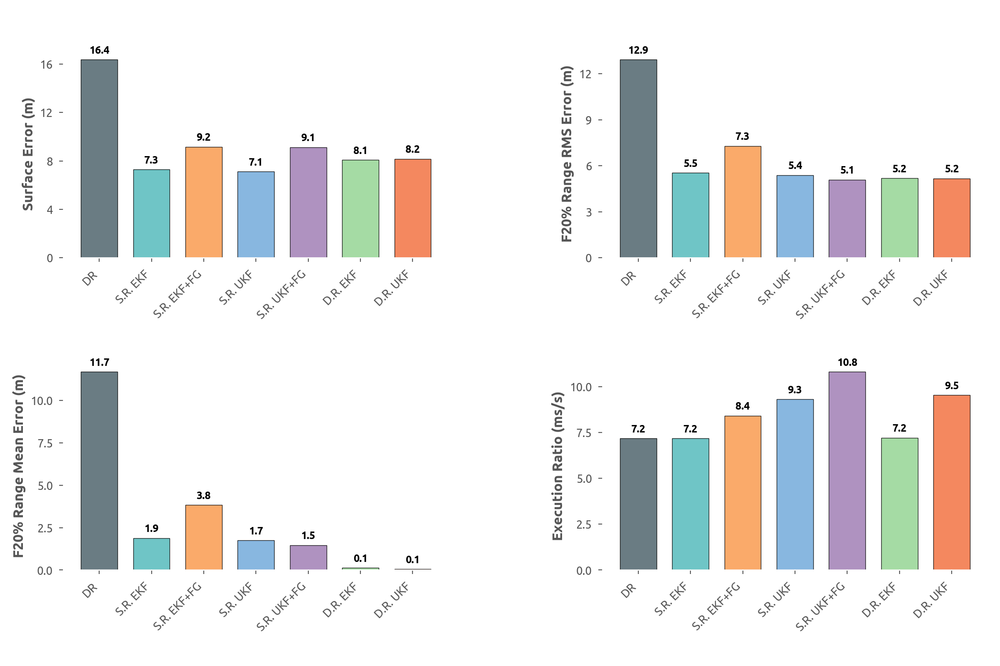

In [451]:
import matplotlib.pyplot as plt
import numpy as np
import os
from matplotlib.ticker import MaxNLocator
from matplotlib import rc

# Create directory for saving outputs
os.makedirs('underwater_navigation_analysis/final_results', exist_ok=True)

# Set Ubuntu font properly
rc('font', family='Ubuntu')

# Set publication-quality styling
plt.style.use('seaborn-v0_8-paper')
plt.rcParams['font.size'] = 10
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['figure.titlesize'] = 14

# Custom color theme
theme_colors = {
    'teal': '#5FBFC0',         # Light teal
    'orange': '#FAA15A',       # Orange
    'green': '#9BD79A',        # Light green
    'dark_gray': '#5A6E76',    # Dark gray
    'gray_teal': '#6D9898',    # Gray teal
    'tangerine': '#F37B4D',    # Tangerine
    'light_teal': '#B3FEFE',   # Very light teal
    'light_gray': '#F5F5F5',   # **Lighter gray, but not used now**
    'light_yellow': '#FFEBB0', # Light yellow
    'navy': '#789ABC',         # Navy blue
    'soft_purple': '#A786BA',  # Soft purple
    'soft_blue': '#7BB0DD'     # Soft blue
}

# Select results corresponding to DR and all filters with anchors [2,6,9]
configurations = {
    'DR': 'EKF_singlerange_DVL_anchors_2_6_9',
    'S.R. EKF': 'EKF_singlerange_DVL_anchors_2_6_9',
    'S.R. EKF+FG': 'EKF_singlerange_DVL_FG_anchors_2_6_9',
    'S.R. UKF': 'UKF_singlerange_DVL_anchors_2_6_9',
    'S.R. UKF+FG': 'UKF_singlerange_DVL_FG_anchors_2_6_9',
    'D.R. EKF': 'EKF_doublerange_DVL_anchors_2_6_9',
    'D.R. UKF': 'UKF_doublerange_DVL_anchors_2_6_9'
}

# Extract relevant results
filtered_results = {key: results_data[value] for key, value in configurations.items()}

# Metrics to plot, with Y-axis labels
metrics_to_plot = [
    ('nav_surface_error', 'ekf_surface_error', 'Surface Error (m)'),
    ('nav_range_rms', 'ekf_range_rms', 'F20% Range RMS Error (m)'),
    ('nav_range_mean', 'ekf_range_mean', 'F20% Range Mean Error (m)'),
    ('execution_ratio_ms_per_sec', None, 'Execution Ratio (ms/s)')
]

# Create a grid for our metrics
num_metrics = len(metrics_to_plot)
fig, axes = plt.subplots(2, 2, figsize=(12, 8), facecolor='white')  # **PURE WHITE BACKGROUND**
axes = np.array(axes).flatten()

# Define colors (one for each filter)
filter_colors = [
    theme_colors['dark_gray'],   # DR
    theme_colors['teal'],        # S.R. EKF
    theme_colors['orange'],      # S.R. EKF+FG
    theme_colors['soft_blue'],   # S.R. UKF
    theme_colors['soft_purple'], # S.R. UKF+FG
    theme_colors['green'],       # D.R. EKF
    theme_colors['tangerine']    # D.R. UKF
]

# Process and plot metrics
for i, (nav_metric, filter_metric, ylabel) in enumerate(metrics_to_plot):
    ax = axes[i]
    ax.set_facecolor('white')  # **Set subplot background to pure white**

    bars_to_plot = []
    
    # Extract values for each configuration
    for j, (name, config_name) in enumerate(configurations.items()):
        avg_metrics = filtered_results[name]['avg_metrics']
        
        if name == 'DR':
            value = avg_metrics[nav_metric]  # DR value
        else:
            value = avg_metrics[filter_metric] if filter_metric else avg_metrics[nav_metric]

        bars_to_plot.append((name, value, filter_colors[j]))
    
    # Plot the bars
    x_pos = np.arange(len(bars_to_plot))
    labels = [b[0] for b in bars_to_plot]
    values = [b[1] for b in bars_to_plot]
    colors = [b[2] for b in bars_to_plot]

    bar_plot = ax.bar(x_pos, values, 0.7, color=colors, edgecolor='black', linewidth=0.5, alpha=0.9)

    # Add value labels
    for j, v in enumerate(values):
        ax.text(j, v + max(values) * 0.02, f'{v:.1f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

    # Customize axes
    ax.set_ylabel(ylabel, fontsize=12, fontweight='bold')  # **Larger and bold Y-labels**
    ax.set_xticks(x_pos)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.yaxis.set_major_locator(MaxNLocator(nbins=5))

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    # Set y-limit to start from 0
    ax.set_ylim(bottom=0)

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.subplots_adjust(wspace=0.4, hspace=0.5)  # Increased spacing

# Save the plot without a title
plot_path = 'underwater_navigation_analysis/final_results/navigation_comparison_all_filters.png'
plt.savefig(plot_path, dpi=300, bbox_inches='tight')
print(f"Saved plot to {plot_path}")

plt.show()


In [452]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm, colors

def plot_mission_filter_analysis(all_processed_data):
    """
    For each filter configuration, each mission, and each seascout log,
    produce a single figure with:
      1) XY trajectory plot (show NAV solution in black, filter solution as scatter with time-based coloring,
         FG smoothed solution in red if available)
      2) X(t) for the three solutions (same color scheme!)
      3) Y(t) for the three solutions (same color scheme!)
      4) Range innovations vs time (scatter, color-coded by anchor_id if available)
      5) Observability Gramian measure (if available) vs time
    And save each figure into 'mission_filter_analysis_plots/' as a high-resolution PNG.

    - All subplots share the same color legend for the lines so that they match.
    - We remove FG in-situ references from time subplots to keep the "FG Smoothed" line consistent.
    """

    # Create output directory if it doesn't exist
    out_dir = "mission_filter_analysis_plots"
    os.makedirs(out_dir, exist_ok=True)

    # Basic style
    plt.rcParams.update({
        'font.family': 'serif',
        'font.size': 7,
        'axes.labelsize': 7,
        'axes.titlesize': 8,
        'xtick.labelsize': 6,
        'ytick.labelsize': 6,
        'legend.fontsize': 6,
        'figure.dpi': 200,
        'lines.linewidth': 1.0
    })

    for config_name, mission_dict in all_processed_data.items():
        # Skip dictionary entries like 'mission_errors'
        if not isinstance(mission_dict, dict):
            continue
        
        for mission_key, seascout_dict in mission_dict.items():
            if mission_key == 'mission_errors' or not isinstance(seascout_dict, dict):
                continue

            for seascout_key, results in seascout_dict.items():
                # ------------------------------------------------------
                # Create a figure with a "taller" first row (the trajectory).
                # We'll do 5 rows total using gridspec, with top row double height.
                fig = plt.figure(figsize=(9, 10))
                gs = plt.GridSpec(nrows=5, ncols=1,
                                  height_ratios=[2.0, 1.0, 1.0, 1.0, 1.0],
                                  hspace=0.3)
                
                ax_traj        = fig.add_subplot(gs[0, 0])  # First (taller) row
                ax_x           = fig.add_subplot(gs[1, 0])
                ax_y           = fig.add_subplot(gs[2, 0])
                ax_range_innov = fig.add_subplot(gs[3, 0])
                ax_observ      = fig.add_subplot(gs[4, 0])

                # --- 1) XY Trajectory (top) ---
                ax_traj.set_title(f"Mission: {mission_key}, Log: {seascout_key}, Config: {config_name}")

                # Variables to store each line's data
                nav_times = None
                nav_x = None
                nav_y = None

                filter_xy = None
                filter_times = None

                fg_smooth_xy = None
                fg_smooth_times = None

                # 1a) Plot NAV solution in black (XY)
                if 'filtered_data' in results:
                    fd = results['filtered_data']
                    if ('var_source' in fd.columns and
                        'NAV_X' in fd.columns and
                        'NAV_Y' in fd.columns):
                        nav_mask = (fd['var_source'] == 'NODE_REPORT')
                        if nav_mask.any():
                            nav_times = fd.loc[nav_mask, 't_mission'].to_numpy()
                            nav_x     = fd.loc[nav_mask, 'NAV_X'].to_numpy()
                            nav_y     = fd.loc[nav_mask, 'NAV_Y'].to_numpy()
                            ax_traj.plot(nav_x, nav_y, 'k-', label='NAV Solution', alpha=0.9)
                            
                            # Add start point as a star
                            if len(nav_x) > 0:
                                ax_traj.plot(nav_x[0], nav_y[0], 'g*', markersize=12, 
                                             label='Start Point', alpha=0.9)

                # 1b) Plot Filter solution (EKF/UKF) as scatter with time-based coloring
                if ('states' in results and
                    len(results['states']) > 0 and
                    'times' in results and
                    len(results['times']) == len(results['states'])):
                    filter_xy = results['states'][:, 0:2]
                    filter_times = results['times']
                    
                    # Create a colormap based on time
                    norm = plt.Normalize(filter_times.min(), filter_times.max())
                    time_colors = cm.viridis(norm(filter_times))
                    
                    # Create scatter plot with time-based coloring
                    scatter = ax_traj.scatter(filter_xy[:,0], filter_xy[:,1],
                                             c=filter_times, cmap='viridis', 
                                             s=15, alpha=0.8, marker='o',
                                             label='Filter Solution')
                    
                    # Add colorbar
                    cbar = plt.colorbar(scatter, ax=ax_traj, pad=0.01, fraction=0.05)
                    cbar.set_label('Time (s)', size=7)
                    cbar.ax.tick_params(labelsize=6)

                # 1c) Plot FG smoothed solution in red (XY)
                if (results.get('config', {}).use_factor_graph and
                    'fg_continuous_smoothed_states' in results and
                    len(results['fg_continuous_smoothed_states']) > 0):
                    fg_smooth_xy = results['fg_continuous_smoothed_states'][:, 0:2]
                    # If times are stored:
                    if 'fg_continuous_smoothed_times' in results and len(results['fg_continuous_smoothed_times']) == len(fg_smooth_xy):
                        fg_smooth_times = results['fg_continuous_smoothed_times']
                    else:
                        fg_smooth_times = None  # no matching time array

                    ax_traj.plot(fg_smooth_xy[:,0], fg_smooth_xy[:,1],
                                 color='red', label='FG Smoothed', alpha=0.9, linestyle='-')

                # Access surface point from the time_bounds dictionary (based on your data structure)
                # For this, we assume time_bounds is available from the results 
                # or is a global variable in the scope where this function is called
                if 'bounds' in results:
                    bounds = results['bounds']
                    if 'surface_x' in bounds and 'surface_y' in bounds:
                        surface_x = bounds['surface_x']
                        surface_y = bounds['surface_y'] 
                        ax_traj.plot(surface_x, surface_y, 'm*', markersize=12, 
                                    label='Surface Point', alpha=0.9)
                
                # Alternative approach if bounds is directly in the time_bounds dictionary
                # This assumes time_bounds is accessible in this function
                if 'time_bounds' in globals():
                    time_bounds = globals()['time_bounds']
                    if mission_key in time_bounds and seascout_key in time_bounds[mission_key]:
                        bounds = time_bounds[mission_key][seascout_key]
                        if 'surface_x' in bounds and 'surface_y' in bounds:
                            surface_x = bounds['surface_x']
                            surface_y = bounds['surface_y']
                            ax_traj.plot(surface_x, surface_y, 'm*', markersize=12, 
                                        label='Surface Point', alpha=0.9)
                
                # Format the XY subplot
                ax_traj.set_aspect('equal', 'box')
                ax_traj.set_xlabel('X (m)')
                ax_traj.set_ylabel('Y (m)')
                ax_traj.grid(True, linestyle='--', alpha=0.3)
                ax_traj.legend(loc='best', fontsize=6)

                # --- 2) X(t) Subplot ---
                time_values = []  # to unify x-limits later

                # Plot NAV in black
                if nav_times is not None and nav_x is not None and len(nav_times) == len(nav_x):
                    ax_x.plot(nav_times, nav_x, 'k-', label='NAV')
                    time_values.extend(nav_times)

                # Plot Filter (EKF/UKF) as scatter with time-based coloring
                if filter_xy is not None and filter_times is not None:
                    # Create scatter with the same colormap
                    scatter_x = ax_x.scatter(filter_times, filter_xy[:,0], 
                                           c=filter_times, cmap='viridis',
                                           s=10, alpha=0.8, marker='o')
                    time_values.extend(filter_times)

                # Plot FG smoothed in red
                if fg_smooth_xy is not None and fg_smooth_times is not None:
                    ax_x.plot(fg_smooth_times, fg_smooth_xy[:,0], color='red', label='FG Smoothed')
                    time_values.extend(fg_smooth_times)

                ax_x.set_ylabel('X pos (m)')
                ax_x.grid(True, linestyle='--', alpha=0.3)

                # --- 3) Y(t) Subplot ---
                # Plot NAV in black
                if nav_times is not None and nav_y is not None and len(nav_times) == len(nav_y):
                    ax_y.plot(nav_times, nav_y, 'k-', label='NAV')
                    time_values.extend(nav_times)

                # Plot Filter as scatter with time-based coloring
                if filter_xy is not None and filter_times is not None:
                    # Create scatter with the same colormap
                    scatter_y = ax_y.scatter(filter_times, filter_xy[:,1], 
                                           c=filter_times, cmap='viridis',
                                           s=10, alpha=0.8, marker='o')
                    time_values.extend(filter_times)

                # Plot FG smoothed in red
                if fg_smooth_xy is not None and fg_smooth_times is not None:
                    ax_y.plot(fg_smooth_times, fg_smooth_xy[:,1], color='red', label='FG Smoothed')
                    time_values.extend(fg_smooth_times)

                ax_y.set_ylabel('Y pos (m)')
                ax_y.grid(True, linestyle='--', alpha=0.3)

                # --- 4) Range Innovations (Scatter) ---
                if ('range_innovations' in results and
                    len(results['range_innovations']) > 0 and
                    'range_update_times' in results and
                    len(results['range_update_times']) == len(results['range_innovations'])):

                    rinv = results['range_innovations']
                    rt   = results['range_update_times']
                    time_values.extend(rt)

                    # If there's anchor_ids_range of matching length, color-code by anchor
                    if ('anchor_ids_range' in results and
                        len(results['anchor_ids_range']) == len(rt)):
                        anchor_ids_used = results['anchor_ids_range']
                        unique_anchors = []
                        
                        # Process anchor_ids to handle both single and tuple (double range) formats
                        processed_anchor_ids = []
                        for aid in anchor_ids_used:
                            if isinstance(aid, (list, tuple, np.ndarray)):
                                # For double range measurements, create a synthetic ID
                                unique_id = f"({aid[0]},{aid[1]})"
                                processed_anchor_ids.append(unique_id)
                                if unique_id not in unique_anchors:
                                    unique_anchors.append(unique_id)
                            else:
                                processed_anchor_ids.append(aid)
                                if aid not in unique_anchors:
                                    unique_anchors.append(aid)
                        
                        # For double range measurements, take the norm of the innovation
                        processed_innovations = []
                        for i, aid in enumerate(anchor_ids_used):
                            if isinstance(aid, (list, tuple, np.ndarray)):
                                # If it's a double range, the innovation is already the norm or should be computed
                                if isinstance(rinv[i], (list, tuple, np.ndarray)) and len(rinv[i]) > 1:
                                    # Compute norm of the innovation vector
                                    processed_innovations.append(np.linalg.norm(rinv[i]))
                                else:
                                    processed_innovations.append(rinv[i])
                            else:
                                processed_innovations.append(rinv[i])
                                
                        cmap = cm.get_cmap('rainbow', len(unique_anchors))
                        
                        for i, anchor in enumerate(unique_anchors):
                            mask = np.array(processed_anchor_ids) == anchor
                            anchor_innovations = np.array(processed_innovations)[mask]
                            anchor_times = np.array(rt)[mask]
                            
                            ax_range_innov.scatter(anchor_times, anchor_innovations,
                                                  color=cmap(i), marker='o',
                                                  edgecolors='none', s=10, alpha=0.8,
                                                  label=f'Anchor {anchor}')
                    else:
                        # Handle single color scatter if no anchor ID data
                        ax_range_innov.scatter(rt, rinv, marker='o', edgecolors='none',
                                               color='m', alpha=0.8, s=10,
                                               label='Range Innovations')

                    ax_range_innov.set_ylabel('Range Innov (m)')
                    ax_range_innov.grid(True, linestyle='--', alpha=0.3)
                    ax_range_innov.set_xlabel('Time (s)')
                    ax_range_innov.legend(loc='best', fontsize=6)
                else:
                    ax_range_innov.text(0.5, 0.5, 'No range innovations found',
                                        transform=ax_range_innov.transAxes,
                                        ha='center', va='center', color='gray')

                # --- 5) Observability Gramian ---
                ax_observ.set_facecolor('#eeeeee')
                ax_observ.grid(True, linestyle='--', alpha=0.3)
                ax_observ.set_title('Local Observability Measure', fontsize=8)

                if 'observability_results' in results:
                    obs_results = results['observability_results']
                    obs_times   = obs_results.get('times', None)
                    eigenvals   = obs_results.get('eigenvalues', None)
                    if (obs_times is not None and
                        eigenvals is not None and
                        len(obs_times) == len(eigenvals)):

                        time_values.extend(obs_times)

                        det_vals   = []
                        sqrt_eigs1 = []
                        sqrt_eigs2 = []
                        for ev_pair in eigenvals:
                            if len(ev_pair) == 2:
                                det_vals.append(np.sqrt(ev_pair[0] * ev_pair[1]))
                                sqrt_eigs1.append(np.sqrt(ev_pair[0]))
                                sqrt_eigs2.append(np.sqrt(ev_pair[1]))
                            else:
                                det_vals.append(0)
                                sqrt_eigs1.append(0)
                                sqrt_eigs2.append(0)

                        det_vals   = np.array(det_vals)
                        sqrt_eigs1 = np.array(sqrt_eigs1)
                        sqrt_eigs2 = np.array(sqrt_eigs2)

                        ax_observ.plot(obs_times, det_vals,   'r-', label='√det(Wo)')
                        ax_observ.plot(obs_times, sqrt_eigs1, 'b--', label='√λ1')
                        ax_observ.plot(obs_times, sqrt_eigs2, 'g--', label='√λ2')
                        ax_observ.set_ylabel('sqrt(det(Wo))')
                        ax_observ.legend(loc='best', fontsize=6)
                    else:
                        ax_observ.text(0.5, 0.5, 'Observability data mismatch',
                                       transform=ax_observ.transAxes,
                                       ha='center', va='center', color='red')
                else:
                    ax_observ.text(0.5, 0.5, 'No observability results found',
                                   transform=ax_observ.transAxes,
                                   ha='center', va='center', color='gray')

                # ------------------------------------------------------
                # Now unify x-limits for the bottom 4 subplots:
                if len(time_values) > 0:
                    t_min = np.min(time_values)
                    t_max = np.max(time_values)
                    ax_x.set_xlim([t_min, t_max])
                    ax_y.set_xlim([t_min, t_max])
                    ax_range_innov.set_xlim([t_min, t_max])
                    ax_observ.set_xlim([t_min, t_max])

                # Add a common legend for the time plots (X and Y)
                handles, labels = ax_traj.get_legend_handles_labels()
                if filter_xy is not None:
                    # Create a proxy artist for the scatter plot
                    scatter_proxy = plt.Line2D([0], [0], marker='o', color='w', 
                                             markerfacecolor=cm.viridis(0.5), 
                                             markersize=8, label='Filter Solution')
                    handles.append(scatter_proxy)
                    ax_x.legend(handles=handles, loc='best', fontsize=6)
                    ax_y.legend(handles=handles, loc='best', fontsize=6)
                
                fig.tight_layout()
                out_fname = f"{config_name}_{mission_key}_{seascout_key}.png"
                out_path = os.path.join(out_dir, out_fname)
                plt.savefig(out_path, dpi=300)
                plt.close(fig)

    print("All plots generated and saved in 'mission_filter_analysis_plots/'")


plot_mission_filter_analysis(all_processed_data)

/var/folders/wq/lgvqksf10xb62xqfqxf1_fcc0000gq/T/ipykernel_2419/3729571234.py:251: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('rainbow', len(unique_anchors))
/var/folders/wq/lgvqksf10xb62xqfqxf1_fcc0000gq/T/ipykernel_2419/3729571234.py:297: RuntimeWarning: invalid value encountered in sqrt
  det_vals.append(np.sqrt(ev_pair[0] * ev_pair[1]))
/var/folders/wq/lgvqksf10xb62xqfqxf1_fcc0000gq/T/ipykernel_2419/3729571234.py:298: RuntimeWarning: invalid value encountered in sqrt
  sqrt_eigs1.append(np.sqrt(ev_pair[0]))
/var/folders/wq/lgvqksf10xb62xqfqxf1_fcc0000gq/T/ipykernel_2419/3729571234.py:344: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


All plots generated and saved in 'mission_filter_analysis_plots/'


In [456]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib.patches as patches
from typing import Dict, List, Optional, Union, Tuple

# Colors from the provided palette with some soft mesa colors added
theme_colors = {
    'teal': '#5FBFC0',         # Light teal
    'orange': '#FAA15A',       # Orange
    'green': '#9BD79A',        # Light green
    'dark_gray': '#5A6E76',    # Dark gray
    'gray_teal': '#6D9898',    # Gray teal
    'tangerine': '#F37B4D',    # Tangerine
    'light_teal': '#B3FEFE',   # Very light teal
    'light_gray': '#EAEAEA',   # Light gray
    'light_yellow': '#FFEBB0', # Light yellow
    'navy': '#789ABC',         # Navy blue
    'soft_purple': '#A786BA',  # Soft purple
    'soft_blue': '#7BB0DD'     # Soft blue
}


# Human-readable filter names
filter_display_names = {
    'EKF_singlerange_DVL': 'Single Range\nEKF',
    'EKF_singlerange_DVL_FG': 'Factor Graph\nBoosted EKF',
    'UKF_singlerange_DVL': 'Single Range\nUKF',
    'UKF_singlerange_DVL_FG': 'Factor Graph\nBoosted UKF',
    'EKF_doublerange_DVL': 'Double Range\nEKF',
    'UKF_doublerange_DVL': 'Double Range\nUKF'
}
    
def filter_missions(all_processed_data, exclude_missions):
    """Filter out missions that should be excluded from analysis."""
    filtered_data = {}
    
    for config_name, mission_dict in all_processed_data.items():
        filtered_data[config_name] = {}
        
        # Add special keys like 'mission_errors' directly
        for key in mission_dict:
            if not isinstance(mission_dict[key], dict):
                filtered_data[config_name][key] = mission_dict[key]
        
        # Add mission data if not excluded
        for mission_key, seascout_dict in mission_dict.items():
            if not isinstance(seascout_dict, dict):
                continue
                
            # Skip excluded missions
            if any(exclude_pattern in mission_key for exclude_pattern in exclude_missions):
                print(f"Excluding mission: {mission_key}")
                continue
                
            filtered_data[config_name][mission_key] = seascout_dict
    
    return filtered_data

def plot_range_errors_over_time(filtered_data, output_dir):
    """Plot range errors over time for different missions and filter configurations."""
    range_error_dir = os.path.join(output_dir, "range_errors")
    os.makedirs(range_error_dir, exist_ok=True)
    
    # Get all missions and configurations
    all_missions = set()
    all_configs = list(filtered_data.keys())
    
    for config_name, mission_dict in filtered_data.items():
        for mission_key in mission_dict:
            if isinstance(mission_dict[mission_key], dict) and mission_key != 'mission_errors':
                all_missions.add(mission_key)
    
    all_missions = sorted(list(all_missions))
    print(f"Creating range error plots for {len(all_missions)} missions: {all_missions}")
    print(f"Filter configurations: {all_configs}")
    
    # Create subplot grid - one row per filter config, one column per mission
    n_missions = len(all_missions)
    n_configs = len(all_configs)
    
    # Control figure size - more compact
    fig_width = min(3.5 * n_missions, 14)
    fig_height = min(2.8 * n_configs, 11)
    
    fig = plt.figure(figsize=(fig_width, fig_height))
    
    # Get shortened mission names for titles
    mission_short_names = []
    for mission_key in all_missions:
        parts = mission_key.split('-')
        if len(parts) >= 2:
            # Use the "SOUR-MYLO" format (last two parts without _cv7)
            short_name = f"{parts[-2]}-{parts[-1].replace('_cv7', '')}"
        else:
            short_name = mission_key.replace('_cv7', '')
        mission_short_names.append(short_name)
    
    # Create GridSpec with tighter spacing
    gs = plt.GridSpec(n_configs, n_missions, figure=fig, hspace=0.1, wspace=0.05)
    
    # Create legend elements 
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor=theme_colors['soft_blue'], 
               markeredgecolor='black', markersize=8, label='DR'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor=theme_colors['soft_purple'], 
               markeredgecolor='black', markersize=8, label='Filter'),
        Line2D([0], [0], color=theme_colors['green'], linewidth=2, label='Mean'),
        Line2D([0], [0], color=theme_colors['tangerine'], linestyle='--', linewidth=1.5, label='F20% Line')
    ]
    
    # Add a legend outside the plot area
    leg = fig.legend(handles=legend_elements, 
              loc='lower center', ncol=4, 
              fontsize=10, frameon=True, 
              bbox_to_anchor=(0.5, 0.01))
    leg.set_zorder(100)  # Ensure legend is on top
    
    # Plot each combination of mission and filter configuration
    for i, config_name in enumerate(all_configs):
        for j, mission_key in enumerate(all_missions):
            ax = fig.add_subplot(gs[i, j])
            
            # Add mission name as title only to first row
            if i == 0:
                ax.set_title(mission_short_names[j], fontsize=12, pad=5)
            
            # Use right axis for range error ticks
            if j == n_missions-1:
                ax_right = ax.twinx()
                ax_right.set_ylim(-30, 30)
                ax_right.set_ylabel('Range Error (m)', fontsize=10)
                ax_right.tick_params(axis='y', rotation=45)
            
            if mission_key in filtered_data[config_name]:
                mission_data = filtered_data[config_name][mission_key]
                
                for seascout_key, results in mission_data.items():
                    if not isinstance(results, dict):
                        continue
                        
                    # Plot range innovations over time
                    if 'range_innovations' in results and 'range_update_times' in results:
                        times = results['range_update_times']
                        innovations = results['range_innovations']  # Preserving sign for mean calculation
                        
                        # Calculate 80% time mark for F20
                        if len(times) > 0:
                            eighty_percent_idx = int(0.8 * len(times))
                            eighty_percent_time = times[eighty_percent_idx] if eighty_percent_idx < len(times) else times[-1]
                            
                            # Add light red background to the right of the 80% line
                            t_min, t_max = ax.get_xlim() if len(ax.get_lines()) > 0 else (times[0], times[-1])
                            rect = patches.Rectangle((eighty_percent_time, -30), t_max-eighty_percent_time, 60, 
                                                   color='#FFDDDD', alpha=0.3, zorder=0)
                            ax.add_patch(rect)
                            
                            # Draw vertical line at 80% time mark - bolder
                            ax.axvline(x=eighty_percent_time, color=theme_colors['tangerine'], 
                                      linestyle='--', alpha=0.9, linewidth=1.5, zorder=1)
                            
                            # Calculate mean and STD for last 20% of innovations
                            last_20_percent_innovations = innovations[eighty_percent_idx:]
                            if len(last_20_percent_innovations) > 0:
                                # Handle both single and double range cases
                                if isinstance(last_20_percent_innovations[0], (list, np.ndarray)):
                                    # For double range: Flatten the innovations for mean/std calculation
                                    flat_innovations = []
                                    for inno in last_20_percent_innovations:
                                        flat_innovations.extend(inno)
                                    mean_innovation = np.mean(flat_innovations)
                                    std_innovation = np.std(flat_innovations)
                                else:
                                    mean_innovation = np.mean(last_20_percent_innovations)
                                    std_innovation = np.std(last_20_percent_innovations)
                                
                                # Plot mean line
                                ax.axhline(y=mean_innovation, color=theme_colors['green'], 
                                          linestyle='-', alpha=0.9, linewidth=2, zorder=4)
                                
                                # Add smaller, more compact F20% text with higher zorder
                                ax.text(0.05, 0.07, f"Mean: {mean_innovation:.1f}m\nSTD: {std_innovation:.1f}m", 
                                       transform=ax.transAxes, fontsize=6, fontweight='bold', 
                                       ha='left', va='bottom', bbox=dict(facecolor='white', alpha=0.8, pad=1, boxstyle='round'),
                                       zorder=30)  # Very high zorder to ensure visibility
                        
                        # Plot DR range errors if available (FIRST, to be behind filter data)
                        if 'nav_range_errors' in results:
                            dr_times = results['range_update_times']
                            dr_errors = results['nav_range_errors']
                            
                            # Use blue circles with black edge for DR range errors
                            ax.scatter(dr_times, dr_errors, marker='o', color=theme_colors['soft_blue'], s=18,
                                      alpha=0.6, edgecolors='black', linewidths=0.5, zorder=2)
                        
                        # Plot filter range innovations handling double range measurements:
                        if isinstance(innovations[0], (list, np.ndarray)):
                            # For double range: explicitly handle each beacon separately
                            for beacon_idx in range(2):  # Assuming 2 beacons
                                # Extract the innovations for this beacon
                                beacon_innovations = [inno[beacon_idx] if beacon_idx < len(inno) else np.nan 
                                                    for inno in innovations]
                                
                                # Create a matching time array (same length, exclude NaNs)
                                beacon_times = []
                                filtered_innovations = []
                                for t, inno in zip(times, beacon_innovations):
                                    if not np.isnan(inno):
                                        beacon_times.append(t)
                                        filtered_innovations.append(inno)
                                
                                # Use different markers for each beacon
                                marker = 'o' if beacon_idx == 0 else 's'
                                ax.scatter(beacon_times, filtered_innovations, marker=marker, 
                                          color=theme_colors['soft_purple'], s=18, alpha=0.8, 
                                          edgecolors='black', linewidths=0.5, zorder=3)
                        else:
                            ax.scatter(times, innovations, marker='o', color=theme_colors['soft_purple'],
                                       s=18, alpha=0.8, edgecolors='black', linewidths=0.5, zorder=3)
                
                # Only show filter name on leftmost column with reduced padding
                if j == 0:
                    display_name = filter_display_names.get(config_name, config_name)
                    # Multi-line display name for better spacing
                    ax.set_ylabel(display_name, fontsize=11, fontweight='bold', labelpad=8)
                
                ax.set_xlabel("Time (s)" if i == n_configs-1 else "", fontsize=10)
                ax.grid(True, linestyle='--', alpha=0.3)
                
                # Set y-limits to -30 to 30 meters as requested
                ax.set_ylim(-30, 30)
                
                # 45-degree tick marks for Y axis
                ax.tick_params(axis='y', rotation=45)
                
                # Remove tick labels for inner plots to reduce clutter
                if j > 0:
                    ax.set_yticklabels([])
                if i < n_configs-1:
                    ax.set_xticklabels([])
            else:
                ax.text(0.5, 0.5, f"No data", 
                        ha='center', va='center', transform=ax.transAxes, 
                        fontsize=9, color='gray')
    
    # No suptitle to save space
    
    # Adjust layout to have more space at bottom for legend and less at the top
    plt.tight_layout(rect=[0.03, 0.05, 0.97, 0.95])
    plt.savefig(os.path.join(range_error_dir, "range_errors_over_time.png"), dpi=300, bbox_inches='tight')
    plt.close(fig)
    
    print(f"Range error plot saved to {os.path.join(range_error_dir, 'range_errors_over_time.png')}")

def extract_surface_error_from_mission_errors(all_processed_data, filtered_data):
    """Extract surface error metrics directly from mission_errors."""
    metrics_by_filter = {}
    
    # Go through each filter configuration
    for config_name in filtered_data.keys():
        metrics_by_filter[config_name] = {}
        
        # Check if mission_errors exists
        if config_name in all_processed_data and 'mission_errors' in all_processed_data[config_name]:
            mission_errors = all_processed_data[config_name]['mission_errors']
            
            # Group metrics by mission
            mission_metrics = {}
            for error_key, errors in mission_errors.items():
                mission = errors.get('mission', '')
                
                # Skip excluded missions
                if any(exclude in mission for exclude in ["PUNY-CAIN", "SLIM-SHAG", "JIMS-ZEUS"]):
                    continue
                    
                # Extract the mission name part
                mission_parts = mission.split('-')
                if len(mission_parts) >= 2:
                    mission_short = f"{mission_parts[-2]}-{mission_parts[-1].replace('_cv7', '')}"
                else:
                    mission_short = mission.replace('_cv7', '')
                
                if mission_short not in mission_metrics:
                    mission_metrics[mission_short] = {
                        'surface_error_filter': 0,
                        'surface_error_dr': 0,
                        'f20_range_mean_filter': 0,
                        'f20_range_mean_dr': 0,
                        'f20_range_rms_filter': 0,
                        'f20_range_rms_dr': 0,
                        'f20_range_std_filter': 0,
                        'f20_range_std_dr': 0,
                        'count': 0
                    }
                
                # Add metrics from this seascout log
                mission_metrics[mission_short]['surface_error_filter'] += errors.get('ekf_surface_error', 0)
                mission_metrics[mission_short]['surface_error_dr'] += errors.get('nav_surface_error', 0)
                
                # For range metrics, we can use the F10% metrics directly, though they're labeled differently
                mission_metrics[mission_short]['f20_range_mean_filter'] += errors.get('ekf_range_mean', 0)
                mission_metrics[mission_short]['f20_range_mean_dr'] += errors.get('nav_range_mean', 0)
                mission_metrics[mission_short]['f20_range_rms_filter'] += errors.get('ekf_range_rms', 0)
                mission_metrics[mission_short]['f20_range_rms_dr'] += errors.get('nav_range_rms', 0)
                mission_metrics[mission_short]['f20_range_std_filter'] += errors.get('ekf_range_std', 0)
                mission_metrics[mission_short]['f20_range_std_dr'] += errors.get('nav_range_std', 0)
                
                mission_metrics[mission_short]['count'] += 1
            
            # Average metrics if there are multiple seascout logs per mission
            for mission_name, metrics in mission_metrics.items():
                if metrics['count'] > 0:
                    for metric in metrics:
                        if metric != 'count':
                            metrics[metric] /= metrics['count']
                
                # Store the averaged metrics without the count field
                metrics_copy = {k: v for k, v in metrics.items() if k != 'count'}
                metrics_by_filter[config_name][mission_name] = metrics_copy
            
    return metrics_by_filter

def plot_dr_row(ax, metrics_by_filter, all_mission_names, mission_colors, metrics_to_plot):
    """Plot the Dead Reckoning row with data from all filters."""
    # Define x positions
    x = np.arange(len(metrics_to_plot))
    
    # Collect DR data for each mission across all filters
    mission_dr_data = {}
    
    for filter_name, mission_metrics in metrics_by_filter.items():
        for mission, metrics in mission_metrics.items():
            if mission not in mission_dr_data:
                mission_dr_data[mission] = []
                
            mission_dr_values = [metrics[m[1]] for m in metrics_to_plot]
            
            # If first value, initialize; otherwise average with existing
            if not mission_dr_data[mission]:
                mission_dr_data[mission] = mission_dr_values
            else:
                # Average with existing values (in case the same mission appears in multiple filters)
                mission_dr_data[mission] = [(a + b) / 2 for a, b in zip(mission_dr_data[mission], mission_dr_values)]
    
    # Set up bar width based on number of missions
    n_missions = len(mission_dr_data)
    width = 0.8 / (n_missions + 1)  # +1 for the mean
    
    # Calculate mean values across all missions for DR
    mission_names = list(mission_dr_data.keys())
    mean_dr_values = []
    
    for i in range(len(metrics_to_plot)):
        mean_dr = np.mean([mission_dr_data[mission][i] for mission in mission_names])
        mean_dr_values.append(mean_dr)
    
    # Find min/max values to adjust y-axis
    all_values = []
    for mission_values in mission_dr_data.values():
        all_values.extend(mission_values)
    all_values.extend(mean_dr_values)
    
    # Allow negative values
    y_min = min(-10, min(all_values) * 1.1)
    y_max = max(10, max(all_values) * 1.2)
    
    # Plot bars for each mission
    for j, mission in enumerate(mission_names):
        # Use consistent color for this mission
        color = mission_colors.get(mission, list(theme_colors.values())[j % len(theme_colors)])
        
        # Apply hatched pattern for DR
        ax.bar(x + (j - n_missions/2) * width, mission_dr_data[mission], width*0.8, 
               label=f'{mission}', color=color, alpha=0.7, hatch='///')
        
        # Add value labels (only if significant)
        for k, value in enumerate(mission_dr_data[mission]):
            if abs(value) > 0.1:  # Only show labels for significant values
                ax.text(x[k] + (j - n_missions/2) * width, value + (0.02 * y_max if value >= 0 else -0.02 * y_max), 
                       f'{value:.1f}', ha='center', va='bottom' if value >= 0 else 'top', 
                       fontsize=7, rotation=90, zorder=10)  # Higher zorder
    
    # Plot mean values
    ax.bar(x + (n_missions/2) * width, mean_dr_values, width*0.8, 
           label='Me an', color=theme_colors['dark_gray'], alpha=0.7, hatch='///')
    
    # Add value labels for mean
    for k, value in enumerate(mean_dr_values):
        ax.text(x[k] + (n_missions/2) * width, value + (0.02 * y_max if value >= 0 else -0.02 * y_max), 
               f'{value:.1f}', ha='center', va='bottom' if value >= 0 else 'top',
               fontsize=8, fontweight='bold', rotation=90, zorder=10)  # Higher zorder
    
    # Customize the plot
    ax.set_ylim(y_min, y_max)  # Show negative values
    ax.set_xticks(x)
    ax.set_xticklabels([m[2] for m in metrics_to_plot], fontsize=9)
    ax.tick_params(axis='y', rotation=45)  # 45-degree y-axis tick labels
    
    # Add a horizontal line at y=0
    ax.axhline(y=0, color='black', linestyle='-', alpha=0.2, zorder=0)
    
    # Create a legend to explain the hatched pattern for DR
    hatch_patch = patches.Patch(facecolor='gray', alpha=0.7, hatch='///', label='Dead Reckoning')
    ax.legend(handles=[hatch_patch], loc='upper right', fontsize=8, frameon=False)
    
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)

def plot_combined_performance_metrics(metrics_by_filter, output_dir):
    """Create a combined figure with all filter metrics in rows plus DR on top."""
    performance_dir = os.path.join(output_dir, "performance_metrics")
    
    # Get list of filters with metrics
    filter_names = list(metrics_by_filter.keys())
    if not filter_names:
        print("No metrics available to create combined plot.")
        return
    
    # Create figure with one row per filter PLUS one for DR
    fig_height = 2.5 * (len(filter_names) + 1)
    fig = plt.figure(figsize=(10, fig_height))
    gs = gridspec.GridSpec(len(filter_names) + 1, 1, figure=fig, hspace=0.2)  # Tighter spacing
    
    # Define metrics to display
    metrics_to_plot = [
        ('surface_error_filter', 'surface_error_dr', 'Surface Error (m)'),
        ('f20_range_mean_filter', 'f20_range_mean_dr', 'F20% Range\nMean (m)'),  # Two-line titles
        ('f20_range_rms_filter', 'f20_range_rms_dr', 'F20% Range\nRMS (m)'),     # for better spacing
        ('f20_range_std_filter', 'f20_range_std_dr', 'F20% Range\nSTD (m)')
    ]
    
    # First get all mission names across all filters to ensure consistent colors
    all_mission_names = set()
    for filter_name in filter_names:
        mission_metrics = metrics_by_filter[filter_name]
        if mission_metrics:
            all_mission_names.update(mission_metrics.keys())
    all_mission_names = sorted(list(all_mission_names))
    
    # Assign consistent colors to missions
    mission_colors = {}
    for j, mission in enumerate(all_mission_names):
        mission_colors[mission] = list(theme_colors.values())[j % len(theme_colors)]
    
    # FIRST ROW: Plot DR row at the top
    ax_dr = fig.add_subplot(gs[0])
    
    # This row will contain DR data from all missions across all filters
    plot_dr_row(ax_dr, metrics_by_filter, all_mission_names, mission_colors, metrics_to_plot)
    ax_dr.set_ylabel('Dead Reckoning', fontsize=11, fontweight='bold', labelpad=8)
    
    # Add title to the figure 
    plt.suptitle('Performance Metrics Comparison Across Filter Types', 
                fontsize=16, y=0.98)
    
    # Plot each filter in its own row
    for i, filter_name in enumerate(filter_names):
        mission_metrics = metrics_by_filter[filter_name]
        if not mission_metrics:
            continue
            
        # Add +1 to i because we're starting from the second row (index 1)
        ax = fig.add_subplot(gs[i+1])
        
        # Define x positions
        x = np.arange(len(metrics_to_plot))
        
        # Set up bar width based on number of missions
        mission_names = list(mission_metrics.keys())
        n_missions = len(mission_names)
        width = 0.8 / (n_missions + 1)  # +1 for the mean
        
        # Calculate mean values across all missions for filter ONLY
        mean_filter_values = []
        
        for filter_metric, _, _ in metrics_to_plot:
            mean_filter = np.mean([mission_metrics[mission][filter_metric] for mission in mission_names])
            mean_filter_values.append(mean_filter)
        
        # Find min/max values to adjust y-axis (include only filter values now)
        all_values = []
        for mission in mission_names:
            all_values.extend([mission_metrics[mission][m[0]] for m in metrics_to_plot])
        all_values.extend(mean_filter_values)
        
        # Allow negative values
        y_min = min(-10, min(all_values) * 1.1)
        y_max = max(10, max(all_values) * 1.2)
        
        # Plot bars for each mission - FILTER ONLY (no DR hatches)
        for j, mission in enumerate(mission_names):
            # Get filter metrics for this mission
            mission_filter_data = [mission_metrics[mission][m[0]] for m in metrics_to_plot]
            
            # Use consistent color for this mission from the mission_colors dict
            color = mission_colors.get(mission, list(theme_colors.values())[j % len(theme_colors)])
            
            # Plot filter data
            ax.bar(x + (j - n_missions/2) * width, mission_filter_data, width*0.8, 
                   label=f'{mission}', color=color, alpha=0.9)
            
            # Add value labels for filter (only if significant) - with space and higher zorder
            for k, value in enumerate(mission_filter_data):
                if abs(value) > 0.1:  # Only show labels for significant values
                    ax.text(x[k] + (j - n_missions/2) * width, value + (0.02 * y_max if value >= 0 else -0.02 * y_max), 
                           f'{value:.1f}', ha='center', va='bottom' if value >= 0 else 'top', 
                           fontsize=7, rotation=90, zorder=10)
        
        # Plot mean values
        ax.bar(x + (n_missions/2) * width, mean_filter_values, width*0.8, 
               label='Mean', color=theme_colors['dark_gray'], alpha=0.9)
        
        # Add value labels for mean filter - with space and higher zorder
        for k, value in enumerate(mean_filter_values):
            ax.text(x[k] + (n_missions/2) * width, value + (0.02 * y_max if value >= 0 else -0.02 * y_max), 
                   f'{value:.1f}', ha='center', va='bottom' if value >= 0 else 'top',
                   fontsize=8, fontweight='bold', rotation=90, zorder=10)
        
        # Customize the plot
        display_name = filter_display_names.get(filter_name, filter_name)
        ax.set_ylabel(display_name, fontsize=11, fontweight='bold', labelpad=8)
        ax.set_ylim(y_min, y_max)  # Show negative values
        ax.set_xticks(x)
        ax.set_xticklabels([m[2] for m in metrics_to_plot], fontsize=9)
        ax.tick_params(axis='y', rotation=45)  # 45-degree y-axis tick labels
        
        # Add a horizontal line at y=0
        ax.axhline(y=0, color='black', linestyle='-', alpha=0.2, zorder=0)
        
        ax.grid(True, axis='y', linestyle='--', alpha=0.3)
    
    # Create a legend for mission names
    mission_handles = [patches.Patch(facecolor=mission_colors[mission], alpha=0.9, label=mission)
                      for mission in all_mission_names]
    mission_handles.append(patches.Patch(facecolor=theme_colors['dark_gray'], alpha=0.9, label='Mean'))
    
    # Legend placed outside the figure at the bottom but closer to plots
    ncol = min(5, len(all_mission_names) + 1)  # Adjust max column number
    fig.legend(handles=mission_handles, loc='lower center', 
              fontsize=8, ncol=ncol, frameon=True, 
              bbox_to_anchor=(0.5, 0.02))
    
    # Adjust layout with tighter spacing
    plt.tight_layout(rect=[0.03, 0.05, 0.97, 0.95])
    
    # Save combined figure
    file_path = os.path.join(performance_dir, "combined_metrics.png")
    plt.savefig(file_path, dpi=300, bbox_inches='tight')
    plt.close(fig)
    
    print(f"Combined performance metrics plot saved to {file_path}")

def plot_performance_metrics_by_filter(metrics_by_filter, output_dir):
    """Create one performance metrics plot for each filter configuration."""
    performance_dir = os.path.join(output_dir, "performance_metrics")
    os.makedirs(performance_dir, exist_ok=True)
    
    # Define metrics to display
    metrics_to_plot = [
        ('surface_error_filter', 'surface_error_dr', 'Surface Error (m)'),
        ('f20_range_mean_filter', 'f20_range_mean_dr', 'F20% Range\nMean (m)'),  # Two-line titles
        ('f20_range_rms_filter', 'f20_range_rms_dr', 'F20% Range\nRMS (m)'),     # for better spacing
        ('f20_range_std_filter', 'f20_range_std_dr', 'F20% Range\nSTD (m)')
    ]
    
    # Plot one figure per filter configuration
    for filter_name, mission_metrics in metrics_by_filter.items():
        if not mission_metrics:
            print(f"No metrics available for {filter_name}, skipping...")
            continue
        
        try:
            # More whitespace around plot
            fig, ax = plt.figure(figsize=(12, 7)), plt.gca()
            
            # Define x positions
            x = np.arange(len(metrics_to_plot))
            
            # Set up bar width based on number of missions
            mission_names = list(mission_metrics.keys())
            n_missions = len(mission_names)
            width = 0.8 / (n_missions + 1)  # +1 for the mean
            
            # Calculate mean values across all missions
            mean_filter_values = []
            mean_dr_values = []
            
            for filter_metric, dr_metric, _ in metrics_to_plot:
                mean_filter = np.mean([mission_metrics[mission][filter_metric] for mission in mission_names])
                mean_dr = np.mean([mission_metrics[mission][dr_metric] for mission in mission_names])
                mean_filter_values.append(mean_filter)
                mean_dr_values.append(mean_dr)
            
            # Find min/max values to adjust y-axis
            all_values = []
            for mission in mission_names:
                all_values.extend([mission_metrics[mission][m[0]] for m in metrics_to_plot])
                all_values.extend([mission_metrics[mission][m[1]] for m in metrics_to_plot])
            all_values.extend(mean_filter_values)
            all_values.extend(mean_dr_values)
            
            # Allow negative values
            y_min = min(-5, min(all_values) * 1.1)
            y_max = max(10, max(all_values) * 1.15)
            
            # Plot bars for each mission
            for i, mission in enumerate(mission_names):
                # Get filter and dr metrics for this mission
                mission_filter_data = [mission_metrics[mission][m[0]] for m in metrics_to_plot]
                mission_dr_data = [mission_metrics[mission][m[1]] for m in metrics_to_plot]
                
                # Choose colors for this mission - using consistent colors
                color = list(theme_colors.values())[i % len(theme_colors)]
                lighter_color = adjust_color_brightness(color, 1.3)
                
                # Plot bars for filter
                ax.bar(x + (i - n_missions/2) * width, mission_filter_data, width*0.8, 
                       label=f'{mission}', color=color, alpha=0.9)
                
                # Plot bars for DR with hatched pattern
                ax.bar(x + (i - n_missions/2) * width + width*0.4, mission_dr_data, width*0.4, 
                       color=lighter_color, alpha=0.7, hatch='///')
                
                # Add value labels for filter (only if significant) - with extra space and higher zorder
                for j, value in enumerate(mission_filter_data):
                    if abs(value) > 0.1:  # Only show labels for significant values
                        ax.text(x[j] + (i - n_missions/2) * width, value + (0.02 * y_max if value >= 0 else -0.02 * y_max), 
                               f' {value:.1f}', ha='center', va='bottom' if value >= 0 else 'top', 
                               fontsize=8, rotation=90, zorder=10)
                
                # Add value labels for DR in parentheses with higher zorder
                for j, value in enumerate(mission_dr_data):
                    if abs(value) > 0.1:  # Only show labels for significant values
                        ax.text(x[j] + (i - n_missions/2) * width + width*0.4, 
                               value + (0.02 * y_max if value >= 0 else -0.02 * y_max), 
                               f' ({value:.1f})', ha='center', va='bottom' if value >= 0 else 'top', 
                               fontsize=7, rotation=90, zorder=10)
            
            # Plot mean values
            ax.bar(x + (n_missions/2) * width, mean_filter_values, width*0.8, 
                   label='Mean', color=theme_colors['dark_gray'], alpha=0.9)
            ax.bar(x + (n_missions/2) * width + width*0.4, mean_dr_values, width*0.4, 
                   color=theme_colors['light_gray'], alpha=0.7, hatch='///')
            
            # Add value labels for mean filter - with extra space and higher zorder
            for j, value in enumerate(mean_filter_values):
                ax.text(x[j] + (n_missions/2) * width, value + (0.02 * y_max if value >= 0 else -0.02 * y_max), 
                       f' {value:.1f}', ha='center', va='bottom' if value >= 0 else 'top', 
                       fontsize=9, fontweight='bold', rotation=90, zorder=10)
            
            # Add value labels for mean DR in parentheses with higher zorder
            for j, value in enumerate(mean_dr_values):
                if abs(value) > 0.1:
                    ax.text(x[j] + (n_missions/2) * width + width*0.4, 
                           value + (0.02 * y_max if value >= 0 else -0.02 * y_max), 
                           f' ({value:.1f})', ha='center', va='bottom' if value >= 0 else 'top', 
                           fontsize=8, fontweight='bold', rotation=90, zorder=10)
            
            # Customize the plot
            display_name = filter_display_names.get(filter_name, filter_name).replace('\n', ' ')
            ax.set_ylabel('Value (m)', fontsize=12)
            ax.set_ylim(y_min, y_max)  # Show negative values
            ax.set_title(f'Performance Metrics: {display_name}', fontsize=14, fontweight='bold', pad=15)
            ax.set_xticks(x)
            ax.set_xticklabels([m[2] for m in metrics_to_plot], fontsize=11)
            ax.tick_params(axis='y', rotation=45)  # 45-degree y-axis tick labels
            
            # Add a horizontal line at y=0
            ax.axhline(y=0, color='black', linestyle='-', alpha=0.2, zorder=0)
            
            # Create comprehensive legends
            from matplotlib.patches import Patch
            
            # 1. Legend for mission colors
            mission_handles = []
            for i, mission in enumerate(mission_names):
                color = list(theme_colors.values())[i % len(theme_colors)]
                mission_handles.append(Patch(facecolor=color, alpha=0.9, label=mission))
            
            # 2. Add Mean to mission handles
            mission_handles.append(Patch(facecolor=theme_colors['dark_gray'], alpha=0.9, label='Mean'))
            
            # 3. Create pattern legend explaining hatched vs solid
            pattern_handles = [
                Patch(facecolor='gray', alpha=0.9, label='Filter'),
                Patch(facecolor='gray', alpha=0.7, hatch='///', label='Dead Reckoning')
            ]
            
            # Create a combined legend
            all_handles = mission_handles + pattern_handles
            
            # Calculate appropriate number of columns based on number of items
            num_items = len(all_handles)
            if num_items <= 4:
                ncol = num_items
            else:
                ncol = min(5, num_items)
            
            # Position legend in top right
            ax.legend(handles=all_handles, loc='upper right', fontsize=9, 
                     frameon=True, ncol=ncol)
            
            ax.grid(True, axis='y', linestyle='--', alpha=0.3)
            
            # Add whitespace around plot
            plt.tight_layout(pad=1.5)
            file_path = os.path.join(performance_dir, f"{filter_name}_metrics.png")
            plt.savefig(file_path, dpi=300, bbox_inches='tight')
            plt.close(fig)
            
            print(f"Performance metrics plot saved to {file_path}")
            
        except Exception as e:
            print(f"Error plotting performance metrics for {filter_name}: {str(e)}")
            plt.close('all')  # Make sure to close any open figures
    
    return metrics_by_filter

def print_metrics_summary(metrics_by_filter):
    """Print a tabular summary of metrics for each filter configuration."""
    for filter_name, mission_metrics in metrics_by_filter.items():
        display_name = filter_display_names.get(filter_name, filter_name).replace('\n', ' ')
        print(f"\nResults Summary for {display_name}:")
        print(f"{'='*120}")
        print(f"{'Mission':<15} {'Surface Errors':<35} {'Range Metrics (Final 20%)'}")
        print(f"{'-'*120}")
        print(f"{'':15} {'DR':^15} {'Filter':^15} {'DR RMS':^10} {'DR Mean':^10} {'DR STD':^10} {'Filter RMS':^10} {'Filter Mean':^10} {'Filter STD':^10}")
        print(f"{'-'*120}")
        
        # Print metrics for each mission
        for mission, metrics in mission_metrics.items():
            print(f"{mission:<15} "
                  f"{metrics['surface_error_dr']:>15.2f} "
                  f"{metrics['surface_error_filter']:>15.2f} "
                  f"{metrics['f20_range_rms_dr']:>10.2f} "
                  f"{metrics['f20_range_mean_dr']:>10.2f} "
                  f"{metrics['f20_range_std_dr']:>10.2f} "
                  f"{metrics['f20_range_rms_filter']:>10.2f} "
                  f"{metrics['f20_range_mean_filter']:>10.2f} "
                  f"{metrics['f20_range_std_filter']:>10.2f}")
        
        # Calculate and print mean values
        mean_surface_dr = np.mean([m['surface_error_dr'] for m in mission_metrics.values()])
        mean_surface_filter = np.mean([m['surface_error_filter'] for m in mission_metrics.values()])
        mean_rms_dr = np.mean([m['f20_range_rms_dr'] for m in mission_metrics.values()])
        mean_mean_dr = np.mean([m['f20_range_mean_dr'] for m in mission_metrics.values()])
        mean_std_dr = np.mean([m['f20_range_std_dr'] for m in mission_metrics.values()])
        mean_rms_filter = np.mean([m['f20_range_rms_filter'] for m in mission_metrics.values()])
        mean_mean_filter = np.mean([m['f20_range_mean_filter'] for m in mission_metrics.values()])
        mean_std_filter = np.mean([m['f20_range_std_filter'] for m in mission_metrics.values()])
        
        print(f"{'-'*120}")
        print(f"{'MEAN':<15} "
              f"{mean_surface_dr:>15.2f} "
              f"{mean_surface_filter:>15.2f} "
              f"{mean_rms_dr:>10.2f} "
              f"{mean_mean_dr:>10.2f} "
              f"{mean_std_dr:>10.2f} "
              f"{mean_rms_filter:>10.2f} "
              f"{mean_mean_filter:>10.2f} "
              f"{mean_std_filter:>10.2f}")
        print(f"{'='*120}\n")

def adjust_color_brightness(hex_color, factor):
    """Adjust the brightness of a hex color by a factor."""
    # Convert hex to RGB
    hex_color = hex_color.lstrip('#')
    rgb = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
    
    # Adjust brightness
    rgb_adjusted = tuple(min(255, int(c * factor)) for c in rgb)
    
    # Convert back to hex
    return '#{:02x}{:02x}{:02x}'.format(*rgb_adjusted)

def plot_trajectory_by_filter(filtered_data, output_dir):
    """Plot individual trajectory plots for each filter and mission combination."""
    trajectory_dir = os.path.join(output_dir, "trajectories")
    os.makedirs(trajectory_dir, exist_ok=True)
    
    # Get all missions and configurations
    all_missions = set()
    all_configs = list(filtered_data.keys())
    
    for config_name, mission_dict in filtered_data.items():
        for mission_key in mission_dict:
            if isinstance(mission_dict[mission_key], dict) and mission_key != 'mission_errors':
                all_missions.add(mission_key)
    
    all_missions = sorted(list(all_missions))
    
    # Plot individual trajectory plots for each configuration and mission
    for config_name in all_configs:
        for mission_key in all_missions:
            if mission_key not in filtered_data[config_name]:
                continue
            
            mission_data = filtered_data[config_name][mission_key]
            
            # Create figure with 2 rows: top for trajectory, bottom for x,y vs time
            fig = plt.figure(figsize=(10, 10))
            gs = plt.GridSpec(2, 2, height_ratios=[2, 1], width_ratios=[1, 1], hspace=0.3, wspace=0.3)
            
            # Main trajectory plot (top row, spans both columns)
            ax_traj = fig.add_subplot(gs[0, :])
            
            # Time series plots (bottom row)
            ax_x = fig.add_subplot(gs[1, 0])
            ax_y = fig.add_subplot(gs[1, 1])
            
            # Set titles
            display_name = filter_display_names.get(config_name, config_name).replace('\n', ' ')
            
            parts = mission_key.split('-')
            if len(parts) >= 2:
                mission_short = f"{parts[-2]}-{parts[-1].replace('_cv7', '')}"
            else:
                mission_short = mission_key.replace('_cv7', '')
                
            fig.suptitle(f"{display_name} - Mission: {mission_short}", fontsize=14, fontweight='bold')
            
            # Process all seascout logs for this mission
            for seascout_key, results in mission_data.items():
                if not isinstance(results, dict):
                    continue
                
                # --- Process trajectory data ---
                
                # Variables to track data
                nav_data = None
                filter_data = None
                start_point = None
                end_point = None
                time_range = [float('inf'), float('-inf')]  # [min, max]
                
                # Get NAV (dead reckoning) solution
                if 'nav_states' in results and 'nav_times' in results:
                    nav_states = results['nav_states']
                    nav_times = results['nav_times']
                    
                    if len(nav_states) > 0 and len(nav_times) == len(nav_states):
                        nav_data = {
                            'x': nav_states[:, 0],
                            'y': nav_states[:, 1],
                            'times': nav_times
                        }
                        
                        # Update time range
                        time_range[0] = min(time_range[0], min(nav_times))
                        time_range[1] = max(time_range[1], max(nav_times))
                        
                        # Get start and end points
                        start_point = (nav_states[0, 0], nav_states[0, 1])
                        end_point = (nav_states[-1, 0], nav_states[-1, 1])
                
                # Get filter solution
                if 'states' in results and 'times' in results:
                    filter_states = results['states']
                    filter_times = results['times']
                    
                    if len(filter_states) > 0 and len(filter_times) == len(filter_states):
                        filter_data = {
                            'x': filter_states[:, 0],
                            'y': filter_states[:, 1],
                            'times': filter_times
                        }
                        
                        # Update time range
                        time_range[0] = min(time_range[0], min(filter_times))
                        time_range[1] = max(time_range[1], max(filter_times))
                        
                        # Update start/end if nav not available
                        if start_point is None:
                            start_point = (filter_states[0, 0], filter_states[0, 1])
                            end_point = (filter_states[-1, 0], filter_states[-1, 1])
                
                # --- Plot trajectory ---
                
                # Plot NAV solution (black line)
                if nav_data is not None:
                    ax_traj.plot(nav_data['x'], nav_data['y'], 'k-', 
                                linewidth=2, label='Dead Reckoning', zorder=5)
                
                # Plot filter solution (scatter with time colormap)
                if filter_data is not None:
                    norm = plt.Normalize(time_range[0], time_range[1])
                    scatter = ax_traj.scatter(filter_data['x'], filter_data['y'], 
                                            c=filter_data['times'], cmap='viridis', 
                                            norm=norm, s=20, alpha=0.8, zorder=3, 
                                            label='Filter Solution')
                    
                    # Add colorbar
                    cbar = plt.colorbar(scatter, ax=ax_traj, pad=0.01, fraction=0.05)
                    cbar.set_label('Time (s)', fontsize=10)
                    cbar.ax.tick_params(labelsize=8)
                
                # Mark start and end points
                if start_point is not None:
                    ax_traj.plot(start_point[0], start_point[1], 'g*', markersize=15, 
                                label='Start', zorder=10)
                
                if end_point is not None:
                    ax_traj.plot(end_point[0], end_point[1], 'm*', markersize=15, 
                                label='End', zorder=10)
                
                # --- Plot x vs t ---
                if nav_data is not None:
                    ax_x.plot(nav_data['times'], nav_data['x'], 'k-', 
                             linewidth=2, label='Dead Reckoning', zorder=5)
                
                if filter_data is not None:
                    scatter_x = ax_x.scatter(filter_data['times'], filter_data['x'], 
                                           c=filter_data['times'], cmap='viridis', 
                                           norm=norm, s=15, alpha=0.8, zorder=3)
                
                # --- Plot y vs t ---
                if nav_data is not None:
                    ax_y.plot(nav_data['times'], nav_data['y'], 'k-', 
                             linewidth=2, label='Dead Reckoning', zorder=5)
                
                if filter_data is not None:
                    scatter_y = ax_y.scatter(filter_data['times'], filter_data['y'], 
                                           c=filter_data['times'], cmap='viridis', 
                                           norm=norm, s=15, alpha=0.8, zorder=3)
            
            # Configure trajectory plot
            ax_traj.set_aspect('equal')
            ax_traj.set_xlabel('X (m)', fontsize=12)
            ax_traj.set_ylabel('Y (m)', fontsize=12)
            ax_traj.grid(True, linestyle='--', alpha=0.3)
            ax_traj.legend(fontsize=10, loc='best')
            
            # Configure time plots
            ax_x.set_xlabel('Time (s)', fontsize=10)
            ax_x.set_ylabel('X Position (m)', fontsize=10)
            ax_x.grid(True, linestyle='--', alpha=0.3)
            ax_x.set_xlim(time_range)
            
            ax_y.set_xlabel('Time (s)', fontsize=10)
            ax_y.set_ylabel('Y Position (m)', fontsize=10)
            ax_y.grid(True, linestyle='--', alpha=0.3)
            ax_y.set_xlim(time_range)
            
            # Create a common legend for the time plots
            handles, labels = ax_traj.get_legend_handles_labels()
            
            # Adjust layout and save
            plt.tight_layout(rect=[0, 0, 1, 0.95])  # Make room for suptitle
            
            file_path = os.path.join(trajectory_dir, f"{config_name}_{mission_short}_trajectory.png")
            plt.savefig(file_path, dpi=300, bbox_inches='tight')
            plt.close(fig)
            
            print(f"Trajectory plot saved to {file_path}")
    
    return

def plot_combined_trajectories(filtered_data, output_dir):
    """Create a combined figure with trajectories from all filters for each mission."""
    trajectory_dir = os.path.join(output_dir, "trajectories")
    
    # Get all missions and configurations
    all_missions = set()
    all_configs = list(filtered_data.keys())
    
    for config_name, mission_dict in filtered_data.items():
        for mission_key in mission_dict:
            if isinstance(mission_dict[mission_key], dict) and mission_key != 'mission_errors':
                all_missions.add(mission_key)
    
    all_missions = sorted(list(all_missions))
    
    # For each mission, create a combined plot with all filters
    for mission_key in all_missions:
        # Get all filters that have data for this mission
        filters_with_data = []
        for config_name in all_configs:
            if mission_key in filtered_data[config_name]:
                filters_with_data.append(config_name)
        
        if not filters_with_data:
            continue
        
        n_filters = len(filters_with_data)
        
        # Create figure with one row per filter
        fig_height = 3.5 * n_filters
        fig = plt.figure(figsize=(15, fig_height))
        
        # Create GridSpec - one row per filter, each row has 3 columns:
        # Column 1: Trajectory, Columns 2-3: X and Y time series
        gs = plt.GridSpec(n_filters, 3, figure=fig, height_ratios=[1]*n_filters, 
                         width_ratios=[2, 1, 1], hspace=0.35, wspace=0.3)
        
        # Get mission short name
        parts = mission_key.split('-')
        if len(parts) >= 2:
            mission_short = f"{parts[-2]}-{parts[-1].replace('_cv7', '')}"
        else:
            mission_short = mission_key.replace('_cv7', '')
        
        plt.suptitle(f"Trajectory Comparison - Mission: {mission_short}", 
                    fontsize=16, y=0.98, fontweight='bold')
        
        # For each filter, create a row of plots
        for i, config_name in enumerate(filters_with_data):
            mission_data = filtered_data[config_name][mission_key]
            
            # Create axes for this filter row
            ax_traj = fig.add_subplot(gs[i, 0])
            ax_x = fig.add_subplot(gs[i, 1])
            ax_y = fig.add_subplot(gs[i, 2])
            
            # Get display name for filter
            display_name = filter_display_names.get(config_name, config_name)
            
            # Variables to track data
            nav_data = None
            filter_data = None
            start_point = None
            end_point = None
            time_range = [float('inf'), float('-inf')]  # [min, max]
            
            # Process all seascout logs for this filter and mission
            for seascout_key, results in mission_data.items():
                if not isinstance(results, dict):
                    continue
                
                # Get NAV (dead reckoning) solution
                if 'nav_states' in results and 'nav_times' in results:
                    nav_states = results['nav_states']
                    nav_times = results['nav_times']
                    
                    if len(nav_states) > 0 and len(nav_times) == len(nav_states):
                        nav_data = {
                            'x': nav_states[:, 0],
                            'y': nav_states[:, 1],
                            'times': nav_times
                        }
                        
                        # Update time range
                        time_range[0] = min(time_range[0], min(nav_times))
                        time_range[1] = max(time_range[1], max(nav_times))
                        
                        # Get start and end points
                        start_point = (nav_states[0, 0], nav_states[0, 1])
                        end_point = (nav_states[-1, 0], nav_states[-1, 1])
                
                # Get filter solution
                if 'states' in results and 'times' in results:
                    filter_states = results['states']
                    filter_times = results['times']
                    
                    if len(filter_states) > 0 and len(filter_times) == len(filter_states):
                        filter_data = {
                            'x': filter_states[:, 0],
                            'y': filter_states[:, 1],
                            'times': filter_times
                        }
                        
                        # Update time range
                        time_range[0] = min(time_range[0], min(filter_times))
                        time_range[1] = max(time_range[1], max(filter_times))
                        
                        # Update start/end if nav not available
                        if start_point is None:
                            start_point = (filter_states[0, 0], filter_states[0, 1])
                            end_point = (filter_states[-1, 0], filter_states[-1, 1])
            
            # --- Plot trajectory for this filter ---
            if time_range[0] != float('inf') and time_range[1] != float('-inf'):
                norm = plt.Normalize(time_range[0], time_range[1])
            else:
                norm = None
            
            # Plot NAV solution (black line)
            if nav_data is not None:
                ax_traj.plot(nav_data['x'], nav_data['y'], 'k-', 
                            linewidth=2, label='Dead Reckoning', zorder=5)
            
            # Plot filter solution (scatter with time colormap)
            if filter_data is not None and norm is not None:
                scatter = ax_traj.scatter(filter_data['x'], filter_data['y'], 
                                        c=filter_data['times'], cmap='viridis', 
                                        norm=norm, s=20, alpha=0.8, zorder=3, 
                                        label='Filter Solution')
                
                # Add colorbar
                cbar = plt.colorbar(scatter, ax=ax_traj, pad=0.01, fraction=0.05)
                cbar.set_label('Time (s)', fontsize=10)
                cbar.ax.tick_params(labelsize=8)
            
            # Mark start and end points
            if start_point is not None:
                ax_traj.plot(start_point[0], start_point[1], 'g*', markersize=15, 
                            label='Start', zorder=10)
            
            if end_point is not None:
                ax_traj.plot(end_point[0], end_point[1], 'm*', markersize=15, 
                            label='End', zorder=10)
            
            # --- Plot x vs t ---
            if nav_data is not None:
                ax_x.plot(nav_data['times'], nav_data['x'], 'k-', 
                         linewidth=2, label='DR', zorder=5)
            
            if filter_data is not None and norm is not None:
                scatter_x = ax_x.scatter(filter_data['times'], filter_data['x'], 
                                       c=filter_data['times'], cmap='viridis', 
                                       norm=norm, s=15, alpha=0.8, zorder=3)
            
            # --- Plot y vs t ---
            if nav_data is not None:
                ax_y.plot(nav_data['times'], nav_data['y'], 'k-', 
                         linewidth=2, label='DR', zorder=5)
            
            if filter_data is not None and norm is not None:
                scatter_y = ax_y.scatter(filter_data['times'], filter_data['y'], 
                                       c=filter_data['times'], cmap='viridis', 
                                       norm=norm, s=15, alpha=0.8, zorder=3)
            
            # Configure trajectory plot
            ax_traj.set_aspect('equal')
            ax_traj.set_xlabel('X (m)', fontsize=12)
            ax_traj.set_ylabel(display_name, fontsize=12, fontweight='bold')
            ax_traj.grid(True, linestyle='--', alpha=0.3)
            ax_traj.legend(fontsize=10, loc='best')
            
            # Configure time plots
            ax_x.set_xlabel('Time (s)', fontsize=10)
            ax_x.set_ylabel('X Position (m)', fontsize=10)
            ax_x.grid(True, linestyle='--', alpha=0.3)
            if time_range[0] != float('inf') and time_range[1] != float('-inf'):
                ax_x.set_xlim(time_range)
            
            ax_y.set_xlabel('Time (s)', fontsize=10)
            ax_y.set_ylabel('Y Position (m)', fontsize=10)
            ax_y.grid(True, linestyle='--', alpha=0.3)
            if time_range[0] != float('inf') and time_range[1] != float('-inf'):
                ax_y.set_xlim(time_range)
            
            # Add smaller legend for time plots
            if nav_data is not None:
                ax_x.legend(fontsize=8, loc='best')
                ax_y.legend(fontsize=8, loc='best')
        
        # Adjust layout and save
        plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle
        
        file_path = os.path.join(trajectory_dir, f"{mission_short}_combined_trajectories.png")
        plt.savefig(file_path, dpi=300, bbox_inches='tight')
        plt.close(fig)
        
        print(f"Combined trajectory plot saved to {file_path}")
    
    return

def plot_trajectory_by_mission(filtered_data, output_dir):
    """Plot individual trajectory plots for each mission with single column layout."""
    trajectory_dir = os.path.join(output_dir, "trajectories")
    os.makedirs(trajectory_dir, exist_ok=True)
    
    # Get all missions and configurations
    all_missions = set()
    all_configs = list(filtered_data.keys())
    
    for config_name, mission_dict in filtered_data.items():
        for mission_key in mission_dict:
            if isinstance(mission_dict[mission_key], dict) and mission_key != 'mission_errors':
                all_missions.add(mission_key)
    
    all_missions = sorted(list(all_missions))
    
    # Plot individual trajectory plots for each configuration and mission
    for config_name in all_configs:
        for mission_key in all_missions:
            if mission_key not in filtered_data[config_name]:
                continue
            
            mission_data = filtered_data[config_name][mission_key]
            
            # Create figure with 3 rows: trajectory, x vs t, y vs t (single column)
            fig = plt.figure(figsize=(10, 12))
            gs = plt.GridSpec(3, 1, height_ratios=[2, 1, 1], hspace=0.25)
            
            # Plot axes - single column
            ax_traj = fig.add_subplot(gs[0])
            ax_x = fig.add_subplot(gs[1])
            ax_y = fig.add_subplot(gs[2])
            
            # Set titles
            display_name = filter_display_names.get(config_name, config_name).replace('\n', ' ')
            
            parts = mission_key.split('-')
            if len(parts) >= 2:
                mission_short = f"{parts[-2]}-{parts[-1].replace('_cv7', '')}"
            else:
                mission_short = mission_key.replace('_cv7', '')
                
            fig.suptitle(f"{display_name} - Mission: {mission_short}", fontsize=14, fontweight='bold')
            
            # Process all seascout logs for this mission
            for seascout_key, results in mission_data.items():
                if not isinstance(results, dict):
                    continue
                
                # --- Process trajectory data ---
                
                # Variables to track data
                nav_data = None
                filter_data = None
                start_point = None
                surface_point = None
                time_range = [float('inf'), float('-inf')]  # [min, max]
                
                # Get NAV (dead reckoning) solution - correctly parse and plot
                if 'nav_states' in results and 'nav_times' in results:
                    nav_states = results['nav_states']
                    nav_times = results['nav_times']
                    
                    if len(nav_states) > 0 and len(nav_times) == len(nav_states):
                        nav_data = {
                            'x': nav_states[:, 0],
                            'y': nav_states[:, 1],
                            'times': nav_times
                        }
                        
                        # Update time range
                        time_range[0] = min(time_range[0], min(nav_times))
                        time_range[1] = max(time_range[1], max(nav_times))
                        
                        # Get start point
                        start_point = (nav_states[0, 0], nav_states[0, 1])
                
                # Get filter solution
                if 'states' in results and 'times' in results:
                    filter_states = results['states']
                    filter_times = results['times']
                    
                    if len(filter_states) > 0 and len(filter_times) == len(filter_states):
                        filter_data = {
                            'x': filter_states[:, 0],
                            'y': filter_states[:, 1],
                            'times': filter_times
                        }
                        
                        # Update time range
                        time_range[0] = min(time_range[0], min(filter_times))
                        time_range[1] = max(time_range[1], max(filter_times))
                        
                        # Update start point if nav not available
                        if start_point is None:
                            start_point = (filter_states[0, 0], filter_states[0, 1])
                
                # Get surface point for end (from bounds as in the reference code)
                if 'bounds' in results:
                    bounds = results['bounds']
                    if 'surface_x' in bounds and 'surface_y' in bounds:
                        surface_point = (bounds['surface_x'], bounds['surface_y'])
                elif 'time_bounds' in globals():
                    time_bounds = globals()['time_bounds']
                    if mission_key in time_bounds and seascout_key in time_bounds[mission_key]:
                        bounds = time_bounds[mission_key][seascout_key]
                        if 'surface_x' in bounds and 'surface_y' in bounds:
                            surface_point = (bounds['surface_x'], bounds['surface_y'])
                
                # --- Plot trajectory ---
                
                # Plot NAV solution (black line)
                if nav_data is not None:
                    ax_traj.plot(nav_data['x'], nav_data['y'], 'k-', 
                                linewidth=2, label='Dead Reckoning', zorder=5)
                
                # Plot filter solution (scatter with time colormap)
                if filter_data is not None:
                    norm = plt.Normalize(time_range[0], time_range[1])
                    scatter = ax_traj.scatter(filter_data['x'], filter_data['y'], 
                                            c=filter_data['times'], cmap='viridis', 
                                            norm=norm, s=20, alpha=0.8, zorder=3, 
                                            label='Filter Solution')
                    
                    # Add colorbar
                    cbar = plt.colorbar(scatter, ax=ax_traj, pad=0.01, fraction=0.05)
                    cbar.set_label('Time (s)', fontsize=10)
                    cbar.ax.tick_params(labelsize=8)
                
                # Mark start and surface (end) points
                if start_point is not None:
                    ax_traj.plot(start_point[0], start_point[1], 'g*', markersize=15, 
                                label='Start', zorder=10)
                
                if surface_point is not None:
                    ax_traj.plot(surface_point[0], surface_point[1], 'm*', markersize=15, 
                                label='Surface Point', zorder=10)
                
                # --- Plot x vs t ---
                if nav_data is not None:
                    ax_x.plot(nav_data['times'], nav_data['x'], 'k-', 
                             linewidth=2, label='Dead Reckoning', zorder=5)
                
                if filter_data is not None:
                    scatter_x = ax_x.scatter(filter_data['times'], filter_data['x'], 
                                           c=filter_data['times'], cmap='viridis', 
                                           norm=norm, s=15, alpha=0.8, zorder=3)
                
                # --- Plot y vs t ---
                if nav_data is not None:
                    ax_y.plot(nav_data['times'], nav_data['y'], 'k-', 
                             linewidth=2, label='Dead Reckoning', zorder=5)
                
                if filter_data is not None:
                    scatter_y = ax_y.scatter(filter_data['times'], filter_data['y'], 
                                           c=filter_data['times'], cmap='viridis', 
                                           norm=norm, s=15, alpha=0.8, zorder=3)
            
            # Configure trajectory plot
            ax_traj.set_aspect('equal')
            ax_traj.set_xlabel('X (m)', fontsize=12)
            ax_traj.set_ylabel('Y (m)', fontsize=12)
            ax_traj.grid(True, linestyle='--', alpha=0.3)
            ax_traj.legend(fontsize=10, loc='best')
            
            # Configure time plots
            ax_x.set_xlabel('Time (s)', fontsize=10)
            ax_x.set_ylabel('X Position (m)', fontsize=10)
            ax_x.grid(True, linestyle='--', alpha=0.3)
            if time_range[0] != float('inf') and time_range[1] != float('-inf'):
                ax_x.set_xlim(time_range)
            ax_x.legend(fontsize=9, loc='best')
            
            ax_y.set_xlabel('Time (s)', fontsize=10)
            ax_y.set_ylabel('Y Position (m)', fontsize=10)
            ax_y.grid(True, linestyle='--', alpha=0.3)
            if time_range[0] != float('inf') and time_range[1] != float('-inf'):
                ax_y.set_xlim(time_range)
            ax_y.legend(fontsize=9, loc='best')
            
            # Adjust layout and save
            plt.tight_layout(rect=[0, 0, 1, 0.95])  # Make room for suptitle
            
            file_path = os.path.join(trajectory_dir, f"{config_name}_{mission_short}_trajectory.png")
            plt.savefig(file_path, dpi=300, bbox_inches='tight')
            plt.close(fig)
            
            print(f"Trajectory plot saved to {file_path}")
    
    return

def plot_filter_comparison(filtered_data, output_dir):
    """Create a comparison with filters as columns for a specific mission."""
    trajectory_dir = os.path.join(output_dir, "trajectories")
    
    # Get all missions and configurations
    all_missions = set()
    all_configs = list(filtered_data.keys())
    
    for config_name, mission_dict in filtered_data.items():
        for mission_key in mission_dict:
            if isinstance(mission_dict[mission_key], dict) and mission_key != 'mission_errors':
                all_missions.add(mission_key)
    
    all_missions = sorted(list(all_missions))
    
    # For each mission, create a plot with filters as columns
    for mission_key in all_missions:
        # Get all filters that have data for this mission
        filters_with_data = []
        for config_name in all_configs:
            if mission_key in filtered_data[config_name]:
                filters_with_data.append(config_name)
        
        if not filters_with_data:
            continue
        
        n_filters = len(filters_with_data)
        
        # Create figure with 3 rows, n_filters columns
        fig = plt.figure(figsize=(4.5 * n_filters, 12))
        
        # Create GridSpec - filters as columns, rows as trajectory/x/y
        gs = plt.GridSpec(3, n_filters, figure=fig, height_ratios=[2, 1, 1], hspace=0.3, wspace=0.3)
        
        # Get mission short name
        parts = mission_key.split('-')
        if len(parts) >= 2:
            mission_short = f"{parts[-2]}-{parts[-1].replace('_cv7', '')}"
        else:
            mission_short = mission_key.replace('_cv7', '')
        
        plt.suptitle(f"Filter Comparison - Mission: {mission_short}", 
                     fontsize=16, y=0.98, fontweight='bold')
        
        # For each filter (column), create plots
        for j, config_name in enumerate(filters_with_data):
            mission_data = filtered_data[config_name][mission_key]
            
            # Create axes for this filter column
            ax_traj = fig.add_subplot(gs[0, j])
            ax_x = fig.add_subplot(gs[1, j])
            ax_y = fig.add_subplot(gs[2, j])
            
            # Get display name for filter
            display_name = filter_display_names.get(config_name, config_name)
            
            # Set column title (filter name)
            ax_traj.set_title(display_name, fontsize=14, fontweight='bold')
            
            # Variables to track data
            nav_data = None
            filter_data = None
            start_point = None
            surface_point = None
            time_range = [float('inf'), float('-inf')]  # [min, max]
            
            # Process all seascout logs for this filter and mission
            for seascout_key, results in mission_data.items():
                if not isinstance(results, dict):
                    continue
                
                # Get NAV (dead reckoning) solution
                if 'nav_states' in results and 'nav_times' in results:
                    nav_states = results['nav_states']
                    nav_times = results['nav_times']
                    
                    if len(nav_states) > 0 and len(nav_times) == len(nav_states):
                        nav_data = {
                            'x': nav_states[:, 0],
                            'y': nav_states[:, 1],
                            'times': nav_times
                        }
                        
                        # Update time range
                        time_range[0] = min(time_range[0], min(nav_times))
                        time_range[1] = max(time_range[1], max(nav_times))
                        
                        # Get start point
                        start_point = (nav_states[0, 0], nav_states[0, 1])
                
                # Get filter solution
                if 'states' in results and 'times' in results:
                    filter_states = results['states']
                    filter_times = results['times']
                    
                    if len(filter_states) > 0 and len(filter_times) == len(filter_states):
                        filter_data = {
                            'x': filter_states[:, 0],
                            'y': filter_states[:, 1],
                            'times': filter_times
                        }
                        
                        # Update time range
                        time_range[0] = min(time_range[0], min(filter_times))
                        time_range[1] = max(time_range[1], max(filter_times))
                        
                        # Update start if nav not available
                        if start_point is None:
                            start_point = (filter_states[0, 0], filter_states[0, 1])
                
                # Get surface point for end (from bounds)
                if 'bounds' in results:
                    bounds = results['bounds']
                    if 'surface_x' in bounds and 'surface_y' in bounds:
                        surface_point = (bounds['surface_x'], bounds['surface_y'])
                elif 'time_bounds' in globals():
                    time_bounds = globals()['time_bounds']
                    if mission_key in time_bounds and seascout_key in time_bounds[mission_key]:
                        bounds = time_bounds[mission_key][seascout_key]
                        if 'surface_x' in bounds and 'surface_y' in bounds:
                            surface_point = (bounds['surface_x'], bounds['surface_y'])
            
            # --- Plot trajectory for this filter ---
            if time_range[0] != float('inf') and time_range[1] != float('-inf'):
                norm = plt.Normalize(time_range[0], time_range[1])
            else:
                norm = None
            
            # Plot NAV solution (black line)
            if nav_data is not None:
                ax_traj.plot(nav_data['x'], nav_data['y'], 'k-', 
                            linewidth=2, label='Dead Reckoning', zorder=5)
            
            # Plot filter solution (scatter with time colormap)
            if filter_data is not None and norm is not None:
                scatter = ax_traj.scatter(filter_data['x'], filter_data['y'], 
                                        c=filter_data['times'], cmap='viridis', 
                                        norm=norm, s=20, alpha=0.8, zorder=3, 
                                        label='Filter Solution')
                
                # Add colorbar
                cbar = plt.colorbar(scatter, ax=ax_traj, pad=0.01, fraction=0.05)
                cbar.set_label('Time (s)', fontsize=10)
                cbar.ax.tick_params(labelsize=8)
            
            # Mark start and surface (end) points
            if start_point is not None:
                ax_traj.plot(start_point[0], start_point[1], 'g*', markersize=15, 
                            label='Start', zorder=10)
            
            if surface_point is not None:
                ax_traj.plot(surface_point[0], surface_point[1], 'm*', markersize=15, 
                            label='Surface', zorder=10)
            
            # --- Plot x vs t ---
            if nav_data is not None:
                ax_x.plot(nav_data['times'], nav_data['x'], 'k-', 
                          linewidth=2, label='DR', zorder=5)
            
            if filter_data is not None and norm is not None:
                scatter_x = ax_x.scatter(filter_data['times'], filter_data['x'], 
                                       c=filter_data['times'], cmap='viridis', 
                                       norm=norm, s=15, alpha=0.8, zorder=3)
            
            # --- Plot y vs t ---
            if nav_data is not None:
                ax_y.plot(nav_data['times'], nav_data['y'], 'k-', 
                          linewidth=2, label='DR', zorder=5)
            
            if filter_data is not None and norm is not None:
                scatter_y = ax_y.scatter(filter_data['times'], filter_data['y'], 
                                       c=filter_data['times'], cmap='viridis', 
                                       norm=norm, s=15, alpha=0.8, zorder=3)
            
            # Configure trajectory plot
            ax_traj.set_aspect('equal')
            ax_traj.set_xlabel('X (m)', fontsize=12)
            if j == 0:  # Only show Y label on leftmost column
                ax_traj.set_ylabel('Y (m)', fontsize=12)
            ax_traj.grid(True, linestyle='--', alpha=0.3)
            ax_traj.legend(fontsize=9, loc='best')
            
            # Configure time plots
            ax_x.set_xlabel('Time (s)', fontsize=10)
            if j == 0:  # Only show Y label on leftmost column
                ax_x.set_ylabel('X Position (m)', fontsize=10)
            ax_x.grid(True, linestyle='--', alpha=0.3)
            if time_range[0] != float('inf') and time_range[1] != float('-inf'):
                ax_x.set_xlim(time_range)
            ax_x.legend(fontsize=8, loc='best')
            
            ax_y.set_xlabel('Time (s)', fontsize=10)
            if j == 0:  # Only show Y label on leftmost column
                ax_y.set_ylabel('Y Position (m)', fontsize=10)
            ax_y.grid(True, linestyle='--', alpha=0.3)
            if time_range[0] != float('inf') and time_range[1] != float('-inf'):
                ax_y.set_xlim(time_range)
            ax_y.legend(fontsize=8, loc='best')
        
        # Adjust layout and save
        plt.tight_layout(rect=[0, 0, 1, 0.96])  # Make room for suptitle
        
        file_path = os.path.join(trajectory_dir, f"{mission_short}_filter_comparison.png")
        plt.savefig(file_path, dpi=300, bbox_inches='tight')
        plt.close(fig)
        
        print(f"Filter comparison plot saved to {file_path}")
    
    return

def plot_mission_comparison(filtered_data, output_dir):
    """Create plots showing all missions for each filter."""
    trajectory_dir = os.path.join(output_dir, "trajectories")
    
    # Get all missions and configurations
    all_missions = set()
    all_configs = list(filtered_data.keys())
    
    for config_name, mission_dict in filtered_data.items():
        for mission_key in mission_dict:
            if isinstance(mission_dict[mission_key], dict) and mission_key != 'mission_errors':
                all_missions.add(mission_key)
    
    all_missions = sorted(list(all_missions))
    
    # For each filter, create a plot showing all missions
    for config_name in all_configs:
        # Get all missions that have data for this filter
        missions_with_data = []
        for mission_key in all_missions:
            if mission_key in filtered_data[config_name]:
                missions_with_data.append(mission_key)
        
        if not missions_with_data:
            continue
        
        n_missions = len(missions_with_data)
        
        # Create figure with 3 rows per mission
        fig_height = 3.5 * n_missions
        fig = plt.figure(figsize=(12, fig_height))
        
        # Create GridSpec - one set of 3 rows per mission
        gs = plt.GridSpec(n_missions*3, 1, figure=fig, hspace=0.5)
        
        # Get display name for filter
        display_name = filter_display_names.get(config_name, config_name).replace('\n', ' ')
        
        plt.suptitle(f"Mission Comparison - Filter: {display_name}", 
                     fontsize=16, y=0.99, fontweight='bold')
        
        # For each mission, create a set of 3 plots
        for i, mission_key in enumerate(missions_with_data):
            mission_data = filtered_data[config_name][mission_key]
            
            # Create 3 axes for this mission (traj, x, y)
            base_row = i * 3
            ax_traj = fig.add_subplot(gs[base_row])
            ax_x = fig.add_subplot(gs[base_row + 1])
            ax_y = fig.add_subplot(gs[base_row + 2])
            
            # Get mission short name
            parts = mission_key.split('-')
            if len(parts) >= 2:
                mission_short = f"{parts[-2]}-{parts[-1].replace('_cv7', '')}"
            else:
                mission_short = mission_key.replace('_cv7', '')
            
            # Set mission title
            ax_traj.set_title(f"Mission: {mission_short}", fontsize=12, fontweight='bold')
            
            # Variables to track data
            nav_data = None
            filter_data = None
            start_point = None
            surface_point = None
            time_range = [float('inf'), float('-inf')]  # [min, max]
            
            # Process all seascout logs for this mission
            for seascout_key, results in mission_data.items():
                if not isinstance(results, dict):
                    continue
                
                # Get NAV (dead reckoning) solution
                if 'nav_states' in results and 'nav_times' in results:
                    nav_states = results['nav_states']
                    nav_times = results['nav_times']
                    
                    if len(nav_states) > 0 and len(nav_times) == len(nav_states):
                        nav_data = {
                            'x': nav_states[:, 0],
                            'y': nav_states[:, 1],
                            'times': nav_times
                        }
                        
                        # Update time range
                        time_range[0] = min(time_range[0], min(nav_times))
                        time_range[1] = max(time_range[1], max(nav_times))
                        
                        # Get start point
                        start_point = (nav_states[0, 0], nav_states[0, 1])
                
                # Get filter solution
                if 'states' in results and 'times' in results:
                    filter_states = results['states']
                    filter_times = results['times']
                    
                    if len(filter_states) > 0 and len(filter_times) == len(filter_states):
                        filter_data = {
                            'x': filter_states[:, 0],
                            'y': filter_states[:, 1],
                            'times': filter_times
                        }
                        
                        # Update time range
                        time_range[0] = min(time_range[0], min(filter_times))
                        time_range[1] = max(time_range[1], max(filter_times))
                        
                        # Update start if nav not available
                        if start_point is None:
                            start_point = (filter_states[0, 0], filter_states[0, 1])
                
                # Get surface point for end (from bounds)
                if 'bounds' in results:
                    bounds = results['bounds']
                    if 'surface_x' in bounds and 'surface_y' in bounds:
                        surface_point = (bounds['surface_x'], bounds['surface_y'])
                elif 'time_bounds' in globals():
                    time_bounds = globals()['time_bounds']
                    if mission_key in time_bounds and seascout_key in time_bounds[mission_key]:
                        bounds = time_bounds[mission_key][seascout_key]
                        if 'surface_x' in bounds and 'surface_y' in bounds:
                            surface_point = (bounds['surface_x'], bounds['surface_y'])
            
            # --- Plot trajectory for this mission ---
            if time_range[0] != float('inf') and time_range[1] != float('-inf'):
                norm = plt.Normalize(time_range[0], time_range[1])
            else:
                norm = None
            
            # Plot NAV solution (black line)
            if nav_data is not None:
                ax_traj.plot(nav_data['x'], nav_data['y'], 'k-', 
                             linewidth=2, label='Dead Reckoning', zorder=5)
            
            # Plot filter solution (scatter with time colormap)
            if filter_data is not None and norm is not None:
                scatter = ax_traj.scatter(filter_data['x'], filter_data['y'], 
                                          c=filter_data['times'], cmap='viridis', 
                                          norm=norm, s=20, alpha=0.8, zorder=3, 
                                          label='Filter Solution')
                
                # Add colorbar
                cbar = plt.colorbar(scatter, ax=ax_traj, pad=0.01, fraction=0.05)
                cbar.set_label('Time (s)', fontsize=10)
                cbar.ax.tick_params(labelsize=8)
            
            # Mark start and surface (end) points
            if start_point is not None:
                ax_traj.plot(start_point[0], start_point[1], 'g*', markersize=15, 
                            label='Start', zorder=10)
            
            if surface_point is not None:
                ax_traj.plot(surface_point[0], surface_point[1], 'm*', markersize=15, 
                            label='Surface', zorder=10)
            
            # --- Plot x vs t ---
            if nav_data is not None:
                ax_x.plot(nav_data['times'], nav_data['x'], 'k-', 
                         linewidth=2, label='DR', zorder=5)
            
            if filter_data is not None and norm is not None:
                scatter_x = ax_x.scatter(filter_data['times'], filter_data['x'], 
                                       c=filter_data['times'], cmap='viridis', 
                                       norm=norm, s=15, alpha=0.8, zorder=3)
            
            # --- Plot y vs t ---
            if nav_data is not None:
                ax_y.plot(nav_data['times'], nav_data['y'], 'k-', 
                         linewidth=2, label='DR', zorder=5)
            
            if filter_data is not None and norm is not None:
                scatter_y = ax_y.scatter(filter_data['times'], filter_data['y'], 
                                       c=filter_data['times'], cmap='viridis', 
                                       norm=norm, s=15, alpha=0.8, zorder=3)
            
            # Configure trajectory plot
            ax_traj.set_aspect('equal')
            ax_traj.set_xlabel('X (m)', fontsize=10)
            ax_traj.set_ylabel('Y (m)', fontsize=10)
            ax_traj.grid(True, linestyle='--', alpha=0.3)
            ax_traj.legend(fontsize=9, loc='best')
            
            # Configure time plots
            ax_x.set_xlabel('Time (s)', fontsize=10)
            ax_x.set_ylabel('X Position (m)', fontsize=10)
            ax_x.grid(True, linestyle='--', alpha=0.3)
            if time_range[0] != float('inf') and time_range[1] != float('-inf'):
                ax_x.set_xlim(time_range)
            ax_x.legend(fontsize=8, loc='best')
            
            ax_y.set_xlabel('Time (s)', fontsize=10)
            ax_y.set_ylabel('Y Position (m)', fontsize=10)
            ax_y.grid(True, linestyle='--', alpha=0.3)
            if time_range[0] != float('inf') and time_range[1] != float('-inf'):
                ax_y.set_xlim(time_range)
            ax_y.legend(fontsize=8, loc='best')
        
        # Adjust layout and save
        plt.tight_layout(rect=[0, 0, 1, 0.97])  # Make room for suptitle
        
        file_path = os.path.join(trajectory_dir, f"{config_name}_mission_comparison.png")
        plt.savefig(file_path, dpi=300, bbox_inches='tight')
        plt.close(fig)
        
        print(f"Mission comparison plot saved to {file_path}")
    
    return

def plot_map_trajectory(filtered_data, output_dir):
    """Plot trajectories on a map background using OSM."""
    # Check if required packages are available - assume they are based on mission_summary_plot_2
    try:
        import cartopy.crs as ccrs
        import cartopy.io.img_tiles as cimgt
        from pyproj import Transformer
    except ImportError:
        print("Warning: Cartopy or pyproj not available - skipping map trajectory plots")
        return
    
    # Create directory for map plots
    map_dir = os.path.join(output_dir, "map_trajectories")
    os.makedirs(map_dir, exist_ok=True)
    
    # Get all missions and configurations
    all_missions = set()
    all_configs = list(filtered_data.keys())
    
    for config_name, mission_dict in filtered_data.items():
        for mission_key in mission_dict:
            if isinstance(mission_dict[mission_key], dict) and mission_key != 'mission_errors':
                all_missions.add(mission_key)
    
    all_missions = sorted(list(all_missions))
    
    # Create transformer for local coordinates to geographic coordinates
    # This is assuming the data has geographic information or a reference point
    # If not, we'll need a different approach or skip map-based plots
    transformer = None
    reference_lon_lat = None
    reference_x_y = None
    
    # Check if we have geographic reference points in the bounds
    for config_name in all_configs:
        for mission_key in all_missions:
            if mission_key not in filtered_data[config_name]:
                continue
                
            mission_data = filtered_data[config_name][mission_key]
            
            for seascout_key, results in mission_data.items():
                if not isinstance(results, dict):
                    continue
                    
                # Check if bounds has geographic reference
                if 'bounds' in results:
                    bounds = results['bounds']
                    if all(key in bounds for key in ['reference_lon', 'reference_lat', 'reference_x', 'reference_y']):
                        reference_lon_lat = (bounds['reference_lon'], bounds['reference_lat'])
                        reference_x_y = (bounds['reference_x'], bounds['reference_y'])
                        
                        # Create transformer using proj4 string
                        transformer = Transformer.from_proj(
                            f"+proj=tmerc +lat_0={reference_lon_lat[1]} +lon_0={reference_lon_lat[0]} +k=1 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs",
                            "+proj=latlong +datum=WGS84 +units=degrees"
                        )
                        break
            
            if transformer is not None:
                break
        
        if transformer is not None:
            break
    
    if transformer is None:
        print("Warning: No geographic reference found - skipping map trajectory plots")
        return
    
    # Plot individual trajectory plots on map for each configuration and mission
    for config_name in all_configs:
        for mission_key in all_missions:
            if mission_key not in filtered_data[config_name]:
                continue
            
            mission_data = filtered_data[config_name][mission_key]
            
            # Create figure with 1 row: map with trajectory
            fig = plt.figure(figsize=(12, 10))
            
            # Main map plot
            ax_map = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
            
            # Use OpenStreetMap as the map background
            osm = cimgt.OSM()
            ax_map.add_image(osm, 15)  # Zoom level may need adjustment
            
            # Set titles
            display_name = filter_display_names.get(config_name, config_name).replace('\n', ' ')
            
            parts = mission_key.split('-')
            if len(parts) >= 2:
                mission_short = f"{parts[-2]}-{parts[-1].replace('_cv7', '')}"
            else:
                mission_short = mission_key.replace('_cv7', '')
                
            plt.suptitle(f"{display_name} - Mission: {mission_short}", fontsize=14, fontweight='bold')
            
            # Lists to store all coordinates for bounds calculation
            all_lons = []
            all_lats = []
            
            # Process all seascout logs for this mission
            for seascout_key, results in mission_data.items():
                if not isinstance(results, dict):
                    continue
                
                # Variables to track data
                nav_data = None
                filter_data = None
                start_point = None
                surface_point = None
                
                # Get NAV (dead reckoning) solution
                if 'nav_states' in results and 'nav_times' in results:
                    nav_states = results['nav_states']
                    nav_times = results['nav_times']
                    
                    if len(nav_states) > 0 and len(nav_times) == len(nav_states):
                        # Transform XY coordinates to lon/lat
                        nav_lons = []
                        nav_lats = []
                        
                        for i in range(len(nav_states)):
                            x, y = nav_states[i, 0:2]
                            lat, lon = transformer.transform(x, y, direction='INVERSE')
                            nav_lons.append(lon)
                            nav_lats.append(lat)
                        
                        nav_data = {
                            'lons': nav_lons,
                            'lats': nav_lats,
                            'times': nav_times
                        }
                        
                        all_lons.extend(nav_lons)
                        all_lats.extend(nav_lats)
                        
                        # Get start point
                        start_point = (nav_lons[0], nav_lats[0])
                
                # Get filter solution
                if 'states' in results and 'times' in results:
                    filter_states = results['states']
                    filter_times = results['times']
                    
                    if len(filter_states) > 0 and len(filter_times) == len(filter_states):
                        # Transform XY coordinates to lon/lat
                        filter_lons = []
                        filter_lats = []
                        
                        for i in range(len(filter_states)):
                            x, y = filter_states[i, 0:2]
                            lat, lon = transformer.transform(x, y, direction='INVERSE')
                            filter_lons.append(lon)
                            filter_lats.append(lat)
                        
                        filter_data = {
                            'lons': filter_lons,
                            'lats': filter_lats,
                            'times': filter_times
                        }
                        
                        all_lons.extend(filter_lons)
                        all_lats.extend(filter_lats)
                        
                        # Update start point if nav not available
                        if start_point is None:
                            start_point = (filter_lons[0], filter_lats[0])
                
                # Get surface point for end (from bounds)
                if 'bounds' in results:
                    bounds = results['bounds']
                    if 'surface_x' in bounds and 'surface_y' in bounds:
                        surface_x, surface_y = bounds['surface_x'], bounds['surface_y']
                        surface_lat, surface_lon = transformer.transform(surface_x, surface_y, direction='INVERSE')
                        surface_point = (surface_lon, surface_lat)
                        all_lons.append(surface_lon)
                        all_lats.append(surface_lat)
                
                # --- Plot trajectory ---
                
                # Plot NAV solution (black line)
                if nav_data is not None:
                    ax_map.plot(nav_data['lons'], nav_data['lats'], 'k-', 
                               linewidth=2, label='Dead Reckoning', zorder=5,
                               transform=ccrs.PlateCarree())
                
                # Plot filter solution (scatter with time colormap)
                if filter_data is not None:
                    norm = plt.Normalize(min(filter_data['times']), max(filter_data['times']))
                    scatter = ax_map.scatter(filter_data['lons'], filter_data['lats'], 
                                           c=filter_data['times'], cmap='viridis', 
                                           norm=norm, s=20, alpha=0.8, zorder=3, 
                                           label='Filter Solution',
                                           transform=ccrs.PlateCarree())
                    
                    # Add colorbar
                    cbar = plt.colorbar(scatter, ax=ax_map, pad=0.01, fraction=0.05)
                    cbar.set_label('Time (s)', fontsize=10)
                    cbar.ax.tick_params(labelsize=8)
                
                # Mark start and surface (end) points
                if start_point is not None:
                    ax_map.plot(start_point[0], start_point[1], 'g*', markersize=15, 
                               label='Start', zorder=10,
                               transform=ccrs.PlateCarree())
                
                if surface_point is not None:
                    ax_map.plot(surface_point[0], surface_point[1], 'm*', markersize=15, 
                               label='Surface Point', zorder=10,
                               transform=ccrs.PlateCarree())
            
            # Set map extent based on trajectory
            if all_lons and all_lats:
                lon_min, lon_max = min(all_lons), max(all_lons)
                lat_min, lat_max = min(all_lats), max(all_lats)
                
                # Add padding
                lon_range = lon_max - lon_min
                lat_range = lat_max - lat_min
                padding = max(lon_range, lat_range) * 0.2
                
                ax_map.set_extent([
                    lon_min - padding,
                    lon_max + padding,
                    lat_min - padding,
                    lat_max + padding
                ])
            
            # Add gridlines
            gl = ax_map.gridlines(draw_labels=True, linestyle='--', color='gray', alpha=0.5, linewidth=0.5)
            gl.top_labels = False
            gl.right_labels = False
            
            # Add legend
            ax_map.legend(fontsize=10, loc='best')
            
            # Adjust layout and save
            plt.tight_layout(rect=[0, 0, 1, 0.95])  # Make room for suptitle
            
            file_path = os.path.join(map_dir, f"{config_name}_{mission_short}_map.png")
            plt.savefig(file_path, dpi=300, bbox_inches='tight')
            plt.close(fig)
            
            print(f"Map trajectory plot saved to {file_path}")
    
    return

def plot_trajectory_data_comparison(all_processed_data, exclude_missions=None, lat_origin=42.358456, lon_origin=-71.087589, map_dir="mission_comparison_plots"):
    """
    Create a multi-column figure to compare missions:
    - Each column represents a mission
    - Each column has three plots stacked vertically:
      1. Trajectory plot with OpenStreetMap background (dead reckoning in red, factor graph solution as time series)
      2. Range data plot (color-coded by anchor)
      3. Observability Gramian plot
    
    The bottom two plots share x-axis limits for each mission.
    
    Args:
        all_processed_data (dict): Dictionary of processed mission data
        exclude_missions (list): List of mission name substrings to exclude (e.g., ["PUNY-CAIN"])
        lat_origin (float): Origin latitude (default: MIT sailing pavilion)
        lon_origin (float): Origin longitude (default: MIT sailing pavilion)
        map_dir (str): Directory to save the plots
    """
    
    anchor_colors = {
        2.0: '#FF9500',  # orange
        6.0: '#4CAF50',  # green
        9.0: '#003366',  # navy
    }
    
    # Initialize exclude_missions if None
    if exclude_missions is None:
        exclude_missions = []
    
    import os
    import numpy as np
    from matplotlib import cm, gridspec
    import matplotlib.ticker as mticker
    from matplotlib.colors import LinearSegmentedColormap
    
    # Try importing cartopy for map background
    try:
        import cartopy.crs as ccrs
        import cartopy.io.img_tiles as cimgt
        HAS_CARTOPY = True
    except ImportError:
        print("Warning: Cartopy not available. Installing it would enable map backgrounds.")
        HAS_CARTOPY = False
    
    # Create output directory
    os.makedirs(map_dir, exist_ok=True)
    
    # Define WGS84 ellipsoid for coordinate conversion
    from pyproj import Geod
    geod = Geod(ellps="WGS84")
    
    # Function to convert xy to latlon
    def xy_to_latlon(x, y, lat_origin, lon_origin):
        distance = np.sqrt(x**2 + y**2)  # Distance in meters
        bearing = np.degrees(np.arctan2(x, y))  # Bearing in degrees
        # Calculate new lat/lon from origin
        lon, lat, _ = geod.fwd(lon_origin, lat_origin, bearing, distance)
        return lat, lon
    
    # Define a lighter background color for plots
    light_bg_color = '#f5f5f5'  # Very light gray background
    
    # Create custom colormap for time that matches example
    nav_colors = plt.cm.viridis(np.linspace(0.2, 1, 256))  # Using viridis with truncated range
    time_cmap = LinearSegmentedColormap.from_list('custom_nav', nav_colors)
    
    # Process each configuration, create a multi-column figure
    for config_name, mission_dict in all_processed_data.items():
        if not isinstance(mission_dict, dict):
            continue
        
        # First identify missions for this configuration, filtering out excluded missions
        # and ensuring they have factor graph solutions
        missions_with_fg = []
        
        for mission_key in mission_dict:
            if mission_key != 'mission_errors' and isinstance(mission_dict[mission_key], dict):
                # Check if mission should be excluded
                exclude_this = False
                for exclude_pattern in exclude_missions:
                    if exclude_pattern in mission_key:
                        exclude_this = True
                        print(f"Excluding mission: {mission_key}")
                        break
                
                if not exclude_this:
                    # Check if at least one seascout log has factor graph solution
                    has_fg = False
                    for seascout_key, results in mission_dict[mission_key].items():
                        if (isinstance(results, dict) and 
                            'fg_continuous_smoothed_states' in results and 
                            len(results['fg_continuous_smoothed_states']) > 0):
                            has_fg = True
                            break
                    
                    if has_fg:
                        missions_with_fg.append(mission_key)
                    else:
                        print(f"Skipping mission without factor graph solution: {mission_key}")
        
        if not missions_with_fg:
            print(f"No missions with factor graph solutions for config: {config_name}")
            continue
        
        # Create figure with n columns (one per mission)
        n_missions = len(missions_with_fg)
        
        # Create a shorter mission identifier to avoid filename length issues
        if len(missions_with_fg) > 3:
            mission_short = f"{len(missions_with_fg)}_missions"
        else:
            mission_short = "_".join([m.split('_')[-1] for m in missions_with_fg])
        
        # Adjust figure size to make range and observability plots more compact
        fig = plt.figure(figsize=(5*n_missions, 10))
        gs = gridspec.GridSpec(3, n_missions, height_ratios=[2.5, 0.75, 0.75], hspace=0.2, wspace=0.1)
        
        # Create containers for common legends
        traj_legend_handles = []
        traj_legend_labels = []
        
        # Process each mission as a column
        for col_idx, mission_key in enumerate(missions_with_fg):
            seascout_dict = mission_dict[mission_key]
            
            # Extract short mission name for title
            parts = mission_key.split('-')
            if len(parts) >= 2:
                # Extract the mission name in format "OILY-SAUL"
                mission_short_name = "-".join(parts[-2:]).replace('_cv7', '')
            else:
                mission_short_name = mission_key.replace('cv7_logs_', '').replace('_cv7', '')
            
            # Use first seascout log with factor graph for this mission
            for seascout_key, results in seascout_dict.items():
                if (seascout_key == 'mission_errors' or 
                    not isinstance(results, dict) or
                    'fg_smoothed_states' not in results or
                    len(results['fg_smoothed_states']) == 0):
                    continue
                
                # Create the three subplot axes for this column
                if HAS_CARTOPY:
                    ax_traj = fig.add_subplot(gs[0, col_idx], projection=ccrs.PlateCarree())
                    # Add OpenStreetMap as background
                    osm = cimgt.OSM()
                    ax_traj.add_image(osm, 19)  # Zoom level may need adjustment
                else:
                    ax_traj = fig.add_subplot(gs[0, col_idx])
                
                ax_range = fig.add_subplot(gs[1, col_idx])
                ax_observ = fig.add_subplot(gs[2, col_idx])
            
                if col_idx == 0:
                    ax_range.set_ylabel('Range (m)', fontsize=14, fontweight='bold')
                    ax_observ.set_ylabel('Observability', fontsize=14, fontweight='bold')
                else:
                    ax_range.set_yticklabels([])  # Hide y-ticks on non-first columns
                    ax_observ.set_yticklabels([])  # Hide y-ticks on non-first columns
                
                # Set column title with clean mission name
                ax_traj.set_title(f"{mission_short_name}", fontsize=11, fontweight='bold')
                
                # Set background color for range and observability plots
                ax_range.set_facecolor(light_bg_color)
                ax_observ.set_facecolor(light_bg_color)
                
                # Add side titles and hide tick labels based on column
                if col_idx == 0:
                    ax_range.set_ylabel('Range (m)', fontsize=12, fontweight='bold')  # Increased from 10
                    ax_observ.set_ylabel('Observability', fontsize=12, fontweight='bold')  # Increased from 10

                else:
                    # Hide y-tick labels for non-first columns
                    ax_range.set_yticklabels([])
                    ax_observ.set_yticklabels([])
                
                # --- 1) Trajectory Plot (lat/lon) ---
                nav_lats, nav_lons = None, None
                fg_smooth_lats, fg_smooth_lons, fg_smooth_times = None, None, None
                
                # Variables to store time ranges for bottom plots
                time_values = []
                
                # 1a) Plot dead reckoning (NAV) solution in RED
                if 'filtered_data' in results:
                    fd = results['filtered_data']
                    if ('var_source' in fd.columns and
                        'NAV_X' in fd.columns and
                        'NAV_Y' in fd.columns):
                        nav_mask = (fd['var_source'] == 'NODE_REPORT')
                        if nav_mask.any():
                            nav_times = fd.loc[nav_mask, 't_mission'].to_numpy()
                            nav_x = fd.loc[nav_mask, 'NAV_X'].to_numpy()
                            nav_y = fd.loc[nav_mask, 'NAV_Y'].to_numpy()
                            
                            # Convert to lat/lon
                            nav_lats = []
                            nav_lons = []
                            for x, y in zip(nav_x, nav_y):
                                lat, lon = xy_to_latlon(x, y, lat_origin, lon_origin)
                                nav_lats.append(lat)
                                nav_lons.append(lon)
                            
                            nav_lats = np.array(nav_lats)
                            nav_lons = np.array(nav_lons)
                            
                            # Plot dead reckoning path with thicker RED line
                            dr_line, = ax_traj.plot(nav_lons, nav_lats, '-', 
                                                  color='red',  # Changed to red 
                                                  label='Dead Reckoning', 
                                                  alpha=1.0,  # Full visibility
                                                  linewidth=2.5,  # Thick line
                                                  transform=ccrs.PlateCarree() if HAS_CARTOPY else None)
                            
                            # Only add to legend handles once
                            if 'Dead Reckoning' not in traj_legend_labels:
                                traj_legend_handles.append(dr_line)
                                traj_legend_labels.append('Dead Reckoning')
                            
                            # Add start point as a star
                            if len(nav_lats) > 0:
                                start_point = ax_traj.plot(nav_lons[0], nav_lats[0], '*', 
                                                         color=theme_colors['green'], 
                                                         markersize=12,  # Bigger marker
                                                         label='Start Point', 
                                                         alpha=0.9,
                                                         transform=ccrs.PlateCarree() if HAS_CARTOPY else None)[0]
                                
                                # Only add to legend handles once
                                if 'Start Point' not in traj_legend_labels:
                                    traj_legend_handles.append(start_point)
                                    traj_legend_labels.append('Start Point')
                                    
                        
                
                # 1b) Plot anchor positions from beacon data

                # Plot every single anchor position from the beacon data
                if 'beacon_id' in results and 'beacon_pos' in results and len(results['beacon_id']) > 0:
                    print(f"Plotting all {len(results['beacon_id'])} beacon measurements")

                    # Track which anchor IDs have been added to the legend
                    legend_added = set()

                    # Plot each measurement as a separate marker
                    for i, (anchor_id, pos) in enumerate(zip(results['beacon_id'], results['beacon_pos'])):
                        # Convert to lat/lon
                        anchor_lat, anchor_lon = xy_to_latlon(pos[0], pos[1], lat_origin, lon_origin)

                        # Get color (use default if not in dictionary)
                        color = anchor_colors.get(anchor_id, '#9C27B0')  # purple default

                        # Create label only for first occurrence of each anchor ID
                        label = None
                        if anchor_id not in legend_added:
                            label = f"Anchor {int(anchor_id) if isinstance(anchor_id, float) and anchor_id.is_integer() else anchor_id}"
                            legend_added.add(anchor_id)

                        # Plot with distinctive edge color
                        scatter = ax_traj.scatter(
                            anchor_lon, anchor_lat,
                            color=color, 
                            edgecolors='black',
                            marker='^', 
                            s=80,
                            linewidths=1,
                            label=label,
                            transform=ccrs.PlateCarree() if HAS_CARTOPY else None,
                            zorder=10
                        )

                        # Add to legend handles if this is the first occurrence
                        if label and label not in traj_legend_labels:
                            traj_legend_handles.append(scatter)
                            traj_legend_labels.append(label)
                
            
                # 1c) Plot FG smoothed solution with time-based coloring
                if ('fg_continuous_smoothed_states' in results and
                    len(results['fg_continuous_smoothed_states']) > 0):

                    # Use the continuous smoothed states instead of just the smoothed states
                    fg_smooth_xy = results['fg_continuous_smoothed_states'][:, 0:2]

                    # Get the matching times
                    if ('fg_continuous_smoothed_times' in results and 
                        len(results['fg_continuous_smoothed_times']) == len(results['fg_continuous_smoothed_states'])):

                        fg_smooth_times = results['fg_continuous_smoothed_times']
                        time_values.extend(fg_smooth_times)
                    else:
                        fg_smooth_times = None  # no matching time array

                    # Convert to lat/lon
                    fg_smooth_lats = []
                    fg_smooth_lons = []
                    for x, y in fg_smooth_xy:
                        lat, lon = xy_to_latlon(x, y, lat_origin, lon_origin)
                        fg_smooth_lats.append(lat)
                        fg_smooth_lons.append(lon)

                    fg_smooth_lats = np.array(fg_smooth_lats)
                    fg_smooth_lons = np.array(fg_smooth_lons)

                    # Create a colormap based on time if times are available
                    if fg_smooth_times is not None and len(fg_smooth_times) > 0:
                        print(f"Plotting factor graph solution with {len(fg_smooth_times)} time points")
                        norm = plt.Normalize(fg_smooth_times.min(), fg_smooth_times.max())

                        # Create scatter plot with time-based coloring
                        scatter = ax_traj.scatter(fg_smooth_lons, fg_smooth_lats,
                                                 c=fg_smooth_times, cmap=time_cmap, 
                                                 s=25,  # Larger markers
                                                 alpha=0.8, marker='o',
                                                 label='Factor Graph Solution',
                                                 transform=ccrs.PlateCarree() if HAS_CARTOPY else None)

                        # Add colorbar at the TOP of trajectory plot
                        cbar = plt.colorbar(scatter, ax=ax_traj, pad=0.01, fraction=0.05, 
                                          orientation='horizontal', location='bottom')
                        cbar.set_label('Time (s)', size=10)
                        cbar.ax.tick_params(labelsize=8)

                        # Only add to legend handles once
                        if 'Factor Graph Solution' not in traj_legend_labels:
                            # Create a proxy artist for scatter plot in legend
                            from matplotlib.lines import Line2D
                            proxy = Line2D([0], [0], marker='o', color='w', markerfacecolor='#1f77b4', 
                                         markersize=10, label='Factor Graph Solution')
                            traj_legend_handles.append(proxy)
                            traj_legend_labels.append('Factor Graph Solution')
                    else:
                        print("No time data available for factor graph solution, plotting as line")
                        # If no times, just plot as a line
                        fg_line, = ax_traj.plot(fg_smooth_lons, fg_smooth_lats, 
                                              color=theme_colors['orange'], 
                                              label='Factor Graph Solution', 
                                              alpha=0.9,
                                              transform=ccrs.PlateCarree() if HAS_CARTOPY else None)
        
                        # Only add to legend handles once
                        if 'Factor Graph Solution' not in traj_legend_labels:
                            traj_legend_handles.append(fg_line)
                            traj_legend_labels.append('Factor Graph Solution')
                
                # Access surface point from the bounds dictionary
                surface_x, surface_y = None, None
                if 'bounds' in results:
                    bounds = results['bounds']
                    surface_x = bounds.get('surface_x')
                    surface_y = bounds.get('surface_y')

                # Fallback: use global time_bounds if available
                if surface_x is None and 'time_bounds' in globals():
                    time_bounds = globals()['time_bounds']
                    if mission_key in time_bounds and seascout_key in time_bounds[mission_key]:
                        bounds = time_bounds[mission_key][seascout_key]
                        surface_x = bounds.get('surface_x')
                        surface_y = bounds.get('surface_y')

                # Ensure valid surface point before plotting
                if surface_x is not None and surface_y is not None:
                    if HAS_CARTOPY:
                        # Convert to lat/lon for map-based plots
                        surface_lat, surface_lon = xy_to_latlon(surface_x, surface_y, lat_origin, lon_origin)
                        plot_x, plot_y = surface_lon, surface_lat
                    else:
                        plot_x, plot_y = surface_x, surface_y

                    # Plot on the correct axis
                    # Plot on the correct axis
                    sp = ax_traj.plot(plot_x, plot_y, 'm*', markersize=15, label='Surface')[0]

                    # Ensure 'Surface' is added to the legend **only once**
                    if 'Surface' not in traj_legend_labels:
                        traj_legend_handles.append(sp)
                        traj_legend_labels.append('Surface')
                
                # Format the trajectory subplot
                if not HAS_CARTOPY:
                    # Remove lat/lon ticks as they're not informative
                    ax_traj.set_xticklabels([])
                    ax_traj.set_yticklabels([])
                    ax_traj.grid(True, linestyle='--', alpha=0.3)
                else:
                    # For cartopy, we need to handle the gridlines differently
                    gl = ax_traj.gridlines(draw_labels=False, linewidth=0.5, alpha=0.3, 
                                         linestyle='--', color='gray')
                
                # Add buffer to zoom out trajectory
                if nav_lats is not None and nav_lons is not None and len(nav_lats) > 0:
                    # Get current lat/lon limits
                    lat_min, lat_max = min(nav_lats), max(nav_lats)
                    lon_min, lon_max = min(nav_lons), max(nav_lons)

                    # Compute range
                    lat_range = lat_max - lat_min
                    lon_range = lon_max - lon_min

                    # Apply 30% buffer
                    lat_buffer = lat_range * 0.75
                    lon_buffer = lon_range * 0.75

                    # Set new limits
                    ax_traj.set_xlim(lon_min - lon_buffer, lon_max + lon_buffer)
                    ax_traj.set_ylim(lat_min - lat_buffer, lat_max + lat_buffer)
                
                # --- 2) Range Plot ---
                # Find range data in results
                range_data_found = False
                
                if ('range_measurements' in results and 
                    len(results['range_measurements']) > 0 and 
                    'range_update_times' in results and 
                    len(results['range_update_times']) == len(results['range_measurements'])):
                    
                    range_data_found = True
                    ranges = results['range_measurements']
                    range_times = results['range_update_times']
                    time_values.extend(range_times)
                    
                    # If there's anchor_ids_range of matching length, color-code by anchor
                    if ('anchor_ids_range' in results and 
                        len(results['anchor_ids_range']) == len(range_times)):
                        anchor_ids_used = results['anchor_ids_range']
                        unique_anchors = []
                        
                        # Process anchor_ids to handle both single and tuple formats
                        processed_anchor_ids = []
                        for aid in anchor_ids_used:
                            if isinstance(aid, (list, tuple, np.ndarray)):
                                unique_id = f"({aid[0]},{aid[1]})"
                                processed_anchor_ids.append(unique_id)
                                if unique_id not in unique_anchors:
                                    unique_anchors.append(unique_id)
                            else:
                                processed_anchor_ids.append(aid)
                                if aid not in unique_anchors:
                                    unique_anchors.append(aid)
                        
                        # Process range measurements
                        processed_ranges = []
                        for i, aid in enumerate(anchor_ids_used):
                            if isinstance(aid, (list, tuple, np.ndarray)) and isinstance(ranges[i], (list, tuple, np.ndarray)):
                                # For double range measurements, use the norm
                                processed_ranges.append(np.linalg.norm(ranges[i]))
                            else:
                                processed_ranges.append(ranges[i])
                        
                        # Track range legend handles and labels for leftmost plot
                        range_legend_handles = []
                        range_legend_labels = []
                        
                        # Plot each anchor with a different color from theme
                        for i, anchor_id in enumerate(unique_anchors):
                            if isinstance(anchor_id, str) and anchor_id.startswith('('):
                                # This is a double range tuple that was converted to string
                                mask = np.array([
                                    isinstance(aid, (list, tuple, np.ndarray)) for aid in anchor_ids_used
                                ])
                            else:
                                # Single anchor ID (int or float)
                                mask = np.array([
                                    (not isinstance(aid, (list, tuple, np.ndarray)) and aid == anchor_id) 
                                    for aid in anchor_ids_used
                                ])

                            if not np.any(mask):
                                continue

                            anchor_ranges = np.array(processed_ranges)[mask]
                            anchor_times = np.array(range_times)[mask]

                            # Get integer representation for display
                            if isinstance(anchor_id, (int, float)):
                                anchor_label = f"Anchor {int(anchor_id)}"
                            else:
                                anchor_label = f"Anchor {anchor_id}"

                            # Use distinct marker styles
                            marker_style = ['o', 's', '^', 'd', 'v'][i % 5]

                            # Use the same color from anchor_colors dictionary instead of index-based color
                            color = anchor_colors.get(anchor_id, '#9C27B0')  # purple default

                            # Plot this anchor's data
                            anchor_scatter = ax_range.scatter(
                                anchor_times, anchor_ranges,
                                color=color, marker=marker_style,
                                s=20, alpha=0.7, edgecolors='none',
                                label=anchor_label
                            )
                            
                            # Add to legend handles for first column only
                            if col_idx == 0:
                                range_legend_handles.append(anchor_scatter)
                                range_legend_labels.append(anchor_label)
                        
                        # Add legend directly to leftmost range plot
                        if col_idx == 0 and range_legend_handles:
                            legend_cols = len(range_legend_handles)
                            ax_range.legend(handles=range_legend_handles, 
                                          labels=range_legend_labels,
                                          loc='upper left', 
                                          fontsize=8, 
                                          ncol=legend_cols)
                    else:
                        # Handle case where there are no anchor IDs
                        ax_range.scatter(
                            range_times, ranges, 
                            color=theme_colors['teal'], marker='o',
                            s=15, alpha=0.7, edgecolors='none',
                            label='Range Measurements'
                        )
                        
                        # Add legend to leftmost plot
                        if col_idx == 0:
                            ax_range.legend(loc='upper left', fontsize=8)
                
                # Configure range subplot
                ax_range.set_ylim(0, 300)  # Fixed y-limit from 0 to 300 meters
                ax_range.grid(True, linestyle='--', alpha=0.3)
                ax_range.tick_params(labelbottom=False)  # Hide x-axis tick labels

                # In the section where you synchronize x-axes:
                # Synchronize x-axes for bottom two plots within this mission column
                if len(time_values) > 0:
                    t_min = np.min(time_values)
                    t_max = np.max(time_values)
                    ax_range.set_xlim([t_min, t_max])
                    ax_observ.set_xlim([t_min, t_max])

                    # Hide x-axis labels on range plot
                    ax_range.tick_params(labelbottom=False)

                    # Manually share the x-axis ticks and limits
                    ax_observ.sharex(ax_range)
                ax_range.grid(True, linestyle='--', alpha=0.3)
                
                # Display message if no range data found
                if not range_data_found:
                    ax_range.text(0.5, 0.5, 'No range data found',
                                 transform=ax_range.transAxes,
                                 ha='center', va='center', color='gray',
                                 fontsize=8)
                
                # --- 3) Observability Gramian Plot ---
                ax_observ.grid(True, linestyle='--', alpha=0.3)
                
                if 'observability_results' in results:
                    obs_results = results['observability_results']
                    obs_times = obs_results.get('times', None)
                    eigenvals = obs_results.get('eigenvalues', None)
                    
                    if (obs_times is not None and eigenvals is not None and 
                        len(obs_times) == len(eigenvals)):
                        
                        time_values.extend(obs_times)
                        
                        det_vals = []
                        sqrt_eigx = []
                        sqrt_eigy = []
                        
                        for ev_pair in eigenvals:
                            if len(ev_pair) == 2:
                                # Compute sqrt(det(W)) and individual eigenvalues
                                det_vals.append(np.sqrt(max(0, ev_pair[0] * ev_pair[1])))
                                sqrt_eigx.append(np.sqrt(max(0, ev_pair[0])))
                                sqrt_eigy.append(np.sqrt(max(0, ev_pair[1])))
                            else:
                                det_vals.append(0)
                                sqrt_eigx.append(0)
                                sqrt_eigy.append(0)
                        
                        # Convert to numpy arrays
                        det_vals = np.array(det_vals)
                        sqrt_eigx = np.array(sqrt_eigx)
                        sqrt_eigy = np.array(sqrt_eigy)
                        
                        # Plot data with improved labels
                        det_line = ax_observ.plot(obs_times, det_vals, 'r-', 
                                            linewidth=1.8, label='√det(W)')[0]
                        eigx_line = ax_observ.plot(obs_times, sqrt_eigx, 'b--', 
                                             linewidth=1.5, label='√λₓ')[0]
                        eigy_line = ax_observ.plot(obs_times, sqrt_eigy, 'g--', 
                                             linewidth=1.5, label='√λᵧ')[0]
                        
                        # Add legend directly to leftmost observability plot
                        if col_idx == 0:
                            ax_observ.legend(handles=[det_line, eigx_line, eigy_line],
                                           labels=['√det(W)', '√λₓ', '√λᵧ'],
                                           loc='upper left', fontsize=8, ncol=3)
                        
                        # Set y-limits from 0 to 10
                        ax_observ.set_ylim(0, 10)
                        
                    else:
                        ax_observ.text(0.5, 0.5, 'Observability data mismatch',
                                      transform=ax_observ.transAxes,
                                      ha='center', va='center', color='gray')
                else:
                    ax_observ.text(0.5, 0.5, 'No observability results found',
                                  transform=ax_observ.transAxes,
                                  ha='center', va='center', color='gray')
                
                ax_range.set_ylabel('Range (m)', fontsize=14, fontweight='bold')  
                ax_observ.set_ylabel('Observability', fontsize=14, fontweight='bold')
                ax_observ.set_xlabel('Time (s)', fontsize=14, fontweight='bold')
                
                # Synchronize x-axes for bottom two plots within this mission column
                if len(time_values) > 0:
                    t_min = np.min(time_values)
                    t_max = np.max(time_values)
                    ax_range.set_xlim([t_min, t_max])
                    ax_observ.set_xlim([t_min, t_max])
                    
                    # Manually share the x-axis ticks and limits
                    ax_observ.sharex(ax_range)
                
                # Only process the first seascout log with FG for simplicity
                break
        
        # Add legend for trajectory plots in a common location (upper left)
        if traj_legend_handles:
            # Define the desired order
            desired_order = ['Start Point', 'Surface', 'Dead Reckoning', 'Factor Graph Solution']

            # Add anchor labels to the end
            for label in traj_legend_labels:
                if label.startswith('Anchor'):
                    desired_order.append(label)

            # Create new ordered lists
            ordered_handles = []
            ordered_labels = []

            # Fill the ordered lists based on desired_order
            for desired_label in desired_order:
                if desired_label in traj_legend_labels:
                    idx = traj_legend_labels.index(desired_label)
                    ordered_handles.append(traj_legend_handles[idx])
                    ordered_labels.append(traj_legend_labels[idx])

            # Use the ordered lists for the legend
            fig.legend(handles=ordered_handles, labels=ordered_labels,
                      loc='upper left', bbox_to_anchor=(0.05, 0.99),  # Moved more to the right
                      ncol=min(7, len(ordered_handles)), fontsize=12)
        
        display_name = filter_display_names.get(config_name, config_name)

        # fig.suptitle(f"{display_name}", fontsize=14, y=0.98)
        
        # Adjust layout and save
        plt.tight_layout(rect=[0, 0.02, 1, 0.92])  # Make room for legends and title
        
        # Create a safe filename that won't exceed max length
        safe_filename = f"{config_name}_{mission_short}_comparison.png"
        if len(safe_filename) > 150:  # Typical filesystem limit is around 255 chars
            import hashlib
            mission_hash = hashlib.md5('_'.join(missions_with_fg).encode()).hexdigest()[:10]
            safe_filename = f"{config_name}_{mission_hash}_comparison.png"
            
        file_path = os.path.join(map_dir, safe_filename)
        plt.savefig(file_path, dpi=300, bbox_inches='tight')
        plt.close(fig)
        
        print(f"Mission comparison plot saved to {file_path}")
    
    return map_dir

def visualize_underwater_navigation(all_processed_data, 
                                  exclude_missions=None,
                                  output_dir="for_paper"):
    """
    Create comprehensive visualizations for underwater navigation performance.
    
    Args:
        all_processed_data (dict): Nested dictionary of processed data
        exclude_missions (list): List of mission name patterns to exclude
        output_dir (str): Directory to save plots
    """
    if exclude_missions is None:
        exclude_missions = ["PUNY-CAIN", "SLIM-SHAG", "JIMS-ZEUS"]
    
    os.makedirs(output_dir, exist_ok=True)
    
    # Filter missions
    filtered_data = filter_missions(all_processed_data, exclude_missions)
    
#     # Generate range error over time plots
    plot_range_errors_over_time(filtered_data, output_dir)
    
#     # Generate individual performance metrics plots
    metrics_by_filter = extract_surface_error_from_mission_errors(all_processed_data, filtered_data)
    plot_performance_metrics_by_filter(metrics_by_filter, output_dir)
    
# #     # Generate combined performance metrics figure
    plot_combined_performance_metrics(metrics_by_filter, output_dir)
    
# #     # Generate individual trajectory plots (single column layout)
    plot_trajectory_by_mission(filtered_data, output_dir)
    
# #     # Generate filter comparison plots (filters as columns)
    plot_filter_comparison(filtered_data, output_dir)
    
#     # Generate mission comparison plots (all missions for one filter)
    plot_mission_comparison(filtered_data, output_dir)
    
#     # Generate map-based trajectory plots
    plot_map_trajectory(filtered_data, output_dir)
    
    plot_trajectory_data_comparison(all_processed_data, 
                       exclude_missions=["PUNY-CAIN", "SLIM-SHAG", "JIMS-ZEUS", "OILY-SAUL"],
                       map_dir="mission_comparison_plots")
    
    # Print tabular metrics summary
    print_metrics_summary(metrics_by_filter)
    
    print(f"\nAll visualizations saved to {output_dir}")

In [457]:
visualize_underwater_navigation(all_processed_data, 
                              exclude_missions=["PUNY-CAIN", "SLIM-SHAG", "JIMS-ZEUS", "OILY-SAUL"],
                              output_dir="underwater_navigation_analysis")

Creating range error plots for 3 missions: ['cv7_logs_241127-0535I-SOUR-MYLO_cv7', 'cv7_logs_241127-0642L-FAST-TIDE_cv7', 'cv7_logs_241127-0754F-GLIB-BALL_cv7']
Filter configurations: ['EKF_singlerange_DVL_anchors_2_6_9', 'EKF_singlerange_DVL_anchors_2_6_9_exclude_40-60', 'EKF_singlerange_DVL_anchors_2', 'EKF_singlerange_DVL_anchors_2_exclude_40-60', 'EKF_singlerange_DVL_FG_anchors_2_6_9', 'EKF_singlerange_DVL_FG_anchors_2_6_9_exclude_40-60', 'EKF_singlerange_DVL_FG_anchors_2', 'EKF_singlerange_DVL_FG_anchors_2_exclude_40-60', 'EKF_doublerange_DVL_anchors_2_6_9', 'EKF_doublerange_DVL_anchors_2_6_9_exclude_40-60', 'EKF_doublerange_DVL_anchors_2', 'EKF_doublerange_DVL_anchors_2_exclude_40-60', 'UKF_singlerange_DVL_anchors_2_6_9', 'UKF_singlerange_DVL_anchors_2_6_9_exclude_40-60', 'UKF_singlerange_DVL_anchors_2', 'UKF_singlerange_DVL_anchors_2_exclude_40-60', 'UKF_singlerange_DVL_FG_anchors_2_6_9', 'UKF_singlerange_DVL_FG_anchors_2_6_9_exclude_40-60', 'UKF_singlerange_DVL_FG_anchors_2', '

IndexError: list index out of range

In [429]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from matplotlib.gridspec import GridSpec
import re

def plot_mission_filter_analysis(all_processed_data):
    """
    For each filter configuration, each mission, and each seascout log,
    produce a single figure with:
      1) XY trajectory plots (single or dual for factor graph)
      2) X(t) and Y(t) subplots with line plots
      3) Range innovations subplot with appropriate y-limits
      4) Observability Gramian measure subplot
    Optimized for professional publication quality.
    """

    # Create output directory if it doesn't exist
    out_dir = "mission_filter_analysis_plots"
    os.makedirs(out_dir, exist_ok=True)

    # Set up professional publication styling
    plt.rcParams.update({
        'font.family': 'sans-serif',
        'font.sans-serif': ['Ubuntu', 'DejaVu Sans', 'Arial'],
        'font.size': 9,
        'axes.labelsize': 9,
        'axes.titlesize': 10,
        'xtick.labelsize': 8,
        'ytick.labelsize': 8,
        'legend.fontsize': 8,
        'figure.dpi': 300,
        'lines.linewidth': 1.2,
        'axes.grid': True,
        'grid.alpha': 0.3,
        'grid.linestyle': '--'
    })
    
    # Function to parse and simplify mission keys
    def simplify_mission_key(mission_key):
        # Extract the mission name pattern (e.g., SOUR-MYLO, PUNY-CAIN)
        match = re.search(r'(\w{3,4}-\w{3,4})', mission_key)
        if match:
            return match.group(1)
        # Fallback: just use the first 10 characters
        return mission_key[:15] + "..." if len(mission_key) > 15 else mission_key
    
    # Function to simplify filter configuration name
    def simplify_config_name(config_name):
        # Handle common filter configurations, convert to abbreviated form
        if "singlerange" in config_name.lower():
            range_type = "SR"
        elif "doublerange" in config_name.lower():
            range_type = "DR"
        else:
            range_type = ""
            
        if "EKF" in config_name:
            filter_type = "EKF"
        elif "UKF" in config_name:
            filter_type = "UKF"
        else:
            filter_type = ""
            
        if "DVL" in config_name:
            velocity = "DVL"
        elif "constant" in config_name.lower():
            velocity = "CV"
        else:
            velocity = ""
            
        if "FG" in config_name.upper() or "factor_graph" in config_name.lower():
            fg = "FG"
        else:
            fg = ""
            
        # Combine components with hyphens
        components = [c for c in [filter_type, range_type, velocity, fg] if c]
        if components:
            return "-".join(components)
        else:
            # Fallback: just shorten the name
            return config_name[:15] + "..." if len(config_name) > 15 else config_name

    for config_name, mission_dict in all_processed_data.items():
        # Skip dictionary entries like 'mission_errors'
        if not isinstance(mission_dict, dict):
            continue
        
        for mission_key, seascout_dict in mission_dict.items():
            if mission_key == 'mission_errors' or not isinstance(seascout_dict, dict):
                continue

            for seascout_key, results in seascout_dict.items():
                # Determine if this is a factor graph configuration
                # Handle config which could be a dictionary or an EKFConfig object
                if 'config' in results:
                    config = results['config']
                    if hasattr(config, 'use_factor_graph'):
                        is_factor_graph = config.use_factor_graph
                    elif isinstance(config, dict) and 'use_factor_graph' in config:
                        is_factor_graph = config['use_factor_graph']
                    else:
                        is_factor_graph = False
                else:
                    is_factor_graph = False
                    
                has_fg_smoothed = ('fg_continuous_smoothed_states' in results and 
                                  len(results['fg_continuous_smoothed_states']) > 0)
                
                # Simplified mission and config names for titles
                simple_mission = simplify_mission_key(mission_key)
                simple_config = simplify_config_name(config_name)
                simple_log = seascout_key.replace("LOG_SEASCOUT-00_", "").replace("_____", "_")
                simple_log = simple_log[:10] + "..." if len(simple_log) > 10 else simple_log
                
                # Set up the figure with appropriate layout
                if is_factor_graph and has_fg_smoothed:
                    # Dual trajectory plot layout for factor graph results
                    fig = plt.figure(figsize=(10, 9))
                    gs = GridSpec(5, 2, figure=fig, 
                                  height_ratios=[2.5, 1.0, 1.0, 1.0, 1.0],
                                  width_ratios=[1, 1],
                                  hspace=0.4, wspace=0.2)
                    
                    # Two trajectory plots side by side at the top
                    ax_traj_insitu = fig.add_subplot(gs[0, 0])
                    ax_traj_smoothed = fig.add_subplot(gs[0, 1])
                    
                    # Other plots spanning both columns with shared x-axis
                    ax_x = fig.add_subplot(gs[1, :])
                    ax_y = fig.add_subplot(gs[2, :], sharex=ax_x)
                    ax_range_innov = fig.add_subplot(gs[3, :], sharex=ax_x)
                    ax_observ = fig.add_subplot(gs[4, :], sharex=ax_x)
                    
                    # Set concise titles for the trajectory plots
                    ax_traj_insitu.set_title(f"In-situ Solutions - {simple_mission}")
                    ax_traj_smoothed.set_title(f"Factor Graph Smoothed")
                    
                    # Main figure title
                    plt.suptitle(f"{simple_mission} - {simple_config}", fontsize=12, y=0.98)
                else:
                    # Single trajectory plot layout for regular filters
                    fig = plt.figure(figsize=(8, 10))
                    gs = GridSpec(5, 1, figure=fig, 
                                  height_ratios=[2.5, 1.0, 1.0, 1.0, 1.0],
                                  hspace=0.4)
                    
                    # Single larger trajectory plot at the top
                    ax_traj = fig.add_subplot(gs[0, 0])
                    
                    # Other plots with shared x-axis
                    ax_x = fig.add_subplot(gs[1, 0])
                    ax_y = fig.add_subplot(gs[2, 0], sharex=ax_x)
                    ax_range_innov = fig.add_subplot(gs[3, 0], sharex=ax_x)
                    ax_observ = fig.add_subplot(gs[4, 0], sharex=ax_x)
                    
                    # Set concise title for the trajectory plot
                    ax_traj.set_title(f"Trajectory - {simple_mission}")
                    
                    # Main figure title
                    plt.suptitle(f"{simple_mission} - {simple_config}", fontsize=12, y=0.98)

                # Variables to store each data component
                nav_times = None
                nav_x = None
                nav_y = None

                filter_xy = None
                filter_times = None

                fg_smooth_xy = None
                fg_smooth_times = None

                # 1) Extract and plot NAV solution
                if 'filtered_data' in results:
                    fd = results['filtered_data']
                    if ('var_source' in fd.columns and
                        'NAV_X' in fd.columns and
                        'NAV_Y' in fd.columns):
                        nav_mask = (fd['var_source'] == 'NODE_REPORT')
                        if nav_mask.any():
                            nav_times = fd.loc[nav_mask, 't_mission'].to_numpy()
                            nav_x = fd.loc[nav_mask, 'NAV_X'].to_numpy()
                            nav_y = fd.loc[nav_mask, 'NAV_Y'].to_numpy()
                            
                            # Choose trajectory plot target based on layout
                            if is_factor_graph and has_fg_smoothed:
                                # Plot NAV on both trajectory plots for factor graph
                                ax_traj_insitu.scatter(nav_x, nav_y, c='black', s=10, alpha=0.7, label='NAV')
                                ax_traj_smoothed.scatter(nav_x, nav_y, c='black', s=10, alpha=0.7, label='NAV')
                                
                                # Add start point as a star on both plots
                                if len(nav_x) > 0:
                                    ax_traj_insitu.plot(nav_x[0], nav_y[0], 'g*', markersize=15, label='Start')
                                    ax_traj_smoothed.plot(nav_x[0], nav_y[0], 'g*', markersize=15, label='Start')
                            else:
                                # Plot NAV as scatter with black points
                                ax_traj.scatter(nav_x, nav_y, c='black', s=10, alpha=0.7, label='NAV')
                                
                                # Add start point as a star
                                if len(nav_x) > 0:
                                    ax_traj.plot(nav_x[0], nav_y[0], 'g*', markersize=15, label='Start')

                # 2) Extract and plot Filter solution (EKF/UKF)
                if ('states' in results and
                    len(results['states']) > 0 and
                    'times' in results and
                    len(results['times']) == len(results['states'])):
                    filter_xy = results['states'][:, 0:2]
                    filter_times = results['times']
                    
                    # Create a colormap for the filter solution based on time
                    cmap_filter = plt.cm.viridis
                    norm_filter = plt.Normalize(filter_times.min(), filter_times.max())
                    
                    if is_factor_graph and has_fg_smoothed:
                        # Plot filter solution only on the in-situ plot
                        sc = ax_traj_insitu.scatter(filter_xy[:,0], filter_xy[:,1], 
                                         c=filter_times, cmap=cmap_filter, norm=norm_filter, 
                                         s=15, alpha=0.8, label='Filter')
                        cbar = plt.colorbar(sc, ax=ax_traj_insitu)
                        cbar.set_label('Time (s)', fontsize=8)
                        cbar.ax.tick_params(labelsize=7)
                    else:
                        # Plot filter solution on the single trajectory plot
                        sc = ax_traj.scatter(filter_xy[:,0], filter_xy[:,1], 
                                   c=filter_times, cmap=cmap_filter, norm=norm_filter, 
                                   s=15, alpha=0.8, label='Filter')
                        cbar = plt.colorbar(sc, ax=ax_traj)
                        cbar.set_label('Time (s)', fontsize=8)
                        cbar.ax.tick_params(labelsize=7)

                # 3) Extract and plot FG smoothed solution
                if has_fg_smoothed:
                    fg_smooth_xy = results['fg_continuous_smoothed_states'][:, 0:2]
                    
                    # Use smoothed times if available, otherwise use filter times
                    if 'fg_continuous_smoothed_times' in results and len(results['fg_continuous_smoothed_times']) == len(fg_smooth_xy):
                        fg_smooth_times = results['fg_continuous_smoothed_times']
                    elif filter_times is not None and len(filter_times) == len(fg_smooth_xy):
                        fg_smooth_times = filter_times
                    else:
                        # Create synthetic times if neither is available
                        fg_smooth_times = np.linspace(
                            filter_times.min() if filter_times is not None else 0,
                            filter_times.max() if filter_times is not None else len(fg_smooth_xy),
                            len(fg_smooth_xy)
                        )
                    
                    # Create a colormap for the smoothed solution based on time
                    cmap_smooth = plt.cm.plasma
                    norm_smooth = plt.Normalize(fg_smooth_times.min(), fg_smooth_times.max())
                    
                    # Always plot smoothed solution on the right plot for factor graph
                    if is_factor_graph and has_fg_smoothed:
                        sc = ax_traj_smoothed.scatter(fg_smooth_xy[:,0], fg_smooth_xy[:,1],
                                            c=fg_smooth_times, cmap=cmap_smooth, norm=norm_smooth,
                                            s=15, alpha=0.9, label='FG Smoothed')
                        cbar = plt.colorbar(sc, ax=ax_traj_smoothed)
                        cbar.set_label('Time (s)', fontsize=8)
                        cbar.ax.tick_params(labelsize=7)
                    else:
                        # For non-factor graph plots, add to single trajectory
                        sc = ax_traj.scatter(fg_smooth_xy[:,0], fg_smooth_xy[:,1],
                                   c=fg_smooth_times, cmap=cmap_smooth, norm=norm_smooth,
                                   s=15, alpha=0.9, label='FG Smoothed')
                        cbar = plt.colorbar(sc, ax=ax_traj)
                        cbar.set_label('Time (s)', fontsize=8)
                        cbar.ax.tick_params(labelsize=7)

                # 4) Add surface point if available
                surface_x = None
                surface_y = None
                
                # First try to get surface point from bounds
                if 'bounds' in results:
                    bounds = results['bounds']
                    if 'surface_x' in bounds and 'surface_y' in bounds:
                        surface_x = bounds['surface_x']
                        surface_y = bounds['surface_y'] 
                        
                        if is_factor_graph and has_fg_smoothed:
                            ax_traj_insitu.plot(surface_x, surface_y, 'm*', markersize=15, label='Surface')
                            ax_traj_smoothed.plot(surface_x, surface_y, 'm*', markersize=15, label='Surface')
                        else:
                            ax_traj.plot(surface_x, surface_y, 'm*', markersize=15, label='Surface')
                
                # Alternative approach using global time_bounds variable if available
                if surface_x is None and 'time_bounds' in globals():
                    time_bounds = globals()['time_bounds']
                    if mission_key in time_bounds and seascout_key in time_bounds[mission_key]:
                        bounds = time_bounds[mission_key][seascout_key]
                        if 'surface_x' in bounds and 'surface_y' in bounds:
                            surface_x = bounds['surface_x']
                            surface_y = bounds['surface_y']
                            
                            if is_factor_graph and has_fg_smoothed:
                                ax_traj_insitu.plot(surface_x, surface_y, 'm*', markersize=15, label='Surface')
                                ax_traj_smoothed.plot(surface_x, surface_y, 'm*', markersize=15, label='Surface')
                            else:
                                ax_traj.plot(surface_x, surface_y, 'm*', markersize=15, label='Surface')
                
                # Format trajectory plots
                def setup_trajectory_axes(ax):
                    ax.set_aspect('equal', 'box')
                    ax.set_xlabel('X (m)')
                    ax.set_ylabel('Y (m)')
                    ax.legend(loc='best', fontsize=8, framealpha=0.7)
                
                if is_factor_graph and has_fg_smoothed:
                    setup_trajectory_axes(ax_traj_insitu)
                    setup_trajectory_axes(ax_traj_smoothed)
                else:
                    setup_trajectory_axes(ax_traj)

                # Collection for time values to unify x-limits
                time_values = []

                # 5) Plot X(t) as line plot
                ax_x.set_ylabel('X pos (m)')
                
                # Plot NAV X vs time
                if nav_times is not None and nav_x is not None and len(nav_times) == len(nav_x):
                    ax_x.plot(nav_times, nav_x, 'k-', linewidth=1.0, alpha=0.7, label='NAV')
                    time_values.extend(nav_times)
                    
                    # Add start point as a star
                    if len(nav_times) > 0:
                        ax_x.plot(nav_times[0], nav_x[0], 'g*', markersize=12, label='Start')
                        
                        # Add surface point if available (at the end time of NAV)
                        if surface_x is not None:
                            ax_x.plot(nav_times[-1], surface_x, 'm*', markersize=12, label='Surface')

                # Plot Filter X vs time
                if filter_xy is not None and filter_times is not None:
                    ax_x.plot(filter_times, filter_xy[:,0], 'b-', linewidth=1.2, alpha=0.8, label='Filter')
                    time_values.extend(filter_times)
                    
                    # Add start point
                    ax_x.plot(filter_times[0], filter_xy[0,0], 'g*', markersize=8)

                # Plot FG Smoothed X vs time
                if fg_smooth_xy is not None and fg_smooth_times is not None:
                    ax_x.plot(fg_smooth_times, fg_smooth_xy[:,0], 'r-', linewidth=1.2, alpha=0.9, label='FG Smoothed')
                    time_values.extend(fg_smooth_times)
                    
                    # Add start point
                    if len(fg_smooth_times) > 0:
                        ax_x.plot(fg_smooth_times[0], fg_smooth_xy[0,0], 'g*', markersize=8)
                    
                ax_x.legend(loc='best', fontsize=8, framealpha=0.7)
                ax_x.set_title('X Position vs Time', fontsize=10)

                # 6) Plot Y(t) as line plot
                ax_y.set_ylabel('Y pos (m)')
                
                # Plot NAV Y vs time
                if nav_times is not None and nav_y is not None and len(nav_times) == len(nav_y):
                    ax_y.plot(nav_times, nav_y, 'k-', linewidth=1.0, alpha=0.7, label='NAV')
                    
                    # Add start point as a star
                    if len(nav_times) > 0:
                        ax_y.plot(nav_times[0], nav_y[0], 'g*', markersize=12)
                        
                        # Add surface point if available (at the end time of NAV)
                        if surface_y is not None:
                            ax_y.plot(nav_times[-1], surface_y, 'm*', markersize=12, label='Surface')

                # Plot Filter Y vs time
                if filter_xy is not None and filter_times is not None:
                    ax_y.plot(filter_times, filter_xy[:,1], 'b-', linewidth=1.2, alpha=0.8, label='Filter')
                    
                    # Add start point
                    ax_y.plot(filter_times[0], filter_xy[0,1], 'g*', markersize=8)

                # Plot FG Smoothed Y vs time
                if fg_smooth_xy is not None and fg_smooth_times is not None:
                    ax_y.plot(fg_smooth_times, fg_smooth_xy[:,1], 'r-', linewidth=1.2, alpha=0.9, label='FG Smoothed')
                    
                    # Add start point
                    if len(fg_smooth_times) > 0:
                        ax_y.plot(fg_smooth_times[0], fg_smooth_xy[0,1], 'g*', markersize=8)
                    
                ax_y.legend(loc='best', fontsize=8, framealpha=0.7)
                ax_y.set_title('Y Position vs Time', fontsize=10)

                # 7) Range Innovations plot
                ax_range_innov.set_ylabel('Range Innov (m)')
                ax_range_innov.set_title('Range Innovations', fontsize=10)
                # Set y-limits for range innovations
                ax_range_innov.set_ylim(-20, 20)
                
                if ('range_innovations' in results and
                    len(results['range_innovations']) > 0 and
                    'range_update_times' in results and
                    len(results['range_update_times']) == len(results['range_innovations'])):

                    rinv = results['range_innovations']
                    rt = results['range_update_times']
                    time_values.extend(rt)

                    # If there's anchor_ids_range of matching length, color-code by anchor
                    if ('anchor_ids_range' in results and
                        len(results['anchor_ids_range']) == len(rt)):
                        anchor_ids_used = results['anchor_ids_range']
                        unique_anchors = []
                        
                        # Process anchor_ids to handle both single and tuple (double range) formats
                        processed_anchor_ids = []
                        for aid in anchor_ids_used:
                            if isinstance(aid, (list, tuple, np.ndarray)):
                                # For double range measurements, create a synthetic ID
                                unique_id = f"({aid[0]},{aid[1]})"
                                processed_anchor_ids.append(unique_id)
                                if unique_id not in unique_anchors:
                                    unique_anchors.append(unique_id)
                            else:
                                processed_anchor_ids.append(aid)
                                if aid not in unique_anchors:
                                    unique_anchors.append(aid)
                        
                        # For double range measurements, take the norm of the innovation
                        processed_innovations = []
                        for i, aid in enumerate(anchor_ids_used):
                            if isinstance(aid, (list, tuple, np.ndarray)):
                                # If it's a double range, the innovation is already the norm or should be computed
                                if isinstance(rinv[i], (list, tuple, np.ndarray)) and len(rinv[i]) > 1:
                                    # Compute norm of the innovation vector
                                    processed_innovations.append(np.linalg.norm(rinv[i]))
                                else:
                                    processed_innovations.append(rinv[i])
                            else:
                                processed_innovations.append(rinv[i])
                                
                        cmap = cm.get_cmap('rainbow', len(unique_anchors))
                        
                        for i, anchor in enumerate(unique_anchors):
                            mask = np.array(processed_anchor_ids) == anchor
                            anchor_innovations = np.array(processed_innovations)[mask]
                            anchor_times = np.array(rt)[mask]
                            
                            ax_range_innov.scatter(anchor_times, anchor_innovations,
                                                  color=cmap(i), marker='o',
                                                  edgecolors='none', s=15, alpha=0.8,
                                                  label=f'Anchor {anchor}')
                    else:
                        # Handle single color scatter if no anchor ID data
                        ax_range_innov.scatter(rt, rinv, marker='o', edgecolors='none',
                                               color='m', alpha=0.8, s=15,
                                               label='Range Innovations')

                    ax_range_innov.legend(loc='best', fontsize=8, framealpha=0.7)
                else:
                    ax_range_innov.text(0.5, 0.5, 'No range innovations found',
                                        transform=ax_range_innov.transAxes,
                                        ha='center', va='center', color='gray')

                # 8) Observability Gramian plot
                ax_observ.set_facecolor('#f5f5f5')  # Lighter background
                ax_observ.set_ylabel('sqrt(det(Wo))')
                ax_observ.set_xlabel('Time (s)')  # Only show x-label on bottom plot
                ax_observ.set_title('Local Observability Measure', fontsize=10)

                if 'observability_results' in results:
                    obs_results = results['observability_results']
                    obs_times = obs_results.get('times', None)
                    eigenvals = obs_results.get('eigenvalues', None)
                    if (obs_times is not None and
                        eigenvals is not None and
                        len(obs_times) == len(eigenvals)):

                        time_values.extend(obs_times)

                        det_vals = []
                        sqrt_eigs1 = []
                        sqrt_eigs2 = []
                        for ev_pair in eigenvals:
                            if len(ev_pair) == 2:
                                det_vals.append(np.sqrt(ev_pair[0] * ev_pair[1]))
                                sqrt_eigs1.append(np.sqrt(ev_pair[0]))
                                sqrt_eigs2.append(np.sqrt(ev_pair[1]))
                            else:
                                det_vals.append(0)
                                sqrt_eigs1.append(0)
                                sqrt_eigs2.append(0)

                        det_vals = np.array(det_vals)
                        sqrt_eigs1 = np.array(sqrt_eigs1)
                        sqrt_eigs2 = np.array(sqrt_eigs2)

                        # Plot as lines
                        ax_observ.plot(obs_times, det_vals, 'r-', linewidth=1.2, label='√det(Wo)')
                        ax_observ.plot(obs_times, sqrt_eigs1, 'b--', linewidth=1.2, label='√λ1')
                        ax_observ.plot(obs_times, sqrt_eigs2, 'g--', linewidth=1.2, label='√λ2')
                        
                        ax_observ.legend(loc='best', fontsize=8, framealpha=0.7)
                    else:
                        ax_observ.text(0.5, 0.5, 'Observability data mismatch',
                                       transform=ax_observ.transAxes,
                                       ha='center', va='center', color='red')
                else:
                    ax_observ.text(0.5, 0.5, 'No observability results found',
                                   transform=ax_observ.transAxes,
                                   ha='center', va='center', color='gray')

                # 9) Unify x-limits for all time-based plots
                if len(time_values) > 0:
                    t_min = np.min(time_values)
                    t_max = np.max(time_values)
                    ax_x.set_xlim([t_min, t_max])
                    # Hide x-labels for all but the bottom plot
                    plt.setp(ax_x.get_xticklabels(), visible=False)
                    plt.setp(ax_y.get_xticklabels(), visible=False)
                    plt.setp(ax_range_innov.get_xticklabels(), visible=False)

                # Adjust layout and save
                fig.tight_layout()
                # Add space for the suptitle
                plt.subplots_adjust(top=0.92)
                
                out_fname = f"{config_name}_{mission_key}_{seascout_key}.png"
                out_path = os.path.join(out_dir, out_fname)
                plt.savefig(out_path, dpi=300, bbox_inches='tight')
                plt.close(fig)

    print("All plots generated and saved in 'mission_filter_analysis_plots/'")


plot_mission_filter_analysis(all_processed_data)

/var/folders/wq/lgvqksf10xb62xqfqxf1_fcc0000gq/T/ipykernel_2419/1536470324.py:145: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(8, 10))
/var/folders/wq/lgvqksf10xb62xqfqxf1_fcc0000gq/T/ipykernel_2419/1536470324.py:438: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('rainbow', len(unique_anchors))
/var/folders/wq/lgvqksf10xb62xqfqxf1_fcc0000gq/T/ipykernel_2419/1536470324.py:482: RuntimeWarning: invalid value encountered in sqrt
  det_vals.append(np.sqrt(ev_pair[0] * ev_pair[1]))
/var/folders/wq/lgvqksf10xb62x

All plots generated and saved in 'mission_filter_analysis_plots/'



Positions for LOG_SEASCOUT-00_26_11_2024_____03_02_52:
"final_gps_x": 0.00,
"final_gps_y": 0.00,
# Automatic detection:
"surface_x": -50.91,
"surface_y": -160.88,
# Current manual values:
"surface_x": -50.91,
"surface_y": -176.22,


Label(value='')

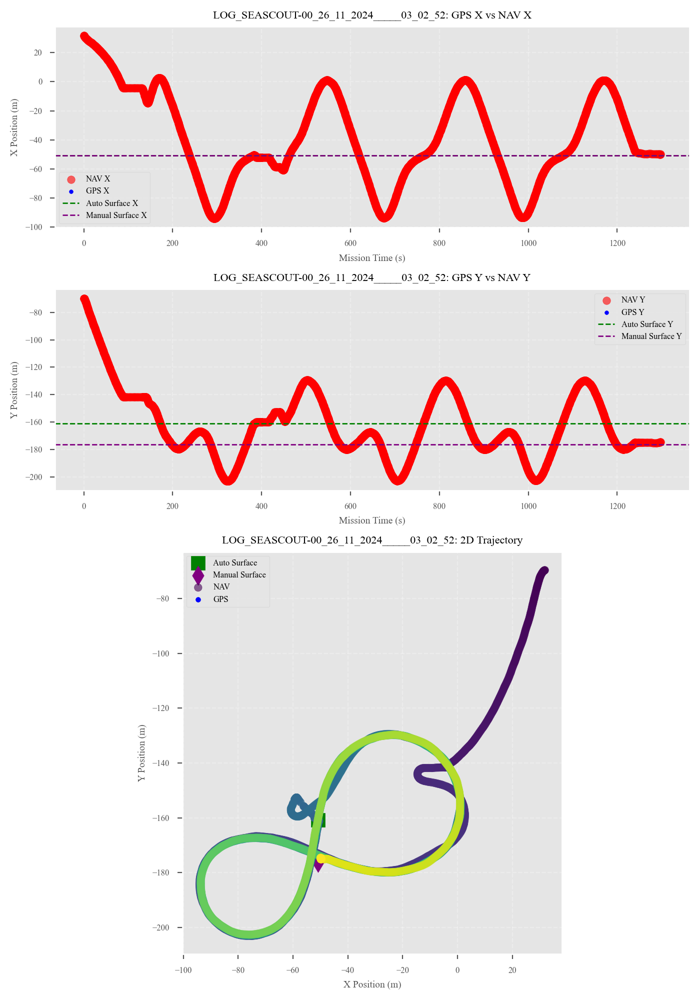


Positions for LOG_SEASCOUT-00_26_11_2024_____04_22_34:
"final_gps_x": -109.29,
"final_gps_y": -68.04,
# Automatic detection:
"surface_x": -54.86,
"surface_y": -148.16,
# Current manual values:
"surface_x": -83.60,
"surface_y": -144.20,


Label(value='')

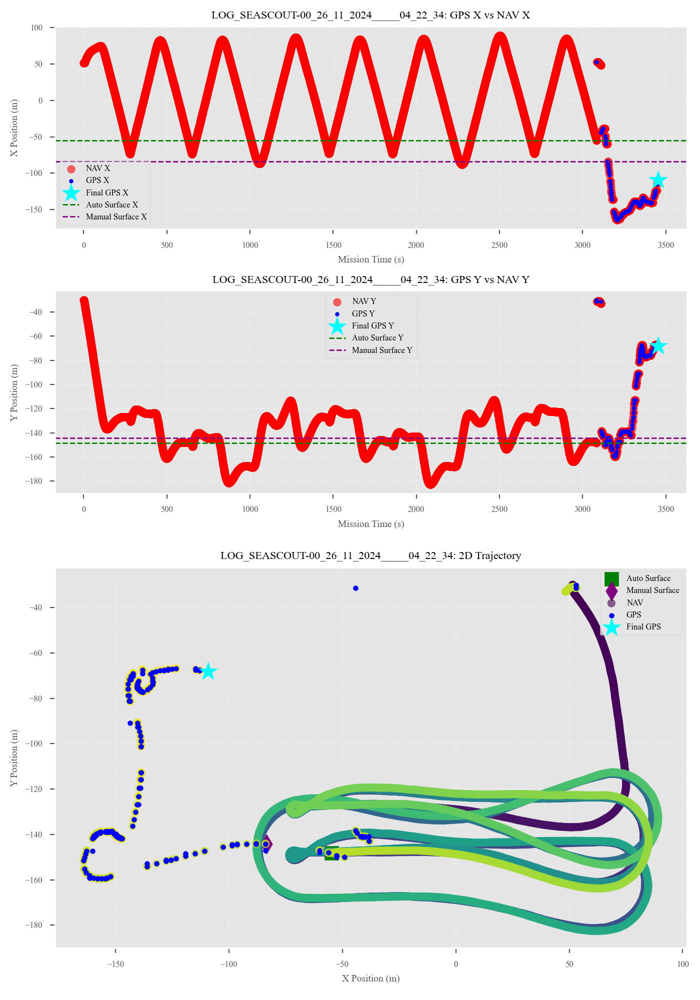


Positions for LOG_SEASCOUT-00_27_11_2024_____04_16_46:
"final_gps_x": 58.03,
"final_gps_y": -30.97,
# Automatic detection:
"surface_x": 77.57,
"surface_y": -71.10,
# Current manual values:
"surface_x": 93.92,
"surface_y": -83.19,


Label(value='')

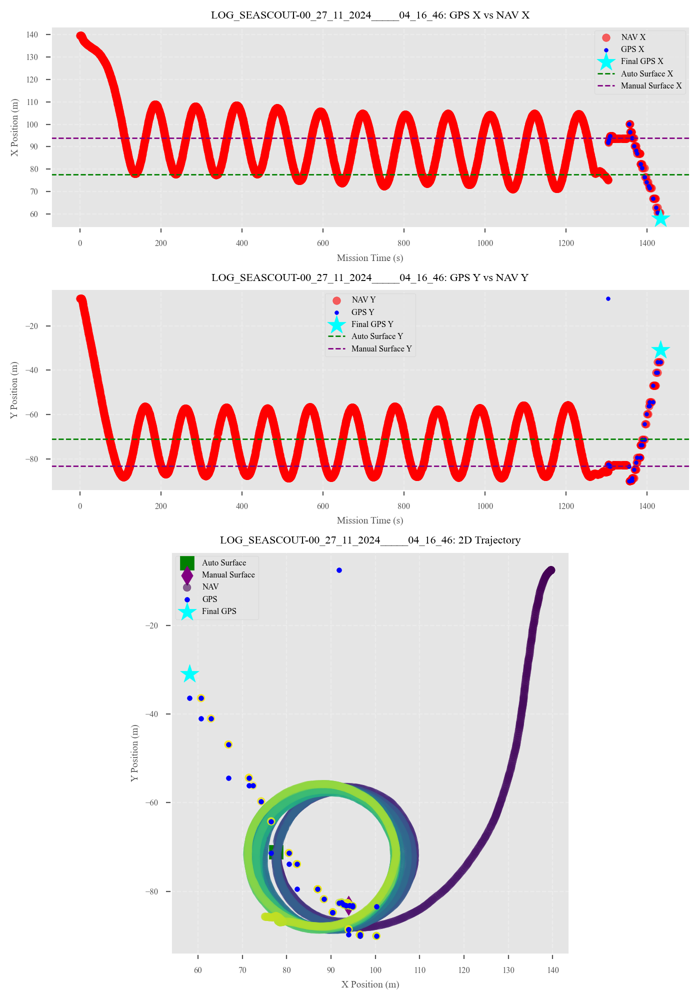


Positions for LOG_SEASCOUT-00_27_11_2024_____04_58_17:
"final_gps_x": 3.24,
"final_gps_y": 10.49,
# Automatic detection:
"surface_x": 3.84,
"surface_y": -111.80,
# Current manual values:
"surface_x": -12.50,
"surface_y": -16.00,


Label(value='')

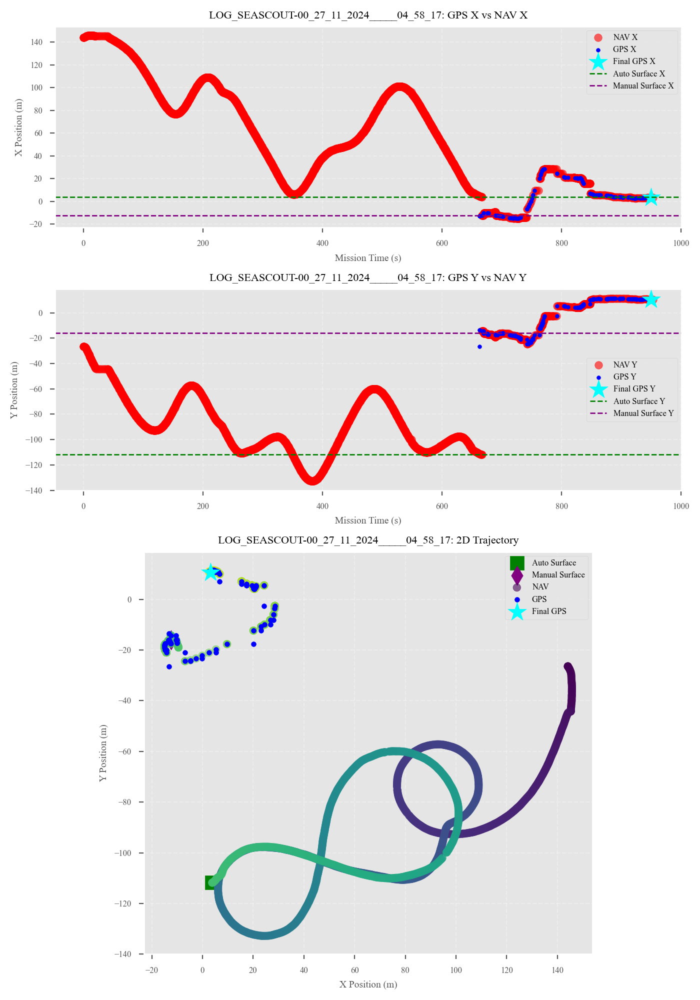


Positions for LOG_SEASCOUT-00_27_11_2024_____05_52_58:
"final_gps_x": 73.93,
"final_gps_y": -116.86,
# Automatic detection:
"surface_x": 36.58,
"surface_y": -29.34,
# Current manual values:
"surface_x": 73.70,
"surface_y": -115.90,


Label(value='')

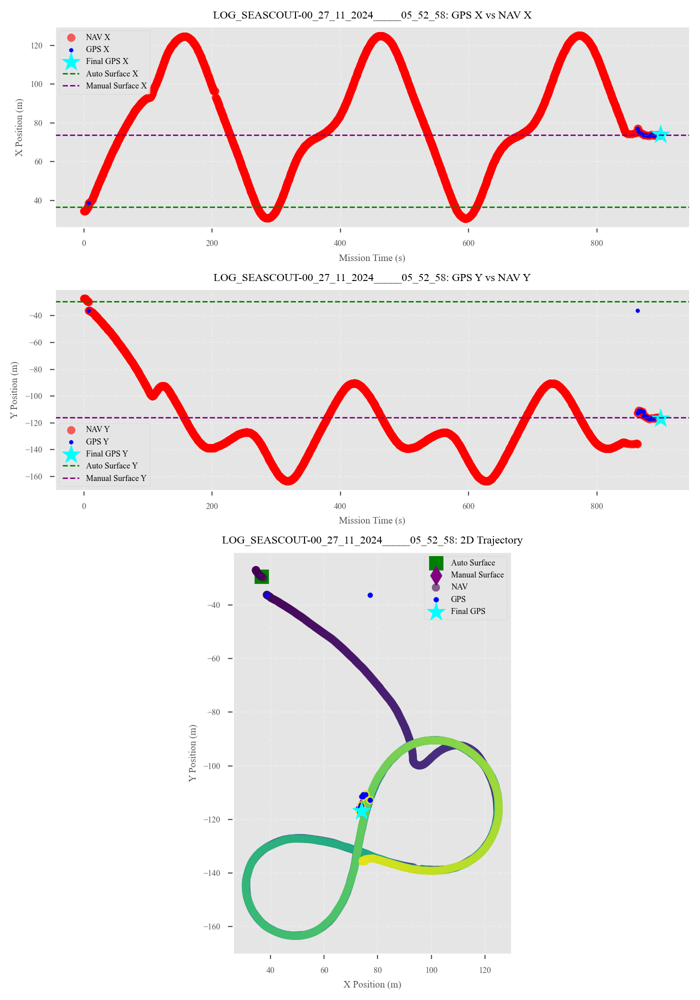


Positions for LOG_SEASCOUT-00_27_11_2024_____06_54_18:
"final_gps_x": 116.55,
"final_gps_y": -131.23,
# Automatic detection:
"surface_x": 117.67,
"surface_y": -154.60,
# Current manual values:
"surface_x": 116.67,
"surface_y": -131.23,


Label(value='')

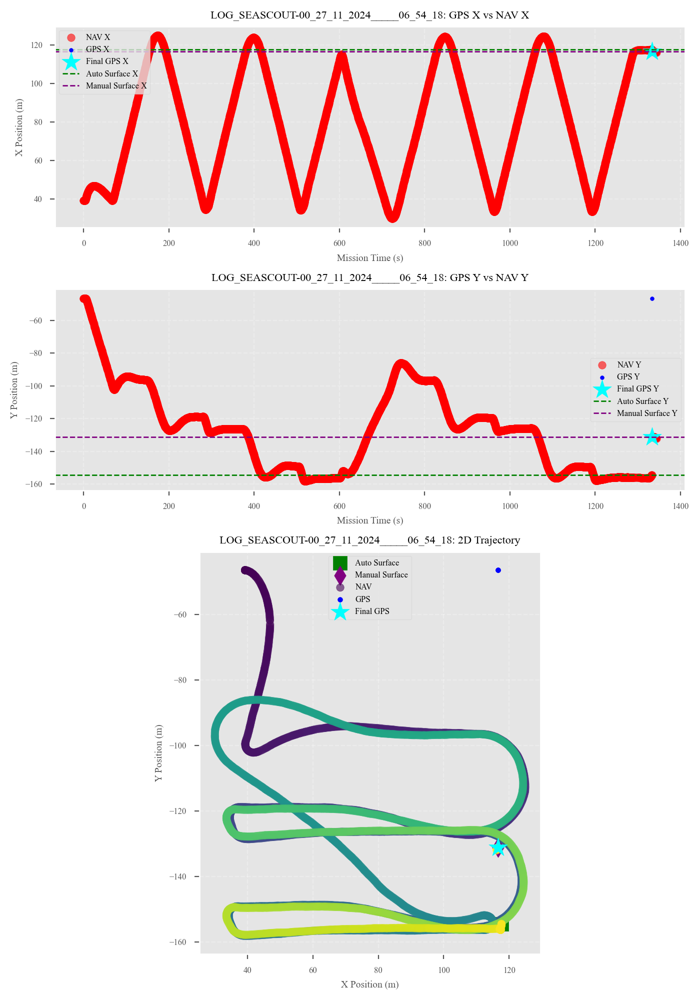


Positions for LOG_SEASCOUT-00_27_11_2024_____08_08_33:
"final_gps_x": 87.20,
"final_gps_y": -136.70,
# Automatic detection:
"surface_x": 63.07,
"surface_y": -32.71,
# Current manual values:
"surface_x": 86.90,
"surface_y": -137.10,


Label(value='')

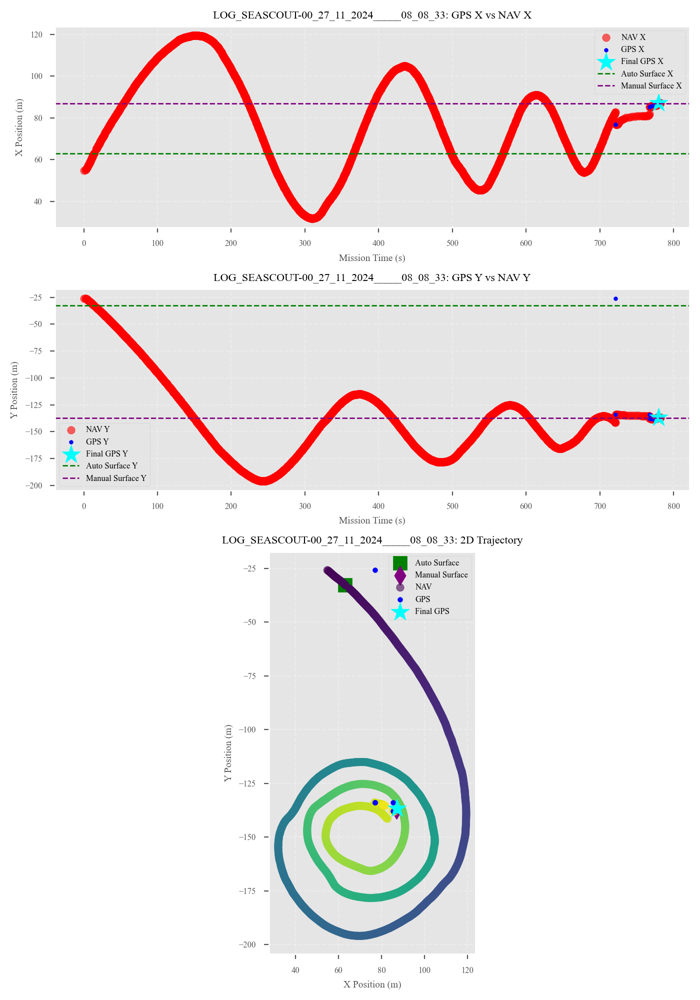

In [458]:
# First cell - run this once
%matplotlib widget
import ipywidgets as widgets
from IPython.display import display

# Second cell - the actual plotting code
def detect_nav_jumps(nav_data, std_threshold=3):
    """Detect jumps in navigation data using statistical methods."""
    nav_x = nav_data['NAV_X'].to_numpy()
    nav_y = nav_data['NAV_Y'].to_numpy()
    nav_diff = np.sqrt(np.diff(nav_x)**2 + np.diff(nav_y)**2)
    
    diff_mean = np.mean(nav_diff)
    diff_std = np.std(nav_diff)
    jump_threshold = diff_mean + std_threshold * diff_std
    jump_indices = np.where(nav_diff > jump_threshold)[0]
    
    if len(jump_indices) > 0:
        last_valid_index = jump_indices[0]
        window_size = len(nav_data) // 4
        start_idx = max(0, last_valid_index - window_size)
        valid_nav_data = nav_data.iloc[start_idx:last_valid_index]
    else:
        valid_nav_data = nav_data.iloc[-len(nav_data) // 4:]
    
    return valid_nav_data.iloc[-1] if not valid_nav_data.empty else None

# Loop through missions and logs
for mission_key, logs in time_bounds.items():
    for log_key, bounds in logs.items():
        surface_x = bounds.get("surface_x")
        surface_y = bounds.get("surface_y")
        
        # Get raw data without filtering
        seascout_data = loaded_data[mission_key][log_key]["data"]["realtime_data"]
        mask = seascout_data['var_source'].isin(['GPS', 'AHOI_RANGE', 'NODE_REPORT'])
        filtered_data = seascout_data[mask].copy()

        if filtered_data.empty:
            print(f"Filtered data is empty for log {log_key}. Skipping...")
            continue
            
        # Calculate mission time from start
        t_mission_start = filtered_data.index[0]
        t_mission = filtered_data.index - t_mission_start
        filtered_data['t_mission'] = t_mission
        
        # Get unique GPS points
        gps_points = filtered_data.loc[:, ["t_mission", "nav_x_gps", "nav_y_gps"]].drop_duplicates(subset=["nav_x_gps", "nav_y_gps"])
        
        # Extract variables
        gps_mask = filtered_data['var_source'] == 'GPS'
        nav_mask = filtered_data['var_source'] == 'NODE_REPORT'
        nav_data = filtered_data[nav_mask]
        
        # Get automatic surface detection
        last_valid_nav = detect_nav_jumps(nav_data)
        if last_valid_nav is not None:
            auto_surface_x = last_valid_nav['NAV_X']
            auto_surface_y = last_valid_nav['NAV_Y']
        else:
            auto_surface_x = auto_surface_y = None

        # Get final GPS position
        gps_data = filtered_data[gps_mask]
        if not gps_data.empty:
            final_gps = gps_data.iloc[-1]
            final_gps_x = final_gps['nav_x_gps']
            final_gps_y = final_gps['nav_y_gps']
        else:
            final_gps_x = final_gps_y = None

        # Print positions
        print(f"\nPositions for {log_key}:")
        print('"final_gps_x": {:.2f},'.format(final_gps_x if final_gps_x is not None else 0))
        print('"final_gps_y": {:.2f},'.format(final_gps_y if final_gps_y is not None else 0))
        if auto_surface_x is not None and auto_surface_y is not None:
            print(f"# Automatic detection:")
            print('"surface_x": {:.2f},'.format(auto_surface_x))
            print('"surface_y": {:.2f},'.format(auto_surface_y))
        if surface_x is not None and surface_y is not None:
            print(f"# Current manual values:")
            print('"surface_x": {:.2f},'.format(surface_x))
            print('"surface_y": {:.2f},'.format(surface_y))

        # Create interactive figure
        plt.ioff()  # Turn off interactive mode for creation
        fig = plt.figure(figsize=(12, 12))
        
        # Create layout with larger trajectory plot
        fig = plt.figure(figsize=(7, 10))
        gs = fig.add_gridspec(3, 1, height_ratios=[1, 1, 2])  # Make bottom plot twice as large
        ax1 = fig.add_subplot(gs[0])
        ax2 = fig.add_subplot(gs[1])
        ax3 = fig.add_subplot(gs[2])
        
        # Plot 1: GPS vs NAV X
        sc_nav_x = ax1.scatter(t_mission[nav_mask], filtered_data.loc[nav_mask, 'NAV_X'], 
                             label='NAV X', color='red', alpha=0.6)
        sc_gps_x = ax1.scatter(gps_points["t_mission"], gps_points['nav_x_gps'], 
                             label='GPS X', color='blue', marker='.')
        
        if final_gps_x is not None:
            ax1.scatter(t_mission[gps_mask][-1], final_gps_x,
                       color='cyan', marker='*', s=200, label='Final GPS X')
        if auto_surface_x is not None:
            ax1.axhline(y=auto_surface_x, color='green', linestyle='--', 
                       label='Auto Surface X')
        if surface_x is not None:
            ax1.axhline(y=surface_x, color='purple', linestyle='--', 
                       label='Manual Surface X')
        ax1.set_title(f'{log_key}: GPS X vs NAV X')
        ax1.set_xlabel('Mission Time (s)')
        ax1.set_ylabel('X Position (m)')
        ax1.grid(True)
        ax1.legend()

        # Plot 2: GPS vs NAV Y
        sc_nav_y = ax2.scatter(t_mission[nav_mask], filtered_data.loc[nav_mask, 'NAV_Y'], 
                             label='NAV Y', color='red', alpha=0.6)
        sc_gps_y = ax2.scatter(gps_points["t_mission"], gps_points['nav_y_gps'], 
                             label='GPS Y', color='blue', marker='.')
        
        if final_gps_y is not None:
            ax2.scatter(t_mission[gps_mask][-1], final_gps_y,
                       color='cyan', marker='*', s=200, label='Final GPS Y')
        if auto_surface_y is not None:
            ax2.axhline(y=auto_surface_y, color='green', linestyle='--', 
                       label='Auto Surface Y')
        if surface_y is not None:
            ax2.axhline(y=surface_y, color='purple', linestyle='--', 
                       label='Manual Surface Y')
        ax2.set_title(f'{log_key}: GPS Y vs NAV Y')
        ax2.set_xlabel('Mission Time (s)')
        ax2.set_ylabel('Y Position (m)')
        ax2.grid(True)
        ax2.legend()

        # Plot 3: 2D trajectory
    
        if auto_surface_x is not None and auto_surface_y is not None:
            ax3.scatter(auto_surface_x, auto_surface_y, color='green', 
                       marker='s', s=100, label='Auto Surface')
        if surface_x is not None and surface_y is not None:
            ax3.scatter(surface_x, surface_y, color='purple', 
                       marker='d', s=100, label='Manual Surface')
            
        sc_nav_2d = ax3.scatter(filtered_data.loc[nav_mask, 'NAV_X'], 
                              filtered_data.loc[nav_mask, 'NAV_Y'], 
                              c=t_mission[nav_mask], cmap='viridis', 
                              label='NAV', alpha=0.6)
        sc_gps_2d = ax3.scatter(filtered_data.loc[gps_mask, 'nav_x_gps'], 
                              filtered_data.loc[gps_mask, 'nav_y_gps'], 
                              color='blue', marker='.', s=50, label='GPS')
            
        if final_gps_x is not None and final_gps_y is not None:
            ax3.scatter(final_gps_x, final_gps_y, 
                       color='cyan', marker='*', s=200, label='Final GPS')
        
        
        ax3.set_title(f'{log_key}: 2D Trajectory')
        ax3.set_xlabel('X Position (m)')
        ax3.set_ylabel('Y Position (m)')
        ax3.grid(True)
        ax3.legend()
        ax3.set_aspect('equal')

        # Add tooltip functionality
        tooltip = widgets.Label()
        display(tooltip)
        
        def hover(event):
            if event.inaxes:
                # Get mouse data coordinates
                xdata, ydata = event.xdata, event.ydata
                
                # Different handling based on which axes the mouse is in
                if event.inaxes == ax1:
                    # Find closest point in X plot
                    nav_times = t_mission[nav_mask].values
                    nav_x = filtered_data.loc[nav_mask, 'NAV_X'].values
                    idx = np.argmin(np.abs(nav_times - xdata))
                    tooltip.value = f't: {nav_times[idx]:.1f}s, X: {nav_x[idx]:.2f}m'
                    
                elif event.inaxes == ax2:
                    # Find closest point in Y plot
                    nav_times = t_mission[nav_mask].values
                    nav_y = filtered_data.loc[nav_mask, 'NAV_Y'].values
                    idx = np.argmin(np.abs(nav_times - xdata))
                    tooltip.value = f't: {nav_times[idx]:.1f}s, Y: {nav_y[idx]:.2f}m'
                    
                elif event.inaxes == ax3:
                    # For trajectory plot, use original contains method
                    cont_nav_2d, ind_nav_2d = sc_nav_2d.contains(event)
                    cont_gps_2d, ind_gps_2d = sc_gps_2d.contains(event)
                
                    if cont_nav_2d:
                        ind = ind_nav_2d['ind'][0]
                        t = filtered_data.loc[nav_mask, 't_mission'].iloc[ind]
                        x = filtered_data.loc[nav_mask, 'NAV_X'].iloc[ind]
                        y = filtered_data.loc[nav_mask, 'NAV_Y'].iloc[ind]
                        tooltip.value = f't: {t:.1f}s, X: {x:.2f}m, Y: {y:.2f}m'
                    elif cont_gps_2d:
                        ind = ind_gps_2d['ind'][0]
                        t = filtered_data.loc[gps_mask, 't_mission'].iloc[ind]
                        x = filtered_data.loc[gps_mask, 'nav_x_gps'].iloc[ind]
                        y = filtered_data.loc[gps_mask, 'nav_y_gps'].iloc[ind]
                        tooltip.value = f't: {t:.1f}s, X: {x:.2f}m, Y: {y:.2f}m (GPS)'
                    else:
                        # For points not directly on data, show coordinates
                        tooltip.value = f'X: {xdata:.2f}m, Y: {ydata:.2f}m'
        
        fig.canvas.mpl_connect('motion_notify_event', hover)
        plt.tight_layout()
        plt.show()

# Third cell - run this after plotting is done


In [353]:
# import matplotlib.pyplot as plt
# import numpy as np
# from matplotlib.lines import Line2D
# import matplotlib.gridspec as gridspec

# def plot_filter_comparison(all_processed_data, time_bounds):
#     """
#     Create a single figure comparing all filter configurations for each mission.
#     Shows X and Y position trajectories.
#     """
#     # Get unique missions
#     all_missions = set()
#     for config_name, config_data in all_processed_data.items():
#         for mission_key in config_data.keys():
#             if mission_key != 'mission_errors':
#                 all_missions.add(mission_key)
    
#     # Set publication style settings
#     plt.rcParams.update({
#         'font.family': 'serif', 'font.size': 8, 'axes.labelsize': 9, 'axes.titlesize': 10,
#         'xtick.labelsize': 7, 'ytick.labelsize': 7, 'legend.fontsize': 7,
#         'figure.dpi': 300, 'lines.linewidth': 0.8
#     })
    
#     # Define colors for each filter type
#     filter_colors = {
#         'NAV Solution': '#CC0000',
#         'UKF_singlerange_DVL': '#D73027',
#         'UKF_doublerange_DVL': '#FC8D59',
#         'EKF_singlerange_DVL': '#91BFDB',
#         'EKF_doublerange_DVL': '#4393C3'
#     }
    
#     for mission in all_missions:
#         print(f"Creating filter comparison for mission: {mission}")
        
#         # Create figure with 2 rows (X and Y position)
#         fig = plt.figure(figsize=(10, 7))
#         gs = gridspec.GridSpec(2, 1, height_ratios=[1, 1], hspace=0.3)
        
#         # Create subplots with shared x-axis
#         ax_x = fig.add_subplot(gs[0])
#         ax_y = fig.add_subplot(gs[1], sharex=ax_x)
        
#         # Data collection and time bounds
#         bounds = {'t': [float('inf'), float('-inf')]}
        
#         # Flag to track if we've already added GPS and Surface data
#         gps_added = False
#         surface_added = False
#         nav_added = False
        
#         # Process each configuration for this mission
#         for config_name, config_data in all_processed_data.items():
#             if mission in config_data:
#                 mission_data = config_data[mission]
                
#                 for seascout_key, results in mission_data.items():
#                     if seascout_key == 'mission_errors':
#                         continue
                        
#                     # Extract NAV data first (only once)
#                     if 'filtered_data' in results and not nav_added:
#                         filtered_data = results['filtered_data']
#                         nav_mask = filtered_data['var_source'] == 'NODE_REPORT'
                        
#                         if nav_mask.any():
#                             nav_x = filtered_data.loc[nav_mask, 'NAV_X'].to_numpy()
#                             nav_y = filtered_data.loc[nav_mask, 'NAV_Y'].to_numpy()
#                             nav_times = filtered_data.loc[nav_mask, 't_mission'].to_numpy()
                            
#                             if len(nav_times) > 0:
#                                 # Plot NAV solution
#                                 ax_x.plot(nav_times, nav_x, '-', color=filter_colors['NAV Solution'], 
#                                         linewidth=0.8, alpha=0.7, label='NAV Solution')
#                                 ax_y.plot(nav_times, nav_y, '-', color=filter_colors['NAV Solution'], 
#                                         linewidth=0.8, alpha=0.7, label='NAV Solution')
                                
#                                 bounds['t'] = [min(bounds['t'][0], np.min(nav_times)), 
#                                              max(bounds['t'][1], np.max(nav_times))]
#                                 nav_added = True
                    
#                     # Extract filter trajectory data
#                     if 'states' in results and len(results['states']) > 0:
#                         trajectory = results['states'][:, :2]  # x, y positions
#                         t_values = results.get('times', results.get('ekf_times', None))
                        
#                         if t_values is None or len(t_values) == 0:
#                             # Use mission times or create linear time values if needed
#                             if bounds['t'][0] != float('inf'):
#                                 t_values = np.linspace(bounds['t'][0], bounds['t'][1], len(trajectory))
#                             else:
#                                 t_values = np.linspace(0, 100, len(trajectory))
                        
#                         # Plot filter trajectories
#                         ax_x.plot(t_values, trajectory[:, 0], '-', 
#                                 color=filter_colors.get(config_name, '#999999'), 
#                                 linewidth=1.0, label=f"{config_name}")
                        
#                         ax_y.plot(t_values, trajectory[:, 1], '-', 
#                                 color=filter_colors.get(config_name, '#999999'), 
#                                 linewidth=1.0, label=f"{config_name}")
                        
#                         # Mark start position
#                         ax_x.plot(t_values[0], trajectory[0, 0], 'o', 
#                                 color='green', markersize=4, zorder=10)
#                         ax_y.plot(t_values[0], trajectory[0, 1], 'o', 
#                                 color='green', markersize=4, zorder=10)
                        
#                         # Mark end position
#                         ax_x.plot(t_values[-1], trajectory[-1, 0], 'D', 
#                                 color='magenta', markersize=4, zorder=10)
#                         ax_y.plot(t_values[-1], trajectory[-1, 1], 'D', 
#                                 color='magenta', markersize=4, zorder=10)
                        
#                         # Update time bounds
#                         bounds['t'] = [min(bounds['t'][0], np.min(t_values)), 
#                                      max(bounds['t'][1], np.max(t_values))]
                    
#                     # Extract GPS data if available (only once)
#                     if 'filtered_data' in results and not gps_added:
#                         filtered_data = results['filtered_data']
#                         gps_mask = filtered_data['var_source'] == 'GPS'
                        
#                         if gps_mask.any() and 'nav_x_gps' in filtered_data.columns and 'nav_y_gps' in filtered_data.columns:
#                             gps_x = filtered_data.loc[gps_mask, 'nav_x_gps'].values
#                             gps_y = filtered_data.loc[gps_mask, 'nav_y_gps'].values
#                             gps_times = filtered_data.loc[gps_mask, 't_mission'].values
                            
#                             if len(gps_x) > 0 and len(gps_y) > 0:
#                                 # Plot GPS points
#                                 ax_x.scatter(gps_times, gps_x, color='#fdae61', 
#                                           s=20, marker='P', zorder=30, label='GPS')
#                                 ax_y.scatter(gps_times, gps_y, color='#fdae61', 
#                                           s=20, marker='P', zorder=30, label='GPS')
                                
#                                 # Update time bounds
#                                 bounds['t'] = [min(bounds['t'][0], np.min(gps_times)), 
#                                              max(bounds['t'][1], np.max(gps_times))]
#                                 gps_added = True
                    
#                     # Get surface position if available (only once)
#                     if not surface_added:
#                         bounds_data = time_bounds.get(mission, {}).get(seascout_key, {})
#                         if 'surface_x' in bounds_data and 'surface_y' in bounds_data:
#                             surface_x = bounds_data['surface_x']
#                             surface_y = bounds_data['surface_y']
                            
#                             # Plot surface position at the end of the timeline
#                             if bounds['t'][1] != float('-inf'):
#                                 ax_x.scatter(bounds['t'][1], surface_x, color='#d7191c', 
#                                           s=30, marker='*', zorder=25, label='Surface')
#                                 ax_y.scatter(bounds['t'][1], surface_y, color='#d7191c', 
#                                           s=30, marker='*', zorder=25, label='Surface')
#                                 surface_added = True
                    
#                     break  # Only process first SEASCOUT log per configuration
        
#         # Add buffer to time bounds
#         if bounds['t'][0] != float('inf') and bounds['t'][1] != float('-inf'):
#             time_buffer = (bounds['t'][1] - bounds['t'][0]) * 0.05
#             bounds['t'] = [bounds['t'][0] - time_buffer, bounds['t'][1] + time_buffer]
#         else:
#             bounds['t'] = [0, 100]  # Default if no data found
        
#         # Configure X position plot
#         ax_x.set_xlim(bounds['t'])
#         ax_x.set_ylabel('X Position (m)', fontsize=9)
#         ax_x.set_title(f"{mission} - Filter Comparison", fontweight='bold', fontsize=10)
#         ax_x.grid(True, linestyle='--', linewidth=0.3, alpha=0.5)
#         ax_x.legend(loc='best', fontsize=7)
        
#         # Configure Y position plot
#         ax_y.set_xlim(bounds['t'])
#         ax_y.set_ylabel('Y Position (m)', fontsize=9)
#         ax_y.set_xlabel('Time (s)', fontsize=9)
#         ax_y.grid(True, linestyle='--', linewidth=0.3, alpha=0.5)
#         ax_y.legend(loc='best', fontsize=7)
        
#         # Add markers explanation in a separate legend
#         marker_legend_elements = [
#             Line2D([0], [0], marker='o', color='w', markerfacecolor='green', 
#                   markersize=5, label='Start Position'),
#             Line2D([0], [0], marker='D', color='w', markerfacecolor='magenta', 
#                   markersize=5, label='End Position'),
#             Line2D([0], [0], marker='P', color='w', markerfacecolor='#fdae61', 
#                   markersize=5, label='GPS'),
#             Line2D([0], [0], marker='*', color='w', markerfacecolor='#d7191c', 
#                   markersize=5, label='Surface')
#         ]
        
#         # Place the marker legend
#         ax_x.legend(handles=marker_legend_elements, loc='upper right', fontsize=7)
        
#         # Adjust layout
#         plt.tight_layout()
#         # Show plot instead of saving it
#         plt.show()

# def plot_detailed_navigation(all_processed_data, time_bounds):
#     """
#     Create detailed navigation plots for each filter configuration:
#     1. X/Y positions over time
#     2. Range innovations vs time
#     3. Range measurements by anchor_id
#     4. X/Y uncertainties over time
    
#     All plots share the same time axis.
#     """
#     # Get unique missions
#     all_missions = set()
#     for config_name, config_data in all_processed_data.items():
#         for mission_key in config_data.keys():
#             if mission_key != 'mission_errors':
#                 all_missions.add(mission_key)
    
#     # Set publication style settings
#     plt.rcParams.update({
#         'font.family': 'serif', 'font.size': 8, 'axes.labelsize': 9, 'axes.titlesize': 10,
#         'xtick.labelsize': 7, 'ytick.labelsize': 7, 'legend.fontsize': 7,
#         'figure.dpi': 300, 'lines.linewidth': 0.8
#     })
    
#     # Define colors for each filter type
#     filter_colors = {
#         'NAV Solution': '#CC0000',
#         'UKF_singlerange_DVL': '#D73027',
#         'UKF_doublerange_DVL': '#FC8D59',
#         'EKF_singlerange_DVL': '#91BFDB',
#         'EKF_doublerange_DVL': '#4393C3'
#     }
    
#     for mission in all_missions:
#         # Process each configuration for this mission
#         for config_name, config_data in all_processed_data.items():
#             if mission in config_data:
#                 print(f"Creating detailed plot for mission: {mission}, filter: {config_name}")
                
#                 mission_data = config_data[mission]
#                 nav_data = None
#                 gps_data = None
#                 surface_pos = None
#                 filter_data = None
                
#                 # Create figure with 5 rows
#                 fig = plt.figure(figsize=(10, 12))
#                 gs = gridspec.GridSpec(5, 1, height_ratios=[1, 1, 1, 1, 1], hspace=0.3)
                
#                 # Create subplots with shared x-axis
#                 ax_x = fig.add_subplot(gs[0])
#                 ax_y = fig.add_subplot(gs[1], sharex=ax_x)
#                 ax_innovations = fig.add_subplot(gs[2], sharex=ax_x)
#                 ax_ranges = fig.add_subplot(gs[3], sharex=ax_x)
#                 ax_uncertainty = fig.add_subplot(gs[4], sharex=ax_x)
                
#                 # Data collection and time bounds
#                 bounds = {'t': [float('inf'), float('-inf')]}
                
#                 for seascout_key, results in mission_data.items():
#                     if seascout_key == 'mission_errors':
#                         continue
                        
#                     # Extract NAV data
#                     if 'filtered_data' in results and nav_data is None:
#                         filtered_data = results['filtered_data']
#                         nav_mask = filtered_data['var_source'] == 'NODE_REPORT'
                        
#                         if nav_mask.any():
#                             nav_x = filtered_data.loc[nav_mask, 'NAV_X'].to_numpy()
#                             nav_y = filtered_data.loc[nav_mask, 'NAV_Y'].to_numpy()
#                             nav_times = filtered_data.loc[nav_mask, 't_mission'].to_numpy()
                            
#                             if len(nav_times) > 0:
#                                 nav_data = {'x': nav_x, 'y': nav_y, 'times': nav_times}
#                                 bounds['t'] = [min(bounds['t'][0], np.min(nav_times)), 
#                                              max(bounds['t'][1], np.max(nav_times))]
                    
#                     # Extract filter trajectory data
#                     if 'states' in results and len(results['states']) > 0:
#                         trajectory = results['states'][:, :2]  # x, y positions
#                         t_values = results.get('times', results.get('ekf_times', None))
                        
#                         if t_values is None or len(t_values) == 0:
#                             # Use mission times or create linear time values if needed
#                             if bounds['t'][0] != float('inf'):
#                                 t_values = np.linspace(bounds['t'][0], bounds['t'][1], len(trajectory))
#                             else:
#                                 t_values = np.linspace(0, 100, len(trajectory))
                        
#                         filter_data = {
#                             'x': trajectory[:, 0], 
#                             'y': trajectory[:, 1],
#                             'times': t_values
#                         }
                        
#                         # Update time bounds
#                         bounds['t'] = [min(bounds['t'][0], np.min(t_values)), 
#                                      max(bounds['t'][1], np.max(t_values))]
                        
#                         # Extract range innovations if available
#                         if 'range_innovations' in results and len(results['range_innovations']) > 0:
#                             range_innovations = results['range_innovations']
                            
#                             # Get innovation times or use filter times
#                             if 'range_update_times' in results and len(results['range_update_times']) > 0:
#                                 innovation_times = results['range_update_times']
#                             elif 'time_range' in results and len(results['time_range']) > 0:
#                                 innovation_times = results['time_range']
#                             else:
#                                 # Sample at intervals if exact times not available
#                                 innovation_times = np.linspace(t_values[0], t_values[-1], len(range_innovations))
                            
#                             filter_data['range_innovations'] = range_innovations
#                             filter_data['innovation_times'] = innovation_times
                            
#                             # Update time bounds with range innovation times
#                             bounds['t'] = [min(bounds['t'][0], np.min(innovation_times)),
#                                          max(bounds['t'][1], np.max(innovation_times))]
                        
#                         # Extract range measurements if available
#                         if 'range_measurements' in results and len(results['range_measurements']) > 0:
#                             range_measurements = results['range_measurements']
                            
#                             # Get range measurement times
#                             if 'range_update_times' in results and len(results['range_update_times']) > 0:
#                                 range_times = results['range_update_times']
#                             elif 'time_range' in results and len(results['time_range']) > 0:
#                                 range_times = results['time_range']
#                             else:
#                                 range_times = innovation_times if 'innovation_times' in filter_data else t_values
                            
#                             # Get anchor IDs if available, otherwise use zeros
#                             if 'anchor_ids_range' in results:
#                                 anchor_ids = results['anchor_ids_range']
#                                 # If anchor_ids_range is a list of tuples (for double range mode)
#                                 if len(anchor_ids) > 0 and isinstance(anchor_ids[0], tuple):
#                                     # Flatten the list of tuples
#                                     flattened_ids = []
#                                     for id_pair in anchor_ids:
#                                         flattened_ids.extend(id_pair)
#                                     anchor_ids = flattened_ids
#                             elif 'anchor_ids' in results:
#                                 anchor_ids = results['anchor_ids']
#                             else:
#                                 anchor_ids = np.zeros(len(range_measurements))
                            
#                             # Make sure anchor_ids is the same length as range_measurements
#                             if len(anchor_ids) < len(range_measurements):
#                                 # Repeat the pattern to match the length
#                                 pattern = anchor_ids
#                                 anchor_ids = np.tile(pattern, (len(range_measurements) // len(pattern) + 1))
#                                 anchor_ids = anchor_ids[:len(range_measurements)]
                            
#                             filter_data['range_measurements'] = range_measurements
#                             filter_data['range_times'] = range_times
#                             filter_data['anchor_ids'] = anchor_ids
                            
#                             # Update time bounds with range times
#                             bounds['t'] = [min(bounds['t'][0], np.min(range_times)),
#                                          max(bounds['t'][1], np.max(range_times))]
                        
#                         # Extract state covariances for uncertainty plots
#                         if 'P_predict' in results and len(results['P_predict']) > 0:
#                             # Use prediction covariances which show growth over time
#                             x_std = np.sqrt([P[0, 0] for P in results['P_predict']])
#                             y_std = np.sqrt([P[1, 1] for P in results['P_predict']])
                            
#                             # Use prediction times for covariances
#                             if 'time_predict' in results and len(results['time_predict']) > 0:
#                                 cov_times = results['time_predict']
#                             else:
#                                 cov_times = t_values[:len(x_std)]
                                
#                             filter_data['x_std'] = x_std
#                             filter_data['y_std'] = y_std
#                             filter_data['cov_times'] = cov_times
                        
#                         # If we don't have P_predict, try to use post-update covariances
#                         elif 'P_post_range' in results and len(results['P_post_range']) > 0:
#                             x_std = np.sqrt([P[0, 0] for P in results['P_post_range']])
#                             y_std = np.sqrt([P[1, 1] for P in results['P_post_range']])
                            
#                             # Use range update times for covariances
#                             if 'time_range' in results and len(results['time_range']) > 0:
#                                 cov_times = results['time_range']
#                             else:
#                                 cov_times = t_values[:len(x_std)]
                                
#                             filter_data['x_std'] = x_std
#                             filter_data['y_std'] = y_std
#                             filter_data['cov_times'] = cov_times
                    
#                     # Extract GPS data if available (only once)
#                     if 'filtered_data' in results and gps_data is None:
#                         filtered_data = results['filtered_data']
#                         gps_mask = filtered_data['var_source'] == 'GPS'
                        
#                         if gps_mask.any() and 'nav_x_gps' in filtered_data.columns and 'nav_y_gps' in filtered_data.columns:
#                             gps_x = filtered_data.loc[gps_mask, 'nav_x_gps'].values
#                             gps_y = filtered_data.loc[gps_mask, 'nav_y_gps'].values
#                             gps_times = filtered_data.loc[gps_mask, 't_mission'].values
                            
#                             if len(gps_x) > 0 and len(gps_y) > 0:
#                                 gps_data = {'x': gps_x, 'y': gps_y, 'times': gps_times}
                                
#                                 # Update time bounds with GPS times
#                                 bounds['t'] = [min(bounds['t'][0], np.min(gps_times)), 
#                                              max(bounds['t'][1], np.max(gps_times))]
                    
#                     # Get surface position if available (only once)
#                     if surface_pos is None:
#                         bounds_data = time_bounds.get(mission, {}).get(seascout_key, {})
#                         if 'surface_x' in bounds_data and 'surface_y' in bounds_data:
#                             surface_pos = {
#                                 'x': bounds_data['surface_x'], 
#                                 'y': bounds_data['surface_y']
#                             }
                    
#                     break  # Only process first SEASCOUT log per configuration
                
#                 # Add buffer to time bounds
#                 if bounds['t'][0] != float('inf') and bounds['t'][1] != float('-inf'):
#                     time_buffer = (bounds['t'][1] - bounds['t'][0]) * 0.05
#                     bounds['t'] = [bounds['t'][0] - time_buffer, bounds['t'][1] + time_buffer]
#                 else:
#                     bounds['t'] = [0, 100]  # Default if no data found
                
#                 # Plot X Position vs Time
#                 if nav_data:
#                     ax_x.plot(nav_data['times'], nav_data['x'], '-', color=filter_colors['NAV Solution'], 
#                              linewidth=0.8, alpha=0.7, label='NAV Solution')
                
#                 if filter_data:
#                     ax_x.plot(filter_data['times'], filter_data['x'], '-', 
#                              color=filter_colors.get(config_name, '#999999'), 
#                              linewidth=1.0, label=f"{config_name}")
                    
#                     # Mark start position
#                     ax_x.plot(filter_data['times'][0], filter_data['x'][0], 'o', 
#                              color='green', markersize=4, zorder=10, label='Start')
                    
#                     # Mark end position
#                     ax_x.plot(filter_data['times'][-1], filter_data['x'][-1], 'D', 
#                              color='magenta', markersize=4, zorder=10, label='End')
                
#                 if gps_data:
#                     ax_x.scatter(gps_data['times'], gps_data['x'], color='#fdae61', 
#                                s=20, marker='P', zorder=30, label='GPS')
                
#                 if surface_pos:
#                     ax_x.scatter(bounds['t'][1], surface_pos['x'], color='#d7191c', 
#                                s=30, marker='*', zorder=25, label='Surface')
                
#                 # Configure X plot
#                 ax_x.set_ylabel('X Position (m)', fontsize=9)
#                 ax_x.set_title(f"{mission} - {config_name}", fontweight='bold', fontsize=10)
#                 ax_x.grid(True, linestyle='--', linewidth=0.3, alpha=0.5)
#                 ax_x.legend(loc='best', fontsize=7)
                
#                 # Plot Y Position vs Time
#                 if nav_data:
#                     ax_y.plot(nav_data['times'], nav_data['y'], '-', color=filter_colors['NAV Solution'], 
#                              linewidth=0.8, alpha=0.7, label='NAV Solution')
                
#                 if filter_data:
#                     ax_y.plot(filter_data['times'], filter_data['y'], '-', 
#                              color=filter_colors.get(config_name, '#999999'), 
#                              linewidth=1.0, label=f"{config_name}")
                    
#                     # Mark start position
#                     ax_y.plot(filter_data['times'][0], filter_data['y'][0], 'o', 
#                              color='green', markersize=4, zorder=10, label='Start')
                    
#                     # Mark end position
#                     ax_y.plot(filter_data['times'][-1], filter_data['y'][-1], 'D', 
#                              color='magenta', markersize=4, zorder=10, label='End')
                
#                 if gps_data:
#                     ax_y.scatter(gps_data['times'], gps_data['y'], color='#fdae61', 
#                                s=20, marker='P', zorder=30, label='GPS')
                
#                 if surface_pos:
#                     ax_y.scatter(bounds['t'][1], surface_pos['y'], color='#d7191c', 
#                                s=30, marker='*', zorder=25, label='Surface')
                
#                 # Configure Y plot
#                 ax_y.set_ylabel('Y Position (m)', fontsize=9)
#                 ax_y.grid(True, linestyle='--', linewidth=0.3, alpha=0.5)
#                 ax_y.legend(loc='best', fontsize=7)
                
#                 # Plot Range Innovations
#                 if filter_data and 'range_innovations' in filter_data and 'innovation_times' in filter_data:
#                     range_innovations = filter_data['range_innovations']
#                     innovation_times = filter_data['innovation_times']
                    
#                     if len(range_innovations) > 0 and len(innovation_times) > 0:
#                         # Handle different array shapes (1D vs 2D)
#                         if len(range_innovations.shape) > 1 and range_innovations.shape[1] > 1:
#                             # For multiple innovations per time step (e.g., double range)
#                             for i in range(range_innovations.shape[1]):
#                                 ax_innovations.scatter(innovation_times, range_innovations[:, i], 
#                                                     s=10, color=filter_colors.get(config_name, '#999999'), 
#                                                     alpha=0.7, marker='o',
#                                                     label=f"Innovation {i+1}")
#                         else:
#                             # For single innovation per time step
#                             innovations_to_plot = range_innovations.flatten()
#                             ax_innovations.scatter(innovation_times, innovations_to_plot, 
#                                                 s=10, color=filter_colors.get(config_name, '#999999'), 
#                                                 alpha=0.7, marker='o',
#                                                 label="Range Innovations")
                        
#                         ax_innovations.set_ylabel('Range Innovation (m)', fontsize=9)
#                         ax_innovations.set_title('Range Innovations vs Time', fontsize=10)
#                         ax_innovations.grid(True, linestyle='--', linewidth=0.3, alpha=0.5)
#                         ax_innovations.legend(loc='best', fontsize=7)
#                     else:
#                         ax_innovations.text(0.5, 0.5, 'No range innovation data available', 
#                                           ha='center', va='center', transform=ax_innovations.transAxes)
#                 else:
#                     ax_innovations.text(0.5, 0.5, 'No range innovation data available', 
#                                       ha='center', va='center', transform=ax_innovations.transAxes)
#                 ax_innovations.set_ylim([-20, 20])
                
#                 # Plot Range Measurements by Anchor ID
#                 if filter_data and 'range_measurements' in filter_data and 'range_times' in filter_data and 'anchor_ids' in filter_data:
#                     range_measurements = filter_data['range_measurements']
#                     range_times = filter_data['range_times']
#                     anchor_ids = filter_data['anchor_ids']
                    
#                     if len(range_measurements) > 0 and len(range_times) > 0 and len(anchor_ids) > 0:
#                         # Ensure arrays are the same length
#                         min_len = min(len(range_measurements), len(range_times))
#                         range_measurements = range_measurements[:min_len]
#                         range_times = range_times[:min_len]
                        
#                         if len(anchor_ids) > min_len:
#                             anchor_ids = anchor_ids[:min_len]
#                         elif len(anchor_ids) < min_len:
#                             anchor_ids = np.concatenate([anchor_ids, np.zeros(min_len - len(anchor_ids))])
                        
#                         unique_anchors = np.unique(anchor_ids)
#                         cmap = plt.colormaps['tab10']  # Updated for matplotlib 3.7+
                        
#                         for i, anchor_id in enumerate(unique_anchors):
#                             mask = np.where(anchor_ids == anchor_id)[0]  # Get indices where anchor_id matches
#                             if len(mask) > 0:
#                                 ax_ranges.scatter(
#                                     range_times[mask], 
#                                     range_measurements[mask],
#                                     s=15, color=cmap(i % 10), marker='x', alpha=0.7,
#                                     label=f'Anchor {anchor_id}'
#                                 )
                        
#                         ax_ranges.set_ylabel('Range (m)', fontsize=9)
#                         ax_ranges.set_title('Range Measurements by Anchor ID', fontsize=10)
#                         ax_ranges.grid(True, linestyle='--', linewidth=0.3, alpha=0.5)
#                         ax_ranges.legend(loc='best', fontsize=7)
#                     else:
#                         ax_ranges.text(0.5, 0.5, 'No range measurement data available', 
#                                     ha='center', va='center', transform=ax_ranges.transAxes)
#                 else:
#                     ax_ranges.text(0.5, 0.5, 'No range measurement data available', 
#                                 ha='center', va='center', transform=ax_ranges.transAxes)
                
#                 # Plot Position Uncertainties
#                 if filter_data and 'x_std' in filter_data and 'y_std' in filter_data:
#                     x_std = filter_data['x_std']
#                     y_std = filter_data['y_std']
                    
#                     if 'cov_times' in filter_data:
#                         cov_times = filter_data['cov_times']
#                     else:
#                         # Create time vectors if needed
#                         cov_times = filter_data['times'][:len(x_std)]
                    
#                     ax_uncertainty.plot(cov_times, x_std, '-', 
#                                       color='blue', linewidth=1.0, alpha=0.7,
#                                       label="X Uncertainty")
#                     ax_uncertainty.plot(cov_times, y_std, '-', 
#                                       color='red', linewidth=1.0, alpha=0.7,
#                                       label="Y Uncertainty")
                    
#                     ax_uncertainty.set_ylabel('Uncertainty (m)', fontsize=9)
#                     ax_uncertainty.set_xlabel('Time (s)', fontsize=9)
#                     ax_uncertainty.set_title('Position Uncertainties', fontsize=10)
#                     ax_uncertainty.grid(True, linestyle='--', linewidth=0.3, alpha=0.5)
#                     ax_uncertainty.legend(loc='best', fontsize=7)
#                 else:
#                     ax_uncertainty.text(0.5, 0.5, 'No uncertainty data available', 
#                                      ha='center', va='center', transform=ax_uncertainty.transAxes)
#                     ax_uncertainty.set_xlabel('Time (s)', fontsize=9)
                
#                 # Set common x-axis limits
#                 for ax in [ax_x, ax_y, ax_innovations, ax_ranges, ax_uncertainty]:
#                     ax.set_xlim(bounds['t'])
                
#                 # Only show x-axis labels for the bottom plot
#                 for ax in [ax_x, ax_y, ax_innovations, ax_ranges]:
#                     plt.setp(ax.get_xticklabels(), visible=False)
                
#                 # Adjust layout
#                 plt.tight_layout()
#                 # Show plot instead of saving it
#                 plt.show()
                

# plot_filter_comparison(all_processed_data, time_bounds)

# plot_detailed_navigation(all_processed_data, time_bounds)
